In [1]:
!pip install nltk

You should consider upgrading via the 'G:\anacondapy3\python.exe -m pip install --upgrade pip' command.


In [2]:
import pandas as pd
import numpy as np

import matplotlib.colors as mcolors
from matplotlib import pyplot as plt
%matplotlib inline

import seaborn as sns

from wordcloud import WordCloud

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# t-SNE and Bokeh vis
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook

# pyLDAvis
import pyLDAvis
import pyLDAvis.gensim_models

# Progress bar
from tqdm.notebook import tqdm

# Word Counter
from collections import Counter


import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

import pprint
pp = pprint.PrettyPrinter(indent=4)

In [3]:
LTC_BINARY = '../data/ltc_matrix_binary_mm4.tsv'

ltc_patients = pd.read_csv(LTC_BINARY, sep = '\t')

ltc_patients.head(5)


,patient_id,dermatitis,erectile_dysfunction,OA,pri_skin,skin_ulcer,female_genital_prolapse,fracture_hip,obesity,spondylosis,...,cerebral_palsy,pri_mesothelioma,pri_brain,thala,sick_sinus,ADHD,juv_arth,downs,entero_arthro,SARS_CoV2
0,1000059,1,1,1,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1000062,0,0,0,0,0,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
2,1000077,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1000124,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1000146,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
len(ltc_patients['patient_id'].unique())

143168

In [5]:
list_of_patients = []

patients = ltc_patients['patient_id'].unique()
ltcs = ltc_patients.drop('patient_id', axis = 1)
index = 0

# Iterate through patients
for patient in patients:
    
    # Start with empty list of LTCs for each patient
    patient_ltcs = []
    
    # Iterate through each LTC for patient
    for ltc in ltcs:
        
        # Check if patient has LTC
        if ltc_patients.at[index, ltc] == 1:
            
            # If LTC present, add to list of patient LTCs
            patient_ltcs.append(ltc)   
    
    # Add list of patient LTCs to list of patients        
    list_of_patients.append(patient_ltcs)
    
    # Increment index by 1
    index+=1

In [6]:
all_len = 0

for text in list_of_patients:
    all_len += len(text)
    
avg_len = all_len/len(list_of_patients)

print("All words: {n}".format(n=all_len))
print("Average LTCs per patient: {n}".format(n=avg_len))
print("Maximum amount of LTCs: {n}".format(n= max(len(x) for x in list_of_patients)))
print("Patients in corpus: {l}".format(l=len(list_of_patients)))
print("Example of patient record:\n {n}".format(n=list_of_patients[1]))



All words: 1104514
Average LTCs per patient: 7.714810572194904
Maximum amount of LTCs: 37
Patients in corpus: 143168
Example of patient record:
 ['female_genital_prolapse', 'fracture_hip', 'obesity', 'spondylosis', 'type_2_diabetes', 'unspecified_rare_diabetes', 'urine_incont']


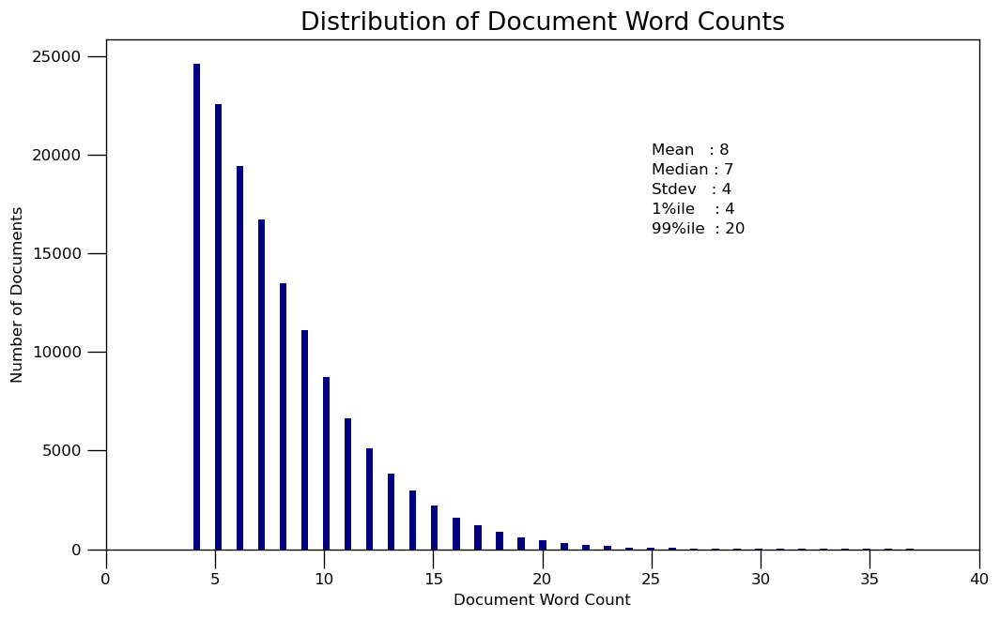

In [7]:
doc_lens = [len(d) for d in list_of_patients]

# Plot
plt.figure(figsize=(10,6), dpi=120)
plt.hist(doc_lens, bins = 100, color='navy')
plt.text(25, 20000, "Mean   : " + str(round(np.mean(doc_lens))))
plt.text(25,  19000, "Median : " + str(round(np.median(doc_lens))))
plt.text(25,  18000, "Stdev   : " + str(round(np.std(doc_lens))))
plt.text(25,  17000, "1%ile    : " + str(round(np.quantile(doc_lens, q=0.01))))
plt.text(25,  16000, "99%ile  : " + str(round(np.quantile(doc_lens, q=0.99))))

plt.gca().set(xlim=(0, 40), ylabel='Number of Documents', xlabel='Document Word Count')
plt.tick_params(size=12)
plt.xticks(np.linspace(0,40,9))
plt.title('Distribution of Document Word Counts', fontdict=dict(size=16))
plt.show()

In [42]:
id2word = corpora.Dictionary(list_of_patients)

corpus = []
for text in list_of_patients:
    new = id2word.doc2bow(text)
    corpus.append(new)

In [32]:
print(corpus[202][0:30])
print(id2word[202])

[(14, 1), (18, 1), (22, 1), (61, 1), (144, 1)]
SARS_CoV2


In [29]:
lda_model = gensim.models.ldamulticore.LdaMulticore(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=5,
                                           workers=3,
                                           random_state=100,
                                           chunksize=500,
                                           passes=10,
                                           alpha="asymmetric",
                                           eta=1.0)

# Note: num_topics attempted: 20, 15, 10, 5, 6, 4

In [30]:
# Compute Coherence Score
# Baseline Coherence Score with 4 topics, alpha = symmetric, eta = None: 0.3880742386
baseline = 0.3880742386

coherence_model_lda = CoherenceModel(model=lda_model, texts=list_of_patients, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

print("{n:0.2f}% Improvement".format(n=(coherence_lda*100/baseline)-100))


Coherence Score:  0.43457887929622707
11.98% Improvement


In [16]:
def lda_hyperparameter_tuning(corpus, dictionary, k, a, b):
    
    lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                           id2word=dictionary,
                                           num_topics=k,
                                           workers=3,
                                           random_state=100,
                                           chunksize=500,
                                           passes=10,
                                           alpha=a,
                                           eta=b)
    
    coherence_model_lda = CoherenceModel(model=lda_model, texts=list_of_patients, dictionary=id2word, coherence='c_v')
    
    return coherence_model_lda.get_coherence()

In [18]:
grid = {}
grid['Validation_Set'] = {}

# Topics range
min_topics = 4
max_topics = 15
step_size = 1
topics_range = range(min_topics, max_topics, step_size)

# Alpha parameter
alpha = list(np.linspace(0, 1, 5))
alpha.pop(0)
alpha.append('symmetric')
alpha.append('asymmetric')

# Beta parameter
beta = list(np.linspace(0, 1, 5))
beta.pop(0)
beta.append('symmetric')

# Validation sets
num_of_docs = len(corpus)
corpus_sets = [# gensim.utils.ClippedCorpus(corpus, num_of_docs*0.25), 
               # gensim.utils.ClippedCorpus(corpus, num_of_docs*0.5), 
               #gensim.utils.ClippedCorpus(corpus, int(num_of_docs*0.75)), 
               corpus]

corpus_title = ['100% Corpus']
model_results = {'Validation_Set': [],
                 'Topics': [],
                 'Alpha': [],
                 'Beta': [],
                 'Coherence': []
                }

# iterate through validation corpuses: 1
for i in range(len(corpus_sets)):
    # iterate through number of topics: 11
    for k in tqdm(topics_range):
        # iterate through alpha values: 6
        for a in alpha:
            # iterare through beta values: 5
            for b in beta:
                # get the coherence score for the given parameters
                cv = lda_hyperparameter_tuning(corpus=corpus_sets[i], dictionary=id2word, 
                                              k=k, a=a, b=b)
                # Save the model results
                model_results['Validation_Set'].append(corpus_title[i])
                model_results['Topics'].append(k)
                model_results['Alpha'].append(a)
                model_results['Beta'].append(b)
                model_results['Coherence'].append(cv)

pd.DataFrame(model_results).to_csv('lda_tuning_results.csv', index=False)

In [33]:
model_tuning = pd.read_csv('../data/lda_tuning_results.csv')

sorted_model_tuning = model_tuning.sort_values(axis=0, by=['Coherence'], ascending=False, inplace=False)

len(sorted_model_tuning)
sorted_model_tuning.head(20)

,Validation_Set,Topics,Alpha,Beta,Coherence
58,75% Corpus,5,asymmetric,1.0,0.449498
26,75% Corpus,4,asymmetric,0.5,0.448889
28,75% Corpus,4,asymmetric,1.0,0.447993
29,75% Corpus,4,asymmetric,symmetric,0.446923
27,75% Corpus,4,asymmetric,0.75,0.443063
25,75% Corpus,4,asymmetric,0.25,0.442410
57,75% Corpus,5,asymmetric,0.75,0.441327
56,75% Corpus,5,asymmetric,0.5,0.439692
59,75% Corpus,5,asymmetric,symmetric,0.436586
55,75% Corpus,5,asymmetric,0.25,0.433548


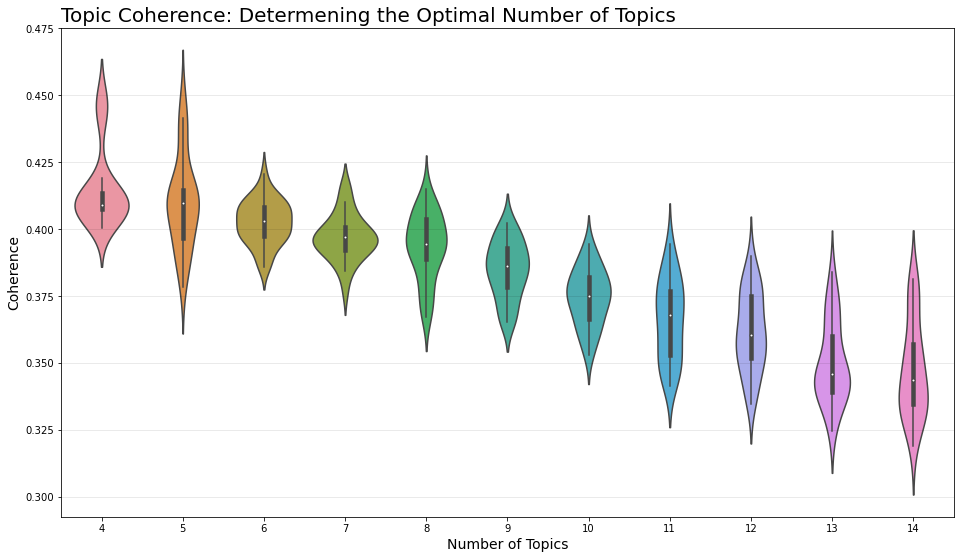

In [34]:

fig, ax = plt.subplots(figsize=(16,9))
sns.violinplot(ax=ax, data=model_tuning, x='Topics', y='Coherence')
ax.set_xlabel('Number of Topics', fontsize=14)
ax.set_ylabel('Coherence', fontsize=14)
ax.set_title('Topic Coherence: Determening the Optimal Number of Topics', loc='left', fontsize=20)
ax.yaxis.grid(color='black', which='both', alpha=0.1)

fig.savefig("../images/Violin Plot of Topic Coherence Scores.png", dpi=60)

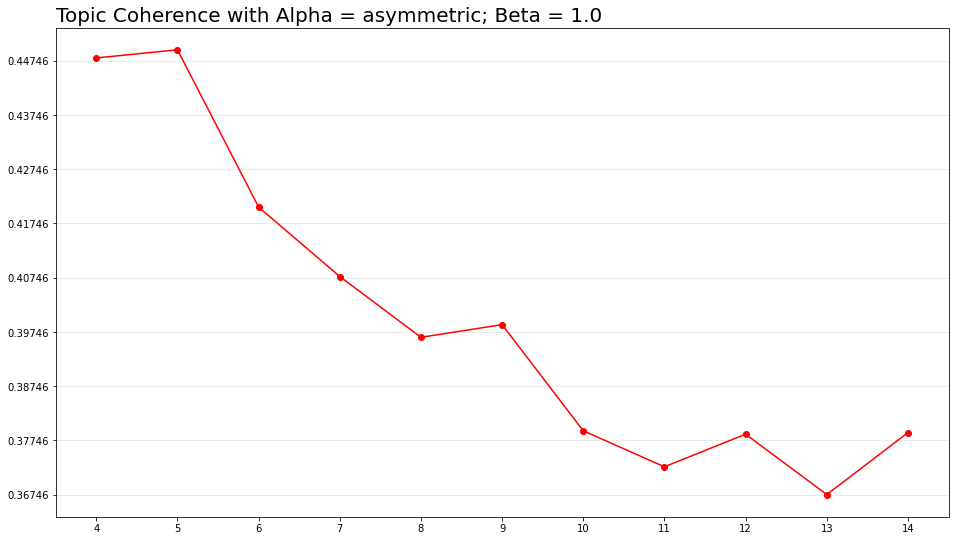

In [78]:
alpha = 'asymmetric'
beta = '1.0'
corpus = '75% Corpus'

filtered_model_tuning = model_tuning[(model_tuning['Alpha'] == alpha) 
                    & (model_tuning['Beta'] == beta)
                    & (model_tuning['Validation_Set'] == corpus)]

x = filtered_model_tuning['Topics']
y = filtered_model_tuning['Coherence']

fig, ax = plt.subplots(figsize=(16,9))

ax.plot(x, y, color='red', marker='o')
ax.set_title('Topic Coherence with Alpha = {a}; Beta = {b}'.format(a=alpha, b=beta), loc='left', fontsize=20)
ax.set_yticks(np.arange(min(y), max(y), 0.01))
plt.xticks(np.arange(min(x), max(x)+1, 1.0))
ax.yaxis.grid(color='black', which='both', alpha=0.1)


In [39]:
top_hyperp = model_tuning[(model_tuning['Topics']==5) & (model_tuning['Validation_Set']=='75% Corpus')]
top_hyperp.sort_values(axis=0, by=['Coherence'], ascending=False, inplace=True)
top_hyperp.head()

G:\anacondapy3\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


,Validation_Set,Topics,Alpha,Beta,Coherence
58,75% Corpus,5,asymmetric,1.0,0.449498
57,75% Corpus,5,asymmetric,0.75,0.441327
56,75% Corpus,5,asymmetric,0.5,0.439692
59,75% Corpus,5,asymmetric,symmetric,0.436586
55,75% Corpus,5,asymmetric,0.25,0.433548


In [40]:
pp.pprint(lda_model.print_topics())

[   (   0,
        '0.085*"dermatitis" + 0.073*"sinusitis" + 0.068*"allergic_rhinitis" + '
        '0.067*"enthesopathy" + 0.046*"asthma" + 0.046*"OA" + '
        '0.042*"hypertension" + 0.031*"depression" + 0.029*"hearing_loss" + '
        '0.027*"thyroid"'),
    (   1,
        '0.093*"hypertension" + 0.062*"CHD" + 0.054*"erectile_dysfunction" + '
        '0.053*"enthesopathy" + 0.051*"OA" + 0.038*"hearing_loss" + '
        '0.037*"BPH" + 0.037*"gout" + 0.034*"CKD" + '
        '0.033*"atrial_fibrilation"'),
    (   2,
        '0.160*"GORD" + 0.096*"oesoph_ulc" + 0.066*"female_genital_prolapse" + '
        '0.065*"irritable_bowel_syndrome" + 0.055*"gastritis_duodenitis" + '
        '0.048*"OA" + 0.046*"enthesopathy" + 0.042*"urine_incont" + '
        '0.032*"hypertension" + 0.031*"diverticular"'),
    (   3,
        '0.221*"anxiety_phobia" + 0.163*"depression" + 0.134*"PTSD" + '
        '0.067*"somatoform" + 0.047*"irritable_bowel_syndrome" + '
        '0.042*"migraine" + 0.038*"menorr

In [8]:
counter_obj = Counter()
for patient in list_of_patients:

    counter_obj += Counter(patient)
    
counter_obj.most_common(10)

[('enthesopathy', 56821),
 ('hypertension', 56254),
 ('dermatitis', 48821),
 ('depression', 47258),
 ('OA', 43201),
 ('sinusitis', 35633),
 ('allergic_rhinitis', 33200),
 ('anxiety_phobia', 28987),
 ('hearing_loss', 25926),
 ('GORD', 24745)]

In [43]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word, mds="mmds", R=30)
vis

G:\anacondapy3\lib\site-packages\pyLDAvis\_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.048552  0.082174       1        1  42.647841
1     -0.004162 -0.238336       2        1  23.151047
2     -0.286592 -0.072801       3        1  14.476808
3     -0.129533  0.378829       4        1  12.129042
4      0.371735 -0.149866       5        1   7.595262, topic_info=                     Term          Freq         Total Category  logprob  \
66         anxiety_phobia  29589.000000  29589.000000  Default  30.0000   
72                   GORD  25640.000000  25640.000000  Default  29.0000   
9         type_2_diabetes  18826.000000  18826.000000  Default  28.0000   
62                   PTSD  17902.000000  17902.000000  Default  27.0000   
27             depression  47292.000000  47292.000000  Default  26.0000   
..                    ...           ...           ...      ...      ...   
27             depression   1204.556012  47292.644952   Topic5  -4.2434   
104             blindness    275.439511   1717.871461   Topic5  -5.7189   
41                   COPD    356.914166   6588.658549   Topic5  -5.4598   
91               glaucoma    302.229591   5321.235029   Topic5  -5.6261   
36   gastritis_duodenitis    332.881740  17837.368171   Topic5  -5.5295   

     loglift  
66   30.0000  
72   29.0000  
9    28.0000  
62   27.0000  
27   26.0000  
..       ...  
27   -1.0926  
104   0.7472  
41   -0.3380  
91   -0.2906  
36   -1.4036  

[262 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
198       1  0.011386      ADHD
198       2  0.034158      ADHD
198       3  0.022772      ADHD
198       4  0.694546      ADHD
198       5  0.239106      ADHD
...     ...       ...       ...
135       1  0.986831  vitiligo
135       2  0.002730  vitiligo
135       3  0.002730  vitiligo
135       4  0.002730  vitiligo
135       5  0.005460  vitiligo

[850 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5])

In [44]:
x=lda_model.show_topics(num_topics=5, num_words=40, formatted=False)
topics_words = [(tp[0], [wd[0] for wd in tp[1]]) for tp in x]

#Below Code Prints Topics and Words
for topic,words in topics_words:
    pp.pprint(str(topic)+ "::"+ str(words)+ ":: length: {n}".format(n=len(words)))
print()

# #Below Code Prints Only Words 
# for topic,words in topics_words:
#     pp.pprint(" ".join(words))

("0::['dermatitis', 'sinusitis', 'allergic_rhinitis', 'enthesopathy', "
 "'asthma', 'OA', 'hypertension', 'depression', 'hearing_loss', 'thyroid', "
 "'seb_derm', 'oth_anaemia', 'venous_lymphatic', 'skin_ulcer', 'migraine', "
 "'menorrhagia', 'iron_deficiency_anaemia', 'urticaria', 'obesity', 'rosacea', "
 "'osteoporosis', 'spondylosis', 'constipation_read', 'urine_incont', "
 "'tinnitus', 'cin_cervical', 'gastritis_duodenitis', 'psoriasis', "
 "'pri_breast', 'intervert_disc', 'pri_skin', 'diverticular', 'nasal_polyp', "
 "'vitb12_deficiency', 'RhA', 'cholelithiasis', 'CKD', 'periph_neuro', "
 "'alcohol_depend', 'venous_thromb']:: length: 40")
("1::['hypertension', 'CHD', 'erectile_dysfunction', 'enthesopathy', 'OA', "
 "'hearing_loss', 'BPH', 'gout', 'CKD', 'atrial_fibrilation', "
 "'cerebrovascular_dz', 'dermatitis', 'alcohol_depend', 'depression', "
 "'pri_skin', 'obesity', 'spondylosis', 'diverticular', 'heart_valve_dz', "
 "'pri_prostate', 'COPD', 'gastritis_duodenitis', 'constipa

In [51]:
def find_dominant_topics(ldamodel=None, corpus=corpus, texts=list_of_patients):
    
    dom_topics = pd.DataFrame()

    # Get main topic for each patient
    for i, row_list in enumerate(ldamodel[corpus]):
        
        if ldamodel.per_word_topics:
            row = row_list[0]
        else:
            row = row_list
        #print(row)
        
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        
        # Get the Dominant topic, Perc Contribution and Keywords for each patient
        for j, (topic_num, prop_topic) in enumerate(row):
            
            # If dominant topic
            if j == 0:
                
                wp = ldamodel.show_topic(topic_num)
                
                topic_keywords = ", ".join([word for word, prop in wp])
                
                dom_topics = dom_topics.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
                
    dom_topics.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original patient record to the end of the output
    contents = pd.Series(texts)
    dom_topics = pd.concat([dom_topics, contents], axis=1)
    
    return dom_topics


temp = find_dominant_topics(ldamodel=lda_model, corpus=corpus, texts=list_of_patients)

# Format
dominant_patient_topics = temp.reset_index()
dominant_patient_topics.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']


In [52]:
dominant_patient_topics.head(20)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,0.0,0.5102,"dermatitis, sinusitis, allergic_rhinitis, enth...","[dermatitis, erectile_dysfunction, OA, pri_ski..."
1,1,4.0,0.4920,"type_2_diabetes, unspecified_rare_diabetes, di...","[female_genital_prolapse, fracture_hip, obesit..."
2,2,1.0,0.7366,"hypertension, CHD, erectile_dysfunction, enthe...","[pri_skin, allergic_rhinitis, atrial_fibrilati..."
3,3,0.0,0.9243,"dermatitis, sinusitis, allergic_rhinitis, enth...","[OA, enthesopathy, hypertension, thyroid, cons..."
4,4,1.0,0.8360,"hypertension, CHD, erectile_dysfunction, enthe...","[OA, pri_skin, enthesopathy, CCD]"
5,5,0.0,0.8643,"dermatitis, sinusitis, allergic_rhinitis, enth...","[allergic_rhinitis, enthesopathy, hypertension..."
6,6,4.0,0.6884,"type_2_diabetes, unspecified_rare_diabetes, di...","[erectile_dysfunction, type_2_diabetes, allerg..."
7,7,4.0,0.5263,"type_2_diabetes, unspecified_rare_diabetes, di...","[erectile_dysfunction, pri_skin, type_2_diabet..."
8,8,0.0,0.6925,"dermatitis, sinusitis, allergic_rhinitis, enth...","[dermatitis, type_2_diabetes, enthesopathy, hy..."
9,9,0.0,0.8882,"dermatitis, sinusitis, allergic_rhinitis, enth...","[OA, allergic_rhinitis, menorrhagia, asthma, f..."


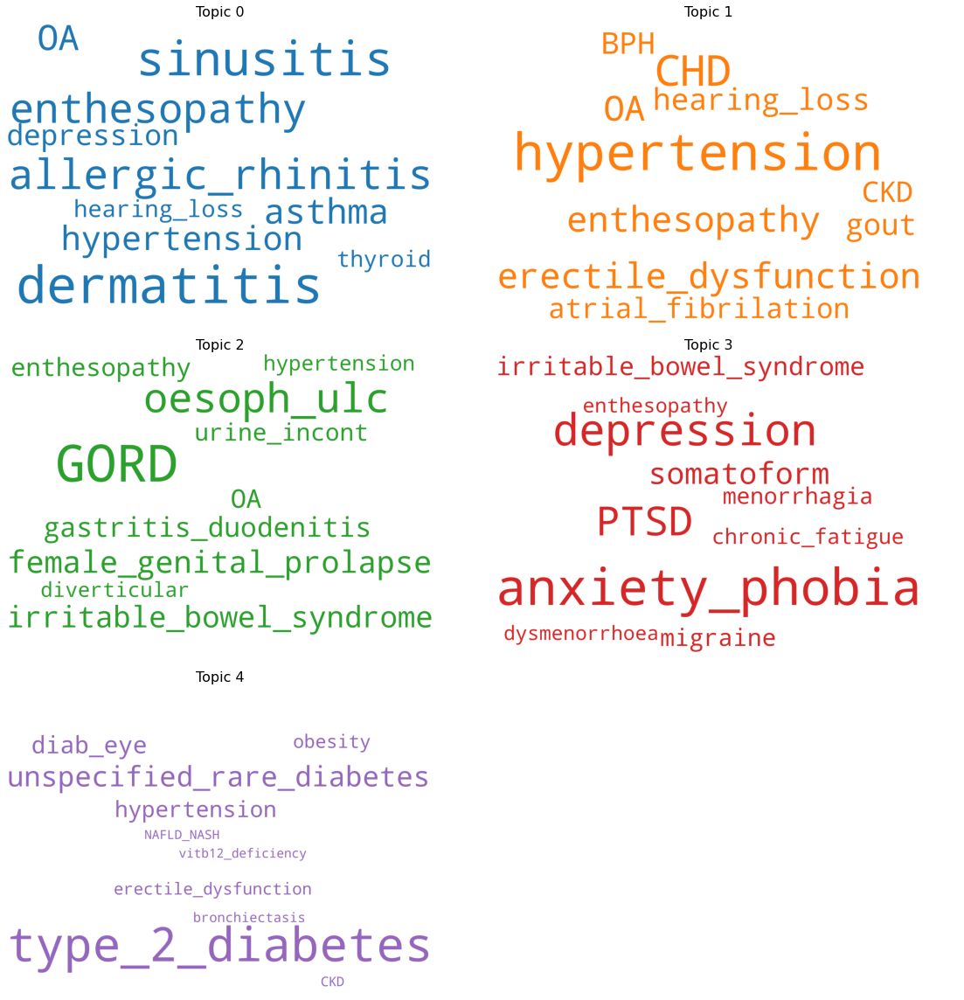

In [74]:
# Wordcloud of Top N LTCs for each topic

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

cloud = WordCloud(background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = lda_model.show_topics(formatted=False)

fig, axes = plt.subplots(3, 2, figsize=(16,16), sharex=True, sharey=True)
axes[-1, -1].axis('off')

for i, ax in enumerate(axes.flatten()):
    if i < 5:
        fig.add_subplot(ax)
        topic_words = dict(topics[i][1])
        cloud.generate_from_frequencies(topic_words, max_font_size=300)
        plt.gca().imshow(cloud)
        plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()
fig.savefig("../images/Optimized 5 Topics WordCloud.png", dpi=60)

In [46]:
test1 = lda_model[corpus]
for topic in test1:
    print(topic)

[(0, 0.5102112), (1, 0.4168228), (2, 0.029372351), (3, 0.023692237), (4, 0.019901391)]
[(0, 0.044156928), (1, 0.029191231), (2, 0.41687462), (3, 0.017776929), (4, 0.49200025)]
[(0, 0.23592725), (1, 0.736617), (2, 0.011099035)]
[(0, 0.92426854), (1, 0.02679978), (2, 0.019787798), (3, 0.015876459), (4, 0.013267451)]
[(0, 0.07615449), (1, 0.8361464), (2, 0.03538353), (3, 0.02844562), (4, 0.02386992)]
[(0, 0.8643372), (1, 0.047898374), (2, 0.035423), (3, 0.028451424), (4, 0.023890024)]
[(0, 0.23209617), (1, 0.034037903), (2, 0.025177734), (3, 0.02030885), (4, 0.68837935)]
[(0, 0.043248296), (1, 0.39073202), (2, 0.02197946), (3, 0.017767474), (4, 0.5262727)]
[(0, 0.69252187), (1, 0.024710516), (2, 0.01790063), (3, 0.0142369345), (4, 0.2506301)]
[(0, 0.888211), (1, 0.038729932), (2, 0.029371409), (3, 0.023796394), (4, 0.019891255)]
[(0, 0.5964468), (1, 0.02459918), (2, 0.2129638), (3, 0.15405308), (4, 0.011937127)]
[(0, 0.55215555), (1, 0.41108122), (2, 0.014904521), (3, 0.011904816)]
[(0, 0

[(0, 0.30091664), (1, 0.34609625), (2, 0.016141385), (3, 0.32598802), (4, 0.010857671)]
[(0, 0.8641838), (1, 0.048157994), (2, 0.03532851), (3, 0.028443996), (4, 0.023885723)]
[(0, 0.8886895), (1, 0.038445454), (2, 0.0292825), (3, 0.023691481), (4, 0.019891039)]
[(0, 0.3564615), (1, 0.58886355), (2, 0.021982607), (3, 0.017767537), (4, 0.014924777)]
[(0, 0.28255305), (1, 0.52378666), (2, 0.16092119), (3, 0.017777015), (4, 0.01496211)]
[(0, 0.3501586), (1, 0.28057757), (2, 0.1786279), (3, 0.18069014)]
[(0, 0.31923044), (1, 0.3167593), (2, 0.20138897), (3, 0.14770219), (4, 0.014919086)]
[(0, 0.32729784), (1, 0.2276739), (2, 0.41234002), (3, 0.017769743), (4, 0.014918502)]
[(0, 0.6560198), (1, 0.029165145), (2, 0.022038547), (3, 0.27785757), (4, 0.014918955)]
[(0, 0.43251434), (1, 0.5186076), (2, 0.019746017), (3, 0.015863094), (4, 0.013268929)]
[(0, 0.21225959), (1, 0.025767926), (2, 0.40756392), (3, 0.34114736), (4, 0.013261159)]
[(0, 0.07121701), (1, 0.046150465), (2, 0.4801293), (3, 0.

[(0, 0.92312616), (1, 0.028032351), (2, 0.019763514), (3, 0.015800735), (4, 0.013277243)]
[(0, 0.04507165), (1, 0.42419183), (2, 0.4980266), (3, 0.017786505), (4, 0.01492343)]
[(0, 0.73148704), (1, 0.02589795), (2, 0.2134678), (3, 0.015877651), (4, 0.01326956)]
[(0, 0.78777236), (1, 0.17224993), (2, 0.016149055), (3, 0.012977946), (4, 0.010850662)]
[(0, 0.41320053), (1, 0.03361873), (2, 0.5158019), (3, 0.02032926), (4, 0.017049568)]
[(0, 0.52828145), (1, 0.021500759), (2, 0.14807788), (3, 0.012923832), (4, 0.2892161)]
[(0, 0.62923723), (1, 0.0500665), (2, 0.26837462), (3, 0.028442862), (4, 0.02387886)]
[(0, 0.38082287), (1, 0.3586259), (2, 0.029423377), (3, 0.21122706), (4, 0.01990078)]
[(0, 0.4457569), (1, 0.030230172), (2, 0.022160314), (3, 0.017779492), (4, 0.4840731)]
[(0, 0.60218126), (1, 0.31024185), (2, 0.035279267), (3, 0.028428093), (4, 0.0238695)]
[(0, 0.70713043), (1, 0.22996208), (2, 0.025517233), (3, 0.020325547), (4, 0.017064657)]
[(0, 0.4702367), (1, 0.4419504), (2, 0.03

[(0, 0.8883266), (1, 0.038740516), (2, 0.029341212), (3, 0.023700507), (4, 0.019891184)]
[(0, 0.36392745), (1, 0.59597516), (2, 0.016314002), (3, 0.012927261), (4, 0.010856083)]
[(0, 0.08267841), (1, 0.3156041), (2, 0.549267), (3, 0.028580422), (4, 0.023870055)]
[(0, 0.62575334), (1, 0.013899673), (2, 0.34494045)]
[(0, 0.14370517), (1, 0.16582167), (2, 0.017602773), (3, 0.014215342), (4, 0.65865505)]
[(0, 0.8658287), (1, 0.04663055), (2, 0.035227437), (3, 0.028443832), (4, 0.02386947)]
[(0, 0.5305468), (1, 0.18320082), (2, 0.16305815), (3, 0.114666924)]
[(0, 0.073409535), (1, 0.040748693), (2, 0.5048055), (3, 0.36114448), (4, 0.01989175)]
[(0, 0.06398248), (1, 0.4138052), (2, 0.47856092), (3, 0.023759002), (4, 0.019892395)]
[(0, 0.88616556), (1, 0.040772483), (2, 0.029473724), (3, 0.023691855), (4, 0.019896371)]
[(0, 0.8659366), (1, 0.04633463), (2, 0.035254948), (3, 0.02860096), (4, 0.023872882)]
[(0, 0.35619408), (1, 0.021120165), (2, 0.59890443), (3, 0.012929704), (4, 0.010851619)]


[(0, 0.2558334), (1, 0.7076981), (2, 0.014672262), (3, 0.011847637)]
[(0, 0.94281405), (1, 0.02054855), (2, 0.014800919), (3, 0.011884364)]
[(0, 0.4538284), (1, 0.04611668), (2, 0.035540313), (3, 0.44063684), (4, 0.023877755)]
[(0, 0.33459535), (1, 0.026103491), (2, 0.019633114), (3, 0.30760607), (4, 0.31206194)]
[(0, 0.33195528), (1, 0.039927807), (2, 0.5845025), (3, 0.023691768), (4, 0.019922622)]
[(0, 0.6160709), (1, 0.04669325), (2, 0.2847913), (3, 0.028545607), (4, 0.023899002)]
[(0, 0.061650723), (1, 0.86502534), (2, 0.029726554), (3, 0.023701712), (4, 0.019895688)]
[(0, 0.56428516), (1, 0.04057643), (2, 0.029508015), (3, 0.3457203), (4, 0.019910134)]
[(0, 0.5271765), (1, 0.023834022), (2, 0.017795987), (3, 0.014220302), (4, 0.4169732)]
[(0, 0.9154438), (1, 0.0296553), (2, 0.02212391), (3, 0.017851694), (4, 0.014925302)]
[(0, 0.6400887), (1, 0.020228824), (2, 0.3178559), (3, 0.011877397)]
[(0, 0.48660374), (1, 0.02146729), (2, 0.46813276), (3, 0.012945504), (4, 0.010850699)]
[(0,

[(0, 0.056504425), (1, 0.6776956), (2, 0.025391795), (3, 0.020337397), (4, 0.22007081)]
[(0, 0.060627602), (1, 0.8663535), (2, 0.029416347), (3, 0.023701958), (4, 0.019900592)]
[(0, 0.86455), (1, 0.047558554), (2, 0.03546701), (3, 0.02855515), (4, 0.023869326)]
[(0, 0.72313017), (1, 0.02642975), (2, 0.019808669), (3, 0.21736191), (4, 0.0132695325)]
[(0, 0.40016583), (1, 0.01697174), (2, 0.21839774), (3, 0.35593832)]
[(0, 0.078485586), (1, 0.5897549), (2, 0.035311453), (3, 0.028456545), (4, 0.26799154)]
[(0, 0.06445964), (1, 0.86263293), (2, 0.029312758), (3, 0.023694538), (4, 0.01990018)]
[(0, 0.54077613), (1, 0.41938967), (2, 0.016048193), (3, 0.012927063), (4, 0.0108589735)]
[(0, 0.05987723), (1, 0.5336439), (2, 0.029330183), (3, 0.023691008), (4, 0.35345772)]
[(0, 0.72182864), (1, 0.01702239), (2, 0.012826049), (3, 0.23979789)]
[(0, 0.27955136), (1, 0.51732165), (2, 0.17934147), (3, 0.0129303), (4, 0.010855255)]
[(0, 0.15521114), (1, 0.656524), (2, 0.15920532), (3, 0.015793739), (4,

[(0, 0.532367), (1, 0.43105534), (2, 0.014767858), (3, 0.011861947)]
[(0, 0.08183976), (1, 0.36004934), (2, 0.03548734), (3, 0.4987317), (4, 0.023891827)]
[(0, 0.5288546), (1, 0.033588488), (2, 0.025538545), (3, 0.3949689), (4, 0.017049482)]
[(0, 0.9152825), (1, 0.029874342), (2, 0.022136115), (3, 0.0177886), (4, 0.014918432)]
[(0, 0.27892688), (1, 0.017875893), (2, 0.22356749), (3, 0.010949522), (4, 0.4686802)]
[(0, 0.056460727), (1, 0.6825012), (2, 0.029316299), (3, 0.21182059), (4, 0.019901155)]
[(0, 0.91545963), (1, 0.029578617), (2, 0.0221637), (3, 0.017868957), (4, 0.014929057)]
[(0, 0.07204613), (1, 0.40504897), (2, 0.021963267), (3, 0.017767929), (4, 0.4831737)]
[(0, 0.86515504), (1, 0.04700559), (2, 0.03534674), (3, 0.0286195), (4, 0.02387319)]
[(0, 0.3921521), (1, 0.01429201), (2, 0.2835725), (3, 0.30296296)]
[(0, 0.07693498), (1, 0.6515504), (2, 0.02932383), (3, 0.22228983), (4, 0.019900938)]
[(0, 0.74606925), (1, 0.021067774), (2, 0.016025148), (3, 0.012924719), (4, 0.20391

[(0, 0.5939879), (1, 0.021681078), (2, 0.016152002), (3, 0.20785633), (4, 0.1603227)]
[(0, 0.93142426), (1, 0.024676962), (2, 0.017685752), (3, 0.014263934), (4, 0.011949135)]
[(0, 0.32261735), (1, 0.6223167), (2, 0.02227797), (3, 0.017866125), (4, 0.014921851)]
[(0, 0.6926205), (1, 0.23409466), (2, 0.029637702), (3, 0.023755342), (4, 0.01989184)]
[(0, 0.90104955), (1, 0.03636137), (2, 0.025210261), (3, 0.02030589), (4, 0.017072953)]
[(0, 0.86516815), (1, 0.04701874), (2, 0.035501447), (3, 0.028438069), (4, 0.023873622)]
[(0, 0.5794901), (1, 0.18080062), (2, 0.014766495), (3, 0.10319402), (4, 0.1217488)]
[(0, 0.904178), (1, 0.033250514), (2, 0.025200926), (3, 0.020306863), (4, 0.01706373)]
[(0, 0.8658177), (1, 0.046611067), (2, 0.035273675), (3, 0.028428046), (4, 0.023869494)]
[(0, 0.35213593), (1, 0.033626124), (2, 0.37824705), (3, 0.2189402), (4, 0.017050654)]
[(0, 0.4296275), (1, 0.048683163), (2, 0.035657916), (3, 0.46215928), (4, 0.02387214)]
[(0, 0.5682026), (1, 0.3583822), (2, 0

[(0, 0.90204895), (1, 0.03519755), (2, 0.025358466), (3, 0.020335123), (4, 0.017059937)]
[(0, 0.7222054), (1, 0.021956054), (2, 0.23197733), (3, 0.013003393), (4, 0.010857813)]
[(0, 0.71712554), (1, 0.2340057), (2, 0.01981011), (3, 0.015793389), (4, 0.013265214)]
[(0, 0.047596883), (1, 0.8974544), (2, 0.022236135), (3, 0.017791122), (4, 0.014921449)]
[(0, 0.20868903), (1, 0.40727443), (2, 0.35788694), (3, 0.014214143), (4, 0.011935427)]
[(0, 0.31768745), (1, 0.6384514), (2, 0.017705712), (3, 0.014218669), (4, 0.011936739)]
[(0, 0.034188434), (1, 0.4710699), (2, 0.017589925), (3, 0.014220415), (4, 0.46293133)]
[(0, 0.07030788), (1, 0.8420546), (2, 0.035290208), (3, 0.028438052), (4, 0.023909241)]
[(0, 0.07847017), (1, 0.04963137), (2, 0.81950676), (3, 0.028468331), (4, 0.023923323)]
[(0, 0.88814586), (1, 0.038909834), (2, 0.02934416), (3, 0.023700552), (4, 0.019899573)]
[(0, 0.93894905), (1, 0.021153687), (2, 0.016097063), (3, 0.012944972), (4, 0.0108552445)]
[(0, 0.4330941), (1, 0.0296

[(0, 0.7203573), (1, 0.023551488), (2, 0.017931774), (3, 0.22622465), (4, 0.011934806)]
[(0, 0.03961812), (1, 0.9117898), (2, 0.019534448), (3, 0.015794681), (4, 0.013262919)]
[(0, 0.44441697), (1, 0.04600067), (2, 0.2357232), (3, 0.2499891), (4, 0.023869995)]
[(0, 0.5395386), (1, 0.023129964), (2, 0.41117093), (3, 0.014225799), (4, 0.011934703)]
[(0, 0.6309341), (1, 0.021852875), (2, 0.016226009), (3, 0.32012787), (4, 0.010859156)]
[(0, 0.04988363), (1, 0.30356437), (2, 0.60918975), (3, 0.020305641), (4, 0.017056642)]
[(0, 0.8638792), (1, 0.048039574), (2, 0.035516456), (3, 0.028685693), (4, 0.023879044)]
[(0, 0.6442589), (1, 0.014776848), (2, 0.3245882)]
[(0, 0.91320497), (1, 0.03165499), (2, 0.02234197), (3, 0.017860861), (4, 0.014937164)]
[(0, 0.86420304), (1, 0.04792654), (2, 0.03550139), (3, 0.028483463), (4, 0.023885516)]
[(0, 0.9027223), (1, 0.034430426), (2, 0.025363738), (3, 0.020424558), (4, 0.017059017)]
[(0, 0.9029804), (1, 0.0341606), (2, 0.025473563), (3, 0.020335887), (

[(0, 0.9245748), (1, 0.026774947), (2, 0.019573262), (3, 0.015797973), (4, 0.01327905)]
[(0, 0.90090275), (1, 0.036507793), (2, 0.025209775), (3, 0.020306796), (4, 0.017072894)]
[(0, 0.30867374), (1, 0.5162929), (2, 0.019649867), (3, 0.01580046), (4, 0.13958295)]
[(0, 0.41423723), (1, 0.39779347), (2, 0.02202321), (3, 0.15102741), (4, 0.014918669)]
[(0, 0.05049402), (1, 0.03342644), (2, 0.8786353), (3, 0.020390872), (4, 0.017053358)]
[(0, 0.4565757), (1, 0.025039818), (2, 0.18616754), (3, 0.014292966), (4, 0.317924)]
[(0, 0.060061183), (1, 0.66073877), (2, 0.23552193), (3, 0.023781147), (4, 0.01989698)]
[(0, 0.081703275), (1, 0.8299597), (2, 0.035984296), (3, 0.028480422), (4, 0.023872368)]
[(0, 0.50440085), (1, 0.2641242), (3, 0.13853796), (4, 0.08366988)]
[(0, 0.24141803), (1, 0.11649146), (2, 0.4012057), (3, 0.18312407), (4, 0.057760753)]
[(0, 0.31376755), (1, 0.64243853), (2, 0.017633714), (3, 0.014219138), (4, 0.011941027)]
[(0, 0.03108535), (1, 0.020509742), (2, 0.5878641), (3, 0

[(0, 0.903117), (1, 0.034071553), (2, 0.025355905), (3, 0.020393208), (4, 0.017062334)]
[(0, 0.081681296), (1, 0.048776567), (2, 0.48614135), (3, 0.028510429), (4, 0.3548904)]
[(0, 0.7001684), (1, 0.034481052), (2, 0.025345463), (3, 0.22294538), (4, 0.017059783)]
[(0, 0.784882), (1, 0.016173335), (2, 0.011767551), (3, 0.17921084)]
[(0, 0.4506761), (1, 0.025973517), (2, 0.24322888), (3, 0.26685888), (4, 0.0132626295)]
[(0, 0.082412116), (1, 0.84450483), (2, 0.02947602), (3, 0.02370608), (4, 0.019900959)]
[(0, 0.35921645), (1, 0.0175683), (2, 0.44543946), (3, 0.16924337)]
[(0, 0.6662762), (1, 0.04599793), (2, 0.035140086), (3, 0.028524475), (4, 0.22406131)]
[(0, 0.46243313), (1, 0.04923072), (2, 0.035415106), (3, 0.028455026), (4, 0.42446598)]
[(0, 0.88637793), (1, 0.04035479), (2, 0.029621566), (3, 0.023736909), (4, 0.019908845)]
[(0, 0.051515926), (1, 0.4946333), (2, 0.025227506), (3, 0.020324346), (4, 0.40829894)]
[(0, 0.44786733), (1, 0.033582043), (2, 0.48115438), (3, 0.020346668), 

[(0, 0.027334817), (1, 0.45477864), (2, 0.089212306), (3, 0.18923382), (4, 0.23944043)]
[(0, 0.7049052), (1, 0.033795483), (2, 0.22390932), (3, 0.020315034), (4, 0.017074991)]
[(0, 0.6552106), (1, 0.25723413), (2, 0.03525065), (3, 0.028431484), (4, 0.023873117)]
[(0, 0.07863055), (1, 0.3494738), (2, 0.025099706), (3, 0.020313365), (4, 0.5264825)]
[(0, 0.06506984), (1, 0.5066611), (2, 0.38464126), (3, 0.023728823), (4, 0.01989895)]
[(0, 0.925044), (1, 0.026238449), (2, 0.01964634), (3, 0.015810292), (4, 0.013260907)]
[(0, 0.08180293), (1, 0.047456887), (2, 0.81831586), (3, 0.028523484), (4, 0.023900893)]
[(0, 0.51342326), (1, 0.19758862), (2, 0.2562862), (3, 0.01778297), (4, 0.014918957)]
[(0, 0.02772303), (1, 0.7248506), (2, 0.011804505), (4, 0.22613652)]
[(0, 0.049948853), (1, 0.9011482), (2, 0.019837353), (3, 0.015801074), (4, 0.0132645555)]
[(0, 0.08025564), (1, 0.8467514), (2, 0.029395746), (3, 0.023695733), (4, 0.019901486)]
[(0, 0.27095562), (1, 0.029022032), (2, 0.6673186), (3, 

[(0, 0.39367673), (1, 0.020025127), (2, 0.36878887), (3, 0.011848381), (4, 0.20566091)]
[(0, 0.35954803), (1, 0.5528244), (2, 0.035254966), (3, 0.028470673), (4, 0.02390194)]
[(0, 0.6055322), (1, 0.039135754), (2, 0.029546345), (3, 0.30589348), (4, 0.019892197)]
[(0, 0.06811692), (1, 0.6443372), (2, 0.03520069), (3, 0.22846568), (4, 0.023879534)]
[(0, 0.5896513), (1, 0.029118037), (2, 0.34842983), (3, 0.01787095), (4, 0.014929873)]
[(0, 0.6287629), (1, 0.02889431), (2, 0.022213927), (3, 0.30520687), (4, 0.014922033)]
[(0, 0.72841644), (1, 0.018855987), (2, 0.013782246), (3, 0.22974792)]
[(0, 0.3220078), (1, 0.022419434), (2, 0.15872811), (3, 0.012933831), (4, 0.4839108)]
[(0, 0.7066668), (1, 0.039373856), (2, 0.030009305), (3, 0.20405614), (4, 0.019893875)]
[(0, 0.07661093), (1, 0.36309692), (2, 0.29448554), (3, 0.24192293), (4, 0.023883719)]
[(0, 0.2812508), (1, 0.31849545), (2, 0.029704884), (3, 0.35064963), (4, 0.019899208)]
[(0, 0.3512303), (1, 0.047786288), (2, 0.54866505), (3, 0.

[(0, 0.21992353), (1, 0.116491616), (2, 0.45411658), (3, 0.2015054)]
[(0, 0.45595548), (1, 0.3353837), (2, 0.019574719), (3, 0.015800143), (4, 0.17328599)]
[(0, 0.03774685), (1, 0.5860652), (2, 0.25003338), (3, 0.115294605), (4, 0.010860057)]
[(0, 0.509384), (1, 0.046132036), (2, 0.03570338), (3, 0.38490957), (4, 0.023871003)]
[(0, 0.41578165), (1, 0.030196695), (2, 0.021986593), (3, 0.017848859), (4, 0.5141862)]
[(0, 0.43372145), (1, 0.029167715), (2, 0.5043175), (3, 0.017874693), (4, 0.014918621)]
[(0, 0.07574934), (1, 0.046091218), (2, 0.03524836), (3, 0.620784), (4, 0.22212711)]
[(0, 0.031322487), (1, 0.2167578), (2, 0.11667553), (3, 0.01292265), (4, 0.62232155)]
[(0, 0.5948289), (1, 0.34239575), (2, 0.025403244), (3, 0.020308238), (4, 0.01706385)]
[(0, 0.8569963), (1, 0.016637852), (2, 0.01263451), (3, 0.105202086)]
[(0, 0.26522747), (1, 0.047300264), (2, 0.035412077), (3, 0.6281901), (4, 0.023870079)]
[(0, 0.191272), (1, 0.5474887), (2, 0.23216562), (3, 0.015805628), (4, 0.013268

[(0, 0.7934031), (1, 0.027032908), (2, 0.15045977), (3, 0.015842345), (4, 0.013261863)]
[(0, 0.90392786), (1, 0.033404063), (2, 0.025208192), (3, 0.020396251), (4, 0.017063648)]
[(0, 0.022336636), (1, 0.4656521), (2, 0.3689409), (3, 0.13643627)]
[(0, 0.0618917), (1, 0.23857097), (2, 0.029317604), (3, 0.023690056), (4, 0.6465297)]
[(0, 0.56121534), (1, 0.04037203), (2, 0.029411621), (3, 0.023691598), (4, 0.34530944)]
[(0, 0.0834054), (1, 0.6538788), (2, 0.029394208), (3, 0.023696354), (4, 0.20962521)]
[(0, 0.1216796), (1, 0.47213328), (2, 0.08296608), (3, 0.07539404), (4, 0.24782705)]
[(0, 0.45858717), (1, 0.24520645), (3, 0.07933407), (4, 0.20800409)]
[(0, 0.60206306), (1, 0.31036043), (2, 0.03527874), (3, 0.028428104), (4, 0.023869626)]
[(0, 0.07747061), (1, 0.6020386), (2, 0.035354577), (3, 0.261255), (4, 0.023881186)]
[(0, 0.031344455), (1, 0.4150642), (2, 0.014911296), (3, 0.3668303), (4, 0.17184977)]
[(0, 0.6076153), (1, 0.023058016), (2, 0.21789812), (3, 0.13948421), (4, 0.011944

[(0, 0.05186111), (1, 0.8854911), (2, 0.025284568), (3, 0.020305686), (4, 0.017057555)]
[(0, 0.4892426), (1, 0.018457271), (2, 0.37948307), (3, 0.10362891)]
[(0, 0.44558352), (1, 0.014046946), (2, 0.29777455), (3, 0.23557068)]
[(0, 0.069299616), (1, 0.84317106), (2, 0.035218332), (3, 0.028429583), (4, 0.023881393)]
[(0, 0.35573465), (1, 0.4782548), (2, 0.019924177), (3, 0.13282166), (4, 0.013264797)]
[(0, 0.07341199), (1, 0.2552804), (2, 0.029409433), (3, 0.6219907), (4, 0.019907517)]
[(0, 0.3348645), (1, 0.045998067), (2, 0.03568347), (3, 0.55958456), (4, 0.02386937)]
[(0, 0.7080731), (1, 0.023496354), (2, 0.24222955), (3, 0.014256922), (4, 0.01194413)]
[(0, 0.23217015), (1, 0.029816631), (2, 0.022059515), (3, 0.017899564), (4, 0.6980542)]
[(0, 0.7632079), (1, 0.01408644), (2, 0.0104900515), (3, 0.12406867), (4, 0.08814692)]
[(0, 0.86489266), (1, 0.047511578), (2, 0.035281297), (3, 0.028444927), (4, 0.023869494)]
[(0, 0.9023624), (1, 0.035103876), (2, 0.025162755), (3, 0.020305794), (

[(0, 0.55608404), (1, 0.35638565), (2, 0.035212062), (3, 0.0284326), (4, 0.023885638)]
[(0, 0.6069543), (1, 0.018300997), (2, 0.16465847), (3, 0.09004464), (4, 0.12004163)]
[(0, 0.06440657), (1, 0.040450662), (2, 0.8515329), (3, 0.023699613), (4, 0.019910246)]
[(0, 0.4840786), (1, 0.10316023), (2, 0.15239419), (3, 0.25373647)]
[(0, 0.7063114), (1, 0.03339104), (2, 0.025208184), (3, 0.21803634), (4, 0.01705301)]
[(0, 0.18569168), (1, 0.16901265), (2, 0.35571703), (3, 0.27465883), (4, 0.014919767)]
[(0, 0.6119605), (1, 0.019652283), (2, 0.20751269), (3, 0.15092134)]
[(0, 0.47377086), (1, 0.03875285), (2, 0.44389343), (3, 0.023690186), (4, 0.019892681)]
[(0, 0.86581707), (1, 0.046337355), (2, 0.03534748), (3, 0.02861934), (4, 0.023878781)]
[(0, 0.0615053), (1, 0.37866867), (2, 0.02938998), (3, 0.510531), (4, 0.01990507)]
[(0, 0.03534569), (1, 0.17161076), (2, 0.10804928), (3, 0.2848445), (4, 0.40014976)]
[(0, 0.8841054), (1, 0.0426989), (2, 0.02942144), (3, 0.02386559), (4, 0.0199087)]
[(

[(0, 0.52181715), (1, 0.016132431), (2, 0.011884875), (3, 0.13698354), (4, 0.31318203)]
[(0, 0.1547741), (1, 0.23077846), (2, 0.012710128), (3, 0.2599876), (4, 0.3417497)]
[(0, 0.519274), (1, 0.027556678), (2, 0.28419435), (3, 0.15570773), (4, 0.013267281)]
[(0, 0.62107724), (1, 0.034432635), (2, 0.30712423), (3, 0.020307455), (4, 0.017058391)]
[(0, 0.8877347), (1, 0.039296698), (2, 0.029376142), (3, 0.02370117), (4, 0.019891221)]
[(0, 0.5999486), (1, 0.03008677), (2, 0.022288695), (3, 0.33274773), (4, 0.014928226)]
[(0, 0.8876199), (1, 0.039264765), (2, 0.029514002), (3, 0.023707222), (4, 0.0198941)]
[(0, 0.39015532), (1, 0.5469974), (2, 0.025347728), (3, 0.020447258), (4, 0.017052265)]
[(0, 0.38003752), (1, 0.4114199), (2, 0.025459386), (3, 0.16603063), (4, 0.017052608)]
[(0, 0.04576021), (1, 0.5333932), (2, 0.17214385), (3, 0.23542422), (4, 0.0132784825)]
[(0, 0.5866589), (1, 0.048007797), (2, 0.31301448), (3, 0.028449316), (4, 0.023869568)]
[(0, 0.065732375), (1, 0.86118084), (2, 0

[(0, 0.07212761), (1, 0.6389671), (2, 0.035239592), (3, 0.22979182), (4, 0.023873873)]
[(0, 0.061029285), (1, 0.4115512), (2, 0.019550476), (3, 0.015801542), (4, 0.49206743)]
[(0, 0.073185265), (1, 0.046979886), (2, 0.32281283), (3, 0.5331521), (4, 0.02386987)]
[(0, 0.69970137), (1, 0.034144003), (2, 0.025246294), (3, 0.22384867), (4, 0.017059678)]
[(0, 0.43692017), (1, 0.20984475), (2, 0.32410303), (3, 0.01586597), (4, 0.013266119)]
[(0, 0.64364445), (1, 0.049173437), (2, 0.03562822), (3, 0.24762376), (4, 0.023930188)]
[(0, 0.5124814), (1, 0.30712456), (2, 0.016139606), (3, 0.15339477), (4, 0.01085967)]
[(0, 0.53890455), (1, 0.017656162), (2, 0.28167155), (3, 0.15323062)]
[(0, 0.06314454), (1, 0.86354584), (2, 0.029517809), (3, 0.023891622), (4, 0.019900197)]
[(0, 0.6065205), (1, 0.020478675), (2, 0.014775807), (3, 0.16733442), (4, 0.19089061)]
[(0, 0.7081041), (1, 0.038995076), (2, 0.20926668), (3, 0.023743), (4, 0.019891169)]
[(0, 0.06656996), (1, 0.44543532), (2, 0.03555466), (3, 0

[(0, 0.07775973), (1, 0.4826146), (2, 0.38727427), (3, 0.028441299), (4, 0.023910142)]
[(0, 0.64818347), (1, 0.026305787), (2, 0.019754834), (3, 0.2924946), (4, 0.013261293)]
[(0, 0.33639768), (1, 0.030399334), (2, 0.33060628), (3, 0.2876542), (4, 0.014942496)]
[(0, 0.91550124), (1, 0.029550716), (2, 0.022161573), (3, 0.017857485), (4, 0.0149290105)]
[(0, 0.5257612), (1, 0.016685728), (2, 0.1028538), (3, 0.34617275)]
[(0, 0.3706561), (1, 0.47787777), (2, 0.013727716), (3, 0.12855175)]
[(0, 0.3374036), (1, 0.62277424), (2, 0.01603151), (3, 0.0129326815), (4, 0.010858017)]
[(0, 0.06925583), (1, 0.84301317), (2, 0.035385758), (3, 0.028475894), (4, 0.023869354)]
[(0, 0.40457544), (1, 0.54677963), (2, 0.019582275), (3, 0.015798924), (4, 0.013263711)]
[(0, 0.057908222), (1, 0.4366556), (2, 0.46163982), (3, 0.023892196), (4, 0.019904146)]
[(0, 0.8655662), (1, 0.04661343), (2, 0.035344522), (3, 0.028602937), (4, 0.023872945)]
[(0, 0.33382285), (1, 0.017006367), (2, 0.29406196), (3, 0.3465822)]

[(0, 0.047176838), (1, 0.02952662), (2, 0.8905049), (3, 0.017860971), (4, 0.014930719)]
[(0, 0.8603396), (1, 0.05194488), (2, 0.035368994), (3, 0.028437978), (4, 0.023908561)]
[(0, 0.45050701), (1, 0.048056673), (2, 0.035628237), (3, 0.44193873), (4, 0.0238693)]
[(0, 0.4390038), (1, 0.024150446), (2, 0.017840387), (3, 0.5070606), (4, 0.011944739)]
[(0, 0.6494856), (1, 0.016795803), (2, 0.31500834), (3, 0.010184497)]
[(0, 0.4540915), (1, 0.047282293), (2, 0.2353134), (3, 0.23944317), (4, 0.023869637)]
[(0, 0.4686307), (1, 0.01980336), (2, 0.34108782), (3, 0.16053216)]
[(0, 0.8647148), (1, 0.04738245), (2, 0.03550887), (3, 0.028524252), (4, 0.023869595)]
[(0, 0.49674746), (1, 0.1277174), (2, 0.35173845), (3, 0.012939024), (4, 0.010857599)]
[(0, 0.589905), (1, 0.34759238), (2, 0.025133813), (3, 0.020313602), (4, 0.01705516)]
[(0, 0.39353943), (1, 0.5188008), (2, 0.035338897), (3, 0.028428104), (4, 0.023892803)]
[(0, 0.6494113), (1, 0.026842427), (2, 0.019661227), (3, 0.29082063), (4, 0.01

[(0, 0.60675955), (1, 0.026104033), (2, 0.1484181), (3, 0.20545681), (4, 0.013261497)]
[(0, 0.90451664), (1, 0.0329362), (2, 0.025184397), (3, 0.020311303), (4, 0.01705146)]
[(0, 0.3445614), (1, 0.022158418), (2, 0.016041337), (3, 0.17276539), (4, 0.44447345)]
[(0, 0.07539978), (1, 0.83697677), (2, 0.035307486), (3, 0.028443335), (4, 0.023872646)]
[(0, 0.6141418), (1, 0.047253393), (2, 0.035357647), (3, 0.27937752), (4, 0.023869645)]
[(0, 0.21298279), (1, 0.27615154), (2, 0.025133776), (3, 0.020338228), (4, 0.4653937)]
[(0, 0.052457), (1, 0.28559384), (2, 0.62917465), (3, 0.017852485), (4, 0.014922037)]
[(0, 0.8879544), (1, 0.039054085), (2, 0.029392911), (3, 0.023704536), (4, 0.01989403)]
[(0, 0.57518834), (1, 0.1617763), (2, 0.011056695), (3, 0.24451849)]
[(0, 0.27608848), (1, 0.28513044), (2, 0.20660217), (3, 0.22515555)]
[(0, 0.39577943), (1, 0.018202236), (2, 0.5658663), (3, 0.0109637575)]
[(0, 0.86582494), (1, 0.046633195), (2, 0.035228003), (3, 0.02844412), (4, 0.023869757)]
[(0

[(0, 0.4719886), (1, 0.30680245), (2, 0.1885117), (3, 0.01777393), (4, 0.014923354)]
[(0, 0.22318132), (1, 0.46116775), (2, 0.011042183), (4, 0.29572144)]
[(0, 0.517891), (1, 0.021392046), (2, 0.23637082), (3, 0.106659636), (4, 0.1176865)]
[(0, 0.7250696), (1, 0.201741), (2, 0.029462894), (3, 0.023819264), (4, 0.019907285)]
[(0, 0.69686544), (1, 0.021917634), (2, 0.1557476), (3, 0.114619195), (4, 0.010850188)]
[(0, 0.2229505), (1, 0.46608493), (2, 0.017873788), (3, 0.28115216), (4, 0.0119385645)]
[(0, 0.29847857), (1, 0.6465497), (2, 0.022177238), (3, 0.017870257), (4, 0.014924254)]
[(0, 0.60035837), (1, 0.034568436), (2, 0.02530209), (3, 0.1783797), (4, 0.16139138)]
[(0, 0.3730604), (1, 0.024076793), (2, 0.40787935), (3, 0.18304317), (4, 0.011940307)]
[(0, 0.7891014), (1, 0.027100753), (2, 0.15472078), (3, 0.0157999), (4, 0.013277172)]
[(0, 0.5531735), (1, 0.03125573), (2, 0.38287058), (3, 0.017779522), (4, 0.014920674)]
[(0, 0.0909688), (1, 0.041174017), (2, 0.5739612), (3, 0.2740047

[(0, 0.27543023), (1, 0.68074876), (2, 0.017666494), (3, 0.01421535), (4, 0.011939151)]
[(0, 0.54062885), (1, 0.013978626), (2, 0.1080711), (3, 0.33030078)]
[(0, 0.084234625), (1, 0.43399), (2, 0.03536529), (3, 0.21421383), (4, 0.23219627)]
[(0, 0.45125932), (1, 0.21802294), (2, 0.30164894), (3, 0.015794693), (4, 0.013274065)]
[(0, 0.05643143), (1, 0.034353774), (2, 0.6271725), (3, 0.26499268), (4, 0.017049557)]
[(0, 0.3245168), (1, 0.039290786), (2, 0.5925218), (3, 0.023748517), (4, 0.019922044)]
[(0, 0.34583524), (1, 0.032899935), (2, 0.025245663), (3, 0.5789692), (4, 0.017049992)]
[(0, 0.75920486), (1, 0.01810931), (2, 0.013593109), (3, 0.19990861)]
[(0, 0.3596954), (1, 0.19660711), (2, 0.019665275), (3, 0.015818072), (4, 0.4082141)]
[(0, 0.18050325), (1, 0.7648167), (2, 0.021979757), (3, 0.017776469), (4, 0.014923844)]
[(0, 0.28377497), (1, 0.01715524), (2, 0.43054608), (3, 0.25999874)]
[(0, 0.6880805), (1, 0.030708855), (2, 0.022238307), (3, 0.24403378), (4, 0.014938558)]
[(0, 0.9

[(0, 0.86581796), (1, 0.046610426), (2, 0.035274222), (3, 0.02842793), (4, 0.023869405)]
[(0, 0.6994937), (1, 0.019762428), (2, 0.2589151), (3, 0.011879836)]
[(0, 0.30757827), (1, 0.64851534), (2, 0.017731097), (3, 0.014233379), (4, 0.011941935)]
[(0, 0.46501756), (1, 0.28365836), (2, 0.1653494), (3, 0.0780137)]
[(0, 0.8639838), (1, 0.0482686), (2, 0.03544519), (3, 0.0284328), (4, 0.023869602)]
[(0, 0.8654758), (1, 0.04692168), (2, 0.03530275), (3, 0.028430564), (4, 0.023869246)]
[(0, 0.86571985), (1, 0.046727154), (2, 0.035191156), (3, 0.02849258), (4, 0.023869261)]
[(0, 0.39074752), (1, 0.19729213), (2, 0.019713085), (3, 0.37898573), (4, 0.013261559)]
[(0, 0.04701781), (1, 0.8976819), (2, 0.022562528), (3, 0.017780583), (4, 0.014957173)]
[(0, 0.38643372), (1, 0.2964243), (2, 0.14311507), (3, 0.012923642), (4, 0.16110326)]
[(0, 0.8641423), (1, 0.048122194), (2, 0.035423007), (3, 0.028442798), (4, 0.023869742)]
[(0, 0.06603813), (1, 0.5295924), (2, 0.029613195), (3, 0.023713825), (4, 0

[(0, 0.20021927), (1, 0.75104207), (2, 0.019600619), (3, 0.015873417), (4, 0.013264686)]
[(0, 0.86411685), (1, 0.048201405), (2, 0.035367515), (3, 0.02844434), (4, 0.023869913)]
[(0, 0.86507964), (1, 0.047132894), (2, 0.03538461), (3, 0.02852368), (4, 0.023879154)]
[(0, 0.18763171), (1, 0.39408875), (2, 0.017636016), (3, 0.014221578), (4, 0.38642198)]
[(0, 0.55601746), (1, 0.03903826), (2, 0.029395675), (3, 0.35565603), (4, 0.019892585)]
[(0, 0.08514468), (1, 0.8269637), (2, 0.03557511), (3, 0.02844664), (4, 0.023869826)]
[(0, 0.064670235), (1, 0.67758316), (2, 0.02990556), (3, 0.20794103), (4, 0.019900024)]
[(0, 0.45848873), (1, 0.48677504), (2, 0.022024121), (3, 0.01777207), (4, 0.01494005)]
[(0, 0.7455942), (1, 0.033576753), (2, 0.18346362), (3, 0.020313526), (4, 0.017051876)]
[(0, 0.9308646), (1, 0.025217801), (2, 0.017748725), (3, 0.014222026), (4, 0.011946875)]
[(0, 0.46744484), (1, 0.31060487), (2, 0.019559892), (3, 0.18912901), (4, 0.013261394)]
[(0, 0.030730385), (1, 0.3555031

[(0, 0.40573257), (1, 0.37369666), (2, 0.18312067), (3, 0.020392315), (4, 0.017057797)]
[(0, 0.9159411), (1, 0.029124256), (2, 0.022122988), (3, 0.017892055), (4, 0.014919588)]
[(0, 0.40513167), (1, 0.030852605), (2, 0.022143722), (3, 0.2937221), (4, 0.2481499)]
[(0, 0.65089273), (1, 0.041353997), (2, 0.26406983), (3, 0.02376659), (4, 0.01991685)]
[(0, 0.592105), (1, 0.20443603), (2, 0.022106715), (3, 0.16643372), (4, 0.014918583)]
[(0, 0.07160693), (1, 0.8407644), (2, 0.035299513), (3, 0.028445352), (4, 0.023883786)]
[(0, 0.8665658), (1, 0.045997508), (2, 0.035139468), (3, 0.02842794), (4, 0.023869243)]
[(0, 0.22212493), (1, 0.73393023), (2, 0.017781714), (3, 0.014218398), (4, 0.011944722)]
[(0, 0.52250654), (1, 0.028843265), (2, 0.4159186), (3, 0.017812844), (4, 0.014918754)]
[(0, 0.39000475), (1, 0.015673872), (2, 0.12202333), (3, 0.46433347)]
[(0, 0.06039131), (1, 0.20438257), (2, 0.029428294), (3, 0.023705905), (4, 0.68209195)]
[(0, 0.6229339), (1, 0.020169772), (2, 0.20949389), (

[(0, 0.5334049), (1, 0.19048482), (2, 0.022361238), (3, 0.23882481), (4, 0.01492421)]
[(0, 0.41959912), (1, 0.4064531), (2, 0.01610057), (3, 0.14699161), (4, 0.01085564)]
[(0, 0.0637247), (1, 0.038397346), (2, 0.325686), (3, 0.5522931), (4, 0.019898819)]
[(0, 0.60056734), (1, 0.33668563), (2, 0.025266746), (3, 0.020401567), (4, 0.017078718)]
[(0, 0.27622), (1, 0.4117972), (2, 0.19000109), (3, 0.011858878), (4, 0.11012286)]
[(0, 0.030414535), (1, 0.4182479), (2, 0.41827226), (3, 0.12510723)]
[(0, 0.886159), (1, 0.04050197), (2, 0.029711537), (3, 0.023700532), (4, 0.01992698)]
[(0, 0.078252174), (1, 0.04033548), (2, 0.8377611), (3, 0.02375953), (4, 0.019891752)]
[(0, 0.7183811), (1, 0.19408442), (2, 0.035139985), (3, 0.028503856), (4, 0.023890624)]
[(0, 0.5778696), (1, 0.048783917), (2, 0.32094702), (3, 0.02853009), (4, 0.02386943)]
[(0, 0.5000937), (1, 0.047336265), (2, 0.400255), (3, 0.028445384), (4, 0.023869622)]
[(0, 0.49564874), (1, 0.03022602), (2, 0.4413585), (3, 0.017845916), (4

[(0, 0.8865839), (1, 0.040349044), (2, 0.029474653), (3, 0.023690574), (4, 0.019901853)]
[(0, 0.6343815), (1, 0.04893227), (2, 0.035254788), (3, 0.25755993), (4, 0.02387149)]
[(0, 0.46757647), (1, 0.02586127), (2, 0.30527225), (3, 0.18802604), (4, 0.013263978)]
[(0, 0.50950944), (1, 0.41733631), (2, 0.029494429), (3, 0.02376809), (4, 0.019891696)]
[(0, 0.34862325), (1, 0.0293023), (2, 0.39445052), (3, 0.21270514), (4, 0.01491883)]
[(0, 0.69844574), (1, 0.015643127), (2, 0.011765023), (3, 0.1764825), (4, 0.09766362)]
[(0, 0.32450655), (1, 0.35813108), (2, 0.22422272), (3, 0.08461335)]
[(0, 0.035454683), (1, 0.02403834), (2, 0.5351327), (3, 0.014230691), (4, 0.39114356)]
[(0, 0.05490897), (1, 0.52387613), (2, 0.3921388), (3, 0.015811998), (4, 0.013264072)]
[(0, 0.293155), (1, 0.66290915), (2, 0.017709156), (3, 0.014281592), (4, 0.011945035)]
[(0, 0.69455934), (1, 0.039426424), (2, 0.22241588), (3, 0.023693614), (4, 0.019904746)]
[(0, 0.86513597), (1, 0.04699204), (2, 0.035394903), (3, 0.

[(0, 0.58305997), (1, 0.017818335), (2, 0.29552814), (3, 0.09506064)]
[(0, 0.60402215), (1, 0.029976461), (2, 0.02210782), (3, 0.3289663), (4, 0.014927265)]
[(0, 0.5285772), (1, 0.029638097), (2, 0.40901947), (3, 0.017838739), (4, 0.014926475)]
[(0, 0.06365026), (1, 0.8631855), (2, 0.029566186), (3, 0.02370163), (4, 0.019896401)]
[(0, 0.3892037), (1, 0.2267056), (2, 0.10135364), (3, 0.098485075), (4, 0.18425198)]
[(0, 0.86599565), (1, 0.04625699), (2, 0.035407033), (3, 0.028471055), (4, 0.023869256)]
[(0, 0.49376786), (1, 0.09824144), (2, 0.01107117), (3, 0.29069236), (4, 0.10622717)]
[(0, 0.25753406), (1, 0.6131602), (2, 0.014667924), (3, 0.10468737)]
[(0, 0.048389345), (1, 0.2086987), (2, 0.025133591), (3, 0.020310849), (4, 0.6974675)]
[(0, 0.46112025), (1, 0.2721156), (2, 0.0126958005), (3, 0.24553905)]
[(0, 0.04236786), (1, 0.02654387), (2, 0.7876892), (3, 0.13013142), (4, 0.013267663)]
[(0, 0.18427019), (1, 0.3479703), (2, 0.43870154), (3, 0.015794476), (4, 0.0132634705)]
[(0, 0.8

[(0, 0.8649437), (1, 0.04738209), (2, 0.035354093), (3, 0.028450612), (4, 0.02386948)]
[(0, 0.6168564), (1, 0.32837006), (2, 0.022060461), (3, 0.017773923), (4, 0.014939152)]
[(0, 0.47114152), (1, 0.20358713), (2, 0.025280112), (3, 0.28293705), (4, 0.017054137)]
[(0, 0.062829286), (1, 0.29700634), (2, 0.5965538), (3, 0.023703573), (4, 0.019906998)]
[(0, 0.088388756), (1, 0.82355297), (2, 0.03546397), (3, 0.028718775), (4, 0.023875479)]
[(0, 0.068102084), (1, 0.8444495), (2, 0.03514191), (3, 0.028429434), (4, 0.02387707)]
[(0, 0.8634161), (1, 0.048319712), (2, 0.035940327), (3, 0.028443167), (4, 0.023880668)]
[(0, 0.058030035), (1, 0.8793204), (2, 0.025288401), (3, 0.020308051), (4, 0.017053142)]
[(0, 0.48809814), (1, 0.048524346), (2, 0.41103882), (3, 0.02846907), (4, 0.023869561)]
[(0, 0.18753102), (1, 0.5384591), (2, 0.014839084), (3, 0.2492225)]
[(0, 0.48575), (1, 0.44130024), (2, 0.029358575), (3, 0.023692917), (4, 0.019898271)]
[(0, 0.9327095), (1, 0.023352792), (2, 0.017752027), 

[(0, 0.031951696), (1, 0.6048029), (2, 0.34143275), (3, 0.011859264)]
[(0, 0.6603593), (1, 0.038528938), (2, 0.2574272), (3, 0.023793489), (4, 0.019891072)]
[(0, 0.46797982), (1, 0.019383194), (2, 0.3617761), (3, 0.14091484)]
[(0, 0.3936348), (1, 0.24594815), (2, 0.30798498), (3, 0.028530724), (4, 0.023901334)]
[(0, 0.07294034), (1, 0.8394481), (2, 0.035295736), (3, 0.028446216), (4, 0.023869583)]
[(0, 0.2793005), (1, 0.046191797), (2, 0.622209), (3, 0.028428538), (4, 0.023870155)]
[(0, 0.86332905), (1, 0.0483138), (2, 0.036040533), (3, 0.028428087), (4, 0.023888497)]
[(0, 0.7137598), (1, 0.035194665), (2, 0.21360503), (3, 0.020381048), (4, 0.017059492)]
[(0, 0.88558114), (1, 0.040955566), (2, 0.029869977), (3, 0.02369991), (4, 0.019893391)]
[(0, 0.716534), (1, 0.021438794), (2, 0.23822848), (3, 0.012947209), (4, 0.0108515145)]
[(0, 0.07076215), (1, 0.8416804), (2, 0.03522655), (3, 0.02845013), (4, 0.023880772)]
[(0, 0.38042983), (1, 0.041345257), (2, 0.029516596), (3, 0.023693979), (4

[(0, 0.066896856), (1, 0.26569852), (2, 0.4132496), (3, 0.23423055), (4, 0.019924425)]
[(0, 0.041648827), (1, 0.35796204), (2, 0.22677027), (3, 0.22145987), (4, 0.15215899)]
[(0, 0.33949888), (1, 0.6205298), (2, 0.016137574), (3, 0.01297206), (4, 0.010861764)]
[(0, 0.049826313), (1, 0.03333175), (2, 0.4743399), (3, 0.42545167), (4, 0.017050402)]
[(0, 0.7969354), (1, 0.16324498), (2, 0.016011141), (3, 0.012957081), (4, 0.010851413)]
[(0, 0.6805637), (1, 0.030513795), (2, 0.25618124), (3, 0.017814474), (4, 0.014926834)]
[(0, 0.46252796), (1, 0.14589807), (2, 0.29186845), (3, 0.09307296)]
[(0, 0.46428546), (1, 0.021441119), (2, 0.28905967), (3, 0.21435829), (4, 0.010855483)]
[(0, 0.65868205), (1, 0.05362991), (2, 0.03514131), (3, 0.22863288), (4, 0.023913791)]
[(0, 0.6484766), (1, 0.029322665), (2, 0.022343831), (3, 0.01777445), (4, 0.28208247)]
[(0, 0.5705874), (1, 0.02044197), (2, 0.21286745), (3, 0.011890418), (4, 0.18421273)]
[(0, 0.0288213), (1, 0.1157653), (2, 0.32824957), (3, 0.517

[(0, 0.51598024), (1, 0.022265462), (2, 0.22260475), (3, 0.012922932), (4, 0.22622657)]
[(0, 0.5337265), (1, 0.11331364), (2, 0.013818117), (3, 0.32996047)]
[(0, 0.27157182), (1, 0.65547377), (2, 0.029355545), (3, 0.023701444), (4, 0.019897388)]
[(0, 0.56483835), (1, 0.039666157), (2, 0.029649813), (3, 0.34595332), (4, 0.019892346)]
[(0, 0.51975715), (1, 0.047030337), (2, 0.3808305), (3, 0.028507289), (4, 0.023874775)]
[(0, 0.060089387), (1, 0.86651903), (2, 0.029787892), (3, 0.02369494), (4, 0.019908726)]
[(0, 0.30535987), (1, 0.24605799), (2, 0.03556772), (3, 0.38914475), (4, 0.023869693)]
[(0, 0.90404326), (1, 0.033377454), (2, 0.025141478), (3, 0.020372763), (4, 0.017065058)]
[(0, 0.52054304), (1, 0.04155636), (2, 0.029459372), (3, 0.38853642), (4, 0.019904843)]
[(0, 0.46032408), (1, 0.48499224), (2, 0.021987146), (3, 0.017769538), (4, 0.014926998)]
[(0, 0.3045681), (1, 0.039369747), (2, 0.25071108), (3, 0.38545874), (4, 0.019892324)]
[(0, 0.65395516), (1, 0.016732654), (2, 0.01278

[(0, 0.6541512), (1, 0.02653401), (2, 0.29023126), (3, 0.015817674), (4, 0.013265891)]
[(0, 0.26328892), (1, 0.46794027), (2, 0.22515368), (3, 0.023697985), (4, 0.019919142)]
[(0, 0.9040034), (1, 0.033211164), (2, 0.025334502), (3, 0.02039713), (4, 0.017053869)]
[(0, 0.659859), (1, 0.018343976), (2, 0.20986812), (3, 0.010975779), (4, 0.10095308)]
[(0, 0.720277), (1, 0.023451047), (2, 0.017694462), (3, 0.014299672), (4, 0.22427781)]
[(0, 0.052239522), (1, 0.88513315), (2, 0.02523296), (3, 0.02032217), (4, 0.01707221)]
[(0, 0.06512045), (1, 0.039904416), (2, 0.47511274), (3, 0.39995548), (4, 0.019906886)]
[(0, 0.3896603), (1, 0.48755717), (2, 0.011833776), (4, 0.101445846)]
[(0, 0.6528646), (1, 0.020129453), (2, 0.014831024), (3, 0.3022267)]
[(0, 0.8047066), (1, 0.018183352), (2, 0.15698537), (3, 0.010939054)]
[(0, 0.5586737), (1, 0.4015315), (2, 0.016008016), (3, 0.0129252495), (4, 0.010861536)]
[(0, 0.1275805), (1, 0.5594184), (2, 0.269221), (3, 0.023871286), (4, 0.019908858)]
[(0, 0.4

[(0, 0.05292406), (1, 0.68565917), (2, 0.01960542), (3, 0.2285487), (4, 0.013262711)]
[(0, 0.7367834), (1, 0.027032671), (2, 0.019790703), (3, 0.20311597), (4, 0.01327722)]
[(0, 0.75414187), (1, 0.015782615), (2, 0.21259794)]
[(0, 0.37125924), (1, 0.023565829), (2, 0.017925225), (3, 0.5753146), (4, 0.0119350925)]
[(0, 0.6331136), (1, 0.03922168), (2, 0.28395492), (3, 0.023815956), (4, 0.019893859)]
[(0, 0.4634632), (1, 0.27361938), (2, 0.129254), (3, 0.121726826), (4, 0.011936543)]
[(0, 0.4310217), (1, 0.4814044), (2, 0.035246562), (3, 0.028444707), (4, 0.023882667)]
[(0, 0.3729139), (1, 0.18510887), (2, 0.23949699), (3, 0.19252837)]
[(0, 0.5263567), (1, 0.25351608), (2, 0.016331522), (3, 0.19294342), (4, 0.010852284)]
[(0, 0.67007065), (1, 0.023828566), (2, 0.01778118), (3, 0.27638477), (4, 0.01193483)]
[(0, 0.44073042), (1, 0.046486016), (2, 0.035180274), (3, 0.45373273), (4, 0.023870533)]
[(0, 0.8632538), (1, 0.048759773), (2, 0.03565701), (3, 0.028442303), (4, 0.023887128)]
[(0, 0.

[(0, 0.8653587), (1, 0.046442565), (2, 0.035796486), (3, 0.02851591), (4, 0.023886314)]
[(0, 0.8876127), (1, 0.03918809), (2, 0.02948883), (3, 0.023801599), (4, 0.019908797)]
[(0, 0.079452746), (1, 0.24351136), (2, 0.035391074), (3, 0.61773884), (4, 0.023905966)]
[(0, 0.32398748), (1, 0.6132437), (2, 0.025408896), (3, 0.020305894), (4, 0.017054036)]
[(0, 0.61708176), (1, 0.016608128), (2, 0.34755248), (3, 0.010232309)]
[(0, 0.2661888), (1, 0.24572024), (2, 0.035139054), (3, 0.028427955), (4, 0.42452395)]
[(0, 0.60773784), (1, 0.18532571), (2, 0.025100594), (3, 0.16477741), (4, 0.01705844)]
[(0, 0.649603), (1, 0.029829437), (2, 0.022009665), (3, 0.2836358), (4, 0.014922073)]
[(0, 0.35248458), (1, 0.20558877), (2, 0.34306735), (4, 0.09049622)]
[(0, 0.3507926), (1, 0.031249473), (2, 0.42138773), (3, 0.017767813), (4, 0.17880242)]
[(0, 0.04897025), (1, 0.6920708), (2, 0.2215948), (3, 0.020306196), (4, 0.017058017)]
[(0, 0.2929612), (1, 0.65202576), (2, 0.022321222), (3, 0.017769339), (4, 0

[(0, 0.24106953), (1, 0.16529703), (2, 0.33360013), (3, 0.012937699), (4, 0.24709561)]
[(0, 0.49879262), (1, 0.2932766), (2, 0.025335724), (3, 0.16553636), (4, 0.017058702)]
[(0, 0.3164213), (1, 0.021882016), (2, 0.01622444), (3, 0.325305), (4, 0.32016724)]
[(0, 0.64389443), (1, 0.0480941), (2, 0.035361215), (3, 0.24874693), (4, 0.023903266)]
[(0, 0.14761351), (1, 0.033477925), (2, 0.1718781), (3, 0.6299803), (4, 0.017050145)]
[(0, 0.8187027), (1, 0.031161446), (2, 0.11733123), (3, 0.01787767), (4, 0.014926983)]
[(0, 0.026219724), (1, 0.11409781), (2, 0.5287445), (3, 0.09020266), (4, 0.24073532)]
[(0, 0.07113451), (1, 0.046681706), (2, 0.2545372), (3, 0.6037746), (4, 0.023871921)]
[(0, 0.056826986), (1, 0.29982674), (2, 0.20461713), (3, 0.41880885), (4, 0.019920282)]
[(0, 0.77256536), (1, 0.025930211), (2, 0.17239779), (3, 0.01584281), (4, 0.013263814)]
[(0, 0.60803175), (1, 0.018850056), (2, 0.013602721), (3, 0.24872495), (4, 0.110790476)]
[(0, 0.057390366), (1, 0.6449251), (2, 0.2603

[(0, 0.58305824), (1, 0.017982181), (2, 0.23932816), (3, 0.15044583)]
[(0, 0.4300918), (1, 0.023826594), (2, 0.5199169), (3, 0.014228895), (4, 0.011935826)]
[(0, 0.028684074), (1, 0.61499846), (2, 0.11871919), (3, 0.010166104), (4, 0.2274322)]
[(0, 0.33055416), (1, 0.25270447), (2, 0.019559376), (3, 0.38391337), (4, 0.013268573)]
[(0, 0.19067909), (1, 0.015508965), (2, 0.33773133), (3, 0.44812405)]
[(0, 0.33945268), (1, 0.19305971), (2, 0.37523568), (3, 0.010178441), (4, 0.0820735)]
[(0, 0.67898345), (1, 0.03994053), (2, 0.029578842), (3, 0.231584), (4, 0.019913226)]
[(0, 0.33156532), (1, 0.6370879), (2, 0.012659766), (3, 0.010158233)]
[(0, 0.37544772), (1, 0.024568489), (2, 0.35979992), (3, 0.22824354), (4, 0.011940293)]
[(0, 0.88560486), (1, 0.04144124), (2, 0.029341478), (3, 0.023699198), (4, 0.01991321)]
[(0, 0.20431508), (1, 0.45129248), (2, 0.017743343), (3, 0.314707), (4, 0.011942115)]
[(0, 0.045083616), (1, 0.90623677), (2, 0.019614983), (3, 0.01580007), (4, 0.013264618)]
[(0, 

[(0, 0.2882538), (1, 0.22710477), (2, 0.15413143), (3, 0.014236593), (4, 0.31627342)]
[(0, 0.25353348), (1, 0.3161222), (2, 0.14701839), (3, 0.017770015), (4, 0.2655559)]
[(0, 0.58992773), (1, 0.04690612), (2, 0.035899613), (3, 0.028449735), (4, 0.29881677)]
[(0, 0.4354787), (1, 0.49107423), (2, 0.029811656), (3, 0.023727551), (4, 0.019907877)]
[(0, 0.077898696), (1, 0.83435655), (2, 0.035428755), (3, 0.028446276), (4, 0.023869777)]
[(0, 0.6060839), (1, 0.34513333), (2, 0.019703852), (3, 0.015804822), (4, 0.013274032)]
[(0, 0.2981521), (1, 0.13300842), (2, 0.5524706)]
[(0, 0.88671035), (1, 0.04030448), (2, 0.029348064), (3, 0.023735046), (4, 0.0199021)]
[(0, 0.40731078), (1, 0.42214382), (2, 0.14874262), (3, 0.011849197)]
[(0, 0.2844933), (1, 0.4899802), (2, 0.19931273), (3, 0.014266789), (4, 0.011947024)]
[(0, 0.03685375), (1, 0.79793745), (2, 0.017678518), (3, 0.014214319), (4, 0.13331595)]
[(0, 0.0688451), (1, 0.60095733), (2, 0.029988294), (3, 0.023908073), (4, 0.2763012)]
[(0, 0.3

[(0, 0.8865458), (1, 0.04029202), (2, 0.029501256), (3, 0.023733346), (4, 0.019927645)]
[(0, 0.6918925), (1, 0.029129475), (2, 0.022104777), (3, 0.24195229), (4, 0.014920963)]
[(0, 0.5616564), (1, 0.39448255), (2, 0.017662473), (3, 0.014262783), (4, 0.011935757)]
[(0, 0.6777827), (1, 0.23461275), (2, 0.035222888), (3, 0.028487945), (4, 0.023893744)]
[(0, 0.40038896), (1, 0.023813961), (2, 0.017839504), (3, 0.54602283), (4, 0.01193472)]
[(0, 0.627329), (1, 0.029034037), (2, 0.31093892), (3, 0.017779667), (4, 0.014918413)]
[(0, 0.8653753), (1, 0.04672985), (2, 0.03548523), (3, 0.028540337), (4, 0.023869308)]
[(0, 0.37548688), (1, 0.58475316), (2, 0.015983272), (3, 0.012923651), (4, 0.01085303)]
[(0, 0.26449165), (1, 0.17190915), (2, 0.398653), (3, 0.15642107)]
[(0, 0.90171075), (1, 0.035776097), (2, 0.02514212), (3, 0.020305824), (4, 0.017065195)]
[(0, 0.93102354), (1, 0.025163393), (2, 0.017649738), (3, 0.014219608), (4, 0.011943751)]
[(0, 0.93207353), (1, 0.024074633), (2, 0.017667565)

[(0, 0.67778313), (1, 0.02336724), (2, 0.01765677), (3, 0.014240262), (4, 0.2669526)]
[(0, 0.3792459), (1, 0.01987825), (2, 0.29114604), (3, 0.29977694)]
[(0, 0.32779014), (1, 0.03892264), (2, 0.2506709), (3, 0.36272392), (4, 0.019892367)]
[(0, 0.23827039), (1, 0.3918152), (2, 0.029322654), (3, 0.32069948), (4, 0.019892346)]
[(0, 0.3020699), (1, 0.29501963), (2, 0.016088054), (3, 0.012942055), (4, 0.37388036)]
[(0, 0.32289514), (1, 0.025829282), (2, 0.33432645), (3, 0.18960933), (4, 0.12733975)]
[(0, 0.22403438), (1, 0.7134489), (2, 0.025152856), (3, 0.020314045), (4, 0.017049791)]
[(0, 0.4407261), (1, 0.040021323), (2, 0.029328277), (3, 0.023690082), (4, 0.46623424)]
[(0, 0.91480047), (1, 0.030313252), (2, 0.022199057), (3, 0.017768733), (4, 0.014918463)]
[(0, 0.04580338), (1, 0.58108866), (2, 0.20592584), (3, 0.15225986), (4, 0.014922244)]
[(0, 0.3221557), (1, 0.5899303), (2, 0.035355333), (3, 0.028684234), (4, 0.023874488)]
[(0, 0.51723355), (1, 0.020135926), (2, 0.44082066), (3, 0.

[(0, 0.4227796), (1, 0.36086458), (2, 0.0252652), (3, 0.17402594), (4, 0.017064728)]
[(0, 0.38208482), (1, 0.54477054), (2, 0.029553767), (3, 0.023690281), (4, 0.019900594)]
[(0, 0.66388786), (1, 0.027228324), (2, 0.15780152), (3, 0.13782136), (4, 0.013260988)]
[(0, 0.43775767), (1, 0.015885435), (2, 0.28417227), (3, 0.25422245)]
[(0, 0.9020655), (1, 0.03514459), (2, 0.025421107), (3, 0.020314083), (4, 0.017054737)]
[(0, 0.039633907), (1, 0.91164374), (2, 0.019648122), (3, 0.015801774), (4, 0.013272436)]
[(0, 0.43869978), (1, 0.033412665), (2, 0.025181627), (3, 0.4856556), (4, 0.01705029)]
[(0, 0.70352817), (1, 0.03841315), (2, 0.029434899), (3, 0.023700021), (4, 0.20492372)]
[(0, 0.5641187), (1, 0.013641013), (3, 0.16900885), (4, 0.24333473)]
[(0, 0.4534003), (1, 0.49791858), (2, 0.01961684), (3, 0.015800752), (4, 0.013263529)]
[(0, 0.90253276), (1, 0.034746148), (2, 0.025257517), (3, 0.020391464), (4, 0.017072076)]
[(0, 0.057066653), (1, 0.8700606), (2, 0.029283905), (3, 0.023693306)

[(0, 0.5531685), (1, 0.35894397), (2, 0.035549738), (3, 0.028460586), (4, 0.023877257)]
[(0, 0.8232563), (1, 0.023892628), (2, 0.017803479), (3, 0.12311066), (4, 0.011936927)]
[(0, 0.2421602), (1, 0.53167367), (2, 0.014982886), (3, 0.2012328)]
[(0, 0.5485414), (1, 0.10714945), (2, 0.20945783), (3, 0.12821974)]
[(0, 0.23603293), (1, 0.038438167), (2, 0.39229342), (3, 0.3133433), (4, 0.019892203)]
[(0, 0.6850453), (1, 0.015676863), (2, 0.21342131), (3, 0.077898264)]
[(0, 0.07190332), (1, 0.8405554), (2, 0.03522702), (3, 0.028428743), (4, 0.023885509)]
[(0, 0.69129026), (1, 0.021131687), (2, 0.016174586), (3, 0.26055306), (4, 0.010850428)]
[(0, 0.48814386), (1, 0.018175138), (2, 0.36748683), (3, 0.11701031)]
[(0, 0.045702588), (1, 0.029103331), (2, 0.8924105), (3, 0.017865162), (4, 0.014918383)]
[(0, 0.36501136), (1, 0.033327915), (2, 0.56419677), (3, 0.020412127), (4, 0.017051876)]
[(0, 0.6937508), (1, 0.23331001), (2, 0.029347528), (3, 0.02370016), (4, 0.01989144)]
[(0, 0.811681), (1, 0

[(0, 0.91531366), (1, 0.029987033), (2, 0.021995168), (3, 0.01777409), (4, 0.014930039)]
[(0, 0.9027668), (1, 0.034646865), (2, 0.025213182), (3, 0.020315824), (4, 0.017057292)]
[(0, 0.88555473), (1, 0.041340742), (2, 0.029503155), (3, 0.023699144), (4, 0.019902263)]
[(0, 0.24066484), (1, 0.70459574), (2, 0.022047324), (3, 0.017773572), (4, 0.014918532)]
[(0, 0.47967067), (1, 0.18701157), (2, 0.31151295), (3, 0.011859058)]
[(0, 0.8649604), (1, 0.047343396), (2, 0.035345063), (3, 0.028455028), (4, 0.02389609)]
[(0, 0.25889003), (1, 0.3000974), (2, 0.1796754), (3, 0.24641189), (4, 0.014925267)]
[(0, 0.24882431), (1, 0.64695346), (2, 0.012622948), (3, 0.08306679)]
[(0, 0.058208946), (1, 0.86879677), (2, 0.029381467), (3, 0.023696555), (4, 0.019916285)]
[(0, 0.4964315), (1, 0.046455152), (2, 0.035183676), (3, 0.3980591), (4, 0.023870623)]
[(0, 0.63531667), (1, 0.013166309), (3, 0.07333318), (4, 0.268357)]
[(0, 0.41275066), (1, 0.19226438), (2, 0.3688052), (3, 0.014241417), (4, 0.011938343)

[(0, 0.3037538), (1, 0.034261055), (2, 0.62445784), (3, 0.020463787), (4, 0.017063549)]
[(0, 0.6157011), (1, 0.046377055), (2, 0.28541973), (3, 0.028628424), (4, 0.023873685)]
[(0, 0.7129764), (1, 0.02580967), (2, 0.019705648), (3, 0.22824697), (4, 0.013261342)]
[(0, 0.3240517), (1, 0.046092775), (2, 0.03524073), (3, 0.5707445), (4, 0.023870327)]
[(0, 0.07148871), (1, 0.04081287), (2, 0.6532368), (3, 0.2145702), (4, 0.019891383)]
[(0, 0.054412376), (1, 0.88290286), (2, 0.025303816), (3, 0.02031905), (4, 0.017061885)]
[(0, 0.86294454), (1, 0.049394827), (2, 0.03531958), (3, 0.028441347), (4, 0.023899712)]
[(0, 0.51766396), (1, 0.39444298), (2, 0.035477336), (3, 0.028543025), (4, 0.023872755)]
[(0, 0.24429041), (1, 0.019362187), (2, 0.33209494), (3, 0.30444202), (4, 0.09981046)]
[(0, 0.7061424), (1, 0.23874359), (2, 0.022400856), (3, 0.017792607), (4, 0.014920534)]
[(0, 0.55716), (1, 0.023352953), (2, 0.18985848), (3, 0.21769322), (4, 0.011935315)]
[(0, 0.18373789), (1, 0.028794816), (2,

[(0, 0.25795534), (1, 0.7021322), (2, 0.016123392), (3, 0.012932653), (4, 0.010856423)]
[(0, 0.05083228), (1, 0.7176716), (2, 0.025170261), (3, 0.020306643), (4, 0.18601921)]
[(0, 0.31985736), (1, 0.31036046), (2, 0.02937292), (3, 0.32051665), (4, 0.019892605)]
[(0, 0.07020066), (1, 0.04854221), (2, 0.8289379), (3, 0.02842795), (4, 0.023891252)]
[(0, 0.864511), (1, 0.0473738), (2, 0.035803623), (3, 0.028437791), (4, 0.023873761)]
[(0, 0.60543245), (1, 0.023955343), (2, 0.017659197), (3, 0.34101567), (4, 0.011937345)]
[(0, 0.9046565), (1, 0.03285544), (2, 0.025099866), (3, 0.020338684), (4, 0.017049473)]
[(0, 0.40758106), (1, 0.017121041), (2, 0.13496089), (3, 0.1198561), (4, 0.32048088)]
[(0, 0.8646431), (1, 0.04743189), (2, 0.03556543), (3, 0.028490081), (4, 0.023869524)]
[(0, 0.3108828), (1, 0.48093897), (2, 0.025132779), (3, 0.16598426), (4, 0.017061202)]
[(0, 0.41159168), (1, 0.029145451), (2, 0.16220272), (3, 0.38213882), (4, 0.014921319)]
[(0, 0.86406904), (1, 0.04832561), (2, 0.

[(0, 0.49074313), (1, 0.18700814), (2, 0.017631905), (3, 0.2926589), (4, 0.011957941)]
[(0, 0.062180504), (1, 0.88297087), (2, 0.022156356), (3, 0.017771589), (4, 0.01492069)]
[(0, 0.07344571), (1, 0.6093877), (2, 0.035632197), (3, 0.25765496), (4, 0.023879379)]
[(0, 0.1750796), (1, 0.31183675), (2, 0.39774382), (3, 0.010937484), (4, 0.10440236)]
[(0, 0.040339336), (1, 0.91076016), (2, 0.019825751), (3, 0.015808485), (4, 0.0132662775)]
[(0, 0.06928214), (1, 0.04738672), (2, 0.2726638), (3, 0.22844805), (4, 0.38221925)]
[(0, 0.6116093), (1, 0.043291047), (2, 0.30140266), (3, 0.02378956), (4, 0.019907432)]
[(0, 0.43874437), (1, 0.022280982), (2, 0.51514953), (3, 0.012968018), (4, 0.010857142)]
[(0, 0.7033767), (1, 0.02908217), (2, 0.022021666), (3, 0.23060033), (4, 0.014919121)]
[(0, 0.049846098), (1, 0.033080813), (2, 0.4527065), (3, 0.4473165), (4, 0.017050082)]
[(0, 0.6306412), (1, 0.30657783), (2, 0.025366405), (3, 0.02035758), (4, 0.017056953)]
[(0, 0.21205245), (1, 0.021082735), (2

[(0, 0.65741324), (1, 0.034582127), (2, 0.27058858), (3, 0.02036224), (4, 0.017053835)]
[(0, 0.74603224), (1, 0.031098373), (2, 0.19016884), (3, 0.017771455), (4, 0.014929122)]
[(0, 0.34115916), (1, 0.5708183), (2, 0.03551773), (3, 0.028626442), (4, 0.02387829)]
[(0, 0.07190064), (1, 0.629427), (2, 0.03535097), (3, 0.2394295), (4, 0.023891853)]
[(0, 0.44244373), (1, 0.2643926), (2, 0.025281701), (3, 0.25083193), (4, 0.017050007)]
[(0, 0.39371395), (1, 0.5437162), (2, 0.025192501), (3, 0.02032036), (4, 0.017056992)]
[(0, 0.27786657), (1, 0.37036774), (2, 0.022216087), (3, 0.017768176), (4, 0.31178144)]
[(0, 0.4151369), (1, 0.29292312), (2, 0.013621281), (3, 0.14435984), (4, 0.13395883)]
[(0, 0.07244521), (1, 0.045998495), (2, 0.035314143), (3, 0.02844709), (4, 0.81779504)]
[(0, 0.061811134), (1, 0.6612219), (2, 0.029447231), (3, 0.22762242), (4, 0.019897265)]
[(0, 0.37818745), (1, 0.02429422), (2, 0.3986127), (3, 0.01426499), (4, 0.18464065)]
[(0, 0.05927301), (1, 0.034762353), (2, 0.86

[(0, 0.7791988), (1, 0.024032153), (2, 0.017884884), (3, 0.16694881), (4, 0.01193532)]
[(0, 0.5280816), (1, 0.030623052), (2, 0.18625414), (3, 0.240122), (4, 0.014919178)]
[(0, 0.8858377), (1, 0.0411243), (2, 0.029442776), (3, 0.023699688), (4, 0.019895544)]
[(0, 0.46475914), (1, 0.46220422), (2, 0.029443992), (3, 0.023700966), (4, 0.019891704)]
[(0, 0.50975126), (1, 0.038819477), (2, 0.22511914), (3, 0.20641859), (4, 0.019891512)]
[(0, 0.6021084), (1, 0.015597757), (2, 0.36483356)]
[(0, 0.88657504), (1, 0.040190913), (2, 0.029623754), (3, 0.023705509), (4, 0.019904796)]
[(0, 0.6038445), (1, 0.040000662), (2, 0.029826222), (3, 0.30642974), (4, 0.019898824)]
[(0, 0.57684386), (1, 0.050370228), (2, 0.3204576), (3, 0.028432112), (4, 0.023896217)]
[(0, 0.48095915), (1, 0.026597556), (2, 0.46336833), (3, 0.015807146), (4, 0.013267805)]
[(0, 0.40855584), (1, 0.048227664), (2, 0.36118764), (3, 0.1581552), (4, 0.023873618)]
[(0, 0.5272233), (1, 0.02107829), (2, 0.20404707), (3, 0.23680028), (4

[(0, 0.8281961), (1, 0.023434687), (2, 0.017590577), (3, 0.118843906), (4, 0.01193471)]
[(0, 0.46196437), (1, 0.36191028), (2, 0.019537715), (3, 0.14332367), (4, 0.013263963)]
[(0, 0.91573775), (1, 0.029403787), (2, 0.0221073), (3, 0.017828181), (4, 0.014922957)]
[(0, 0.59153724), (1, 0.33547387), (2, 0.029349083), (3, 0.023734903), (4, 0.019904912)]
[(0, 0.03671053), (1, 0.6135064), (2, 0.017636143), (3, 0.32020962), (4, 0.011937278)]
[(0, 0.68353295), (1, 0.01662763), (2, 0.2811223), (3, 0.010186612)]
[(0, 0.9148239), (1, 0.030336048), (2, 0.022141095), (3, 0.017771348), (4, 0.014927643)]
[(0, 0.58339465), (1, 0.018508324), (2, 0.22415978), (3, 0.16474852)]
[(0, 0.37005454), (1, 0.5747779), (2, 0.022474403), (3, 0.017773539), (4, 0.014919617)]
[(0, 0.8876306), (1, 0.039224174), (2, 0.029523803), (3, 0.023730258), (4, 0.019891191)]
[(0, 0.6164951), (1, 0.04699426), (2, 0.2841681), (3, 0.028443648), (4, 0.023898972)]
[(0, 0.6822408), (1, 0.026588768), (2, 0.019650718), (3, 0.25824377),

[(0, 0.18959017), (1, 0.023566803), (2, 0.017645381), (3, 0.75724673), (4, 0.011950929)]
[(0, 0.23188755), (1, 0.49612004), (2, 0.2346259), (3, 0.020306302), (4, 0.017060177)]
[(0, 0.925028), (1, 0.026223637), (2, 0.019658508), (3, 0.015816335), (4, 0.013273532)]
[(0, 0.38750002), (1, 0.040754385), (2, 0.029283065), (3, 0.023694105), (4, 0.5187684)]
[(0, 0.898991), (1, 0.038062934), (2, 0.025512327), (3, 0.020376535), (4, 0.017057236)]
[(0, 0.9039794), (1, 0.033452723), (2, 0.025205031), (3, 0.020313153), (4, 0.017049668)]
[(0, 0.78408545), (1, 0.029265292), (2, 0.022103295), (3, 0.01783985), (4, 0.14670612)]
[(0, 0.047626678), (1, 0.48675555), (2, 0.022041121), (3, 0.42865118), (4, 0.014925467)]
[(0, 0.6876392), (1, 0.014132572), (2, 0.010514186), (3, 0.28069106)]
[(0, 0.6292037), (1, 0.027060553), (2, 0.16931579), (3, 0.16115867), (4, 0.01326127)]
[(0, 0.37748292), (1, 0.3704743), (2, 0.14706068), (3, 0.010169373), (4, 0.094812736)]
[(0, 0.045429073), (1, 0.3764838), (2, 0.022077689)

[(0, 0.47085962), (1, 0.4560969), (2, 0.029446192), (3, 0.023704639), (4, 0.019892683)]
[(0, 0.5381283), (1, 0.019710336), (2, 0.4203632), (3, 0.01185259)]
[(0, 0.34097925), (1, 0.03885684), (2, 0.029416837), (3, 0.02369986), (4, 0.5670472)]
[(0, 0.68471724), (1, 0.026930638), (2, 0.019572955), (3, 0.01579467), (4, 0.25298452)]
[(0, 0.24689688), (1, 0.44858932), (2, 0.10093877), (3, 0.19561379)]
[(0, 0.1830383), (1, 0.04109735), (2, 0.029317545), (3, 0.37927434), (4, 0.3672725)]
[(0, 0.86421734), (1, 0.04789631), (2, 0.03551532), (3, 0.02848522), (4, 0.023885785)]
[(0, 0.28714558), (1, 0.44996253), (3, 0.24636619)]
[(0, 0.48685312), (1, 0.016410246), (2, 0.47929707)]
[(0, 0.48731554), (1, 0.01176083), (2, 0.22946295), (3, 0.2654911)]
[(0, 0.5917106), (1, 0.13415948), (2, 0.011855896), (3, 0.09626619), (4, 0.16600782)]
[(0, 0.6297932), (1, 0.030342493), (2, 0.02233673), (3, 0.017856386), (4, 0.29967114)]
[(0, 0.61321706), (1, 0.01962605), (2, 0.34534255), (3, 0.011867783)]
[(0, 0.551233

[(0, 0.06453687), (1, 0.041770957), (2, 0.6630792), (3, 0.21070172), (4, 0.01991123)]
[(0, 0.42794326), (1, 0.030628296), (2, 0.50868726), (3, 0.017821677), (4, 0.014919523)]
[(0, 0.54403764), (1, 0.0138681205), (2, 0.010540036), (3, 0.25452843), (4, 0.17702581)]
[(0, 0.24215575), (1, 0.123961546), (2, 0.42109933), (3, 0.106505476), (4, 0.10627796)]
[(0, 0.90112185), (1, 0.036244262), (2, 0.025254436), (3, 0.02030579), (4, 0.017073648)]
[(0, 0.03858988), (1, 0.021941999), (2, 0.2949596), (3, 0.63365835), (4, 0.010850142)]
[(0, 0.35964343), (1, 0.045997716), (2, 0.54200256), (3, 0.02848132), (4, 0.02387501)]
[(0, 0.4265063), (1, 0.03399892), (2, 0.5020817), (3, 0.020326912), (4, 0.017086111)]
[(0, 0.5884513), (1, 0.014193551), (2, 0.25524032), (3, 0.13509029)]
[(0, 0.9037414), (1, 0.0335961), (2, 0.025293), (3, 0.020317784), (4, 0.017051684)]
[(0, 0.86563784), (1, 0.046520524), (2, 0.035346933), (3, 0.028617507), (4, 0.023877187)]
[(0, 0.051163398), (1, 0.4008355), (2, 0.26393375), (3, 

[(0, 0.06622326), (1, 0.38398305), (2, 0.2718546), (3, 0.26466346), (4, 0.013275684)]
[(0, 0.5625849), (1, 0.04600681), (2, 0.035147425), (3, 0.33238444), (4, 0.023876492)]
[(0, 0.8621759), (1, 0.05017693), (2, 0.03522826), (3, 0.02853316), (4, 0.023885757)]
[(0, 0.55120873), (1, 0.041176263), (2, 0.19645503), (3, 0.1912099), (4, 0.019950097)]
[(0, 0.25439942), (1, 0.03310913), (2, 0.21076144), (3, 0.48467994), (4, 0.01705009)]
[(0, 0.5577183), (1, 0.030859873), (2, 0.022552056), (3, 0.37394366), (4, 0.014926176)]
[(0, 0.6481757), (1, 0.1514893), (2, 0.17653261), (3, 0.012942216), (4, 0.010860105)]
[(0, 0.23909363), (1, 0.57432353), (2, 0.022021051), (3, 0.14963618), (4, 0.014925604)]
[(0, 0.052343726), (1, 0.59816295), (2, 0.31670645), (3, 0.01786391), (4, 0.014922961)]
[(0, 0.862749), (1, 0.049262512), (2, 0.035613634), (3, 0.028489232), (4, 0.023885671)]
[(0, 0.58533335), (1, 0.29308772), (3, 0.10914807)]
[(0, 0.5698723), (1, 0.016971668), (2, 0.17154583), (3, 0.23308375)]
[(0, 0.04

[(0, 0.06422161), (1, 0.31023392), (2, 0.029586546), (3, 0.023689903), (4, 0.57226807)]
[(0, 0.8645902), (1, 0.047298722), (2, 0.035765786), (3, 0.028459854), (4, 0.023885434)]
[(0, 0.07659689), (1, 0.027393483), (2, 0.019532885), (3, 0.5215793), (4, 0.35489744)]
[(0, 0.43926024), (1, 0.028798392), (2, 0.15240797), (3, 0.36461428), (4, 0.014919106)]
[(0, 0.5933684), (1, 0.015091402), (2, 0.28899792), (3, 0.09507166)]
[(0, 0.042720288), (1, 0.7787728), (2, 0.017669192), (3, 0.014225671), (4, 0.14661208)]
[(0, 0.6738497), (1, 0.018201798), (2, 0.28780404), (3, 0.010963315)]
[(0, 0.71237), (1, 0.23889782), (2, 0.01965501), (3, 0.015800662), (4, 0.0132765025)]
[(0, 0.051647887), (1, 0.02947426), (2, 0.7613068), (3, 0.017786628), (4, 0.13978438)]
[(0, 0.05592793), (1, 0.88139653), (2, 0.025301231), (3, 0.02032103), (4, 0.017053267)]
[(0, 0.53385097), (1, 0.039828252), (2, 0.029395904), (3, 0.37703255), (4, 0.019892361)]
[(0, 0.8656884), (1, 0.046611883), (2, 0.035371684), (3, 0.028428433), 

[(0, 0.46478197), (1, 0.018357767), (2, 0.096805185), (3, 0.09968311), (4, 0.320372)]
[(0, 0.90284514), (1, 0.03453715), (2, 0.025252309), (3, 0.020312693), (4, 0.017052727)]
[(0, 0.07324043), (1, 0.04705542), (2, 0.8272018), (3, 0.02862868), (4, 0.023873644)]
[(0, 0.8646618), (1, 0.047639355), (2, 0.035283856), (3, 0.028539533), (4, 0.023875516)]
[(0, 0.2362101), (1, 0.49668056), (2, 0.022013724), (3, 0.23017216), (4, 0.014923453)]
[(0, 0.068316504), (1, 0.66232604), (2, 0.029626697), (3, 0.21981685), (4, 0.019913914)]
[(0, 0.0545124), (1, 0.0330361), (2, 0.8749168), (3, 0.020480305), (4, 0.01705443)]
[(0, 0.15806805), (1, 0.5321455), (2, 0.010998938), (3, 0.124902554), (4, 0.17388499)]
[(0, 0.17549832), (1, 0.27996525), (2, 0.11866037), (3, 0.0129761305), (4, 0.41289994)]
[(0, 0.058679737), (1, 0.8683115), (2, 0.029399306), (3, 0.023712898), (4, 0.019896548)]
[(0, 0.5305167), (1, 0.025706682), (2, 0.25329292), (3, 0.1772213), (4, 0.01326241)]
[(0, 0.4950396), (1, 0.16792604), (2, 0.0

[(0, 0.6666237), (1, 0.03539075), (2, 0.025461249), (3, 0.2554633), (4, 0.017061027)]
[(0, 0.48131537), (1, 0.35530114), (2, 0.014956687), (3, 0.13848023)]
[(0, 0.4861788), (1, 0.18444237), (2, 0.022004334), (3, 0.29244083), (4, 0.014933697)]
[(0, 0.8870969), (1, 0.03977359), (2, 0.02950585), (3, 0.023721907), (4, 0.019901756)]
[(0, 0.057416547), (1, 0.86963725), (2, 0.029338362), (3, 0.02370401), (4, 0.019903852)]
[(0, 0.6498355), (1, 0.28749454), (2, 0.025287082), (3, 0.020319937), (4, 0.01706296)]
[(0, 0.31340456), (1, 0.5287456), (2, 0.13602088), (3, 0.011879984)]
[(0, 0.016091075), (1, 0.21990725), (2, 0.48182178), (3, 0.1612036), (4, 0.120976344)]
[(0, 0.05630483), (1, 0.33293772), (2, 0.029316373), (3, 0.02368989), (4, 0.5577512)]
[(0, 0.5154593), (1, 0.03341906), (2, 0.025162777), (3, 0.02031322), (4, 0.40564564)]
[(0, 0.6480201), (1, 0.2893295), (2, 0.02526289), (3, 0.02033779), (4, 0.017049707)]
[(0, 0.49092215), (1, 0.24435759), (2, 0.025203567), (3, 0.22245938), (4, 0.01705

[(0, 0.43047726), (1, 0.20773551), (2, 0.01767232), (3, 0.33217376), (4, 0.011941145)]
[(0, 0.41618788), (1, 0.01656458), (2, 0.011961169), (3, 0.5473218)]
[(0, 0.65607685), (1, 0.035042617), (2, 0.025393123), (3, 0.02031651), (4, 0.26317093)]
[(0, 0.5709081), (1, 0.015418547), (2, 0.011889626), (3, 0.39382532)]
[(0, 0.06857487), (1, 0.65079004), (2, 0.23701075), (3, 0.023732949), (4, 0.019891368)]
[(0, 0.7796568), (1, 0.020444699), (2, 0.17805886), (3, 0.01188822)]
[(0, 0.060254026), (1, 0.86655986), (2, 0.029563561), (3, 0.023721538), (4, 0.01990106)]
[(0, 0.35154864), (1, 0.022370648), (2, 0.48273757), (3, 0.13336998)]
[(0, 0.07181421), (1, 0.6403993), (2, 0.035317224), (3, 0.02842838), (4, 0.22404091)]
[(0, 0.37413967), (1, 0.59215254), (2, 0.01358828), (3, 0.01093642)]
[(0, 0.12209068), (1, 0.7438603), (2, 0.012584678), (3, 0.010156654), (4, 0.11130766)]
[(0, 0.9030113), (1, 0.034273926), (2, 0.025275536), (3, 0.020369597), (4, 0.017069645)]
[(0, 0.050355967), (1, 0.5411678), (2, 

[(0, 0.76759446), (1, 0.023498707), (2, 0.18269685), (3, 0.014274333), (4, 0.0119356485)]
[(0, 0.46960065), (1, 0.03864407), (2, 0.44815716), (3, 0.02370326), (4, 0.019894902)]
[(0, 0.027902776), (1, 0.7394833), (2, 0.21249121), (3, 0.010937337)]
[(0, 0.51943415), (1, 0.026265338), (2, 0.27406248), (3, 0.16697079), (4, 0.013267181)]
[(0, 0.06749824), (1, 0.5280105), (2, 0.029571803), (3, 0.35500363), (4, 0.019915849)]
[(0, 0.76142067), (1, 0.033259075), (2, 0.025129398), (3, 0.02030645), (4, 0.15988444)]
[(0, 0.07137715), (1, 0.5137142), (2, 0.025325278), (3, 0.020327346), (4, 0.36925605)]
[(0, 0.44909745), (1, 0.11951716), (2, 0.014691355), (3, 0.4067462)]
[(0, 0.37401032), (1, 0.024426593), (2, 0.40894294), (3, 0.1806722), (4, 0.011947902)]
[(0, 0.5279932), (1, 0.03356861), (2, 0.401066), (3, 0.020322602), (4, 0.017049626)]
[(0, 0.1809591), (1, 0.67949235), (2, 0.12086292), (3, 0.010158609)]
[(0, 0.65570647), (1, 0.038739964), (2, 0.029423714), (3, 0.25623876), (4, 0.01989107)]
[(0, 

[(0, 0.059687104), (1, 0.8670207), (2, 0.029700108), (3, 0.023690496), (4, 0.019901624)]
[(0, 0.17726624), (1, 0.72074807), (2, 0.078166224), (3, 0.012967754), (4, 0.010851742)]
[(0, 0.5430459), (1, 0.18590541), (2, 0.014667018), (3, 0.13288613), (4, 0.12349559)]
[(0, 0.761657), (1, 0.026293242), (2, 0.18296413), (3, 0.015824793), (4, 0.013260823)]
[(0, 0.6275341), (1, 0.039515957), (2, 0.030113783), (3, 0.2829419), (4, 0.019894267)]
[(0, 0.88722926), (1, 0.013169326), (3, 0.08310235)]
[(0, 0.50705034), (1, 0.04722409), (2, 0.3933147), (3, 0.028502932), (4, 0.023907993)]
[(0, 0.10539884), (1, 0.5047184), (2, 0.08466565), (3, 0.09735694), (4, 0.20786013)]
[(0, 0.04188037), (1, 0.6919047), (2, 0.017648278), (3, 0.12448059), (4, 0.124086)]
[(0, 0.08439875), (1, 0.047676615), (2, 0.03519449), (3, 0.39858097), (4, 0.43414915)]
[(0, 0.8644639), (1, 0.047651187), (2, 0.035434872), (3, 0.028564582), (4, 0.02388545)]
[(0, 0.8862472), (1, 0.04069246), (2, 0.029469177), (3, 0.02369976), (4, 0.019

[(0, 0.76235735), (1, 0.01796634), (2, 0.013670699), (3, 0.11599418), (4, 0.090011396)]
[(0, 0.9033181), (1, 0.03405824), (2, 0.025253281), (3, 0.020312259), (4, 0.017058125)]
[(0, 0.29536578), (1, 0.033267386), (2, 0.02518852), (3, 0.62912804), (4, 0.017050274)]
[(0, 0.90096027), (1, 0.036424194), (2, 0.025230391), (3, 0.020312196), (4, 0.017072909)]
[(0, 0.59074235), (1, 0.035277937), (2, 0.025378488), (3, 0.16452894), (4, 0.18407229)]
[(0, 0.7624596), (1, 0.015045908), (2, 0.01109988), (3, 0.20392884)]
[(0, 0.044989366), (1, 0.55972564), (2, 0.2403143), (3, 0.14169814), (4, 0.01327252)]
[(0, 0.8846008), (1, 0.042457357), (2, 0.029338285), (3, 0.023690386), (4, 0.019913126)]
[(0, 0.925466), (1, 0.025840804), (2, 0.019634617), (3, 0.01579662), (4, 0.013261948)]
[(0, 0.3115939), (1, 0.3738147), (2, 0.26227626), (3, 0.028430782), (4, 0.023884386)]
[(0, 0.8641674), (1, 0.04814266), (2, 0.03537646), (3, 0.02842792), (4, 0.023885578)]
[(0, 0.8874028), (1, 0.039613407), (2, 0.029342111), (3

[(0, 0.86443734), (1, 0.047488283), (2, 0.035701007), (3, 0.028503858), (4, 0.023869561)]
[(0, 0.6346952), (1, 0.31033412), (2, 0.022269882), (3, 0.017773168), (4, 0.014927651)]
[(0, 0.56260943), (1, 0.32935676), (3, 0.09312891)]
[(0, 0.9324962), (1, 0.023645284), (2, 0.01768025), (3, 0.014235471), (4, 0.011942836)]
[(0, 0.7900422), (1, 0.030118668), (2, 0.1471245), (3, 0.017793536), (4, 0.014921054)]
[(0, 0.26101607), (1, 0.6660916), (2, 0.029292112), (3, 0.023693535), (4, 0.019906633)]
[(0, 0.88821125), (1, 0.03875474), (2, 0.029392576), (3, 0.023747565), (4, 0.019893914)]
[(0, 0.93862283), (1, 0.021391299), (2, 0.016205428), (3, 0.012930201), (4, 0.010850224)]
[(0, 0.07991812), (1, 0.8470601), (2, 0.029418489), (3, 0.023706846), (4, 0.019896494)]
[(0, 0.71734107), (1, 0.22781818), (2, 0.022132553), (3, 0.017789612), (4, 0.014918589)]
[(0, 0.37244442), (1, 0.5726494), (2, 0.022129554), (3, 0.017856281), (4, 0.014920377)]
[(0, 0.23478173), (1, 0.03370733), (2, 0.5511623), (3, 0.163298

[(0, 0.3360214), (1, 0.48417515), (2, 0.022180427), (3, 0.017767798), (4, 0.1398552)]
[(0, 0.35935646), (1, 0.03441258), (2, 0.56873554), (3, 0.020421838), (4, 0.01707358)]
[(0, 0.8613991), (1, 0.050437056), (2, 0.035825722), (3, 0.028441463), (4, 0.023896638)]
[(0, 0.86527693), (1, 0.047109377), (2, 0.035243474), (3, 0.028490243), (4, 0.023879955)]
[(0, 0.08737992), (1, 0.41856444), (2, 0.4416287), (3, 0.028548341), (4, 0.02387861)]
[(0, 0.65773886), (1, 0.022228446), (2, 0.18974616), (3, 0.11943013), (4, 0.010856421)]
[(0, 0.20884386), (1, 0.48656082), (2, 0.21603715), (3, 0.08059511)]
[(0, 0.060877193), (1, 0.8660377), (2, 0.029459387), (3, 0.023708157), (4, 0.019917527)]
[(0, 0.055762056), (1, 0.87136245), (2, 0.029284196), (3, 0.023690986), (4, 0.01990031)]
[(0, 0.4976863), (1, 0.018542208), (2, 0.013591125), (3, 0.46099192)]
[(0, 0.76165044), (1, 0.019669881), (2, 0.014732953), (3, 0.19399607)]
[(0, 0.24547638), (1, 0.25042385), (2, 0.19432618), (4, 0.30427837)]
[(0, 0.027486231)

[(0, 0.42410433), (1, 0.01647943), (2, 0.090594865), (3, 0.46085644)]
[(0, 0.32926628), (1, 0.04664351), (2, 0.5717927), (3, 0.02842808), (4, 0.02386942)]
[(0, 0.62338144), (1, 0.015715132), (2, 0.011865545), (3, 0.34107995)]
[(0, 0.35296625), (1, 0.038426545), (2, 0.22987962), (3, 0.35883546), (4, 0.019892117)]
[(0, 0.07150667), (1, 0.046832196), (2, 0.82934254), (3, 0.028448384), (4, 0.023870213)]
[(0, 0.8862652), (1, 0.04029931), (2, 0.029829258), (3, 0.023697335), (4, 0.019908868)]
[(0, 0.0672257), (1, 0.042541496), (2, 0.03086154), (3, 0.023691034), (4, 0.83568025)]
[(0, 0.9255059), (1, 0.025765005), (2, 0.019577513), (3, 0.015889695), (4, 0.013261886)]
[(0, 0.76071084), (1, 0.019379085), (2, 0.108553514), (3, 0.10141094)]
[(0, 0.43425804), (1, 0.21404617), (2, 0.32551053), (3, 0.014250229), (4, 0.011935043)]
[(0, 0.26619673), (1, 0.29631436), (2, 0.39390278), (3, 0.023690537), (4, 0.01989556)]
[(0, 0.51746035), (1, 0.19496553), (2, 0.15186878), (4, 0.12779246)]
[(0, 0.63176525), 

[(0, 0.07691409), (1, 0.5988102), (2, 0.035322525), (3, 0.028428098), (4, 0.26052508)]
[(0, 0.5404307), (1, 0.02002776), (2, 0.28273922), (3, 0.14685191)]
[(0, 0.8647027), (1, 0.046954866), (2, 0.0360258), (3, 0.028440101), (4, 0.023876544)]
[(0, 0.6637287), (1, 0.28154266), (2, 0.022024553), (3, 0.017774329), (4, 0.014929737)]
[(0, 0.43726984), (1, 0.17028387), (2, 0.3662972), (3, 0.01421423), (4, 0.011934899)]
[(0, 0.57306397), (1, 0.013883625), (2, 0.12453191), (3, 0.28149676)]
[(0, 0.17978384), (1, 0.7575452), (2, 0.025273934), (3, 0.020328237), (4, 0.017068833)]
[(0, 0.3255748), (1, 0.020857098), (2, 0.014739385), (3, 0.13958097), (4, 0.4992478)]
[(0, 0.37505528), (1, 0.01687471), (2, 0.26865748), (3, 0.010222083), (4, 0.32919043)]
[(0, 0.7776685), (1, 0.023418237), (2, 0.17273495), (3, 0.01424123), (4, 0.011937051)]
[(0, 0.04599597), (1, 0.5278878), (2, 0.39341965), (3, 0.017774258), (4, 0.014922308)]
[(0, 0.4995549), (1, 0.03919065), (2, 0.029373039), (3, 0.023773152), (4, 0.408

[(0, 0.1475181), (1, 0.021445518), (2, 0.4234405), (3, 0.39674288), (4, 0.010853063)]
[(0, 0.034695715), (1, 0.6252865), (2, 0.016346842), (3, 0.3128096), (4, 0.010861348)]
[(0, 0.93227726), (1, 0.023796108), (2, 0.017706955), (3, 0.0142746605), (4, 0.0119450325)]
[(0, 0.78492177), (1, 0.17510487), (2, 0.01618991), (3, 0.012931178), (4, 0.010852257)]
[(0, 0.8635433), (1, 0.048866812), (2, 0.0352543), (3, 0.028439488), (4, 0.023896158)]
[(0, 0.07013809), (1, 0.46834528), (2, 0.03526709), (3, 0.40236294), (4, 0.023886612)]
[(0, 0.27080712), (1, 0.03835348), (2, 0.6470908), (3, 0.02385732), (4, 0.019891303)]
[(0, 0.06101067), (1, 0.865585), (2, 0.029808031), (3, 0.023691759), (4, 0.019904522)]
[(0, 0.6280735), (1, 0.046511926), (2, 0.27310082), (3, 0.028444141), (4, 0.023869587)]
[(0, 0.70169425), (1, 0.018603377), (2, 0.013725864), (3, 0.010944663), (4, 0.2550318)]
[(0, 0.33814853), (1, 0.18518785), (2, 0.15663871), (3, 0.31206313)]
[(0, 0.35166672), (1, 0.33294702), (2, 0.29157543), (3,

[(0, 0.42953655), (1, 0.020251308), (2, 0.39178613), (3, 0.1484714)]
[(0, 0.9024673), (1, 0.034536377), (2, 0.025625344), (3, 0.02031223), (4, 0.017058734)]
[(0, 0.50278115), (1, 0.31590775), (2, 0.02206492), (3, 0.14432774), (4, 0.014918434)]
[(0, 0.4835801), (1, 0.44307384), (2, 0.029593695), (3, 0.023850426), (4, 0.01990189)]
[(0, 0.04821079), (1, 0.29494572), (2, 0.022123476), (3, 0.61979157), (4, 0.014928409)]
[(0, 0.2139479), (1, 0.47108412), (2, 0.29861793)]
[(0, 0.48281994), (1, 0.29448703), (2, 0.01964351), (3, 0.18978), (4, 0.013269516)]
[(0, 0.4550862), (1, 0.1698992), (2, 0.016089462), (3, 0.25647438), (4, 0.102450795)]
[(0, 0.06656914), (1, 0.04599752), (2, 0.35469526), (3, 0.50886875), (4, 0.023869252)]
[(0, 0.56608874), (1, 0.12021217), (2, 0.16088097), (3, 0.08483345), (4, 0.06798468)]
[(0, 0.20430364), (1, 0.021744054), (2, 0.5607587), (3, 0.20233284), (4, 0.01086076)]
[(0, 0.64688545), (1, 0.026066098), (2, 0.29797414), (3, 0.01581318), (4, 0.013261101)]
[(0, 0.578173

[(0, 0.37435803), (1, 0.2704057), (2, 0.3314429), (3, 0.01294347), (4, 0.010849878)]
[(0, 0.86338735), (1, 0.048893988), (2, 0.03537039), (3, 0.028472422), (4, 0.023875913)]
[(0, 0.27478853), (1, 0.14610854), (2, 0.38699812), (3, 0.18215619)]
[(0, 0.52420837), (1, 0.026213031), (2, 0.01973637), (3, 0.015824351), (4, 0.4140179)]
[(0, 0.68358904), (1, 0.018038886), (2, 0.013629306), (3, 0.27556202)]
[(0, 0.7503886), (1, 0.033193864), (2, 0.025147222), (3, 0.1742207), (4, 0.017049633)]
[(0, 0.66420555), (1, 0.047922753), (2, 0.03540082), (3, 0.22857961), (4, 0.023891231)]
[(0, 0.6496937), (1, 0.019243484), (2, 0.31092513), (3, 0.010942404)]
[(0, 0.07070214), (1, 0.046662364), (2, 0.83031744), (3, 0.028448403), (4, 0.023869649)]
[(0, 0.864913), (1, 0.04753492), (2, 0.035236564), (3, 0.028430171), (4, 0.02388541)]
[(0, 0.6789961), (1, 0.017075408), (2, 0.20834261), (3, 0.010185756), (4, 0.08540013)]
[(0, 0.14004003), (1, 0.024839995), (2, 0.61456704), (3, 0.2086076), (4, 0.011945368)]
[(0, 

[(0, 0.6663222), (1, 0.045998022), (2, 0.0351391), (3, 0.22867136), (4, 0.023869338)]
[(0, 0.07366483), (1, 0.20580757), (2, 0.029760433), (3, 0.023689916), (4, 0.66707724)]
[(0, 0.8646629), (1, 0.04770757), (2, 0.035328887), (3, 0.028431257), (4, 0.023869414)]
[(0, 0.68981874), (1, 0.16715574), (2, 0.12432511), (3, 0.010173254)]
[(0, 0.18185535), (1, 0.55786943), (2, 0.013632737), (3, 0.23746)]
[(0, 0.8243416), (1, 0.024293475), (2, 0.017651733), (3, 0.014225751), (4, 0.119487375)]
[(0, 0.5135376), (1, 0.022114374), (2, 0.337814), (3, 0.11566631), (4, 0.010867762)]
[(0, 0.31463656), (1, 0.5978487), (2, 0.035197515), (3, 0.028428998), (4, 0.023888202)]
[(0, 0.90303695), (1, 0.03439233), (2, 0.02520288), (3, 0.020318257), (4, 0.01704962)]
[(0, 0.037429377), (1, 0.46698537), (2, 0.23151863), (3, 0.012929563), (4, 0.25113702)]
[(0, 0.42346907), (1, 0.52791363), (2, 0.019550823), (3, 0.015804403), (4, 0.013262038)]
[(0, 0.80418706), (1, 0.025958924), (2, 0.019647282), (3, 0.13694462), (4, 

[(0, 0.5526263), (1, 0.030915122), (2, 0.022127459), (3, 0.017769556), (4, 0.37656152)]
[(0, 0.8879146), (1, 0.03895029), (2, 0.029516015), (3, 0.023727994), (4, 0.019891087)]
[(0, 0.52686924), (1, 0.020743318), (2, 0.2275358), (3, 0.21489963)]
[(0, 0.09389609), (1, 0.6166757), (2, 0.2458215), (3, 0.023708852), (4, 0.019897863)]
[(0, 0.5975437), (1, 0.033964466), (2, 0.025304334), (3, 0.3261327), (4, 0.01705482)]
[(0, 0.16865993), (1, 0.04100165), (2, 0.74660635), (3, 0.0238381), (4, 0.019893957)]
[(0, 0.5625938), (1, 0.026282342), (2, 0.019701209), (3, 0.37816176), (4, 0.013260861)]
[(0, 0.8650263), (1, 0.047001597), (2, 0.035373457), (3, 0.028699083), (4, 0.02389962)]
[(0, 0.060019527), (1, 0.033680182), (2, 0.8687788), (3, 0.020469729), (4, 0.017051766)]
[(0, 0.05829516), (1, 0.53090745), (2, 0.029740348), (3, 0.3611571), (4, 0.019899983)]
[(0, 0.48857448), (1, 0.022315364), (2, 0.016244), (3, 0.4620103), (4, 0.010855833)]
[(0, 0.35775107), (1, 0.035176225), (2, 0.5697163), (3, 0.02

[(0, 0.04432391), (1, 0.6630849), (2, 0.022121025), (3, 0.25554463), (4, 0.01492556)]
[(0, 0.37958515), (1, 0.038331393), (2, 0.029391136), (3, 0.5327961), (4, 0.019896243)]
[(0, 0.2916198), (1, 0.6455105), (2, 0.025390055), (3, 0.020425355), (4, 0.017054267)]
[(0, 0.08263472), (1, 0.04717609), (2, 0.03595183), (3, 0.8103667), (4, 0.023870684)]
[(0, 0.71968204), (1, 0.039433606), (2, 0.029356124), (3, 0.02370689), (4, 0.18782131)]
[(0, 0.5747869), (1, 0.019737352), (2, 0.1832321), (3, 0.2122941)]
[(0, 0.23971945), (1, 0.57435477), (2, 0.010991733), (4, 0.16604812)]
[(0, 0.20173328), (1, 0.32866335), (2, 0.43683356), (3, 0.017848697), (4, 0.014921122)]
[(0, 0.91528803), (1, 0.029963272), (2, 0.022053402), (3, 0.017771037), (4, 0.014924247)]
[(0, 0.57878757), (1, 0.02391936), (2, 0.017688269), (3, 0.01424737), (4, 0.36535743)]
[(0, 0.059038237), (1, 0.5189617), (2, 0.21065211), (3, 0.19144534), (4, 0.019902613)]
[(0, 0.04180426), (1, 0.45070073), (2, 0.47836533), (3, 0.015857693), (4, 0.

[(0, 0.6637504), (1, 0.04699039), (2, 0.035209764), (3, 0.23018025), (4, 0.023869226)]
[(0, 0.5479414), (1, 0.034492992), (2, 0.38019407), (3, 0.02032168), (4, 0.017049877)]
[(0, 0.8641529), (1, 0.048157535), (2, 0.035375953), (3, 0.028427923), (4, 0.023885654)]
[(0, 0.03803331), (1, 0.34635508), (2, 0.27718765), (3, 0.32515812), (4, 0.0132658845)]
[(0, 0.4921391), (1, 0.35144398), (3, 0.13990094)]
[(0, 0.90295464), (1, 0.034098107), (2, 0.02553641), (3, 0.020338912), (4, 0.017071903)]
[(0, 0.52050614), (1, 0.20734431), (2, 0.22848178), (3, 0.023776121), (4, 0.019891646)]
[(0, 0.5799272), (1, 0.26045382), (2, 0.13345799), (3, 0.014218059), (4, 0.0119429035)]
[(0, 0.20511967), (1, 0.74020946), (2, 0.021979706), (3, 0.017768513), (4, 0.014922642)]
[(0, 0.08201573), (1, 0.70907223), (2, 0.15656991), (3, 0.02842992), (4, 0.023912182)]
[(0, 0.6823594), (1, 0.01842427), (2, 0.013617855), (3, 0.010949292), (4, 0.27464917)]
[(0, 0.3215458), (1, 0.605056), (2, 0.029645821), (3, 0.023851534), (4

[(0, 0.07278292), (1, 0.046824597), (2, 0.49822482), (3, 0.3582841), (4, 0.023883605)]
[(0, 0.068211995), (1, 0.04683566), (2, 0.2571939), (3, 0.02862542), (4, 0.599133)]
[(0, 0.92389613), (1, 0.027146628), (2, 0.019885713), (3, 0.015798178), (4, 0.013273273)]
[(0, 0.7888636), (1, 0.025947966), (2, 0.019769952), (3, 0.15215632), (4, 0.0132621955)]
[(0, 0.07615881), (1, 0.8362089), (2, 0.035323337), (3, 0.028428769), (4, 0.023880178)]
[(0, 0.152026), (1, 0.36688536), (2, 0.029659612), (3, 0.4315122), (4, 0.019916795)]
[(0, 0.86453825), (1, 0.047651764), (2, 0.035421073), (3, 0.028499115), (4, 0.023889778)]
[(0, 0.081033394), (1, 0.047089726), (2, 0.35109136), (3, 0.4969145), (4, 0.023871055)]
[(0, 0.6431223), (1, 0.01686146), (2, 0.12007224), (3, 0.11163014), (4, 0.10831386)]
[(0, 0.07305513), (1, 0.83902717), (2, 0.035610933), (3, 0.02842801), (4, 0.02387876)]
[(0, 0.06508871), (1, 0.6846242), (2, 0.029698951), (3, 0.20067097), (4, 0.019917173)]
[(0, 0.10609227), (1, 0.0505028), (2, 0.

[(0, 0.860959), (1, 0.051392235), (2, 0.0352313), (3, 0.028527265), (4, 0.023890264)]
[(0, 0.36330104), (1, 0.54922074), (2, 0.035139352), (3, 0.028463658), (4, 0.023875194)]
[(0, 0.37226358), (1, 0.3657443), (2, 0.025201408), (3, 0.2197292), (4, 0.017061457)]
[(0, 0.3513623), (1, 0.3415916), (2, 0.013618712), (3, 0.010943132), (4, 0.2824843)]
[(0, 0.106924705), (1, 0.5083261), (2, 0.011773927), (4, 0.3634963)]
[(0, 0.50764716), (1, 0.15901215), (2, 0.31318986), (3, 0.01096399)]
[(0, 0.07057443), (1, 0.84137744), (2, 0.035739154), (3, 0.02842905), (4, 0.02387992)]
[(0, 0.7866636), (1, 0.09751782), (2, 0.09709707), (3, 0.010196217)]
[(0, 0.38053575), (1, 0.54619354), (2, 0.029661953), (3, 0.023697436), (4, 0.019911299)]
[(0, 0.07132656), (1, 0.5446185), (2, 0.3317469), (3, 0.028427936), (4, 0.023880089)]
[(0, 0.49470273), (1, 0.28534934), (2, 0.01965099), (3, 0.015796125), (4, 0.18450084)]
[(0, 0.6764814), (1, 0.03368385), (2, 0.025407724), (3, 0.24736702), (4, 0.017059913)]
[(0, 0.0269

[(0, 0.40565267), (1, 0.039126605), (2, 0.02943724), (3, 0.5058615), (4, 0.019921985)]
[(0, 0.20322298), (1, 0.035820875), (2, 0.025269184), (3, 0.020310516), (4, 0.71537644)]
[(0, 0.03963503), (1, 0.67071056), (2, 0.01769156), (3, 0.014230368), (4, 0.25773248)]
[(0, 0.033117812), (1, 0.019923745), (2, 0.014772412), (3, 0.42124045), (4, 0.51094556)]
[(0, 0.47717568), (1, 0.37422255), (2, 0.01766686), (3, 0.11898357), (4, 0.011951369)]
[(0, 0.34164044), (1, 0.04599763), (2, 0.035141017), (3, 0.55335164), (4, 0.02386928)]
[(0, 0.040817466), (1, 0.91031265), (2, 0.019735344), (3, 0.015867887), (4, 0.013266641)]
[(0, 0.059501857), (1, 0.7006407), (2, 0.02942657), (3, 0.19051377), (4, 0.019917114)]
[(0, 0.06902269), (1, 0.84353113), (2, 0.03514092), (3, 0.02842895), (4, 0.023876304)]
[(0, 0.7418534), (1, 0.015884493), (2, 0.11261308), (3, 0.121690236)]
[(0, 0.17245565), (1, 0.14434072), (2, 0.1425582), (3, 0.014220559), (4, 0.5264248)]
[(0, 0.05707482), (1, 0.46447566), (2, 0.15333308), (3,

[(0, 0.040497344), (1, 0.26679745), (2, 0.2750832), (3, 0.2573453), (4, 0.16027664)]
[(0, 0.08145572), (1, 0.046066105), (2, 0.035684824), (3, 0.8129093), (4, 0.023884056)]
[(0, 0.9159667), (1, 0.029323898), (2, 0.022013087), (3, 0.017773468), (4, 0.014922826)]
[(0, 0.6799701), (1, 0.016789697), (2, 0.01272129), (3, 0.2819939)]
[(0, 0.23146433), (1, 0.21082783), (2, 0.02954601), (3, 0.5082694), (4, 0.019892441)]
[(0, 0.6475503), (1, 0.025784591), (2, 0.2975584), (3, 0.015842622), (4, 0.013264145)]
[(0, 0.5062928), (1, 0.023779724), (2, 0.17737411), (3, 0.014304587), (4, 0.27824873)]
[(0, 0.18435982), (1, 0.590705), (2, 0.1958716), (3, 0.015800485), (4, 0.013263087)]
[(0, 0.07806567), (1, 0.04814901), (2, 0.035507083), (3, 0.8143251), (4, 0.023953108)]
[(0, 0.09634335), (1, 0.3579095), (2, 0.5219533), (3, 0.012940458), (4, 0.010853406)]
[(0, 0.91519874), (1, 0.02983337), (2, 0.022271693), (3, 0.017776676), (4, 0.014919539)]
[(0, 0.06965839), (1, 0.8426413), (2, 0.035369426), (3, 0.02845

[(0, 0.08154106), (1, 0.8306551), (2, 0.035480086), (3, 0.028446302), (4, 0.023877425)]
[(0, 0.44494462), (1, 0.48156056), (2, 0.029876878), (3, 0.023700422), (4, 0.019917503)]
[(0, 0.5230959), (1, 0.023962075), (2, 0.3255922), (3, 0.115414895), (4, 0.011934876)]
[(0, 0.030216157), (1, 0.5768139), (2, 0.2372125), (3, 0.14722636)]
[(0, 0.027632516), (1, 0.9386175), (2, 0.013623016), (3, 0.010942916)]
[(0, 0.7856679), (1, 0.025609506), (2, 0.019522395), (3, 0.15593942), (4, 0.013260724)]
[(0, 0.8632347), (1, 0.04894927), (2, 0.035450406), (3, 0.028452955), (4, 0.02391271)]
[(0, 0.45725733), (1, 0.019970572), (2, 0.014721027), (3, 0.24994437), (4, 0.25810674)]
[(0, 0.3047444), (1, 0.17181829), (2, 0.5047269), (3, 0.010179046)]
[(0, 0.69058204), (1, 0.017864587), (2, 0.01363595), (3, 0.2687366)]
[(0, 0.62649727), (1, 0.046818327), (2, 0.03556129), (3, 0.26721308), (4, 0.023910109)]
[(0, 0.92489964), (1, 0.026376547), (2, 0.01963666), (3, 0.015819706), (4, 0.013267422)]
[(0, 0.17322344), (1

[(0, 0.087997876), (1, 0.28913462), (2, 0.28802004), (3, 0.3199199), (4, 0.014927545)]
[(0, 0.035672147), (1, 0.76456493), (2, 0.17356323), (3, 0.014262909), (4, 0.011936841)]
[(0, 0.50100064), (1, 0.28933126), (2, 0.011946069), (3, 0.18976448)]
[(0, 0.22077726), (1, 0.047198813), (2, 0.035711862), (3, 0.67243445), (4, 0.023877569)]
[(0, 0.56840867), (1, 0.37656587), (2, 0.022312935), (3, 0.0177895), (4, 0.014923011)]
[(0, 0.88633054), (1, 0.040039904), (2, 0.030044645), (3, 0.023691755), (4, 0.019893162)]
[(0, 0.903531), (1, 0.033988107), (2, 0.02510048), (3, 0.020307198), (4, 0.017073253)]
[(0, 0.3859985), (1, 0.26530588), (2, 0.011928907), (3, 0.23024522), (4, 0.106521524)]
[(0, 0.057974696), (1, 0.86908555), (2, 0.029339965), (3, 0.023690468), (4, 0.019909367)]
[(0, 0.6134969), (1, 0.039652374), (2, 0.30313003), (3, 0.023826668), (4, 0.019894067)]
[(0, 0.074155204), (1, 0.8383265), (2, 0.035212435), (3, 0.028433103), (4, 0.023872701)]
[(0, 0.75962055), (1, 0.033925302), (2, 0.02550

[(0, 0.08405906), (1, 0.04725874), (2, 0.57144177), (3, 0.2733466), (4, 0.023893835)]
[(0, 0.5768514), (1, 0.034166366), (2, 0.025131114), (3, 0.020308798), (4, 0.3435423)]
[(0, 0.16169026), (1, 0.310932), (4, 0.5120804)]
[(0, 0.7069887), (1, 0.039752703), (2, 0.029352497), (3, 0.20401482), (4, 0.019891279)]
[(0, 0.63300663), (1, 0.02890504), (2, 0.30533916), (3, 0.017829034), (4, 0.014920086)]
[(0, 0.7233535), (1, 0.21402822), (2, 0.025219847), (3, 0.020348763), (4, 0.017049646)]
[(0, 0.91590023), (1, 0.029314514), (2, 0.0220724), (3, 0.017794468), (4, 0.014918442)]
[(0, 0.8875439), (1, 0.039062552), (2, 0.029770106), (3, 0.023725456), (4, 0.019897964)]
[(0, 0.70868874), (1, 0.039648157), (2, 0.029578397), (3, 0.20217626), (4, 0.019908467)]
[(0, 0.04963937), (1, 0.16395362), (2, 0.33026093), (3, 0.4412212), (4, 0.014924884)]
[(0, 0.33936745), (1, 0.43222636), (2, 0.20457184), (3, 0.012978645), (4, 0.010855699)]
[(0, 0.44989514), (1, 0.46230522), (2, 0.035502095), (3, 0.028428115), (4,

[(0, 0.35189393), (1, 0.023321748), (2, 0.34778634), (3, 0.26506105), (4, 0.011936916)]
[(0, 0.7175436), (1, 0.039720573), (2, 0.029359147), (3, 0.02370283), (4, 0.1896739)]
[(0, 0.045062445), (1, 0.9001799), (2, 0.022055864), (3, 0.017777033), (4, 0.01492472)]
[(0, 0.07740403), (1, 0.04839714), (2, 0.035378095), (3, 0.8149438), (4, 0.02387692)]
[(0, 0.42751426), (1, 0.5099735), (2, 0.025151435), (3, 0.020306388), (4, 0.017054431)]
[(0, 0.65417784), (1, 0.14773887), (2, 0.18268156)]
[(0, 0.8659361), (1, 0.04633457), (2, 0.03525492), (3, 0.028601613), (4, 0.023872856)]
[(0, 0.47374713), (1, 0.03119859), (2, 0.26521733), (3, 0.21490517), (4, 0.014931783)]
[(0, 0.07021797), (1, 0.6423278), (2, 0.03546388), (3, 0.2280981), (4, 0.023892254)]
[(0, 0.087033644), (1, 0.8246973), (2, 0.035635285), (3, 0.028725728), (4, 0.023908004)]
[(0, 0.045088083), (1, 0.8999284), (2, 0.022196235), (3, 0.017864162), (4, 0.014923086)]
[(0, 0.49640286), (1, 0.28526646), (2, 0.025234003), (3, 0.17604688), (4, 0

[(0, 0.06011868), (1, 0.6537023), (2, 0.24258475), (3, 0.023702728), (4, 0.019891515)]
[(0, 0.53403544), (1, 0.026378226), (2, 0.4104996), (3, 0.015824327), (4, 0.0132624395)]
[(0, 0.8651301), (1, 0.046778593), (2, 0.03574108), (3, 0.028476587), (4, 0.023873644)]
[(0, 0.6463911), (1, 0.04787955), (2, 0.03548412), (3, 0.24634181), (4, 0.023903396)]
[(0, 0.26819158), (1, 0.33860865), (2, 0.37137386), (3, 0.011878138)]
[(0, 0.3297481), (1, 0.2915468), (2, 0.019640008), (3, 0.3457901), (4, 0.013275059)]
[(0, 0.5175286), (1, 0.04856961), (2, 0.03539231), (3, 0.028433772), (4, 0.37007573)]
[(0, 0.037366427), (1, 0.3631474), (2, 0.573252), (3, 0.014297341), (4, 0.011936827)]
[(0, 0.052495245), (1, 0.23514047), (2, 0.02214911), (3, 0.6752652), (4, 0.014949966)]
[(0, 0.044037387), (1, 0.9072888), (2, 0.019609565), (3, 0.015800305), (4, 0.013263967)]
[(0, 0.36068282), (1, 0.029281499), (2, 0.57734317), (3, 0.017773803), (4, 0.014918714)]
[(0, 0.9161218), (1, 0.029063888), (2, 0.022082452), (3, 0

[(0, 0.044699617), (1, 0.5633152), (2, 0.3628494), (3, 0.015860774), (4, 0.013274961)]
[(0, 0.86583024), (1, 0.046628747), (2, 0.035227537), (3, 0.028443895), (4, 0.023869542)]
[(0, 0.508097), (1, 0.41890222), (2, 0.029335557), (3, 0.023754388), (4, 0.019910844)]
[(0, 0.06891173), (1, 0.54548705), (2, 0.33326077), (3, 0.028469946), (4, 0.023870517)]
[(0, 0.23709278), (1, 0.22513728), (2, 0.35052627), (3, 0.17729399)]
[(0, 0.36495167), (1, 0.18333668), (2, 0.025310794), (3, 0.02031138), (4, 0.4060895)]
[(0, 0.041059155), (1, 0.34158197), (2, 0.3868622), (3, 0.21722746), (4, 0.013269279)]
[(0, 0.82141423), (1, 0.021802505), (2, 0.01623308), (3, 0.12969495), (4, 0.0108552575)]
[(0, 0.86291075), (1, 0.049199317), (2, 0.0354103), (3, 0.02860038), (4, 0.023879286)]
[(0, 0.022053985), (1, 0.1767045), (2, 0.47633246), (4, 0.31740022)]
[(0, 0.06966984), (1, 0.84270585), (2, 0.035283785), (3, 0.028438102), (4, 0.023902442)]
[(0, 0.26226962), (1, 0.6646296), (2, 0.029510548), (3, 0.023693232), (4

[(0, 0.4342805), (1, 0.24876407), (2, 0.21852405), (3, 0.09097053)]
[(0, 0.48356324), (1, 0.1801587), (2, 0.012695812), (3, 0.3150519)]
[(0, 0.05986322), (1, 0.033764448), (2, 0.31668967), (3, 0.39343798), (4, 0.19624464)]
[(0, 0.041502997), (1, 0.9096216), (2, 0.019816145), (3, 0.015798334), (4, 0.013260882)]
[(0, 0.55472535), (1, 0.3574552), (2, 0.035387237), (3, 0.02853202), (4, 0.023900209)]
[(0, 0.08349831), (1, 0.614036), (2, 0.26497492), (3, 0.020433888), (4, 0.017056832)]
[(0, 0.51407266), (1, 0.25218284), (2, 0.025226064), (3, 0.19144928), (4, 0.017069217)]
[(0, 0.7839978), (1, 0.02940642), (2, 0.022318436), (3, 0.14934728), (4, 0.014930091)]
[(0, 0.90329915), (1, 0.034088563), (2, 0.02524935), (3, 0.020313205), (4, 0.017049728)]
[(0, 0.70251316), (1, 0.24275604), (2, 0.022038884), (3, 0.01776869), (4, 0.014923213)]
[(0, 0.5805464), (1, 0.34603745), (2, 0.029813245), (3, 0.023692677), (4, 0.019910255)]
[(0, 0.7783674), (1, 0.18788274), (2, 0.0136309), (3, 0.010936535)]
[(0, 0.

[(0, 0.029530607), (1, 0.2638678), (2, 0.2859299), (3, 0.41148928)]
[(0, 0.6721166), (1, 0.02995477), (2, 0.02207919), (3, 0.017824328), (4, 0.2580251)]
[(0, 0.053853035), (1, 0.7488343), (2, 0.02214242), (3, 0.16025165), (4, 0.014918574)]
[(0, 0.056427766), (1, 0.033922877), (2, 0.5152798), (3, 0.37731895), (4, 0.01705061)]
[(0, 0.17635821), (1, 0.6584561), (2, 0.017917661), (3, 0.014227086), (4, 0.13304093)]
[(0, 0.86429775), (1, 0.047152642), (2, 0.036044415), (3, 0.028600344), (4, 0.023904858)]
[(0, 0.4479032), (1, 0.017131949), (2, 0.012676136), (3, 0.26904276), (4, 0.25324592)]
[(0, 0.45706195), (1, 0.049560964), (2, 0.03539328), (3, 0.434079), (4, 0.02390479)]
[(0, 0.93236), (1, 0.023794254), (2, 0.017679352), (3, 0.014226953), (4, 0.011939468)]
[(0, 0.367598), (1, 0.59250987), (2, 0.016100546), (3, 0.012925884), (4, 0.0108657265)]
[(0, 0.050248045), (1, 0.7241779), (2, 0.025380539), (3, 0.02030567), (4, 0.17988779)]
[(0, 0.30247656), (1, 0.023559276), (2, 0.47814327), (3, 0.183

[(0, 0.17839724), (1, 0.30568704), (2, 0.495785), (3, 0.010945738)]
[(0, 0.56026137), (1, 0.17306173), (2, 0.12494922), (3, 0.13254057)]
[(0, 0.04513085), (1, 0.7330859), (2, 0.017783467), (3, 0.19206142), (4, 0.011938379)]
[(0, 0.17729315), (1, 0.2508365), (2, 0.11412074), (3, 0.011853729), (4, 0.4458959)]
[(0, 0.04820976), (1, 0.64038587), (2, 0.025131345), (3, 0.2692225), (4, 0.017050585)]
[(0, 0.8643643), (1, 0.048060276), (2, 0.035277493), (3, 0.028428098), (4, 0.023869772)]
[(0, 0.50806355), (1, 0.3264651), (2, 0.019643687), (3, 0.13256036), (4, 0.013267342)]
[(0, 0.8646493), (1, 0.047908958), (2, 0.03514002), (3, 0.028432395), (4, 0.023869345)]
[(0, 0.31064737), (1, 0.40877593), (2, 0.014852133), (3, 0.13668591), (4, 0.12903868)]
[(0, 0.45686385), (1, 0.45540243), (2, 0.035397984), (3, 0.028439306), (4, 0.023896374)]
[(0, 0.9037715), (1, 0.03358399), (2, 0.025275117), (3, 0.020310264), (4, 0.017059088)]
[(0, 0.47367615), (1, 0.04015133), (2, 0.02952208), (3, 0.43675837), (4, 0.0

[(0, 0.86573106), (1, 0.0466223), (2, 0.035319146), (3, 0.0284537), (4, 0.023873815)]
[(0, 0.37853545), (1, 0.28953275), (2, 0.025238782), (3, 0.28962588), (4, 0.017067173)]
[(0, 0.06405172), (1, 0.89214224), (2, 0.017644728), (3, 0.014222256), (4, 0.011939094)]
[(0, 0.5632484), (1, 0.026435694), (2, 0.2288275), (3, 0.16822174), (4, 0.013266732)]
[(0, 0.6736128), (1, 0.03294288), (2, 0.025247524), (3, 0.25114483), (4, 0.01705202)]
[(0, 0.06914157), (1, 0.8434108), (2, 0.035139315), (3, 0.028432267), (4, 0.023876024)]
[(0, 0.88657737), (1, 0.04018368), (2, 0.029505022), (3, 0.023811948), (4, 0.019921955)]
[(0, 0.056603566), (1, 0.8704814), (2, 0.02931234), (3, 0.023704024), (4, 0.019898677)]
[(0, 0.40377206), (1, 0.5688378), (2, 0.011028735)]
[(0, 0.91498953), (1, 0.030149007), (2, 0.022147547), (3, 0.017780382), (4, 0.014933511)]
[(0, 0.5964131), (1, 0.17351563), (2, 0.016196685), (3, 0.20302305), (4, 0.010851554)]
[(0, 0.059367765), (1, 0.8676496), (2, 0.029385097), (3, 0.023701955), 

[(0, 0.04360961), (1, 0.73645115), (2, 0.022033937), (3, 0.017885078), (4, 0.18002021)]
[(0, 0.6380519), (1, 0.03415028), (2, 0.025274983), (3, 0.28547212), (4, 0.017050657)]
[(0, 0.100292124), (1, 0.039071273), (2, 0.029634576), (3, 0.81110114), (4, 0.019900871)]
[(0, 0.85981846), (1, 0.06713092), (2, 0.029466612), (3, 0.023692235), (4, 0.019891778)]
[(0, 0.75049424), (1, 0.03319342), (2, 0.025147134), (3, 0.17411558), (4, 0.017049592)]
[(0, 0.65696734), (1, 0.03369251), (2, 0.2719656), (3, 0.020311518), (4, 0.017063042)]
[(0, 0.778583), (1, 0.014086014), (2, 0.1919371)]
[(0, 0.7584882), (1, 0.029897794), (2, 0.022436561), (3, 0.17425078), (4, 0.014926679)]
[(0, 0.43726528), (1, 0.0235467), (2, 0.017628882), (3, 0.11936544), (4, 0.4021937)]
[(0, 0.7849312), (1, 0.15238), (2, 0.025227077), (3, 0.020392492), (4, 0.0170693)]
[(0, 0.038163062), (1, 0.9179116), (2, 0.01775285), (3, 0.014234412), (4, 0.011938092)]
[(0, 0.8643698), (1, 0.04783462), (2, 0.03545716), (3, 0.028464578), (4, 0.02

[(0, 0.024736183), (1, 0.014956722), (2, 0.5521847), (4, 0.39919034)]
[(0, 0.072868995), (1, 0.046085108), (2, 0.0353794), (3, 0.8217919), (4, 0.023874609)]
[(0, 0.72798854), (1, 0.22788101), (2, 0.017917128), (3, 0.014271545), (4, 0.011941741)]
[(0, 0.31659186), (1, 0.6104471), (2, 0.02935212), (3, 0.023709562), (4, 0.019899337)]
[(0, 0.886707), (1, 0.04013401), (2, 0.029558027), (3, 0.02369905), (4, 0.019901918)]
[(0, 0.08579087), (1, 0.04819869), (2, 0.81364584), (3, 0.0284949), (4, 0.023869747)]
[(0, 0.6664573), (1, 0.046123486), (2, 0.2351208), (3, 0.028428575), (4, 0.023869826)]
[(0, 0.86516666), (1, 0.04720175), (2, 0.03530612), (3, 0.028455928), (4, 0.023869568)]
[(0, 0.046441488), (1, 0.0259924), (2, 0.67080414), (3, 0.13564134), (4, 0.12112063)]
[(0, 0.06001491), (1, 0.24588601), (2, 0.6567011), (3, 0.020336723), (4, 0.017061254)]
[(0, 0.6310783), (1, 0.2081754), (2, 0.019743536), (3, 0.01581635), (4, 0.12518634)]
[(0, 0.5568081), (1, 0.033488404), (2, 0.025277445), (3, 0.367

[(0, 0.7777588), (1, 0.025906445), (2, 0.019651843), (3, 0.16342203), (4, 0.013260872)]
[(0, 0.28360632), (1, 0.2175534), (2, 0.15941125), (3, 0.3274912), (4, 0.0119378725)]
[(0, 0.07815515), (1, 0.23669246), (2, 0.035367478), (3, 0.6258784), (4, 0.023906548)]
[(0, 0.7564144), (1, 0.017876988), (2, 0.20555545), (3, 0.010970823)]
[(0, 0.21715583), (1, 0.7281265), (2, 0.022025535), (3, 0.017767807), (4, 0.014924346)]
[(0, 0.290175), (1, 0.021589965), (2, 0.44451234), (3, 0.2328724), (4, 0.010850328)]
[(0, 0.29679316), (1, 0.021406708), (2, 0.65799123), (3, 0.012958303), (4, 0.010850634)]
[(0, 0.096159026), (1, 0.81610364), (2, 0.035425078), (3, 0.028435033), (4, 0.023877278)]
[(0, 0.3140677), (1, 0.59782284), (2, 0.03557115), (3, 0.028650887), (4, 0.02388741)]
[(0, 0.019174296), (1, 0.6600045), (3, 0.07966995), (4, 0.23231211)]
[(0, 0.509279), (1, 0.046130005), (2, 0.035185773), (3, 0.38553455), (4, 0.023870662)]
[(0, 0.864434), (1, 0.047924105), (2, 0.035326224), (3, 0.028430218), (4, 0

[(0, 0.31137067), (1, 0.034082837), (2, 0.025358293), (3, 0.61213416), (4, 0.017054083)]
[(0, 0.62817985), (1, 0.30922112), (2, 0.025235888), (3, 0.0203134), (4, 0.017049767)]
[(0, 0.6265526), (1, 0.34205255), (2, 0.012690008), (3, 0.01017729)]
[(0, 0.62014717), (1, 0.026874486), (2, 0.32387498), (3, 0.015837425), (4, 0.013265941)]
[(0, 0.3657227), (1, 0.21507877), (2, 0.16531159), (3, 0.24642482)]
[(0, 0.3255836), (1, 0.018024465), (2, 0.6362696), (3, 0.010940304)]
[(0, 0.3796528), (1, 0.019479847), (2, 0.13328359), (3, 0.19809228), (4, 0.26949146)]
[(0, 0.75556004), (1, 0.20062315), (2, 0.017637016), (3, 0.0142339), (4, 0.011945819)]
[(0, 0.86638135), (1, 0.04617064), (2, 0.035140175), (3, 0.028438637), (4, 0.023869207)]
[(0, 0.32502815), (1, 0.04861541), (2, 0.57405263), (3, 0.028428376), (4, 0.023875406)]
[(0, 0.07258356), (1, 0.32214126), (2, 0.55294144), (3, 0.028464023), (4, 0.023869742)]
[(0, 0.04399209), (1, 0.027901063), (2, 0.5501797), (3, 0.36464185), (4, 0.013285301)]
[(0,

[(0, 0.684574), (1, 0.24186388), (2, 0.029945964), (3, 0.023722671), (4, 0.01989342)]
[(0, 0.050295353), (1, 0.88716537), (2, 0.025179684), (3, 0.020306135), (4, 0.01705346)]
[(0, 0.5532674), (1, 0.021823587), (2, 0.016328685), (3, 0.397721), (4, 0.010859305)]
[(0, 0.052608486), (1, 0.54968804), (2, 0.025220515), (3, 0.020319717), (4, 0.35216326)]
[(0, 0.42227978), (1, 0.5144993), (2, 0.025819268), (3, 0.020351507), (4, 0.01705016)]
[(0, 0.88739455), (1, 0.039419495), (2, 0.0295553), (3, 0.023732193), (4, 0.01989847)]
[(0, 0.60251606), (1, 0.017115062), (2, 0.13801998), (3, 0.2338229)]
[(0, 0.29664436), (1, 0.61581874), (2, 0.03519737), (3, 0.028460434), (4, 0.023879103)]
[(0, 0.7699339), (1, 0.021168808), (2, 0.016049566), (3, 0.18199758), (4, 0.010850131)]
[(0, 0.07957213), (1, 0.53658897), (2, 0.035359446), (3, 0.32460472), (4, 0.02387473)]
[(0, 0.65358895), (1, 0.29772887), (2, 0.019619172), (3, 0.015797472), (4, 0.013265601)]
[(0, 0.6291233), (1, 0.01831057), (2, 0.0135555165), (3

[(0, 0.47979057), (1, 0.49091402), (2, 0.0118575785)]
[(0, 0.8878588), (1, 0.039056547), (2, 0.029501967), (3, 0.023691459), (4, 0.019891199)]
[(0, 0.88380325), (1, 0.04297893), (2, 0.02945524), (3, 0.023847112), (4, 0.019915473)]
[(0, 0.6457576), (1, 0.02969627), (2, 0.022115363), (3, 0.017856045), (4, 0.2845747)]
[(0, 0.8651621), (1, 0.04720629), (2, 0.03530613), (3, 0.028455922), (4, 0.023869565)]
[(0, 0.30604646), (1, 0.2849053), (2, 0.012607137), (3, 0.010159165), (4, 0.38628194)]
[(0, 0.78298974), (1, 0.0180642), (2, 0.17880084), (3, 0.01096302)]
[(0, 0.7411899), (1, 0.19625248), (2, 0.025200116), (3, 0.020307546), (4, 0.017049955)]
[(0, 0.33764037), (1, 0.31509236), (2, 0.017768526), (3, 0.014235791), (4, 0.31526297)]
[(0, 0.5459178), (1, 0.3989178), (2, 0.022402251), (3, 0.017841117), (4, 0.014921042)]
[(0, 0.05480432), (1, 0.033314258), (2, 0.46685418), (3, 0.42797685), (4, 0.017050348)]
[(0, 0.48690295), (1, 0.04024919), (2, 0.029909594), (3, 0.42300805), (4, 0.019930184)]
[(

[(0, 0.45438245), (1, 0.18866646), (2, 0.33074954), (3, 0.014262413), (4, 0.01193913)]
[(0, 0.7042113), (1, 0.022439383), (2, 0.12657394), (3, 0.1359205), (4, 0.010854953)]
[(0, 0.41837674), (1, 0.035030518), (2, 0.5092249), (3, 0.020308979), (4, 0.017058827)]
[(0, 0.58065), (1, 0.3314409), (2, 0.035397), (3, 0.028638365), (4, 0.023873746)]
[(0, 0.3086854), (1, 0.6474563), (2, 0.01770544), (3, 0.01421414), (4, 0.0119387675)]
[(0, 0.37244835), (1, 0.31276232), (2, 0.035270046), (3, 0.25564957), (4, 0.02386975)]
[(0, 0.9249947), (1, 0.026226303), (2, 0.01964474), (3, 0.01587255), (4, 0.013261707)]
[(0, 0.88692236), (1, 0.04000897), (2, 0.029459761), (3, 0.023706928), (4, 0.019901935)]
[(0, 0.5477526), (1, 0.026310463), (2, 0.019737815), (3, 0.39293024), (4, 0.013268861)]
[(0, 0.42306462), (1, 0.023317521), (2, 0.017588384), (3, 0.16026495), (4, 0.37576452)]
[(0, 0.48248938), (1, 0.12394755), (2, 0.20666505), (3, 0.17893878)]
[(0, 0.023375573), (1, 0.4541987), (2, 0.3046279), (3, 0.089887

[(0, 0.90334404), (1, 0.033424325), (2, 0.025817635), (3, 0.02036096), (4, 0.017053047)]
[(0, 0.7393445), (1, 0.21648043), (2, 0.017961226), (3, 0.01426821), (4, 0.011945709)]
[(0, 0.05104206), (1, 0.63674414), (2, 0.025537966), (3, 0.2696104), (4, 0.01706541)]
[(0, 0.047603905), (1, 0.030167738), (2, 0.24048981), (3, 0.44678086), (4, 0.23495768)]
[(0, 0.8874223), (1, 0.039419472), (2, 0.029471815), (3, 0.02379194), (4, 0.019894443)]
[(0, 0.17479908), (1, 0.78126454), (2, 0.017756192), (3, 0.0142317815), (4, 0.011948438)]
[(0, 0.47700697), (1, 0.029826084), (2, 0.022160742), (3, 0.25170913), (4, 0.21929705)]
[(0, 0.033781897), (1, 0.5388064), (2, 0.14517315), (3, 0.012965396), (4, 0.2692732)]
[(0, 0.90095645), (1, 0.036454048), (2, 0.02520978), (3, 0.020306852), (4, 0.0170729)]
[(0, 0.86538583), (1, 0.046941753), (2, 0.035355747), (3, 0.028436601), (4, 0.023880014)]
[(0, 0.6316514), (1, 0.29531538), (2, 0.029441679), (3, 0.023700133), (4, 0.019891405)]
[(0, 0.38689846), (1, 0.016559586

[(0, 0.055483237), (1, 0.030003643), (2, 0.8817312), (3, 0.017852036), (4, 0.0149298385)]
[(0, 0.62086016), (1, 0.029528614), (2, 0.022205314), (3, 0.31248286), (4, 0.014923024)]
[(0, 0.07287928), (1, 0.047687408), (2, 0.035232835), (3, 0.2322513), (4, 0.6119492)]
[(0, 0.04397584), (1, 0.23624057), (2, 0.35346845), (3, 0.35304338), (4, 0.013271755)]
[(0, 0.73464876), (1, 0.020326864), (2, 0.0148644205), (3, 0.22020951)]
[(0, 0.23439498), (1, 0.019177547), (2, 0.014711717), (3, 0.72177005)]
[(0, 0.3993502), (1, 0.017143523), (2, 0.32220984), (3, 0.25276583)]
[(0, 0.32143718), (1, 0.31114894), (2, 0.029484047), (3, 0.31802273), (4, 0.019907057)]
[(0, 0.060165253), (1, 0.34091604), (2, 0.5727603), (3, 0.014222453), (4, 0.011935956)]
[(0, 0.1921336), (1, 0.65278363), (2, 0.016089814), (3, 0.12812841), (4, 0.010864587)]
[(0, 0.04261901), (1, 0.5134461), (2, 0.4147972), (3, 0.01586665), (4, 0.013270975)]
[(0, 0.6007449), (1, 0.035362672), (2, 0.32651252), (3, 0.020312063), (4, 0.017067825)]


[(0, 0.5078982), (1, 0.023448491), (2, 0.017815037), (3, 0.33744603), (4, 0.113392174)]
[(0, 0.63888633), (1, 0.018410614), (2, 0.013640669), (3, 0.31987593)]
[(0, 0.20162895), (1, 0.47044858), (2, 0.2988597), (3, 0.015801206), (4, 0.0132615315)]
[(0, 0.6150266), (1, 0.3411036), (2, 0.01769878), (3, 0.01423288), (4, 0.011938085)]
[(0, 0.3786279), (1, 0.29375944), (2, 0.29021475), (3, 0.020305933), (4, 0.017091969)]
[(0, 0.6623781), (1, 0.01951367), (2, 0.014711828), (3, 0.29345083)]
[(0, 0.46066406), (1, 0.4992936), (2, 0.016245034), (3, 0.012945284), (4, 0.010852004)]
[(0, 0.45028442), (1, 0.026141835), (2, 0.49445823), (3, 0.015853625), (4, 0.013261914)]
[(0, 0.91149884), (1, 0.033495627), (2, 0.022294587), (3, 0.01778822), (4, 0.014922717)]
[(0, 0.019821532), (1, 0.5623077), (2, 0.1661532), (3, 0.09251575), (4, 0.1592018)]
[(0, 0.49487543), (1, 0.45018947), (2, 0.022196019), (3, 0.017815927), (4, 0.014923173)]
[(0, 0.3509375), (1, 0.018350616), (2, 0.6105762), (3, 0.010951742)]
[(0,

[(0, 0.40981388), (1, 0.3816179), (2, 0.02531982), (3, 0.16619077), (4, 0.017057622)]
[(0, 0.69739956), (1, 0.03953724), (2, 0.21937644), (3, 0.023786446), (4, 0.019900335)]
[(0, 0.07078686), (1, 0.038805034), (2, 0.6792361), (3, 0.19128017), (4, 0.019891798)]
[(0, 0.57493633), (1, 0.023101134), (2, 0.20896983), (3, 0.18105642), (4, 0.011936273)]
[(0, 0.4384122), (1, 0.030130195), (2, 0.49870923), (3, 0.017823134), (4, 0.014925241)]
[(0, 0.062019058), (1, 0.8751368), (2, 0.025467208), (3, 0.020313755), (4, 0.017063193)]
[(0, 0.03499718), (1, 0.822265), (2, 0.016068272), (3, 0.012922403), (4, 0.1137471)]
[(0, 0.041655563), (1, 0.27730492), (2, 0.019623557), (3, 0.6481506), (4, 0.013265354)]
[(0, 0.9043087), (1, 0.033142347), (2, 0.02514094), (3, 0.020358333), (4, 0.01704966)]
[(0, 0.8876472), (1, 0.038975015), (2, 0.02963921), (3, 0.023842108), (4, 0.019896466)]
[(0, 0.05862849), (1, 0.3232539), (2, 0.58063436), (3, 0.020430349), (4, 0.017052956)]
[(0, 0.6347487), (1, 0.03008656), (2, 0

[(0, 0.19138312), (1, 0.0390702), (2, 0.20329164), (3, 0.5463632), (4, 0.019891867)]
[(0, 0.13518335), (1, 0.17442854), (2, 0.3591571), (3, 0.3203736), (4, 0.010857428)]
[(0, 0.90197283), (1, 0.0352001), (2, 0.02529414), (3, 0.020461397), (4, 0.017071512)]
[(0, 0.6580299), (1, 0.02880698), (2, 0.022316724), (3, 0.2759273), (4, 0.014919077)]
[(0, 0.4249374), (1, 0.48742753), (2, 0.035310652), (3, 0.028444352), (4, 0.02388006)]
[(0, 0.48004696), (1, 0.2794029), (2, 0.20317993), (3, 0.020313922), (4, 0.017056232)]
[(0, 0.26621938), (1, 0.24567088), (2, 0.03513968), (3, 0.028428344), (4, 0.42454168)]
[(0, 0.78680086), (1, 0.023843544), (2, 0.017826725), (3, 0.15959358), (4, 0.011935282)]
[(0, 0.9155802), (1, 0.029428475), (2, 0.022260362), (3, 0.017807076), (4, 0.014923873)]
[(0, 0.06995682), (1, 0.04884585), (2, 0.43356702), (3, 0.42374617), (4, 0.023884146)]
[(0, 0.691015), (1, 0.026554227), (2, 0.01967431), (3, 0.24949291), (4, 0.013263572)]
[(0, 0.90276426), (1, 0.034415014), (2, 0.025

[(0, 0.06973638), (1, 0.630834), (2, 0.02955269), (3, 0.023724515), (4, 0.24615245)]
[(0, 0.6051303), (1, 0.025665509), (2, 0.019590734), (3, 0.3363508), (4, 0.01326271)]
[(0, 0.904108), (1, 0.03315421), (2, 0.025342017), (3, 0.02034099), (4, 0.017054752)]
[(0, 0.3728312), (1, 0.03951198), (2, 0.029442092), (3, 0.5382915), (4, 0.01992321)]
[(0, 0.45015043), (1, 0.34416106), (2, 0.025219902), (3, 0.16340446), (4, 0.01706416)]
[(0, 0.90171385), (1, 0.035405364), (2, 0.025425822), (3, 0.02039766), (4, 0.017057357)]
[(0, 0.33320817), (1, 0.1280592), (2, 0.3125196), (3, 0.014239187), (4, 0.21197383)]
[(0, 0.7224183), (1, 0.01952329), (2, 0.014692739), (3, 0.23341694)]
[(0, 0.07986486), (1, 0.034578048), (2, 0.46593404), (3, 0.40257284), (4, 0.017050201)]
[(0, 0.32536066), (1, 0.43383995), (2, 0.017628746), (3, 0.014215988), (4, 0.20895463)]
[(0, 0.58039415), (1, 0.032984618), (2, 0.025404086), (3, 0.34416452), (4, 0.01705264)]
[(0, 0.8873978), (1, 0.039531477), (2, 0.029469565), (3, 0.02369

[(0, 0.17240554), (1, 0.19311091), (2, 0.38961875), (3, 0.2391803)]
[(0, 0.75970274), (1, 0.020657687), (2, 0.19782753), (3, 0.011850292)]
[(0, 0.064820796), (1, 0.3754227), (2, 0.32873014), (3, 0.21110937), (4, 0.01991701)]
[(0, 0.8869112), (1, 0.040120486), (2, 0.029381312), (3, 0.023691809), (4, 0.019895192)]
[(0, 0.66025966), (1, 0.04038881), (2, 0.25571144), (3, 0.023748633), (4, 0.019891415)]
[(0, 0.6866284), (1, 0.2256902), (2, 0.035224486), (3, 0.028554054), (4, 0.023902893)]
[(0, 0.25095508), (1, 0.04600964), (2, 0.03514434), (3, 0.028431168), (4, 0.6394598)]
[(0, 0.36186486), (1, 0.4108599), (2, 0.01972045), (3, 0.015796848), (4, 0.19175793)]
[(0, 0.30170256), (1, 0.038724773), (2, 0.029416395), (3, 0.023901291), (4, 0.606255)]
[(0, 0.46451113), (1, 0.47281647), (2, 0.025200412), (3, 0.020409115), (4, 0.017062912)]
[(0, 0.08052031), (1, 0.493868), (2, 0.373284), (3, 0.028447052), (4, 0.02388063)]
[(0, 0.7198697), (1, 0.029499298), (2, 0.022030976), (3, 0.21367362), (4, 0.0149

[(0, 0.046277966), (1, 0.89885825), (2, 0.022159996), (3, 0.01778129), (4, 0.014922489)]
[(0, 0.05684557), (1, 0.6966331), (2, 0.022445966), (3, 0.017768718), (4, 0.2063066)]
[(0, 0.081358396), (1, 0.8306295), (2, 0.035661153), (3, 0.028456684), (4, 0.023894232)]
[(0, 0.4662451), (1, 0.034253106), (2, 0.46210456), (3, 0.020347597), (4, 0.017049652)]
[(0, 0.051033355), (1, 0.8861766), (2, 0.025414737), (3, 0.020310622), (4, 0.01706469)]
[(0, 0.44958612), (1, 0.026201043), (2, 0.35103822), (3, 0.15991113), (4, 0.013263523)]
[(0, 0.50972223), (1, 0.04613039), (2, 0.035184756), (3, 0.385092), (4, 0.023870679)]
[(0, 0.33643338), (1, 0.6008183), (2, 0.025255898), (3, 0.020425895), (4, 0.017066533)]
[(0, 0.37137103), (1, 0.33440724), (2, 0.16673468), (3, 0.11830224)]
[(0, 0.86412686), (1, 0.048025016), (2, 0.03535644), (3, 0.028602561), (4, 0.023889128)]
[(0, 0.19739258), (1, 0.4750312), (2, 0.014741082), (3, 0.011890956), (4, 0.30094418)]
[(0, 0.3396273), (1, 0.37628126), (2, 0.02527466), (3

[(0, 0.8647528), (1, 0.047267705), (2, 0.035447042), (3, 0.028642282), (4, 0.023890188)]
[(0, 0.9041614), (1, 0.033096958), (2, 0.025236756), (3, 0.02045365), (4, 0.01705122)]
[(0, 0.62873966), (1, 0.025925646), (2, 0.31625426), (3, 0.015819622), (4, 0.013260791)]
[(0, 0.2851086), (1, 0.6271818), (2, 0.03538948), (3, 0.028450148), (4, 0.023869967)]
[(0, 0.0669883), (1, 0.4407062), (2, 0.029472299), (3, 0.023713425), (4, 0.43911976)]
[(0, 0.6318875), (1, 0.3055387), (2, 0.025198417), (3, 0.0203166), (4, 0.017058732)]
[(0, 0.6238191), (1, 0.33624202), (2, 0.016148219), (3, 0.012932122), (4, 0.010858496)]
[(0, 0.77346903), (1, 0.023564886), (2, 0.1768157), (3, 0.0142149795), (4, 0.01193536)]
[(0, 0.35101557), (1, 0.4810797), (2, 0.014879765), (3, 0.14307839)]
[(0, 0.545538), (1, 0.040843703), (2, 0.029283648), (3, 0.3644361), (4, 0.019898575)]
[(0, 0.60593474), (1, 0.26915655), (2, 0.013593724), (3, 0.10212739)]
[(0, 0.2863263), (1, 0.029708378), (2, 0.65120023), (3, 0.01784497), (4, 0.01

[(0, 0.04598253), (1, 0.5561585), (2, 0.022324268), (3, 0.017787337), (4, 0.3577474)]
[(0, 0.060285512), (1, 0.8665334), (2, 0.029571356), (3, 0.023715677), (4, 0.019894024)]
[(0, 0.05452791), (1, 0.033495575), (2, 0.025301442), (3, 0.8696252), (4, 0.017049855)]
[(0, 0.46560428), (1, 0.34889063), (2, 0.16368666), (3, 0.01185225)]
[(0, 0.07177612), (1, 0.84069145), (2, 0.035226848), (3, 0.02842875), (4, 0.023876838)]
[(0, 0.3876565), (1, 0.18444137), (2, 0.10656795), (3, 0.010156295), (4, 0.31117788)]
[(0, 0.90347046), (1, 0.033610046), (2, 0.02555782), (3, 0.020310761), (4, 0.017050972)]
[(0, 0.19935933), (1, 0.016758485), (2, 0.012722341), (3, 0.3311165), (4, 0.44004336)]
[(0, 0.04038899), (1, 0.63186973), (2, 0.3015869), (3, 0.014217566), (4, 0.011936818)]
[(0, 0.2372773), (1, 0.56430334), (2, 0.022115013), (3, 0.017795553), (4, 0.1585088)]
[(0, 0.91536605), (1, 0.02973347), (2, 0.022181507), (3, 0.017796827), (4, 0.014922124)]
[(0, 0.6713183), (1, 0.011284823), (2, 0.14129867), (3, 

[(0, 0.6276525), (1, 0.046249814), (2, 0.27379707), (3, 0.028431255), (4, 0.023869276)]
[(0, 0.9038142), (1, 0.033495497), (2, 0.025299601), (3, 0.020341), (4, 0.017049676)]
[(0, 0.8641038), (1, 0.048319083), (2, 0.03527646), (3, 0.028430799), (4, 0.023869842)]
[(0, 0.59680796), (1, 0.03033427), (2, 0.34012714), (3, 0.01780552), (4, 0.014925101)]
[(0, 0.8884059), (1, 0.03861611), (2, 0.029341357), (3, 0.023745352), (4, 0.019891243)]
[(0, 0.52944267), (1, 0.3976069), (2, 0.02935061), (3, 0.023700451), (4, 0.019899366)]
[(0, 0.35146114), (1, 0.30300146), (2, 0.017625205), (3, 0.31597745), (4, 0.011934714)]
[(0, 0.9378855), (1, 0.022197293), (2, 0.016125139), (3, 0.012937606), (4, 0.010854494)]
[(0, 0.56431633), (1, 0.17416623), (2, 0.12631486), (3, 0.12601793)]
[(0, 0.037374422), (1, 0.023632074), (2, 0.77648693), (3, 0.15056413), (4, 0.011942405)]
[(0, 0.28057075), (1, 0.026012769), (2, 0.21938635), (3, 0.29054564), (4, 0.18348454)]
[(0, 0.68881136), (1, 0.018747592), (2, 0.013709244), 

[(0, 0.6527616), (1, 0.30344018), (2, 0.017623698), (3, 0.014227926), (4, 0.011946581)]
[(0, 0.8651318), (1, 0.047322482), (2, 0.035227753), (3, 0.028448345), (4, 0.023869585)]
[(0, 0.68089664), (1, 0.011467066), (2, 0.18040644), (3, 0.066116564), (4, 0.06111333)]
[(0, 0.49733707), (1, 0.24784487), (2, 0.01788327), (3, 0.22498943), (4, 0.011945332)]
[(0, 0.12635678), (1, 0.44166088), (2, 0.014672234), (3, 0.011845399), (4, 0.40546474)]
[(0, 0.37153888), (1, 0.03743064), (2, 0.55358934), (3, 0.02032761), (4, 0.01711355)]
[(0, 0.43403462), (1, 0.016772144), (2, 0.13756707), (3, 0.40309906)]
[(0, 0.93786985), (1, 0.022285426), (2, 0.01605209), (3, 0.012928196), (4, 0.01086439)]
[(0, 0.06828489), (1, 0.8440822), (2, 0.03532972), (3, 0.02842936), (4, 0.02387387)]
[(0, 0.21198234), (1, 0.547632), (2, 0.20296283), (3, 0.02037334), (4, 0.017049516)]
[(0, 0.41078416), (1, 0.020475915), (2, 0.39003202), (3, 0.16875587)]
[(0, 0.91534775), (1, 0.029743377), (2, 0.022180285), (3, 0.01777906), (4, 0

[(0, 0.8647309), (1, 0.047204405), (2, 0.035505865), (3, 0.028685791), (4, 0.023873093)]
[(0, 0.9039428), (1, 0.03340004), (2, 0.025218107), (3, 0.020387769), (4, 0.01705129)]
[(0, 0.65971637), (1, 0.039937437), (2, 0.25674027), (3, 0.02370259), (4, 0.01990332)]
[(0, 0.30842513), (1, 0.28934568), (2, 0.082034595), (4, 0.31268913)]
[(0, 0.21867421), (1, 0.26549554), (2, 0.20999083), (3, 0.28877923), (4, 0.017060194)]
[(0, 0.5486514), (1, 0.04774376), (2, 0.035717554), (3, 0.02844952), (4, 0.33943772)]
[(0, 0.35368162), (1, 0.38826385), (2, 0.011829238), (4, 0.23669612)]
[(0, 0.054535627), (1, 0.6280447), (2, 0.13172847), (3, 0.16863701), (4, 0.01705419)]
[(0, 0.29905385), (1, 0.019161692), (2, 0.24677052), (3, 0.42582038)]
[(0, 0.07133439), (1, 0.6585402), (2, 0.23269804), (3, 0.020373356), (4, 0.01705401)]
[(0, 0.29235163), (1, 0.19374438), (2, 0.0136083625), (3, 0.10856121), (4, 0.39173442)]
[(0, 0.571116), (1, 0.29921052), (2, 0.109553374), (3, 0.010934211)]
[(0, 0.38638225), (1, 0.3

[(0, 0.47310102), (1, 0.464265), (2, 0.0251703), (3, 0.020410242), (4, 0.017053481)]
[(0, 0.4323275), (1, 0.04681977), (2, 0.035318375), (3, 0.4616634), (4, 0.023870898)]
[(0, 0.24689175), (1, 0.029066227), (2, 0.022239795), (3, 0.68688333), (4, 0.014918902)]
[(0, 0.92382455), (1, 0.027384581), (2, 0.019711867), (3, 0.015800493), (4, 0.013278498)]
[(0, 0.8875539), (1, 0.038951956), (2, 0.029868966), (3, 0.023732198), (4, 0.01989302)]
[(0, 0.5172993), (1, 0.020211862), (2, 0.014774715), (3, 0.43776637)]
[(0, 0.8868723), (1, 0.039926603), (2, 0.029610476), (3, 0.023699278), (4, 0.01989138)]
[(0, 0.27966246), (1, 0.039147988), (2, 0.029302549), (3, 0.63199025), (4, 0.019896742)]
[(0, 0.75163966), (1, 0.033943247), (2, 0.025363686), (3, 0.17200325), (4, 0.017050145)]
[(0, 0.2186607), (1, 0.6504916), (2, 0.1107236), (3, 0.01093859)]
[(0, 0.026754951), (1, 0.015116478), (2, 0.73503613), (3, 0.2156308)]
[(0, 0.23811701), (1, 0.011334535), (2, 0.4148319), (3, 0.21607791), (4, 0.11963867)]
[(0,

[(0, 0.45888832), (1, 0.46821338), (2, 0.029283473), (3, 0.023719149), (4, 0.019895697)]
[(0, 0.7827017), (1, 0.025921669), (2, 0.019592136), (3, 0.15852368), (4, 0.013260796)]
[(0, 0.63207084), (1, 0.03374167), (2, 0.29680955), (3, 0.02032315), (4, 0.017054837)]
[(0, 0.07361568), (1, 0.046823736), (2, 0.5656033), (3, 0.29008755), (4, 0.02386974)]
[(0, 0.2692971), (1, 0.33551475), (2, 0.35778186), (3, 0.020346722), (4, 0.017059559)]
[(0, 0.11343659), (1, 0.023484424), (2, 0.39927658), (3, 0.4518671), (4, 0.011935334)]
[(0, 0.8652001), (1, 0.04708775), (2, 0.035332672), (3, 0.02850841), (4, 0.023871128)]
[(0, 0.8631678), (1, 0.049137548), (2, 0.035329625), (3, 0.028495014), (4, 0.023870034)]
[(0, 0.4451321), (1, 0.27947357), (4, 0.25943586)]
[(0, 0.056097668), (1, 0.3237663), (2, 0.022169763), (3, 0.5830395), (4, 0.014926723)]
[(0, 0.47486532), (1, 0.491446), (2, 0.013568762), (3, 0.010938087)]
[(0, 0.35599348), (1, 0.23951189), (2, 0.022133572), (3, 0.36744207), (4, 0.014919022)]
[(0, 

[(0, 0.7426571), (1, 0.028911196), (2, 0.022070711), (3, 0.017817087), (4, 0.18854392)]
[(0, 0.8848043), (1, 0.041954085), (2, 0.029621264), (3, 0.023706982), (4, 0.019913396)]
[(0, 0.54668444), (1, 0.020146897), (2, 0.17674069), (3, 0.24647573)]
[(0, 0.4111327), (1, 0.5335184), (2, 0.0226218), (3, 0.017799448), (4, 0.014927651)]
[(0, 0.035922803), (1, 0.023408895), (2, 0.91450244), (3, 0.014224237), (4, 0.011941633)]
[(0, 0.5245224), (1, 0.029575426), (2, 0.4132144), (3, 0.017769456), (4, 0.0149182845)]
[(0, 0.7489762), (1, 0.035507128), (2, 0.02526868), (3, 0.17318064), (4, 0.017067358)]
[(0, 0.22508934), (1, 0.5684224), (2, 0.022130094), (3, 0.017778594), (4, 0.16657959)]
[(0, 0.055856563), (1, 0.040542457), (2, 0.19909534), (3, 0.6846138), (4, 0.019891806)]
[(0, 0.86497116), (1, 0.04736654), (2, 0.035358377), (3, 0.02843284), (4, 0.023871126)]
[(0, 0.49597284), (1, 0.26178896), (2, 0.07733004), (3, 0.08252974), (4, 0.08237839)]
[(0, 0.04313571), (1, 0.57954645), (2, 0.22765675), (3

[(0, 0.60956585), (1, 0.3171229), (2, 0.02972782), (3, 0.023690293), (4, 0.019893127)]
[(0, 0.86583185), (1, 0.046626754), (2, 0.03522803), (3, 0.028443893), (4, 0.023869459)]
[(0, 0.6486563), (1, 0.31149673), (2, 0.016062265), (3, 0.012922677), (4, 0.010862008)]
[(0, 0.7623275), (1, 0.17517342), (2, 0.025101734), (3, 0.020346982), (4, 0.017050413)]
[(0, 0.06629096), (1, 0.8606409), (2, 0.029471776), (3, 0.023704937), (4, 0.019891502)]
[(0, 0.5553016), (1, 0.014793254), (2, 0.4135288)]
[(0, 0.36841288), (1, 0.0215101), (2, 0.016156144), (3, 0.33756408), (4, 0.25635675)]
[(0, 0.036282912), (1, 0.39115912), (2, 0.24113907), (3, 0.3205546), (4, 0.010864272)]
[(0, 0.4986235), (1, 0.01575294), (2, 0.011893891), (3, 0.46577126)]
[(0, 0.12398082), (1, 0.13889138), (2, 0.011789322), (3, 0.15605685), (4, 0.5692816)]
[(0, 0.06036776), (1, 0.8666561), (2, 0.029385595), (3, 0.023692748), (4, 0.019897752)]
[(0, 0.28885278), (1, 0.04862886), (2, 0.035897885), (3, 0.60274327), (4, 0.023877265)]
[(0, 

[(0, 0.4039352), (1, 0.034012835), (2, 0.38206074), (3, 0.020336451), (4, 0.15965478)]
[(0, 0.24510323), (1, 0.4244092), (2, 0.029332802), (3, 0.023695009), (4, 0.27745974)]
[(0, 0.6574213), (1, 0.27955565), (2, 0.02556575), (3, 0.02039971), (4, 0.0170576)]
[(0, 0.13155098), (1, 0.28707716), (2, 0.11294632), (3, 0.22329186), (4, 0.24513364)]
[(0, 0.49393672), (1, 0.33373505), (2, 0.011122831), (3, 0.15374106)]
[(0, 0.06116894), (1, 0.6160122), (2, 0.27920008), (3, 0.02372355), (4, 0.019895263)]
[(0, 0.35780132), (1, 0.047182046), (2, 0.542694), (3, 0.028453063), (4, 0.023869583)]
[(0, 0.05257418), (1, 0.6696056), (2, 0.2402926), (3, 0.020472739), (4, 0.017054867)]
[(0, 0.6536782), (1, 0.015789108), (2, 0.21423885), (3, 0.10833666)]
[(0, 0.32641682), (1, 0.1956837), (2, 0.23219147), (3, 0.2377421)]
[(0, 0.08156612), (1, 0.047641806), (2, 0.035806697), (3, 0.028867016), (4, 0.80611837)]
[(0, 0.42790273), (1, 0.029144077), (2, 0.022095826), (3, 0.50592077), (4, 0.014936605)]
[(0, 0.047395

[(0, 0.049334772), (1, 0.75009036), (2, 0.02212564), (3, 0.017783629), (4, 0.16066559)]
[(0, 0.05860357), (1, 0.86841124), (2, 0.029387578), (3, 0.0237014), (4, 0.019896219)]
[(0, 0.8618473), (1, 0.05021283), (2, 0.03554465), (3, 0.028482713), (4, 0.023912553)]
[(0, 0.55228096), (1, 0.010874481), (2, 0.07837736), (4, 0.35200155)]
[(0, 0.6318843), (1, 0.31335348), (2, 0.022051686), (3, 0.01778913), (4, 0.014921405)]
[(0, 0.40347317), (1, 0.034262754), (2, 0.30664772), (3, 0.020412927), (4, 0.23520342)]
[(0, 0.59074867), (1, 0.02339028), (2, 0.3596848), (3, 0.014241261), (4, 0.01193504)]
[(0, 0.26314977), (1, 0.32545587), (2, 0.119505554), (4, 0.2839634)]
[(0, 0.5941675), (1, 0.026341757), (2, 0.17226888), (3, 0.19394538), (4, 0.013276536)]
[(0, 0.9022492), (1, 0.035192337), (2, 0.025145473), (3, 0.020348256), (4, 0.017064748)]
[(0, 0.4476689), (1, 0.028789146), (2, 0.022182481), (3, 0.48643866), (4, 0.014920815)]
[(0, 0.7307522), (1, 0.019852828), (2, 0.014854236), (3, 0.22458985)]
[(0,

[(0, 0.81997997), (1, 0.1362839), (2, 0.017583434), (3, 0.01421719), (4, 0.0119355135)]
[(0, 0.67860454), (1, 0.039084334), (2, 0.23863843), (3, 0.023778368), (4, 0.019894278)]
[(0, 0.5608695), (1, 0.22996038), (2, 0.012614187), (3, 0.010165435), (4, 0.18639046)]
[(0, 0.28492767), (1, 0.62735444), (2, 0.03538897), (3, 0.028449895), (4, 0.02387905)]
[(0, 0.5016237), (1, 0.2921333), (2, 0.02537273), (3, 0.020317448), (4, 0.16055281)]
[(0, 0.26825273), (1, 0.44304875), (2, 0.014772333), (3, 0.01192744), (4, 0.26199874)]
[(0, 0.46593398), (1, 0.15355556), (2, 0.011817209), (3, 0.21637197), (4, 0.1523213)]
[(0, 0.20652539), (1, 0.45759848), (2, 0.14486738), (3, 0.18248007)]
[(0, 0.29979473), (1, 0.32298797), (2, 0.22992852), (3, 0.01298294), (4, 0.1343058)]
[(0, 0.07303031), (1, 0.83935654), (2, 0.03529657), (3, 0.028446669), (4, 0.023869917)]
[(0, 0.24075243), (1, 0.033923067), (2, 0.28703055), (3, 0.4212439), (4, 0.017050084)]
[(0, 0.06169872), (1, 0.44419497), (2, 0.45047683), (3, 0.0237

[(0, 0.5064253), (1, 0.016262539), (2, 0.2115274), (4, 0.25630632)]
[(0, 0.8252553), (1, 0.019785056), (2, 0.014735894), (3, 0.13027343)]
[(0, 0.032487877), (1, 0.22765416), (2, 0.29351452), (3, 0.18821415), (4, 0.25812924)]
[(0, 0.055675253), (1, 0.54443187), (2, 0.025300542), (3, 0.35753956), (4, 0.017052798)]
[(0, 0.662116), (1, 0.06653277), (2, 0.035433676), (3, 0.211998), (4, 0.023919625)]
[(0, 0.34312704), (1, 0.5941795), (2, 0.025310438), (3, 0.020328805), (4, 0.017054185)]
[(0, 0.12494062), (1, 0.361072), (2, 0.022526536), (3, 0.47653535), (4, 0.014925475)]
[(0, 0.68952984), (1, 0.039981678), (2, 0.22687969), (3, 0.023698287), (4, 0.019910531)]
[(0, 0.054289192), (1, 0.3268944), (2, 0.022354221), (3, 0.017772144), (4, 0.57869005)]
[(0, 0.9148805), (1, 0.030189246), (2, 0.02221107), (3, 0.017791338), (4, 0.0149278315)]
[(0, 0.32253447), (1, 0.047034603), (2, 0.035473824), (3, 0.57108676), (4, 0.023870338)]
[(0, 0.75704867), (1, 0.026501663), (2, 0.019597774), (3, 0.18359016), (4

[(0, 0.6985319), (1, 0.038819868), (2, 0.21904749), (3, 0.023709457), (4, 0.01989125)]
[(0, 0.458137), (1, 0.29866713), (2, 0.2193968), (3, 0.012946645), (4, 0.010852424)]
[(0, 0.42662543), (1, 0.451397), (2, 0.105609484)]
[(0, 0.07807073), (1, 0.48230729), (2, 0.38728455), (3, 0.028468058), (4, 0.023869371)]
[(0, 0.08182818), (1, 0.83067334), (2, 0.03518604), (3, 0.028435256), (4, 0.023877209)]
[(0, 0.081640355), (1, 0.8308561), (2, 0.0351852), (3, 0.028434794), (4, 0.023883598)]
[(0, 0.91540945), (1, 0.029792245), (2, 0.022091005), (3, 0.017782662), (4, 0.01492463)]
[(0, 0.2784052), (1, 0.23753695), (2, 0.17001645), (3, 0.3007795), (4, 0.013261955)]
[(0, 0.92473125), (1, 0.02631688), (2, 0.019865546), (3, 0.015817475), (4, 0.013268855)]
[(0, 0.29308417), (1, 0.029920133), (2, 0.022575835), (3, 0.017768234), (4, 0.63665164)]
[(0, 0.8638556), (1, 0.048435226), (2, 0.035355236), (3, 0.028441474), (4, 0.023912504)]
[(0, 0.2545972), (1, 0.029168386), (2, 0.3747059), (3, 0.32660958), (4, 0

[(0, 0.4955687), (1, 0.19887081), (2, 0.013709942), (3, 0.28266224)]
[(0, 0.2844682), (1, 0.6607451), (2, 0.022079326), (3, 0.017771237), (4, 0.01493614)]
[(0, 0.38955906), (1, 0.5791127), (2, 0.012620525), (3, 0.010182304)]
[(0, 0.047816712), (1, 0.7485478), (2, 0.17747867), (3, 0.014220118), (4, 0.011936718)]
[(0, 0.88814324), (1, 0.0389568), (2, 0.02931686), (3, 0.02369208), (4, 0.019891031)]
[(0, 0.27568203), (1, 0.033452332), (2, 0.47489548), (3, 0.19891937), (4, 0.01705075)]
[(0, 0.34480888), (1, 0.013916646), (2, 0.28117085), (3, 0.35308132)]
[(0, 0.087147325), (1, 0.49958795), (2, 0.013654668), (3, 0.010993098), (4, 0.38861698)]
[(0, 0.32939532), (1, 0.093996316), (2, 0.11105203), (3, 0.39902654), (4, 0.066529796)]
[(0, 0.18066734), (1, 0.76429707), (2, 0.022330716), (3, 0.017786488), (4, 0.01491843)]
[(0, 0.03520257), (1, 0.20506148), (2, 0.58666396), (3, 0.16221897), (4, 0.010853013)]
[(0, 0.64939046), (1, 0.019710746), (2, 0.14786269), (3, 0.17309017)]
[(0, 0.3584854), (1, 0

[(0, 0.9024583), (1, 0.034343563), (2, 0.02575274), (3, 0.020392345), (4, 0.017053032)]
[(0, 0.3178885), (1, 0.18885013), (2, 0.022103984), (3, 0.01777088), (4, 0.4533865)]
[(0, 0.30281204), (1, 0.5373373), (2, 0.13602474), (3, 0.012974328), (4, 0.010851601)]
[(0, 0.05450997), (1, 0.8826506), (2, 0.025450049), (3, 0.020336403), (4, 0.01705293)]
[(0, 0.3627757), (1, 0.4358742), (4, 0.18457292)]
[(0, 0.043579955), (1, 0.02636767), (2, 0.16435814), (3, 0.30757767), (4, 0.4581166)]
[(0, 0.3467057), (1, 0.5652045), (2, 0.035580102), (3, 0.028639853), (4, 0.02386989)]
[(0, 0.6445375), (1, 0.17588045), (2, 0.016085327), (3, 0.15263706), (4, 0.010859601)]
[(0, 0.510011), (1, 0.048569456), (2, 0.38904184), (3, 0.028488752), (4, 0.023888934)]
[(0, 0.57022387), (1, 0.3750061), (2, 0.022068199), (3, 0.017777706), (4, 0.014924125)]
[(0, 0.061194714), (1, 0.040843233), (2, 0.6603956), (3, 0.21765617), (4, 0.019910267)]
[(0, 0.17582798), (1, 0.035732195), (2, 0.025380922), (3, 0.7460089), (4, 0.01704

[(0, 0.029894117), (1, 0.5576299), (2, 0.25865895), (3, 0.14386795)]
[(0, 0.048152406), (1, 0.889386), (2, 0.025099361), (3, 0.020305647), (4, 0.017056562)]
[(0, 0.27202114), (1, 0.016669769), (2, 0.50786746), (3, 0.099791296), (4, 0.10365037)]
[(0, 0.212191), (1, 0.63750154), (2, 0.01610165), (3, 0.012926003), (4, 0.121279806)]
[(0, 0.4853002), (1, 0.42691964), (2, 0.035466146), (3, 0.02844428), (4, 0.02386972)]
[(0, 0.95173544), (1, 0.016897403), (2, 0.012662845), (3, 0.010174278)]
[(0, 0.88715315), (1, 0.039728463), (2, 0.029502964), (3, 0.023706665), (4, 0.019908754)]
[(0, 0.07500167), (1, 0.047633965), (2, 0.03522066), (3, 0.028429208), (4, 0.8137145)]
[(0, 0.505787), (1, 0.019750748), (2, 0.12402291), (3, 0.3404921)]
[(0, 0.42182603), (1, 0.025739944), (2, 0.019667393), (3, 0.39680952), (4, 0.13595706)]
[(0, 0.9039336), (1, 0.033277605), (2, 0.025388574), (3, 0.020316562), (4, 0.017083649)]
[(0, 0.9026744), (1, 0.034687836), (2, 0.025275014), (3, 0.020312887), (4, 0.017049888)]
[

[(0, 0.084717155), (1, 0.047437813), (2, 0.61545926), (3, 0.2285161), (4, 0.023869677)]
[(0, 0.047777213), (1, 0.1577114), (2, 0.4175209), (3, 0.36372688), (4, 0.013263585)]
[(0, 0.045362618), (1, 0.5315508), (2, 0.39038938), (3, 0.01777462), (4, 0.014922564)]
[(0, 0.9388286), (1, 0.021219598), (2, 0.016130308), (3, 0.012965622), (4, 0.010855856)]
[(0, 0.65326864), (1, 0.3067463), (2, 0.01617404), (3, 0.012951255), (4, 0.010859763)]
[(0, 0.570534), (1, 0.01334892), (2, 0.1469285), (3, 0.26255724)]
[(0, 0.6771202), (1, 0.28288174), (2, 0.016166072), (3, 0.012974146), (4, 0.010857817)]
[(0, 0.5839012), (1, 0.3285211), (2, 0.035240322), (3, 0.028446749), (4, 0.023890592)]
[(0, 0.9431742), (1, 0.020068275), (2, 0.014915841), (3, 0.011888726)]
[(0, 0.53360003), (1, 0.023610396), (2, 0.14813603), (3, 0.28271824), (4, 0.011935246)]
[(0, 0.29640174), (1, 0.41877425), (2, 0.26614314), (3, 0.010153694)]
[(0, 0.6057139), (1, 0.019618293), (2, 0.014786532), (3, 0.2658629), (4, 0.09401836)]
[(0, 0.

[(0, 0.40721962), (1, 0.50520676), (2, 0.035262834), (3, 0.02842852), (4, 0.023882225)]
[(0, 0.24744505), (1, 0.0110746045), (4, 0.726992)]
[(0, 0.7552272), (1, 0.021510413), (2, 0.19947478), (3, 0.0129366405), (4, 0.010850925)]
[(0, 0.90076023), (1, 0.036669515), (2, 0.025183935), (3, 0.020318976), (4, 0.017067323)]
[(0, 0.46561494), (1, 0.045998), (2, 0.43603665), (3, 0.028481156), (4, 0.02386927)]
[(0, 0.72205245), (1, 0.016398424), (2, 0.011825441), (3, 0.24176419)]
[(0, 0.5582968), (1, 0.029075911), (2, 0.3799261), (3, 0.017782826), (4, 0.014918345)]
[(0, 0.9160062), (1, 0.029306745), (2, 0.021993348), (3, 0.017775271), (4, 0.014918403)]
[(0, 0.34682342), (1, 0.032899812), (2, 0.0252567), (3, 0.5779701), (4, 0.017049963)]
[(0, 0.49323958), (1, 0.021723187), (2, 0.016089136), (3, 0.4580924), (4, 0.010855703)]
[(0, 0.7102613), (1, 0.02743044), (2, 0.019877207), (3, 0.22915772), (4, 0.013273394)]
[(0, 0.41311324), (1, 0.5429843), (2, 0.01772069), (3, 0.014226262), (4, 0.011955486)]
[

[(0, 0.029001575), (1, 0.32807788), (2, 0.10854627), (3, 0.10256609), (4, 0.4318082)]
[(0, 0.4142116), (1, 0.02334577), (2, 0.01785032), (3, 0.4328324), (4, 0.11175994)]
[(0, 0.5898683), (1, 0.047345776), (2, 0.035405327), (3, 0.30350348), (4, 0.02387705)]
[(0, 0.07180363), (1, 0.8401279), (2, 0.03574272), (3, 0.028450295), (4, 0.023875484)]
[(0, 0.6943775), (1, 0.26165125), (2, 0.01780094), (3, 0.014230695), (4, 0.011939642)]
[(0, 0.4910374), (1, 0.18799482), (2, 0.10928828), (3, 0.20315324)]
[(0, 0.36513203), (1, 0.57205987), (2, 0.025419328), (3, 0.02032242), (4, 0.01706639)]
[(0, 0.5690662), (1, 0.37587667), (2, 0.022295136), (3, 0.017839653), (4, 0.014922343)]
[(0, 0.4570224), (1, 0.029760756), (2, 0.022200944), (3, 0.4760854), (4, 0.014930516)]
[(0, 0.6973214), (1, 0.030292243), (2, 0.23962452), (3, 0.017835205), (4, 0.014926608)]
[(0, 0.07883934), (1, 0.04136556), (2, 0.64872175), (3, 0.21116291), (4, 0.01991049)]
[(0, 0.8624893), (1, 0.04986544), (2, 0.035228692), (3, 0.0285307

[(0, 0.9033095), (1, 0.033867437), (2, 0.025420792), (3, 0.02034012), (4, 0.017062118)]
[(0, 0.66437656), (1, 0.047964375), (2, 0.23535873), (3, 0.02843108), (4, 0.023869293)]
[(0, 0.06311007), (1, 0.86363834), (2, 0.029469771), (3, 0.023877293), (4, 0.019904496)]
[(0, 0.63814056), (1, 0.04682311), (2, 0.035250712), (3, 0.2559159), (4, 0.02386969)]
[(0, 0.36816728), (1, 0.021125412), (2, 0.24634723), (3, 0.35350823), (4, 0.010851813)]
[(0, 0.6289608), (1, 0.32227996), (2, 0.019686213), (3, 0.015810486), (4, 0.013262604)]
[(0, 0.2603327), (1, 0.024504125), (2, 0.01770968), (3, 0.68550426), (4, 0.011949254)]
[(0, 0.63069135), (1, 0.03407853), (2, 0.29777777), (3, 0.020392377), (4, 0.017059969)]
[(0, 0.075748265), (1, 0.047046516), (2, 0.8248983), (3, 0.028437654), (4, 0.02386929)]
[(0, 0.37325764), (1, 0.56414723), (2, 0.025215112), (3, 0.020330496), (4, 0.017049532)]
[(0, 0.05120894), (1, 0.64524364), (2, 0.022175524), (3, 0.26644298), (4, 0.014928886)]
[(0, 0.72123045), (1, 0.034881026

[(0, 0.9327836), (1, 0.023348838), (2, 0.017659511), (3, 0.014265831), (4, 0.011942193)]
[(0, 0.50797236), (1, 0.42931345), (2, 0.025289876), (3, 0.02036964), (4, 0.017054658)]
[(0, 0.29889232), (1, 0.15483029), (2, 0.01467989), (3, 0.22723591), (4, 0.3043616)]
[(0, 0.76036054), (1, 0.03353805), (2, 0.025180314), (3, 0.020318989), (4, 0.16060208)]
[(0, 0.6767914), (1, 0.039026037), (2, 0.02970603), (3, 0.023690457), (4, 0.23078607)]
[(0, 0.05760205), (1, 0.36880466), (2, 0.025350766), (3, 0.020496504), (4, 0.527746)]
[(0, 0.42050764), (1, 0.020518517), (2, 0.19995058), (3, 0.011846196), (4, 0.34717712)]
[(0, 0.16846102), (1, 0.4550484), (2, 0.089871585), (4, 0.27825278)]
[(0, 0.07132462), (1, 0.5447305), (2, 0.33163697), (3, 0.028427862), (4, 0.02388003)]
[(0, 0.25688693), (1, 0.445195), (2, 0.022292117), (3, 0.26069692), (4, 0.014929054)]
[(0, 0.029301615), (1, 0.43990415), (2, 0.32171744), (3, 0.010169146), (4, 0.1989076)]
[(0, 0.37597367), (1, 0.024750989), (2, 0.4555091), (3, 0.131

[(0, 0.39445567), (1, 0.03349426), (2, 0.025129922), (3, 0.020308392), (4, 0.52661175)]
[(0, 0.0589955), (1, 0.67667073), (2, 0.22072706), (3, 0.023690777), (4, 0.019915933)]
[(0, 0.4548982), (1, 0.019768717), (2, 0.014806894), (3, 0.5005792)]
[(0, 0.06409519), (1, 0.47073594), (2, 0.030076906), (3, 0.41517916), (4, 0.019912848)]
[(0, 0.075031385), (1, 0.6085709), (2, 0.035486616), (3, 0.028452853), (4, 0.25245827)]
[(0, 0.58748144), (1, 0.15374258), (2, 0.23696642), (3, 0.011863927)]
[(0, 0.915883), (1, 0.029290535), (2, 0.022124356), (3, 0.017783713), (4, 0.01491838)]
[(0, 0.052939277), (1, 0.20760384), (2, 0.70666945), (3, 0.017855251), (4, 0.014932168)]
[(0, 0.6483339), (1, 0.26413503), (2, 0.035141796), (3, 0.028519105), (4, 0.023870176)]
[(0, 0.2734244), (1, 0.016891878), (2, 0.18862212), (3, 0.5125365)]
[(0, 0.043499127), (1, 0.5716057), (2, 0.01971925), (3, 0.35191184), (4, 0.01326413)]
[(0, 0.527507), (1, 0.19976261), (2, 0.149946), (3, 0.11283236)]
[(0, 0.5637272), (1, 0.0305

[(0, 0.69776565), (1, 0.23920856), (2, 0.025649162), (3, 0.020327035), (4, 0.017049579)]
[(0, 0.90395266), (1, 0.033538338), (2, 0.0251452), (3, 0.020306736), (4, 0.017057043)]
[(0, 0.3112347), (1, 0.48375392), (2, 0.022030005), (3, 0.1680575), (4, 0.014923885)]
[(0, 0.5393656), (1, 0.030671308), (2, 0.27084017), (3, 0.017780315), (4, 0.14134265)]
[(0, 0.37533456), (1, 0.5370975), (2, 0.035248578), (3, 0.028449439), (4, 0.023869956)]
[(0, 0.41177818), (1, 0.5148749), (2, 0.029626578), (3, 0.023828601), (4, 0.019891795)]
[(0, 0.507638), (1, 0.03049404), (2, 0.23218432), (3, 0.21475276), (4, 0.014930882)]
[(0, 0.9162078), (1, 0.028949399), (2, 0.022141282), (3, 0.017783223), (4, 0.01491834)]
[(0, 0.32892504), (1, 0.023176823), (2, 0.017686894), (3, 0.6182762), (4, 0.011935036)]
[(0, 0.86514133), (1, 0.047308844), (2, 0.035236467), (3, 0.028427908), (4, 0.023885429)]
[(0, 0.21049611), (1, 0.734464), (2, 0.02222073), (3, 0.017893672), (4, 0.0149254715)]
[(0, 0.36377543), (1, 0.3399942), (3

[(0, 0.61938596), (1, 0.015853243), (2, 0.15182126), (3, 0.20498261)]
[(0, 0.58884335), (1, 0.3228438), (2, 0.035797983), (3, 0.028637521), (4, 0.02387735)]
[(0, 0.46190017), (1, 0.047662377), (2, 0.035487913), (3, 0.43108007), (4, 0.023869444)]
[(0, 0.30300638), (1, 0.19456029), (3, 0.30720848), (4, 0.18534262)]
[(0, 0.03227076), (1, 0.78643805), (2, 0.016151465), (3, 0.15428604), (4, 0.010853704)]
[(0, 0.25138682), (1, 0.14681022), (2, 0.57560956), (3, 0.014257986), (4, 0.011935439)]
[(0, 0.3639463), (1, 0.28241614), (2, 0.013741938), (3, 0.330711)]
[(0, 0.8633831), (1, 0.049063914), (2, 0.03523861), (3, 0.028428486), (4, 0.02388585)]
[(0, 0.9254242), (1, 0.025856324), (2, 0.019613197), (3, 0.015843272), (4, 0.0132629955)]
[(0, 0.068293914), (1, 0.47505218), (2, 0.029619563), (3, 0.40712923), (4, 0.019905128)]
[(0, 0.67019296), (1, 0.03305208), (2, 0.025128089), (3, 0.25457552), (4, 0.01705135)]
[(0, 0.22418179), (1, 0.21359937), (2, 0.23797381), (3, 0.31230944), (4, 0.0119355535)]
[

[(0, 0.6533288), (1, 0.033847038), (2, 0.27541813), (3, 0.020356469), (4, 0.017049573)]
[(0, 0.68251246), (1, 0.026068347), (2, 0.019590255), (3, 0.015802843), (4, 0.25602606)]
[(0, 0.025714664), (1, 0.5809625), (2, 0.012601611), (3, 0.12663534), (4, 0.2540859)]
[(0, 0.53286976), (1, 0.021484835), (2, 0.42181382), (3, 0.012980971), (4, 0.010850666)]
[(0, 0.681165), (1, 0.029648082), (2, 0.022263862), (3, 0.2519931), (4, 0.014929947)]
[(0, 0.59577096), (1, 0.029314285), (2, 0.0220761), (3, 0.3379071), (4, 0.014931584)]
[(0, 0.8884481), (1, 0.038619976), (2, 0.029341636), (3, 0.02369904), (4, 0.019891242)]
[(0, 0.7444169), (1, 0.033088353), (2, 0.02519807), (3, 0.18024468), (4, 0.017051985)]
[(0, 0.65523976), (1, 0.03874903), (2, 0.029427655), (3, 0.2566914), (4, 0.019892171)]
[(0, 0.7320769), (1, 0.20541503), (2, 0.02514447), (3, 0.020313995), (4, 0.017049624)]
[(0, 0.86487967), (1, 0.047324445), (2, 0.035309523), (3, 0.028613456), (4, 0.023872914)]
[(0, 0.3370365), (1, 0.39929378), (2,

[(0, 0.27518854), (1, 0.1528644), (2, 0.5282027), (3, 0.023820607), (4, 0.01992367)]
[(0, 0.08591156), (1, 0.8260161), (2, 0.035450697), (3, 0.028739199), (4, 0.023882404)]
[(0, 0.38867056), (1, 0.23790811), (2, 0.029319044), (3, 0.3241887), (4, 0.01991357)]
[(0, 0.08351141), (1, 0.047904715), (2, 0.8160575), (3, 0.028652312), (4, 0.023874128)]
[(0, 0.7139664), (1, 0.2313123), (2, 0.022024494), (3, 0.017773673), (4, 0.0149231255)]
[(0, 0.48214084), (1, 0.42970616), (2, 0.035835467), (3, 0.028447855), (4, 0.02386971)]
[(0, 0.38913625), (1, 0.5795765), (2, 0.012605849), (3, 0.010152947)]
[(0, 0.21028754), (1, 0.032856602), (2, 0.21117152), (3, 0.52863467), (4, 0.017049665)]
[(0, 0.28911117), (1, 0.637871), (2, 0.02940917), (3, 0.023711389), (4, 0.01989729)]
[(0, 0.8631085), (1, 0.048915025), (2, 0.035586633), (3, 0.028503893), (4, 0.023885915)]
[(0, 0.38849238), (1, 0.019691806), (2, 0.26503643), (3, 0.011873667), (4, 0.31490576)]
[(0, 0.05405501), (1, 0.6456381), (2, 0.26287594), (3, 0.

[(0, 0.55988324), (1, 0.030565923), (2, 0.37685075), (3, 0.017775094), (4, 0.014924989)]
[(0, 0.072794765), (1, 0.58278453), (2, 0.29209307), (3, 0.028447742), (4, 0.02387983)]
[(0, 0.6527565), (1, 0.029288797), (2, 0.022383839), (3, 0.28064728), (4, 0.014923601)]
[(0, 0.23239715), (1, 0.41465664), (2, 0.13820715), (3, 0.01579751), (4, 0.19894153)]
[(0, 0.35225606), (1, 0.033176243), (2, 0.3328434), (3, 0.26467398), (4, 0.017050378)]
[(0, 0.88719565), (1, 0.03966536), (2, 0.029547479), (3, 0.023699697), (4, 0.019891782)]
[(0, 0.0756234), (1, 0.03978314), (2, 0.8409713), (3, 0.023723874), (4, 0.019898253)]
[(0, 0.051959716), (1, 0.6043651), (2, 0.025227977), (3, 0.30138674), (4, 0.017060468)]
[(0, 0.5896695), (1, 0.024135137), (2, 0.36002892), (3, 0.014227428), (4, 0.011938956)]
[(0, 0.17659879), (1, 0.26358345), (2, 0.25930676), (3, 0.2905556)]
[(0, 0.9323313), (1, 0.023725905), (2, 0.017774241), (3, 0.014233739), (4, 0.011934792)]
[(0, 0.05499846), (1, 0.8821449), (2, 0.025364675), (3

[(0, 0.05623639), (1, 0.43101794), (2, 0.029330201), (3, 0.023690019), (4, 0.45972547)]
[(0, 0.505181), (1, 0.03393499), (2, 0.27289027), (3, 0.17093062), (4, 0.017063133)]
[(0, 0.49467456), (1, 0.43170616), (2, 0.029992353), (3, 0.02373362), (4, 0.019893337)]
[(0, 0.39423493), (1, 0.4542938), (2, 0.016056223), (3, 0.012949911), (4, 0.122465104)]
[(0, 0.69447184), (1, 0.027463429), (2, 0.24899954), (3, 0.015798762), (4, 0.013266443)]
[(0, 0.24056537), (1, 0.048350815), (2, 0.035556357), (3, 0.028489877), (4, 0.6470376)]
[(0, 0.69113654), (1, 0.04123829), (2, 0.22400184), (3, 0.023694055), (4, 0.019929275)]
[(0, 0.67289406), (1, 0.26459908), (2, 0.025149358), (3, 0.0203076), (4, 0.017049871)]
[(0, 0.5440768), (1, 0.28173292), (2, 0.016054386), (3, 0.1472759), (4, 0.010860052)]
[(0, 0.5664839), (1, 0.04740986), (2, 0.035219494), (3, 0.028431859), (4, 0.32245487)]
[(0, 0.074625984), (1, 0.83774304), (2, 0.035301913), (3, 0.02844549), (4, 0.023883622)]
[(0, 0.042369492), (1, 0.7783647), (2

[(0, 0.051427193), (1, 0.88598174), (2, 0.025211478), (3, 0.020323843), (4, 0.01705575)]
[(0, 0.62737954), (1, 0.029947042), (2, 0.17310628), (3, 0.017774323), (4, 0.15179284)]
[(0, 0.94387496), (1, 0.019507255), (2, 0.01478824), (3, 0.011878422)]
[(0, 0.34011063), (1, 0.22953531), (2, 0.19149803), (3, 0.22691728), (4, 0.011938723)]
[(0, 0.6325413), (1, 0.31867868), (2, 0.019656168), (3, 0.01585455), (4, 0.013269245)]
[(0, 0.9045321), (1, 0.03293626), (2, 0.025146628), (3, 0.02033562), (4, 0.017049465)]
[(0, 0.3884732), (1, 0.5240097), (2, 0.035200007), (3, 0.028427945), (4, 0.023889117)]
[(0, 0.37390915), (1, 0.04862532), (2, 0.035325233), (3, 0.51826924), (4, 0.023871042)]
[(0, 0.31535813), (1, 0.121413514), (2, 0.19448598), (3, 0.14620958), (4, 0.2225328)]
[(0, 0.1568031), (1, 0.564596), (2, 0.25477478), (3, 0.012966774), (4, 0.010859366)]
[(0, 0.86171526), (1, 0.050358396), (2, 0.035621427), (3, 0.028428908), (4, 0.023875969)]
[(0, 0.20822199), (1, 0.74310124), (2, 0.019614981), (3

[(0, 0.8657465), (1, 0.04599794), (2, 0.035882477), (3, 0.02850374), (4, 0.023869334)]
[(0, 0.4815759), (1, 0.029400537), (2, 0.021977492), (3, 0.45212337), (4, 0.014922679)]
[(0, 0.8663812), (1, 0.04617123), (2, 0.035139643), (3, 0.028438607), (4, 0.023869265)]
[(0, 0.07846637), (1, 0.83367896), (2, 0.035481513), (3, 0.028462814), (4, 0.023910318)]
[(0, 0.036886375), (1, 0.7348686), (2, 0.017597465), (3, 0.014217746), (4, 0.19642983)]
[(0, 0.41039428), (1, 0.033144783), (2, 0.21848185), (3, 0.32092872), (4, 0.01705032)]
[(0, 0.2619609), (1, 0.48881143), (2, 0.20563734), (3, 0.023690572), (4, 0.019899761)]
[(0, 0.9038855), (1, 0.033355586), (2, 0.025348112), (3, 0.020345783), (4, 0.01706502)]
[(0, 0.060709476), (1, 0.038726903), (2, 0.85690635), (3, 0.023766093), (4, 0.019891148)]
[(0, 0.40832132), (1, 0.17334554), (2, 0.011130045), (3, 0.39973816)]
[(0, 0.09151811), (1, 0.82050604), (2, 0.035653666), (3, 0.028445683), (4, 0.023876457)]
[(0, 0.48135528), (1, 0.015531874), (2, 0.3126442

[(0, 0.5364875), (1, 0.0337766), (2, 0.025296096), (3, 0.38738927), (4, 0.017050514)]
[(0, 0.50514305), (1, 0.23835462), (2, 0.029365268), (3, 0.2072443), (4, 0.019892724)]
[(0, 0.2587039), (1, 0.6683435), (2, 0.029371193), (3, 0.023690233), (4, 0.019891255)]
[(0, 0.9041804), (1, 0.0330569), (2, 0.02538588), (3, 0.020327173), (4, 0.017049626)]
[(0, 0.61175275), (1, 0.013708747), (2, 0.2728022), (3, 0.094715506)]
[(0, 0.9031364), (1, 0.034200344), (2, 0.025292937), (3, 0.020313196), (4, 0.017057208)]
[(0, 0.4948632), (1, 0.45641375), (2, 0.019626725), (3, 0.015833065), (4, 0.013263249)]
[(0, 0.91542304), (1, 0.029720219), (2, 0.022161562), (3, 0.017776646), (4, 0.014918525)]
[(0, 0.75845736), (1, 0.027173564), (2, 0.01975655), (3, 0.1813455), (4, 0.013267065)]
[(0, 0.7095406), (1, 0.020098755), (2, 0.014886185), (3, 0.24552664)]
[(0, 0.50734895), (1, 0.038331643), (2, 0.029362531), (3, 0.023709217), (4, 0.40124768)]
[(0, 0.576924), (1, 0.029601611), (2, 0.02239479), (3, 0.3561606), (4, 

[(0, 0.750059), (1, 0.034811087), (2, 0.025206037), (3, 0.17286415), (4, 0.0170597)]
[(0, 0.09049713), (1, 0.23679195), (2, 0.6203601), (3, 0.0284612), (4, 0.023889715)]
[(0, 0.398632), (1, 0.40827286), (2, 0.17674531)]
[(0, 0.4057684), (1, 0.03387596), (2, 0.5229912), (3, 0.020314502), (4, 0.01704994)]
[(0, 0.036842175), (1, 0.81441575), (2, 0.017605342), (3, 0.11919295), (4, 0.011943781)]
[(0, 0.0678312), (1, 0.85859483), (2, 0.029774299), (3, 0.023883225), (4, 0.019916417)]
[(0, 0.7684916), (1, 0.027114606), (2, 0.019747123), (3, 0.015804298), (4, 0.16884235)]
[(0, 0.5452349), (1, 0.17587347), (2, 0.2550645), (3, 0.012973166), (4, 0.0108539555)]
[(0, 0.21849848), (1, 0.7263172), (2, 0.022482801), (3, 0.017771361), (4, 0.0149301635)]
[(0, 0.9031443), (1, 0.034192137), (2, 0.025272753), (3, 0.020331664), (4, 0.01705912)]
[(0, 0.8658182), (1, 0.04661001), (2, 0.03527433), (3, 0.028427951), (4, 0.023869455)]
[(0, 0.055034827), (1, 0.033937104), (2, 0.31222317), (3, 0.02032221), (4, 0.57

[(0, 0.030812517), (1, 0.018384378), (2, 0.680382), (3, 0.18294822), (4, 0.0874729)]
[(0, 0.27956122), (1, 0.046086047), (2, 0.035215154), (3, 0.6152673), (4, 0.023870282)]
[(0, 0.52890563), (1, 0.41612482), (2, 0.022251997), (3, 0.017783163), (4, 0.01493439)]
[(0, 0.71546894), (1, 0.041446276), (2, 0.029528562), (3, 0.19365145), (4, 0.01990478)]
[(0, 0.050640754), (1, 0.886405), (2, 0.025453154), (3, 0.020443277), (4, 0.017057797)]
[(0, 0.55037695), (1, 0.3869123), (2, 0.025355164), (3, 0.02030591), (4, 0.017049659)]
[(0, 0.88672495), (1, 0.04009516), (2, 0.029580921), (3, 0.02370769), (4, 0.019891255)]
[(0, 0.88817555), (1, 0.0384474), (2, 0.029743627), (3, 0.0237419), (4, 0.019891504)]
[(0, 0.9039649), (1, 0.033356927), (2, 0.025295334), (3, 0.020332439), (4, 0.017050399)]
[(0, 0.67068356), (1, 0.26674488), (2, 0.025106767), (3, 0.020412495), (4, 0.01705231)]
[(0, 0.34940207), (1, 0.4277194), (2, 0.19378467), (3, 0.015821386), (4, 0.013272472)]
[(0, 0.31203726), (1, 0.025947945), (2

[(0, 0.32902485), (1, 0.023446275), (2, 0.25143898), (3, 0.3841531), (4, 0.011936797)]
[(0, 0.5548757), (1, 0.37179166), (2, 0.029749094), (3, 0.023690509), (4, 0.019893097)]
[(0, 0.069681406), (1, 0.84258616), (2, 0.035386752), (3, 0.028476141), (4, 0.023869524)]
[(0, 0.5224724), (1, 0.22201928), (2, 0.21804394), (3, 0.02041258), (4, 0.017051803)]
[(0, 0.60008365), (1, 0.038617697), (2, 0.029318273), (3, 0.31208804), (4, 0.019892357)]
[(0, 0.029013626), (1, 0.7775843), (2, 0.013600784), (3, 0.17061876)]
[(0, 0.74025565), (1, 0.025850432), (2, 0.019625422), (3, 0.20100585), (4, 0.013262691)]
[(0, 0.07337168), (1, 0.4427178), (2, 0.035857994), (3, 0.4241672), (4, 0.023885373)]
[(0, 0.51201344), (1, 0.023611518), (2, 0.20079927), (3, 0.25164068), (4, 0.011935095)]
[(0, 0.06964234), (1, 0.047253523), (2, 0.035260487), (3, 0.23412439), (4, 0.6137193)]
[(0, 0.86433446), (1, 0.04726299), (2, 0.036026508), (3, 0.028503437), (4, 0.023872564)]
[(0, 0.48342055), (1, 0.44338092), (2, 0.029605286)

[(0, 0.6056609), (1, 0.03908633), (2, 0.029458797), (3, 0.30590117), (4, 0.019892823)]
[(0, 0.05683077), (1, 0.03888793), (2, 0.029339507), (3, 0.023692142), (4, 0.8512497)]
[(0, 0.041520387), (1, 0.9097278), (2, 0.019690633), (3, 0.01579826), (4, 0.013262857)]
[(0, 0.047744393), (1, 0.52544314), (2, 0.022233885), (3, 0.017797213), (4, 0.38678136)]
[(0, 0.3232548), (1, 0.0460918), (2, 0.03524256), (3, 0.5715406), (4, 0.023870252)]
[(0, 0.06843447), (1, 0.85810333), (2, 0.029654562), (3, 0.023904784), (4, 0.01990291)]
[(0, 0.21140034), (1, 0.44212756), (2, 0.025127593), (3, 0.0203059), (4, 0.3010386)]
[(0, 0.052977853), (1, 0.8843895), (2, 0.02526359), (3, 0.020315835), (4, 0.017053202)]
[(0, 0.8663901), (1, 0.046171296), (2, 0.035139117), (3, 0.028430222), (4, 0.023869278)]
[(0, 0.042331435), (1, 0.90886533), (2, 0.01966385), (3, 0.01587309), (4, 0.013266264)]
[(0, 0.0283208), (1, 0.30348516), (2, 0.2507627), (3, 0.09379981), (4, 0.32363155)]
[(0, 0.8624401), (1, 0.049720857), (2, 0.03

[(0, 0.5915706), (1, 0.3354888), (2, 0.029348854), (3, 0.023700377), (4, 0.019891331)]
[(0, 0.9160207), (1, 0.028997973), (2, 0.022262152), (3, 0.017799277), (4, 0.014919889)]
[(0, 0.38766775), (1, 0.5756431), (2, 0.014836065), (3, 0.011901809)]
[(0, 0.43727338), (1, 0.049034674), (2, 0.03545527), (3, 0.02871134), (4, 0.44952536)]
[(0, 0.86506397), (1, 0.04675426), (2, 0.035879847), (3, 0.028428204), (4, 0.023873715)]
[(0, 0.058223043), (1, 0.5350975), (2, 0.029330011), (3, 0.023690991), (4, 0.35365847)]
[(0, 0.91538143), (1, 0.029652229), (2, 0.022227809), (3, 0.017812913), (4, 0.014925604)]
[(0, 0.034990564), (1, 0.3688324), (2, 0.19697884), (3, 0.09216144), (4, 0.30703676)]
[(0, 0.5915904), (1, 0.3808899), (2, 0.011153006)]
[(0, 0.50060624), (1, 0.046634723), (2, 0.035268337), (3, 0.39362106), (4, 0.023869619)]
[(0, 0.6224553), (1, 0.3044828), (2, 0.029455164), (3, 0.023700302), (4, 0.019906461)]
[(0, 0.047702007), (1, 0.55812466), (2, 0.36799437), (3, 0.014229209), (4, 0.011949773)

[(0, 0.41537923), (1, 0.5478914), (2, 0.014917647), (3, 0.011852422)]
[(0, 0.77699184), (1, 0.029443432), (2, 0.0220504), (3, 0.1565958), (4, 0.014918506)]
[(0, 0.59113836), (1, 0.01701799), (2, 0.3012168), (3, 0.010168671), (4, 0.08045818)]
[(0, 0.04333699), (1, 0.38883168), (2, 0.017946364), (3, 0.53793573), (4, 0.0119492505)]
[(0, 0.06846537), (1, 0.046064407), (2, 0.03516213), (3, 0.82643807), (4, 0.023869982)]
[(0, 0.05971001), (1, 0.038988), (2, 0.24985926), (3, 0.63155127), (4, 0.019891432)]
[(0, 0.169837), (1, 0.27770513), (2, 0.37298495), (3, 0.16753052), (4, 0.011942428)]
[(0, 0.90361017), (1, 0.033500493), (2, 0.025480993), (3, 0.020332681), (4, 0.017075662)]
[(0, 0.88637275), (1, 0.040347174), (2, 0.02963805), (3, 0.023739928), (4, 0.019902058)]
[(0, 0.28386813), (1, 0.65358555), (2, 0.025168002), (3, 0.020324778), (4, 0.017053545)]
[(0, 0.86519706), (1, 0.04712513), (2, 0.035366513), (3, 0.02844159), (4, 0.023869723)]
[(0, 0.06958847), (1, 0.857288), (2, 0.029520905), (3, 

[(0, 0.2980068), (1, 0.026519123), (2, 0.5023774), (3, 0.15983577), (4, 0.01326091)]
[(0, 0.6762026), (1, 0.25083706), (2, 0.029347477), (3, 0.023701845), (4, 0.019911049)]
[(0, 0.047854558), (1, 0.79172397), (2, 0.13134716), (3, 0.015801363), (4, 0.013272902)]
[(0, 0.30118564), (1, 0.23738955), (2, 0.4352376), (3, 0.014242728), (4, 0.011944487)]
[(0, 0.3882389), (1, 0.038640995), (2, 0.36305764), (3, 0.023694266), (4, 0.18636824)]
[(0, 0.3808478), (1, 0.5460838), (2, 0.02944373), (3, 0.023721972), (4, 0.01990266)]
[(0, 0.049914286), (1, 0.6844276), (2, 0.025123233), (3, 0.02031787), (4, 0.220217)]
[(0, 0.6590838), (1, 0.034346484), (2, 0.26919004), (3, 0.020319108), (4, 0.017060569)]
[(0, 0.5440933), (1, 0.026801003), (2, 0.14393924), (3, 0.01585461), (4, 0.26931182)]
[(0, 0.9423799), (1, 0.02092111), (2, 0.0148582095), (3, 0.011880103)]
[(0, 0.38825762), (1, 0.5490939), (2, 0.025173182), (3, 0.020418098), (4, 0.017057242)]
[(0, 0.0686892), (1, 0.046860196), (2, 0.035226546), (3, 0.02

[(0, 0.07825838), (1, 0.048151243), (2, 0.03575762), (3, 0.81388444), (4, 0.023948362)]
[(0, 0.61299604), (1, 0.027016666), (2, 0.33092082), (3, 0.01579852), (4, 0.013267984)]
[(0, 0.061885796), (1, 0.3101559), (2, 0.5843536), (3, 0.023699615), (4, 0.019905098)]
[(0, 0.6456195), (1, 0.03912068), (2, 0.27166802), (3, 0.023700424), (4, 0.01989136)]
[(0, 0.23201221), (1, 0.6054161), (2, 0.0177166), (3, 0.13290244), (4, 0.011952602)]
[(0, 0.043757122), (1, 0.38799432), (2, 0.022043524), (3, 0.2704756), (4, 0.27572948)]
[(0, 0.7737737), (1, 0.02919898), (2, 0.022242175), (3, 0.15986675), (4, 0.014918375)]
[(0, 0.8860015), (1, 0.04078945), (2, 0.029582817), (3, 0.023706367), (4, 0.019919837)]
[(0, 0.7693056), (1, 0.019441025), (2, 0.01468171), (3, 0.18662526)]
[(0, 0.06544987), (1, 0.23484166), (2, 0.65611875), (3, 0.023698391), (4, 0.019891312)]
[(0, 0.069384955), (1, 0.39743546), (2, 0.13052228), (3, 0.38275754), (4, 0.019899743)]
[(0, 0.44386756), (1, 0.42874995), (2, 0.014761721), (3, 0.

[(0, 0.5349257), (1, 0.039447784), (2, 0.21515316), (3, 0.19057631), (4, 0.019897085)]
[(0, 0.43917736), (1, 0.14946273), (2, 0.011903852), (4, 0.38997483)]
[(0, 0.8658143), (1, 0.046635557), (2, 0.03522818), (3, 0.028452413), (4, 0.023869518)]
[(0, 0.036720477), (1, 0.33137757), (2, 0.017915696), (3, 0.014215091), (4, 0.5997712)]
[(0, 0.27105883), (1, 0.6742101), (2, 0.022028374), (3, 0.01777908), (4, 0.014923638)]
[(0, 0.18647389), (1, 0.5339885), (2, 0.2557596), (3, 0.012922347), (4, 0.010855662)]
[(0, 0.07203116), (1, 0.51265574), (2, 0.029492665), (3, 0.023718968), (4, 0.3621015)]
[(0, 0.049188357), (1, 0.36982864), (2, 0.025169969), (3, 0.27664793), (4, 0.27916515)]
[(0, 0.454016), (1, 0.47291332), (2, 0.029486198), (3, 0.023693074), (4, 0.019891364)]
[(0, 0.28764153), (1, 0.2564675), (2, 0.03568945), (3, 0.3963299), (4, 0.023871616)]
[(0, 0.6489073), (1, 0.04045391), (2, 0.029664133), (3, 0.26106787), (4, 0.01990679)]
[(0, 0.88558835), (1, 0.04113026), (2, 0.029678656), (3, 0.02

[(0, 0.91335547), (1, 0.031723518), (2, 0.02214257), (3, 0.017831855), (4, 0.014946628)]
[(0, 0.48162076), (1, 0.2569875), (2, 0.019818492), (3, 0.22830749), (4, 0.013265792)]
[(0, 0.4184819), (1, 0.032855675), (2, 0.02515978), (3, 0.020312263), (4, 0.50319046)]
[(0, 0.88715714), (1, 0.03959097), (2, 0.029496565), (3, 0.023851214), (4, 0.019904157)]
[(0, 0.6297998), (1, 0.28240547), (2, 0.03527697), (3, 0.028644104), (4, 0.023873718)]
[(0, 0.49027213), (1, 0.029880079), (2, 0.44701287), (3, 0.017912537), (4, 0.014922377)]
[(0, 0.5367635), (1, 0.37548447), (2, 0.03538528), (3, 0.028489286), (4, 0.023877475)]
[(0, 0.5290142), (1, 0.39779013), (2, 0.02951768), (3, 0.023776278), (4, 0.019901704)]
[(0, 0.3102844), (1, 0.049197998), (2, 0.035561133), (3, 0.028477598), (4, 0.57647884)]
[(0, 0.74915797), (1, 0.029806063), (2, 0.022018949), (3, 0.18408914), (4, 0.014927902)]
[(0, 0.16785683), (1, 0.21033826), (2, 0.43666193), (3, 0.16807677), (4, 0.017066224)]
[(0, 0.69133425), (1, 0.029394358)

[(0, 0.038535833), (1, 0.56660444), (2, 0.017864183), (3, 0.014225343), (4, 0.3627702)]
[(0, 0.92467266), (1, 0.026656698), (2, 0.01959022), (3, 0.015810631), (4, 0.013269764)]
[(0, 0.7573231), (1, 0.12751801), (3, 0.100327626)]
[(0, 0.20505907), (1, 0.49274582), (2, 0.27836993), (3, 0.012970011), (4, 0.010855153)]
[(0, 0.8873467), (1, 0.039184954), (2, 0.02974514), (3, 0.023829788), (4, 0.019893495)]
[(0, 0.8871182), (1, 0.039819416), (2, 0.029461214), (3, 0.023707055), (4, 0.019894086)]
[(0, 0.20744355), (1, 0.22867326), (2, 0.025116812), (3, 0.52171314), (4, 0.017053196)]
[(0, 0.27716187), (1, 0.0460865), (2, 0.03545271), (3, 0.61742854), (4, 0.023870336)]
[(0, 0.88827693), (1, 0.038730364), (2, 0.029371222), (3, 0.02373034), (4, 0.019891184)]
[(0, 0.46274367), (1, 0.2673009), (2, 0.029285818), (3, 0.02370264), (4, 0.21696694)]
[(0, 0.26644576), (1, 0.24590805), (2, 0.035579544), (3, 0.42819723), (4, 0.0238694)]
[(0, 0.56599766), (1, 0.3851434), (2, 0.019746715), (3, 0.015838139), (

[(0, 0.3749477), (1, 0.024460176), (2, 0.017875439), (3, 0.11566638), (4, 0.46705028)]
[(0, 0.06954455), (1, 0.44094616), (2, 0.035597634), (3, 0.43002662), (4, 0.023885041)]
[(0, 0.4439419), (1, 0.48245132), (2, 0.029950747), (3, 0.023734882), (4, 0.019921182)]
[(0, 0.19665505), (1, 0.03289857), (2, 0.025518758), (3, 0.7278768), (4, 0.017050844)]
[(0, 0.86525494), (1, 0.046941634), (2, 0.0354149), (3, 0.02851903), (4, 0.023869548)]
[(0, 0.51578045), (1, 0.019503152), (2, 0.0147765), (3, 0.43999407)]
[(0, 0.38597095), (1, 0.023612823), (2, 0.017663544), (3, 0.2096338), (4, 0.3631189)]
[(0, 0.3409254), (1, 0.019449456), (2, 0.44554022), (3, 0.10360818), (4, 0.09047677)]
[(0, 0.19406363), (1, 0.52939415), (2, 0.13063571), (3, 0.13595313)]
[(0, 0.91594136), (1, 0.029206287), (2, 0.022145685), (3, 0.017788243), (4, 0.014918397)]
[(0, 0.40722445), (1, 0.5198195), (2, 0.029363377), (3, 0.023692992), (4, 0.019899659)]
[(0, 0.86562365), (1, 0.046737637), (2, 0.035319086), (3, 0.0284501), (4, 0

[(0, 0.07023878), (1, 0.642209), (2, 0.03520111), (3, 0.22847158), (4, 0.023879569)]
[(0, 0.8646153), (1, 0.047791466), (2, 0.03528536), (3, 0.028432623), (4, 0.023875246)]
[(0, 0.36774948), (1, 0.55916303), (2, 0.029491844), (3, 0.023690859), (4, 0.019904755)]
[(0, 0.916112), (1, 0.029069223), (2, 0.022128647), (3, 0.017768035), (4, 0.014922105)]
[(0, 0.8079048), (1, 0.023341842), (2, 0.017767962), (3, 0.13904998), (4, 0.011935439)]
[(0, 0.5151982), (1, 0.23859988), (2, 0.09825668), (3, 0.14197199)]
[(0, 0.207849), (1, 0.4828305), (2, 0.011798868), (4, 0.2880446)]
[(0, 0.6621043), (1, 0.021781417), (2, 0.016054519), (3, 0.012988244), (4, 0.2870715)]
[(0, 0.061932754), (1, 0.87540054), (2, 0.02528423), (3, 0.020327333), (4, 0.017055096)]
[(0, 0.53567517), (1, 0.33527294), (2, 0.10892864), (3, 0.010942717)]
[(0, 0.06656999), (1, 0.24571066), (2, 0.03513944), (3, 0.6287105), (4, 0.023869416)]
[(0, 0.7045179), (1, 0.023509206), (2, 0.017700361), (3, 0.24233747), (4, 0.011935076)]
[(0, 0.9

[(0, 0.054060597), (1, 0.88320374), (2, 0.025368111), (3, 0.020314272), (4, 0.017053312)]
[(0, 0.50381804), (1, 0.017224086), (2, 0.18811312), (3, 0.010155424), (4, 0.28068933)]
[(0, 0.07050882), (1, 0.8419942), (2, 0.035185028), (3, 0.0284283), (4, 0.023883646)]
[(0, 0.9322058), (1, 0.023873277), (2, 0.017765542), (3, 0.0142204), (4, 0.011934947)]
[(0, 0.4447668), (1, 0.27836522), (2, 0.011078749), (4, 0.25690418)]
[(0, 0.9034105), (1, 0.03397051), (2, 0.025252208), (3, 0.02030963), (4, 0.01705718)]
[(0, 0.34143788), (1, 0.016320622), (2, 0.2940177), (4, 0.33872566)]
[(0, 0.9032932), (1, 0.03413103), (2, 0.025207002), (3, 0.020311745), (4, 0.01705706)]
[(0, 0.23329556), (1, 0.4737214), (2, 0.17722629), (3, 0.011848094), (4, 0.103908665)]
[(0, 0.07869252), (1, 0.046000708), (2, 0.6297827), (3, 0.028487254), (4, 0.2170368)]
[(0, 0.068772905), (1, 0.30914414), (2, 0.5697854), (3, 0.02842821), (4, 0.023869297)]
[(0, 0.4462004), (1, 0.021862427), (2, 0.50813466), (3, 0.012948339), (4, 0.01

[(0, 0.4531868), (1, 0.020128533), (2, 0.24442767), (3, 0.011859089), (4, 0.27039793)]
[(0, 0.4484714), (1, 0.029616196), (2, 0.4892124), (3, 0.017774066), (4, 0.014925944)]
[(0, 0.060690593), (1, 0.0345505), (2, 0.2785632), (3, 0.36435938), (4, 0.26183632)]
[(0, 0.029861595), (1, 0.6401345), (2, 0.012656516), (3, 0.010202228), (4, 0.30714512)]
[(0, 0.55593103), (1, 0.018304912), (2, 0.40563813), (3, 0.010941651)]
[(0, 0.3909409), (1, 0.4230427), (2, 0.011785906), (3, 0.1662671)]
[(0, 0.9323079), (1, 0.023917612), (2, 0.017619036), (3, 0.014217291), (4, 0.011938154)]
[(0, 0.113294706), (1, 0.029255448), (2, 0.0219709), (3, 0.82055944), (4, 0.014919486)]
[(0, 0.4834107), (1, 0.018131359), (2, 0.17881384), (3, 0.3104632)]
[(0, 0.27593535), (1, 0.40069634), (2, 0.022377217), (3, 0.28607136), (4, 0.014919704)]
[(0, 0.59949964), (1, 0.015665255), (2, 0.2967147), (3, 0.08016154)]
[(0, 0.41472515), (1, 0.02603617), (2, 0.41335908), (3, 0.13261874), (4, 0.01326082)]
[(0, 0.059491403), (1, 0.53

[(0, 0.9435005), (1, 0.019864464), (2, 0.014819181), (3, 0.0118662845)]
[(0, 0.079823315), (1, 0.8322658), (2, 0.03558928), (3, 0.028445514), (4, 0.023876112)]
[(0, 0.31693262), (1, 0.20056495), (2, 0.025120419), (3, 0.4403132), (4, 0.017068846)]
[(0, 0.86287963), (1, 0.04895034), (2, 0.035695847), (3, 0.028601004), (4, 0.023873147)]
[(0, 0.24117602), (1, 0.015530696), (2, 0.65503067), (4, 0.078757346)]
[(0, 0.060634203), (1, 0.020559676), (2, 0.16461726), (3, 0.74424225)]
[(0, 0.5500602), (1, 0.0868042), (2, 0.13241394), (3, 0.22503673)]
[(0, 0.6377586), (1, 0.28895703), (2, 0.029686548), (3, 0.023698142), (4, 0.019899668)]
[(0, 0.36278182), (1, 0.5257039), (2, 0.011786964), (4, 0.09022288)]
[(0, 0.22469223), (1, 0.45557532), (2, 0.12395275), (4, 0.18630052)]
[(0, 0.6433113), (1, 0.0465467), (2, 0.03525061), (3, 0.25102183), (4, 0.023869582)]
[(0, 0.70699984), (1, 0.039250135), (2, 0.029420158), (3, 0.023835247), (4, 0.20049462)]
[(0, 0.17246819), (1, 0.59417194), (2, 0.21322168), (3,

[(0, 0.7870137), (1, 0.025114024), (2, 0.017706433), (3, 0.15821771), (4, 0.0119481)]
[(0, 0.6787564), (1, 0.016931722), (2, 0.012734921), (3, 0.17397572), (4, 0.117601216)]
[(0, 0.91583204), (1, 0.029424092), (2, 0.022040796), (3, 0.01777466), (4, 0.01492838)]
[(0, 0.4676012), (1, 0.22094443), (2, 0.014734282), (3, 0.09600623), (4, 0.20071383)]
[(0, 0.3349913), (1, 0.13306189), (3, 0.51635396)]
[(0, 0.05007567), (1, 0.03289301), (2, 0.18930931), (3, 0.71067214), (4, 0.017049907)]
[(0, 0.9249859), (1, 0.026239013), (2, 0.019637085), (3, 0.01586344), (4, 0.013274556)]
[(0, 0.8874621), (1, 0.039512377), (2, 0.0294322), (3, 0.02370194), (4, 0.019891392)]
[(0, 0.9433544), (1, 0.020015888), (2, 0.0148336), (3, 0.011846087)]
[(0, 0.7218601), (1, 0.038477693), (2, 0.19607802), (3, 0.023691908), (4, 0.019892287)]
[(0, 0.22787331), (1, 0.6322059), (2, 0.11812492), (3, 0.01184883)]
[(0, 0.86508757), (1, 0.047175974), (2, 0.03525482), (3, 0.028608607), (4, 0.023873)]
[(0, 0.26993465), (1, 0.38492

[(0, 0.07496556), (1, 0.85201705), (2, 0.029426001), (3, 0.023695104), (4, 0.01989626)]
[(0, 0.095010094), (1, 0.8173425), (2, 0.03529351), (3, 0.02844504), (4, 0.023908842)]
[(0, 0.04573128), (1, 0.69405925), (2, 0.22747147), (3, 0.017816316), (4, 0.014921642)]
[(0, 0.7310751), (1, 0.21397881), (2, 0.022216383), (3, 0.017810874), (4, 0.014918797)]
[(0, 0.074143335), (1, 0.04666842), (2, 0.82686394), (3, 0.028454898), (4, 0.023869358)]
[(0, 0.392703), (1, 0.5672285), (2, 0.016214455), (3, 0.01299987), (4, 0.010854207)]
[(0, 0.7265995), (1, 0.023711147), (2, 0.22348773), (3, 0.014262211), (4, 0.0119393775)]
[(0, 0.079216026), (1, 0.047110435), (2, 0.4125244), (3, 0.43726686), (4, 0.023882344)]
[(0, 0.9035689), (1, 0.033773273), (2, 0.02528634), (3, 0.020321717), (4, 0.01704972)]
[(0, 0.31827232), (1, 0.01892486), (2, 0.01366554), (3, 0.54335546), (4, 0.10578181)]
[(0, 0.10967315), (1, 0.023868917), (2, 0.261386), (3, 0.5931372), (4, 0.011934699)]
[(0, 0.2996423), (1, 0.030578379), (2, 0

[(0, 0.864892), (1, 0.047511563), (2, 0.035281915), (3, 0.02844499), (4, 0.023869483)]
[(0, 0.65299475), (1, 0.029578231), (2, 0.28465024), (3, 0.017857024), (4, 0.014919753)]
[(0, 0.029152771), (1, 0.68871754), (2, 0.01369248), (3, 0.010979777), (4, 0.25745744)]
[(0, 0.06816707), (1, 0.84432924), (2, 0.035184156), (3, 0.028427832), (4, 0.023891656)]
[(0, 0.35440546), (1, 0.024837554), (2, 0.386405), (3, 0.014214195), (4, 0.22013785)]
[(0, 0.06310943), (1, 0.21094841), (2, 0.029374082), (3, 0.5116394), (4, 0.18492867)]
[(0, 0.46906796), (1, 0.021207731), (2, 0.48591524), (3, 0.01294863), (4, 0.010860388)]
[(0, 0.07362651), (1, 0.04715076), (2, 0.8266868), (3, 0.028651245), (4, 0.02388465)]
[(0, 0.5111931), (1, 0.019516196), (2, 0.14877176), (3, 0.31057313)]
[(0, 0.29131508), (1, 0.013215163), (2, 0.46611404), (3, 0.22272237)]
[(0, 0.3400133), (1, 0.28127572), (2, 0.025124902), (3, 0.3365204), (4, 0.017065668)]
[(0, 0.47153786), (1, 0.026541999), (2, 0.4728163), (3, 0.015842691), (4, 0.

[(0, 0.8858941), (1, 0.041061815), (2, 0.029433481), (3, 0.023712436), (4, 0.019898135)]
[(0, 0.8871643), (1, 0.03976822), (2, 0.029483153), (3, 0.023693077), (4, 0.019891238)]
[(0, 0.3779408), (1, 0.22936755), (2, 0.107451364), (3, 0.2792668)]
[(0, 0.3715574), (1, 0.02448809), (2, 0.31279156), (3, 0.014288141), (4, 0.27687475)]
[(0, 0.88504237), (1, 0.041399565), (2, 0.029950976), (3, 0.023699243), (4, 0.019907836)]
[(0, 0.28574002), (1, 0.425495), (2, 0.014691834), (3, 0.011849894), (4, 0.26222324)]
[(0, 0.19970737), (1, 0.026829675), (2, 0.019591829), (3, 0.74060816), (4, 0.013262939)]
[(0, 0.029493734), (1, 0.57487136), (2, 0.01361365), (3, 0.09743114), (4, 0.2845901)]
[(0, 0.030529689), (1, 0.42135587), (2, 0.01468986), (3, 0.01190103), (4, 0.52152354)]
[(0, 0.40615484), (1, 0.5208722), (2, 0.029355612), (3, 0.023712492), (4, 0.019904813)]
[(0, 0.045150418), (1, 0.9000728), (2, 0.02207884), (3, 0.017778672), (4, 0.014919275)]
[(0, 0.6159402), (1, 0.020392843), (2, 0.014711634), (3

[(0, 0.8643685), (1, 0.048009444), (2, 0.035322215), (3, 0.028429411), (4, 0.02387047)]
[(0, 0.57754636), (1, 0.37377527), (2, 0.019579489), (3, 0.01583464), (4, 0.013264211)]
[(0, 0.08158516), (1, 0.83021575), (2, 0.03586317), (3, 0.028439498), (4, 0.023896351)]
[(0, 0.48371613), (1, 0.25534597), (2, 0.01355679), (3, 0.010935881), (4, 0.23644523)]
[(0, 0.8865456), (1, 0.04032699), (2, 0.029515052), (3, 0.02371435), (4, 0.019897988)]
[(0, 0.04516435), (1, 0.7148458), (2, 0.021996005), (3, 0.017776253), (4, 0.20021765)]
[(0, 0.28632855), (1, 0.26118362), (2, 0.019608524), (3, 0.25788388), (4, 0.17499538)]
[(0, 0.60958296), (1, 0.30292243), (2, 0.03518895), (3, 0.028435308), (4, 0.023870276)]
[(0, 0.741364), (1, 0.018021893), (2, 0.013609212), (3, 0.21782407)]
[(0, 0.51024485), (1, 0.038727935), (2, 0.22479345), (3, 0.20634243), (4, 0.019891351)]
[(0, 0.070868336), (1, 0.8415018), (2, 0.03530519), (3, 0.028449548), (4, 0.023875158)]
[(0, 0.22706535), (1, 0.04131809), (2, 0.029641872), (3

[(0, 0.60575235), (1, 0.015589216), (2, 0.011747665), (3, 0.08830262), (4, 0.27860814)]
[(0, 0.6740994), (1, 0.032938927), (2, 0.025128463), (3, 0.25078285), (4, 0.01705039)]
[(0, 0.86545), (1, 0.046617173), (2, 0.035539914), (3, 0.028492514), (4, 0.02390037)]
[(0, 0.30274945), (1, 0.14884798), (2, 0.30840263), (3, 0.22293366), (4, 0.017066324)]
[(0, 0.049219575), (1, 0.88823944), (2, 0.025179017), (3, 0.020305712), (4, 0.017056236)]
[(0, 0.04010762), (1, 0.026537042), (2, 0.9042833), (3, 0.01580525), (4, 0.013266857)]
[(0, 0.6728973), (1, 0.033401527), (2, 0.25630522), (3, 0.02034581), (4, 0.017050168)]
[(0, 0.9236167), (1, 0.027445184), (2, 0.019819971), (3, 0.015842991), (4, 0.013275146)]
[(0, 0.31174663), (1, 0.02123499), (2, 0.6431915), (3, 0.012976916), (4, 0.01084995)]
[(0, 0.8654339), (1, 0.04696368), (2, 0.035302676), (3, 0.028430503), (4, 0.02386926)]
[(0, 0.25843403), (1, 0.5926992), (2, 0.013671929), (3, 0.12601133)]
[(0, 0.27352408), (1, 0.15787248), (2, 0.08877499), (3, 0

[(0, 0.5272971), (1, 0.046295922), (2, 0.035139322), (3, 0.36739835), (4, 0.023869291)]
[(0, 0.8103907), (1, 0.018247271), (2, 0.013671445), (3, 0.1485091)]
[(0, 0.8604454), (1, 0.051608272), (2, 0.03536675), (3, 0.028671276), (4, 0.023908312)]
[(0, 0.5490111), (1, 0.02106485), (2, 0.11907134), (3, 0.29999396), (4, 0.010858735)]
[(0, 0.62916017), (1, 0.033019833), (2, 0.30041116), (3, 0.02033856), (4, 0.01707029)]
[(0, 0.45749202), (1, 0.026145574), (2, 0.48729074), (3, 0.01579482), (4, 0.013276813)]
[(0, 0.06700291), (1, 0.84555274), (2, 0.035139892), (3, 0.028428474), (4, 0.02387596)]
[(0, 0.18574284), (1, 0.77439326), (2, 0.01606884), (3, 0.012936308), (4, 0.010858775)]
[(0, 0.26882046), (1, 0.026153788), (2, 0.3279377), (3, 0.36381137), (4, 0.013276723)]
[(0, 0.8646989), (1, 0.047739744), (2, 0.03524103), (3, 0.028432732), (4, 0.023887563)]
[(0, 0.6744633), (1, 0.038908765), (2, 0.24294415), (3, 0.023792734), (4, 0.01989111)]
[(0, 0.8659345), (1, 0.04633543), (2, 0.03525523), (3, 0

[(0, 0.029072097), (1, 0.20998514), (2, 0.22345097), (3, 0.011898582), (4, 0.5255932)]
[(0, 0.90391165), (1, 0.033506863), (2, 0.02521859), (3, 0.020313336), (4, 0.017049605)]
[(0, 0.3854681), (1, 0.02132442), (2, 0.22695604), (3, 0.35540012), (4, 0.010851276)]
[(0, 0.045567565), (1, 0.8996693), (2, 0.022066202), (3, 0.017772697), (4, 0.014924215)]
[(0, 0.2851016), (1, 0.26555574), (2, 0.019537944), (3, 0.01579335), (4, 0.41401136)]
[(0, 0.31228834), (1, 0.13857388), (2, 0.37252855), (3, 0.1674258)]
[(0, 0.4982763), (1, 0.45293555), (2, 0.019696223), (3, 0.01582751), (4, 0.013264414)]
[(0, 0.07015404), (1, 0.040615395), (2, 0.23441209), (3, 0.63492614), (4, 0.01989228)]
[(0, 0.6186836), (1, 0.032979403), (2, 0.16817148), (3, 0.020352472), (4, 0.15981306)]
[(0, 0.9149946), (1, 0.030138211), (2, 0.022098888), (3, 0.01783159), (4, 0.014936718)]
[(0, 0.575351), (1, 0.033703603), (2, 0.35337245), (3, 0.020514363), (4, 0.017058574)]
[(0, 0.03821372), (1, 0.44458508), (2, 0.4934128), (3, 0.01

[(0, 0.26511937), (1, 0.54832506), (2, 0.15386073), (3, 0.0177694), (4, 0.0149254445)]
[(0, 0.13704726), (1, 0.39535198), (2, 0.16643709), (3, 0.1573176), (4, 0.14384608)]
[(0, 0.281494), (1, 0.19358152), (2, 0.5124507)]
[(0, 0.080565795), (1, 0.04856955), (2, 0.22778761), (3, 0.61920345), (4, 0.023873636)]
[(0, 0.8030518), (1, 0.026821287), (2, 0.019767962), (3, 0.01580886), (4, 0.13455008)]
[(0, 0.6807277), (1, 0.012471923), (3, 0.2919468)]
[(0, 0.90322536), (1, 0.03388356), (2, 0.02548771), (3, 0.020331655), (4, 0.017071709)]
[(0, 0.06843582), (1, 0.046064194), (2, 0.035419654), (3, 0.8262104), (4, 0.023869917)]
[(0, 0.046564538), (1, 0.8986471), (2, 0.02209554), (3, 0.017770171), (4, 0.014922621)]
[(0, 0.47300303), (1, 0.016077142), (2, 0.286628), (3, 0.21632735)]
[(0, 0.74470234), (1, 0.03439181), (2, 0.18350078), (3, 0.020355089), (4, 0.01705001)]
[(0, 0.06729008), (1, 0.85978514), (2, 0.029312907), (3, 0.023708776), (4, 0.0199031)]
[(0, 0.4420763), (1, 0.48459664), (2, 0.0295832

[(0, 0.41972417), (1, 0.5071879), (2, 0.029488534), (3, 0.023701003), (4, 0.019898402)]
[(0, 0.53747195), (1, 0.2201526), (2, 0.029282622), (3, 0.19317776), (4, 0.019915067)]
[(0, 0.044445768), (1, 0.9006944), (2, 0.022067964), (3, 0.017871348), (4, 0.014920577)]
[(0, 0.041898023), (1, 0.78163683), (2, 0.15026103), (3, 0.01426712), (4, 0.01193698)]
[(0, 0.7923719), (1, 0.15888), (2, 0.019671556), (3, 0.015798148), (4, 0.013278403)]
[(0, 0.61943257), (1, 0.029819243), (2, 0.022129524), (3, 0.3136964), (4, 0.014922275)]
[(0, 0.88731605), (1, 0.039633658), (2, 0.029466977), (3, 0.023692109), (4, 0.019891158)]
[(0, 0.8883342), (1, 0.03863183), (2, 0.029401436), (3, 0.023741523), (4, 0.01989104)]
[(0, 0.8658264), (1, 0.046632245), (2, 0.035228036), (3, 0.028443899), (4, 0.02386946)]
[(0, 0.200861), (1, 0.7626198), (2, 0.014695737), (3, 0.011851664)]
[(0, 0.48022303), (1, 0.46488363), (2, 0.02207358), (3, 0.01789596), (4, 0.014923812)]
[(0, 0.060407914), (1, 0.6746286), (2, 0.029428773), (3,

[(0, 0.06109877), (1, 0.24719284), (2, 0.2050076), (3, 0.46680778), (4, 0.019893026)]
[(0, 0.5858504), (1, 0.34114632), (2, 0.029399987), (3, 0.023703288), (4, 0.019899936)]
[(0, 0.41051352), (1, 0.19848232), (2, 0.35831192), (3, 0.017773716), (4, 0.014918515)]
[(0, 0.6505652), (1, 0.030801699), (2, 0.022262327), (3, 0.017772011), (4, 0.27859873)]
[(0, 0.55929804), (1, 0.02934837), (2, 0.20905228), (3, 0.18738283), (4, 0.014918462)]
[(0, 0.4155633), (1, 0.28284582), (2, 0.22485718), (3, 0.070102684)]
[(0, 0.4585717), (1, 0.027171994), (2, 0.019651921), (3, 0.015861187), (4, 0.47874323)]
[(0, 0.5523566), (1, 0.0385202), (2, 0.02944757), (3, 0.3597845), (4, 0.019891132)]
[(0, 0.041352242), (1, 0.56939447), (2, 0.01966418), (3, 0.13895416), (4, 0.23063499)]
[(0, 0.66810983), (1, 0.28318343), (2, 0.019579217), (3, 0.01584702), (4, 0.013280457)]
[(0, 0.055473797), (1, 0.37162277), (2, 0.36265403), (3, 0.19034666), (4, 0.019902762)]
[(0, 0.039902292), (1, 0.91631573), (2, 0.017627737), (3, 0

[(0, 0.06304004), (1, 0.8638812), (2, 0.029469423), (3, 0.023696829), (4, 0.019912515)]
[(0, 0.4733539), (1, 0.03493699), (2, 0.45435143), (3, 0.020308115), (4, 0.017049594)]
[(0, 0.6279285), (1, 0.046510153), (2, 0.27314687), (3, 0.028544875), (4, 0.023869572)]
[(0, 0.3859606), (1, 0.024369135), (2, 0.017729718), (3, 0.23908824), (4, 0.3328523)]
[(0, 0.043973263), (1, 0.026099836), (2, 0.2473801), (3, 0.4500831), (4, 0.23246372)]
[(0, 0.2922833), (1, 0.45256194), (2, 0.21146204), (3, 0.023783816), (4, 0.019908912)]
[(0, 0.8022417), (1, 0.021669105), (2, 0.016103113), (3, 0.14912492), (4, 0.010861142)]
[(0, 0.06136591), (1, 0.41084966), (2, 0.02951032), (3, 0.47837815), (4, 0.019896004)]
[(0, 0.686496), (1, 0.026235402), (2, 0.019905938), (3, 0.25410017), (4, 0.013262478)]
[(0, 0.40481037), (1, 0.5404472), (2, 0.022023357), (3, 0.017787473), (4, 0.014931633)]
[(0, 0.52599967), (1, 0.019792382), (2, 0.14058757), (3, 0.011851884), (4, 0.30176845)]
[(0, 0.033182874), (1, 0.506261), (2, 0.

[(0, 0.55289525), (1, 0.048925992), (2, 0.34586427), (3, 0.02844481), (4, 0.023869723)]
[(0, 0.813122), (1, 0.016890299), (2, 0.012680094), (3, 0.14877948)]
[(0, 0.044003554), (1, 0.18242542), (2, 0.3267553), (3, 0.43354878), (4, 0.013267015)]
[(0, 0.88792825), (1, 0.038927197), (2, 0.029469592), (3, 0.02378378), (4, 0.01989122)]
[(0, 0.3803759), (1, 0.027226951), (2, 0.019574137), (3, 0.5595592), (4, 0.013263832)]
[(0, 0.6345625), (1, 0.026315294), (2, 0.3100343), (3, 0.015819628), (4, 0.01326834)]
[(0, 0.5965413), (1, 0.21508008), (2, 0.16822703), (3, 0.010964135)]
[(0, 0.22045843), (1, 0.31552556), (2, 0.019712185), (3, 0.29187098), (4, 0.15243281)]
[(0, 0.056503747), (1, 0.6182875), (2, 0.029330947), (3, 0.023694688), (4, 0.27218306)]
[(0, 0.33950436), (1, 0.17943951), (2, 0.182023), (3, 0.059612416), (4, 0.2394207)]
[(0, 0.052237686), (1, 0.755818), (2, 0.02216103), (3, 0.15486139), (4, 0.014921915)]
[(0, 0.051424816), (1, 0.53484064), (2, 0.2109102), (3, 0.1879056), (4, 0.0149187

[(0, 0.72910714), (1, 0.026449686), (2, 0.019848833), (3, 0.015896248), (4, 0.20869808)]
[(0, 0.7184563), (1, 0.039673425), (2, 0.029364102), (3, 0.1926016), (4, 0.019904533)]
[(0, 0.631441), (1, 0.29551414), (2, 0.02943252), (3, 0.02370446), (4, 0.019907882)]
[(0, 0.07251322), (1, 0.6397255), (2, 0.035311237), (3, 0.22858024), (4, 0.023869826)]
[(0, 0.45572567), (1, 0.45677778), (2, 0.03513928), (3, 0.028467655), (4, 0.023889612)]
[(0, 0.5932872), (1, 0.028076872), (2, 0.019844677), (3, 0.34552008), (4, 0.013271118)]
[(0, 0.06625279), (1, 0.87111115), (2, 0.025264679), (3, 0.020319149), (4, 0.017052239)]
[(0, 0.3241726), (1, 0.35865542), (2, 0.2909818), (3, 0.014241368), (4, 0.011948848)]
[(0, 0.47612318), (1, 0.46908826), (2, 0.0220902), (3, 0.017774811), (4, 0.014923579)]
[(0, 0.51481116), (1, 0.03360695), (2, 0.02537121), (3, 0.40913895), (4, 0.01707179)]
[(0, 0.7416668), (1, 0.029193368), (2, 0.022031654), (3, 0.017804444), (4, 0.18930379)]
[(0, 0.08360913), (1, 0.62845504), (2, 0

[(0, 0.6206535), (1, 0.028997403), (2, 0.022124156), (3, 0.3133039), (4, 0.014921009)]
[(0, 0.048406612), (1, 0.7256271), (2, 0.022161251), (3, 0.017891899), (4, 0.18591312)]
[(0, 0.37822345), (1, 0.41945592), (2, 0.07048228), (3, 0.12771927)]
[(0, 0.062591344), (1, 0.86412483), (2, 0.029659066), (3, 0.023733394), (4, 0.01989136)]
[(0, 0.04854751), (1, 0.029317528), (2, 0.88936216), (3, 0.017851986), (4, 0.01492084)]
[(0, 0.09039115), (1, 0.04611131), (2, 0.035827782), (3, 0.512285), (4, 0.31538472)]
[(0, 0.5232599), (1, 0.21885285), (2, 0.013560312), (3, 0.23514341)]
[(0, 0.30919674), (1, 0.50065565), (2, 0.02202672), (3, 0.1531971), (4, 0.01492381)]
[(0, 0.8123191), (1, 0.02434563), (2, 0.017683288), (3, 0.13370703), (4, 0.011944936)]
[(0, 0.06585776), (1, 0.039535016), (2, 0.85101235), (3, 0.02370346), (4, 0.019891435)]
[(0, 0.5039385), (1, 0.023566825), (2, 0.01783265), (3, 0.4427192), (4, 0.011942891)]
[(0, 0.3283134), (1, 0.31652716), (2, 0.021985112), (3, 0.017768051), (4, 0.315

[(0, 0.5268465), (1, 0.046059765), (2, 0.37477902), (3, 0.028445281), (4, 0.02386941)]
[(0, 0.056716878), (1, 0.88078386), (2, 0.025138574), (3, 0.020309962), (4, 0.017050708)]
[(0, 0.43328562), (1, 0.17470913), (2, 0.012609356), (3, 0.010179825), (4, 0.36921608)]
[(0, 0.19590679), (1, 0.5912682), (2, 0.1926999), (3, 0.010941477)]
[(0, 0.61938703), (1, 0.04162615), (2, 0.2953862), (3, 0.023691729), (4, 0.01990891)]
[(0, 0.4093341), (1, 0.020165706), (2, 0.5486544), (3, 0.011880659)]
[(0, 0.41833684), (1, 0.19068857), (2, 0.20099004), (3, 0.17804584), (4, 0.01193876)]
[(0, 0.3912483), (1, 0.040045407), (2, 0.52511865), (3, 0.023690244), (4, 0.01989739)]
[(0, 0.056274317), (1, 0.4214293), (2, 0.18400696), (3, 0.023718279), (4, 0.31457117)]
[(0, 0.23327376), (1, 0.029079938), (2, 0.022049656), (3, 0.01777459), (4, 0.6978221)]
[(0, 0.36294577), (1, 0.15613933), (2, 0.022193527), (3, 0.44380197), (4, 0.014919391)]
[(0, 0.52596223), (1, 0.20261997), (2, 0.23869476), (3, 0.017793242), (4, 0.0

[(0, 0.5182479), (1, 0.12451664), (2, 0.18094371), (3, 0.1663439)]
[(0, 0.05080263), (1, 0.8865269), (2, 0.025302721), (3, 0.020313859), (4, 0.01705395)]
[(0, 0.39032182), (1, 0.2729193), (2, 0.17191595), (3, 0.15781727)]
[(0, 0.21246843), (1, 0.25487477), (3, 0.3471706), (4, 0.17558645)]
[(0, 0.8852886), (1, 0.041288164), (2, 0.02970789), (3, 0.023813501), (4, 0.019901836)]
[(0, 0.355479), (1, 0.029823758), (2, 0.58198804), (3, 0.017778499), (4, 0.014930713)]
[(0, 0.050182723), (1, 0.37470952), (2, 0.5377145), (3, 0.020332318), (4, 0.017061012)]
[(0, 0.25221133), (1, 0.5765934), (2, 0.14933154), (3, 0.011911945)]
[(0, 0.19256578), (1, 0.017043266), (2, 0.5194205), (3, 0.26244166)]
[(0, 0.38878095), (1, 0.5380185), (2, 0.029560674), (3, 0.023717107), (4, 0.0199227)]
[(0, 0.30950582), (1, 0.19409844), (2, 0.33183533), (3, 0.012923717), (4, 0.15163669)]
[(0, 0.0751276), (1, 0.83720493), (2, 0.035344075), (3, 0.028446244), (4, 0.023877183)]
[(0, 0.04369505), (1, 0.61424226), (2, 0.1948367

[(0, 0.1325748), (1, 0.1267102), (2, 0.7169356), (3, 0.012928742), (4, 0.010850663)]
[(0, 0.06917511), (1, 0.2622825), (2, 0.035578337), (3, 0.028428363), (4, 0.60453576)]
[(0, 0.47002676), (1, 0.03342866), (2, 0.31136638), (3, 0.16812861), (4, 0.01704955)]
[(0, 0.91561604), (1, 0.029532658), (2, 0.022131868), (3, 0.017797397), (4, 0.01492202)]
[(0, 0.80644035), (1, 0.024130315), (2, 0.017862558), (3, 0.014268669), (4, 0.13729808)]
[(0, 0.6860159), (1, 0.028810378), (2, 0.02216189), (3, 0.24809287), (4, 0.014918986)]
[(0, 0.033775732), (1, 0.019820878), (2, 0.5399991), (3, 0.15467086), (4, 0.25173342)]
[(0, 0.06108414), (1, 0.039038047), (2, 0.85629386), (3, 0.023690043), (4, 0.019893888)]
[(0, 0.62375104), (1, 0.026587995), (2, 0.019693432), (3, 0.31669936), (4, 0.013268118)]
[(0, 0.4851009), (1, 0.4782515), (2, 0.014847676), (3, 0.011848915)]
[(0, 0.34888184), (1, 0.621907), (2, 0.011768683)]
[(0, 0.035647005), (1, 0.7513977), (2, 0.01776349), (3, 0.014220346), (4, 0.18097141)]
[(0, 

[(0, 0.7093834), (1, 0.04223037), (2, 0.029457703), (3, 0.19902718), (4, 0.019901372)]
[(0, 0.38022843), (1, 0.015600758), (2, 0.15930995), (3, 0.18259117), (4, 0.2622697)]
[(0, 0.22880612), (1, 0.3183585), (2, 0.13721144), (3, 0.01093723), (4, 0.30468667)]
[(0, 0.27816823), (1, 0.046085544), (2, 0.035172015), (3, 0.616704), (4, 0.023870181)]
[(0, 0.62770593), (1, 0.02973411), (2, 0.022104345), (3, 0.3055281), (4, 0.01492755)]
[(0, 0.28718966), (1, 0.049910504), (2, 0.035877228), (3, 0.23688579), (4, 0.39013687)]
[(0, 0.20993376), (1, 0.023770593), (2, 0.1488733), (3, 0.12644184), (4, 0.49098054)]
[(0, 0.71832776), (1, 0.1940857), (2, 0.035250228), (3, 0.028440222), (4, 0.023896046)]
[(0, 0.67379117), (1, 0.029452289), (2, 0.02207609), (3, 0.017775452), (4, 0.25690502)]
[(0, 0.30252147), (1, 0.17969328), (2, 0.48871586), (3, 0.015805474), (4, 0.013263997)]
[(0, 0.44767237), (1, 0.50362897), (2, 0.019637162), (3, 0.015794612), (4, 0.013266901)]
[(0, 0.30011037), (1, 0.049337965), (2, 0.

[(0, 0.44143358), (1, 0.47060287), (2, 0.03564473), (3, 0.028428098), (4, 0.023890732)]
[(0, 0.5953258), (1, 0.041793928), (2, 0.029473903), (3, 0.31350774), (4, 0.019898647)]
[(0, 0.4111547), (1, 0.24304086), (2, 0.1691064), (3, 0.012936355), (4, 0.16376173)]
[(0, 0.067256935), (1, 0.046020705), (2, 0.834416), (3, 0.028437153), (4, 0.023869192)]
[(0, 0.4836271), (1, 0.24321198), (2, 0.012591125), (3, 0.118646994), (4, 0.1419228)]
[(0, 0.18688834), (1, 0.73993146), (2, 0.029583583), (3, 0.0237052), (4, 0.019891398)]
[(0, 0.75546616), (1, 0.023733312), (2, 0.1946398), (3, 0.014221601), (4, 0.011939135)]
[(0, 0.46657965), (1, 0.47081703), (2, 0.025218956), (3, 0.02033165), (4, 0.017052742)]
[(0, 0.864035), (1, 0.04838654), (2, 0.03527651), (3, 0.028428908), (4, 0.023872996)]
[(0, 0.9032544), (1, 0.034062464), (2, 0.02528167), (3, 0.020321988), (4, 0.017079476)]
[(0, 0.61124146), (1, 0.029190589), (2, 0.3268325), (3, 0.017816586), (4, 0.014918853)]
[(0, 0.051992416), (1, 0.8850659), (2, 0

[(0, 0.47725505), (1, 0.025590055), (2, 0.35259554), (3, 0.13127919), (4, 0.013280194)]
[(0, 0.06953156), (1, 0.6234716), (2, 0.25466627), (3, 0.028429933), (4, 0.023900643)]
[(0, 0.8627925), (1, 0.049584884), (2, 0.035242986), (3, 0.028490355), (4, 0.023889294)]
[(0, 0.26832405), (1, 0.668859), (2, 0.02542809), (3, 0.020326072), (4, 0.017062772)]
[(0, 0.2607597), (1, 0.12735282), (2, 0.41711167), (3, 0.18392591), (4, 0.010849932)]
[(0, 0.77573043), (1, 0.026964793), (2, 0.019756496), (3, 0.015813824), (4, 0.16173439)]
[(0, 0.6360529), (1, 0.025837692), (2, 0.01965491), (3, 0.015866157), (4, 0.3025883)]
[(0, 0.43863395), (1, 0.22959758), (2, 0.025598407), (3, 0.28911263), (4, 0.017057441)]
[(0, 0.07270488), (1, 0.8391535), (2, 0.035823785), (3, 0.028445756), (4, 0.023872055)]
[(0, 0.39560205), (1, 0.026334733), (2, 0.019925613), (3, 0.12887605), (4, 0.42926154)]
[(0, 0.053178567), (1, 0.36605144), (2, 0.022171153), (3, 0.017796163), (4, 0.54080266)]
[(0, 0.8880152), (1, 0.038861804), (

[(0, 0.4981257), (1, 0.021258589), (2, 0.45675173), (3, 0.013011597), (4, 0.010852398)]
[(0, 0.5821816), (1, 0.026397636), (2, 0.36235616), (3, 0.015798766), (4, 0.01326582)]
[(0, 0.2733058), (1, 0.308226), (2, 0.029436423), (3, 0.36914036), (4, 0.019891411)]
[(0, 0.34972864), (1, 0.03553098), (2, 0.025180176), (3, 0.2663571), (4, 0.3232031)]
[(0, 0.5237752), (1, 0.32383463), (2, 0.12861274), (3, 0.01292538), (4, 0.010852034)]
[(0, 0.33256122), (1, 0.030240824), (2, 0.022076141), (3, 0.017801184), (4, 0.5973206)]
[(0, 0.7460273), (1, 0.033185694), (2, 0.18342333), (3, 0.020314075), (4, 0.01704958)]
[(0, 0.56594807), (1, 0.087164566), (2, 0.18132164), (3, 0.15927985)]
[(0, 0.27992406), (1, 0.019707842), (2, 0.67853194), (3, 0.011889646)]
[(0, 0.37470514), (1, 0.4206286), (2, 0.1719634), (3, 0.017776763), (4, 0.014926115)]
[(0, 0.9044607), (1, 0.032936595), (2, 0.025180642), (3, 0.020372491), (4, 0.017049564)]
[(0, 0.31213152), (1, 0.25793576), (2, 0.4061313), (3, 0.012943359), (4, 0.010

[(0, 0.06749231), (1, 0.85939074), (2, 0.029514592), (3, 0.023701591), (4, 0.0199008)]
[(0, 0.36915967), (1, 0.28653756), (2, 0.017761562), (3, 0.014220533), (4, 0.3123207)]
[(0, 0.35092264), (1, 0.2123334), (2, 0.029378625), (3, 0.38747287), (4, 0.019892417)]
[(0, 0.8632748), (1, 0.04901214), (2, 0.03538459), (3, 0.028442731), (4, 0.02388569)]
[(0, 0.33743775), (1, 0.61386853), (2, 0.01961178), (3, 0.015793879), (4, 0.013288105)]
[(0, 0.5474024), (1, 0.40395337), (2, 0.019583765), (3, 0.015793368), (4, 0.013267092)]
[(0, 0.9036254), (1, 0.03380307), (2, 0.025202533), (3, 0.02031932), (4, 0.01704964)]
[(0, 0.060298152), (1, 0.03872793), (2, 0.31035516), (3, 0.5707256), (4, 0.019893093)]
[(0, 0.66165155), (1, 0.048093896), (2, 0.035695247), (3, 0.02844682), (4, 0.22611247)]
[(0, 0.2620431), (1, 0.3308892), (2, 0.029653488), (3, 0.19033737), (4, 0.1870769)]
[(0, 0.27055967), (1, 0.38903686), (2, 0.017657265), (3, 0.014279825), (4, 0.30846637)]
[(0, 0.79560244), (1, 0.021231422), (2, 0.01

[(0, 0.074195415), (1, 0.6081808), (2, 0.03528068), (3, 0.25846273), (4, 0.023880329)]
[(0, 0.39842972), (1, 0.53899854), (2, 0.025191532), (3, 0.020322908), (4, 0.017057318)]
[(0, 0.051729064), (1, 0.6163568), (2, 0.01968204), (3, 0.015796421), (4, 0.29643562)]
[(0, 0.61456513), (1, 0.016043598), (2, 0.011801213), (3, 0.34963092)]
[(0, 0.39040974), (1, 0.5362917), (2, 0.029599562), (3, 0.023800915), (4, 0.019898085)]
[(0, 0.8649074), (1, 0.04753929), (2, 0.035237256), (3, 0.028430462), (4, 0.023885604)]
[(0, 0.5576788), (1, 0.046530522), (2, 0.34345922), (3, 0.028456561), (4, 0.02387483)]
[(0, 0.8405277), (1, 0.022143105), (2, 0.016078725), (3, 0.110393174), (4, 0.010857238)]
[(0, 0.46692854), (1, 0.04763887), (2, 0.036468863), (3, 0.028451597), (4, 0.42051217)]
[(0, 0.6236258), (1, 0.030917706), (2, 0.18016492), (3, 0.15036564), (4, 0.014925953)]
[(0, 0.54701144), (1, 0.036274564), (2, 0.37924486), (3, 0.020403804), (4, 0.017065339)]
[(0, 0.57166564), (1, 0.021013938), (2, 0.3854715)

[(0, 0.39136708), (1, 0.046724588), (2, 0.035284918), (3, 0.5027536), (4, 0.023869852)]
[(0, 0.5965189), (1, 0.029077359), (2, 0.3416201), (3, 0.017863931), (4, 0.0149197215)]
[(0, 0.06840637), (1, 0.6525944), (2, 0.030055914), (3, 0.023920828), (4, 0.2250225)]
[(0, 0.06816853), (1, 0.8443362), (2, 0.03518416), (3, 0.028427841), (4, 0.023883272)]
[(0, 0.914964), (1, 0.030158734), (2, 0.022118034), (3, 0.017835725), (4, 0.0149235185)]
[(0, 0.04582464), (1, 0.334787), (2, 0.19858237), (3, 0.017777942), (4, 0.40302804)]
[(0, 0.35457835), (1, 0.6014937), (2, 0.017715253), (3, 0.014274033), (4, 0.011938654)]
[(0, 0.5587753), (1, 0.03351524), (2, 0.025159353), (3, 0.36549988), (4, 0.017050248)]
[(0, 0.07249013), (1, 0.04026238), (2, 0.8435154), (3, 0.02383716), (4, 0.019894905)]
[(0, 0.6440119), (1, 0.033302497), (2, 0.28531042), (3, 0.020325415), (4, 0.017049722)]
[(0, 0.8867103), (1, 0.03997834), (2, 0.029569136), (3, 0.023817224), (4, 0.019924978)]
[(0, 0.21513763), (1, 0.640106), (2, 0.0

[(0, 0.72172534), (1, 0.03870138), (2, 0.029355492), (3, 0.023692172), (4, 0.18652555)]
[(0, 0.88783586), (1, 0.039130498), (2, 0.029376745), (3, 0.023765597), (4, 0.019891318)]
[(0, 0.48497587), (1, 0.022236567), (2, 0.2600531), (3, 0.22187856), (4, 0.010855892)]
[(0, 0.47464183), (1, 0.462561), (2, 0.025317537), (3, 0.020416243), (4, 0.01706335)]
[(0, 0.07230714), (1, 0.5498591), (2, 0.035285834), (3, 0.3186624), (4, 0.023885528)]
[(0, 0.72750074), (1, 0.014932359), (2, 0.011120031), (3, 0.2389859)]
[(0, 0.07181766), (1, 0.046808064), (2, 0.5951861), (3, 0.2623184), (4, 0.023869738)]
[(0, 0.19959615), (1, 0.0152112), (2, 0.49662128), (3, 0.07812361), (4, 0.21044774)]
[(0, 0.841711), (1, 0.017091926), (2, 0.012757601), (3, 0.119906776)]
[(0, 0.65609276), (1, 0.29514602), (2, 0.019684946), (3, 0.015810832), (4, 0.013265476)]
[(0, 0.32564205), (1, 0.6305379), (2, 0.01761685), (3, 0.014265135), (4, 0.011938023)]
[(0, 0.8001897), (1, 0.02469687), (2, 0.017853087), (3, 0.14531122), (4, 0.0

[(0, 0.036044206), (1, 0.3457413), (2, 0.48597068), (3, 0.12030158), (4, 0.011942247)]
[(0, 0.5011691), (1, 0.026664693), (2, 0.13512751), (3, 0.32377398), (4, 0.013264666)]
[(0, 0.074463695), (1, 0.249828), (2, 0.029572489), (3, 0.62623143), (4, 0.019904422)]
[(0, 0.044753905), (1, 0.72436047), (2, 0.0196757), (3, 0.19794549), (4, 0.013264441)]
[(0, 0.38813055), (1, 0.029918987), (2, 0.27146745), (3, 0.29555395), (4, 0.014929078)]
[(0, 0.3415452), (1, 0.29190773), (2, 0.12700237), (3, 0.23325898)]
[(0, 0.6663793), (1, 0.04599767), (2, 0.035139766), (3, 0.028428014), (4, 0.22405526)]
[(0, 0.29613435), (1, 0.38418213), (2, 0.23194852), (3, 0.07976939)]
[(0, 0.5756162), (1, 0.23820154), (2, 0.17239468)]
[(0, 0.06895538), (1, 0.47486916), (2, 0.03525496), (3, 0.028435167), (4, 0.39248532)]
[(0, 0.690184), (1, 0.018078795), (2, 0.16767149), (3, 0.010990034), (4, 0.11307564)]
[(0, 0.86566925), (1, 0.046622355), (2, 0.035332125), (3, 0.028506808), (4, 0.023869505)]
[(0, 0.17726497), (1, 0.57

[(0, 0.48547682), (1, 0.04634212), (2, 0.41583887), (3, 0.028471038), (4, 0.023871146)]
[(0, 0.64121056), (1, 0.03869168), (2, 0.029804084), (3, 0.27039868), (4, 0.019894982)]
[(0, 0.06566053), (1, 0.26248553), (2, 0.46589944), (3, 0.023707302), (4, 0.18224716)]
[(0, 0.70341253), (1, 0.029132117), (2, 0.23472361), (3, 0.017811675), (4, 0.014920076)]
[(0, 0.08523749), (1, 0.5256449), (2, 0.035351213), (3, 0.028482178), (4, 0.32528418)]
[(0, 0.030749485), (1, 0.29181266), (2, 0.53131557), (3, 0.01099525), (4, 0.13512705)]
[(0, 0.57300186), (1, 0.17217731), (2, 0.029359752), (3, 0.20556939), (4, 0.019891648)]
[(0, 0.77184796), (1, 0.029208047), (2, 0.16625188), (3, 0.017773468), (4, 0.014918623)]
[(0, 0.08783089), (1, 0.84933496), (2, 0.025316007), (3, 0.020453375), (4, 0.017064823)]
[(0, 0.31278512), (1, 0.43598834), (2, 0.21373792), (3, 0.020431088), (4, 0.01705752)]
[(0, 0.88838214), (1, 0.038616434), (2, 0.02940177), (3, 0.023705544), (4, 0.01989409)]
[(0, 0.033393785), (1, 0.6646496)

[(0, 0.25151676), (1, 0.2559784), (2, 0.47066867), (3, 0.011885806)]
[(0, 0.24164507), (1, 0.117803045), (2, 0.22666524), (3, 0.40536076)]
[(0, 0.6215005), (1, 0.021365141), (2, 0.33326286), (3, 0.013015484), (4, 0.010856)]
[(0, 0.5757676), (1, 0.02911072), (2, 0.022054793), (3, 0.35814846), (4, 0.014918471)]
[(0, 0.31017342), (1, 0.047344476), (2, 0.035171073), (3, 0.58343273), (4, 0.023878269)]
[(0, 0.37318075), (1, 0.02655489), (2, 0.3591055), (3, 0.22789109), (4, 0.013267783)]
[(0, 0.07245684), (1, 0.040991053), (2, 0.8429386), (3, 0.023721775), (4, 0.019891769)]
[(0, 0.058691345), (1, 0.8683822), (2, 0.029339982), (3, 0.02369043), (4, 0.019895997)]
[(0, 0.3325345), (1, 0.29568437), (2, 0.01775132), (3, 0.34208348), (4, 0.011946306)]
[(0, 0.5092823), (1, 0.0474774), (2, 0.3909413), (3, 0.028428316), (4, 0.023870707)]
[(0, 0.7104339), (1, 0.029760923), (2, 0.022135269), (3, 0.22274145), (4, 0.0149284545)]
[(0, 0.6514835), (1, 0.034189828), (2, 0.025240922), (3, 0.2720245), (4, 0.017

[(0, 0.07246739), (1, 0.24714983), (2, 0.035445187), (3, 0.6210561), (4, 0.023881497)]
[(0, 0.9239276), (1, 0.027431816), (2, 0.019573014), (3, 0.015797729), (4, 0.013269811)]
[(0, 0.73308474), (1, 0.03318894), (2, 0.19637087), (3, 0.020305917), (4, 0.017049529)]
[(0, 0.5045963), (1, 0.43278542), (2, 0.025228526), (3, 0.020320345), (4, 0.017069459)]
[(0, 0.036466204), (1, 0.63225794), (2, 0.014762271), (3, 0.011892833), (4, 0.30462074)]
[(0, 0.08099348), (1, 0.048034746), (2, 0.6146719), (3, 0.028455973), (4, 0.22784396)]
[(0, 0.39118585), (1, 0.55379254), (2, 0.022221314), (3, 0.01787107), (4, 0.0149292555)]
[(0, 0.046957258), (1, 0.38926005), (2, 0.53106827), (3, 0.017791532), (4, 0.0149228955)]
[(0, 0.08770772), (1, 0.8247881), (2, 0.035185695), (3, 0.028434789), (4, 0.023883726)]
[(0, 0.14124435), (1, 0.38972214), (2, 0.43631667), (3, 0.017782178), (4, 0.014934628)]
[(0, 0.023623122), (1, 0.38126695), (2, 0.37079948), (3, 0.13297355), (4, 0.09133691)]
[(0, 0.071218714), (1, 0.59329

[(0, 0.8648203), (1, 0.04710688), (2, 0.03551408), (3, 0.028681504), (4, 0.023877226)]
[(0, 0.042740557), (1, 0.24355629), (2, 0.48827767), (3, 0.21216094), (4, 0.013264565)]
[(0, 0.03216673), (1, 0.62889636), (2, 0.31511), (3, 0.012972809), (4, 0.01085413)]
[(0, 0.421089), (1, 0.5056546), (2, 0.029670017), (3, 0.023690157), (4, 0.019896274)]
[(0, 0.035285026), (1, 0.81464183), (2, 0.017657643), (3, 0.120475546), (4, 0.011939933)]
[(0, 0.041051608), (1, 0.7272628), (2, 0.019703599), (3, 0.19871771), (4, 0.013264303)]
[(0, 0.0531099), (1, 0.88413984), (2, 0.025252676), (3, 0.020445311), (4, 0.017052287)]
[(0, 0.93273914), (1, 0.023423325), (2, 0.01767206), (3, 0.014229819), (4, 0.011935643)]
[(0, 0.46823475), (1, 0.019241465), (2, 0.21553266), (3, 0.28704438)]
[(0, 0.6149399), (1, 0.3224958), (2, 0.025200581), (3, 0.020306155), (4, 0.017057562)]
[(0, 0.039419226), (1, 0.2123077), (2, 0.51338226), (3, 0.22295515), (4, 0.0119356895)]
[(0, 0.1983002), (1, 0.03291608), (2, 0.025122017), (3,

[(0, 0.062141463), (1, 0.37552696), (2, 0.02961131), (3, 0.5128255), (4, 0.019894835)]
[(0, 0.535019), (1, 0.02129052), (2, 0.41981298), (3, 0.0130216), (4, 0.010855973)]
[(0, 0.37315664), (1, 0.33830115), (2, 0.016242996), (3, 0.2614492), (4, 0.010850068)]
[(0, 0.25763485), (1, 0.029590435), (2, 0.20657581), (3, 0.49127913), (4, 0.014919809)]
[(0, 0.06379722), (1, 0.3788089), (2, 0.029639311), (3, 0.50786245), (4, 0.019892145)]
[(0, 0.8866077), (1, 0.040285237), (2, 0.029492669), (3, 0.023705682), (4, 0.019908736)]
[(0, 0.12917483), (1, 0.25404674), (2, 0.035176646), (3, 0.5577312), (4, 0.02387054)]
[(0, 0.34301957), (1, 0.53666437), (2, 0.011772216), (3, 0.10058432)]
[(0, 0.05774709), (1, 0.8693196), (2, 0.029333197), (3, 0.023690144), (4, 0.019909924)]
[(0, 0.07241619), (1, 0.43973383), (2, 0.035913024), (3, 0.428053), (4, 0.02388395)]
[(0, 0.04764031), (1, 0.030002803), (2, 0.5069647), (3, 0.40045628), (4, 0.014935916)]
[(0, 0.06944384), (1, 0.857565), (2, 0.029396378), (3, 0.02369

[(0, 0.49446702), (1, 0.046471987), (2, 0.035346344), (3, 0.39984357), (4, 0.023871034)]
[(0, 0.7203568), (1, 0.039002705), (2, 0.029634038), (3, 0.023728216), (4, 0.18727817)]
[(0, 0.08183672), (1, 0.36005312), (2, 0.035487335), (3, 0.498731), (4, 0.023891827)]
[(0, 0.04829363), (1, 0.026115233), (2, 0.71813905), (3, 0.19419114), (4, 0.013260896)]
[(0, 0.5031628), (1, 0.03291337), (2, 0.02511997), (3, 0.4217511), (4, 0.017052738)]
[(0, 0.5738952), (1, 0.025783474), (2, 0.14885992), (3, 0.2382006), (4, 0.013260825)]
[(0, 0.90396833), (1, 0.033354886), (2, 0.02525472), (3, 0.020372316), (4, 0.017049706)]
[(0, 0.31947634), (1, 0.047391433), (2, 0.580827), (3, 0.028435977), (4, 0.023869263)]
[(0, 0.052642897), (1, 0.7091768), (2, 0.025439903), (3, 0.19569072), (4, 0.017049693)]
[(0, 0.29479775), (1, 0.33412513), (2, 0.3556886)]
[(0, 0.036693268), (1, 0.9195576), (2, 0.017593827), (3, 0.014219261), (4, 0.011936043)]
[(0, 0.6473947), (1, 0.30380794), (2, 0.019710302), (3, 0.015822848), (4, 

[(0, 0.2651701), (1, 0.48632202), (2, 0.013680194), (3, 0.22564408)]
[(0, 0.6797384), (1, 0.014825113), (2, 0.28902054)]
[(0, 0.778132), (1, 0.0308513), (2, 0.1582781), (3, 0.017813366), (4, 0.014925214)]
[(0, 0.6176898), (1, 0.03520439), (2, 0.025137084), (3, 0.020308364), (4, 0.30166036)]
[(0, 0.18691248), (1, 0.73990214), (2, 0.029583588), (3, 0.023705205), (4, 0.019896587)]
[(0, 0.7792656), (1, 0.019839482), (2, 0.014942736), (3, 0.17600551)]
[(0, 0.3513301), (1, 0.5032531), (2, 0.01766905), (3, 0.115810566), (4, 0.011937158)]
[(0, 0.6944341), (1, 0.018537367), (2, 0.01385974), (3, 0.010936194), (4, 0.2622326)]
[(0, 0.6969899), (1, 0.2401688), (2, 0.025477441), (3, 0.020312874), (4, 0.017051041)]
[(0, 0.3512643), (1, 0.15557039), (2, 0.3139782), (3, 0.010165771), (4, 0.16902138)]
[(0, 0.7144891), (1, 0.2368978), (2, 0.019543927), (3, 0.015794216), (4, 0.013274944)]
[(0, 0.6159631), (1, 0.03423351), (2, 0.31238815), (3, 0.020344514), (4, 0.017070727)]
[(0, 0.4870419), (1, 0.04192716

[(0, 0.37126902), (1, 0.08699646), (2, 0.51262796), (3, 0.015831063), (4, 0.013275503)]
[(0, 0.13677958), (1, 0.5862198), (2, 0.13592136), (3, 0.13189414)]
[(0, 0.4399307), (1, 0.16974191), (2, 0.022039598), (3, 0.35336912), (4, 0.0149186915)]
[(0, 0.057656925), (1, 0.86941576), (2, 0.029340371), (3, 0.023690708), (4, 0.01989622)]
[(0, 0.05273021), (1, 0.42210838), (2, 0.017776076), (3, 0.22409196), (4, 0.28329343)]
[(0, 0.06703102), (1, 0.32644525), (2, 0.24083732), (3, 0.34578133), (4, 0.019905087)]
[(0, 0.7459766), (1, 0.0340289), (2, 0.025226986), (3, 0.17771772), (4, 0.017049761)]
[(0, 0.6803109), (1, 0.021124879), (2, 0.016000535), (3, 0.27171242), (4, 0.010851295)]
[(0, 0.036674913), (1, 0.023352847), (2, 0.11335535), (3, 0.555954), (4, 0.2706629)]
[(0, 0.11390137), (1, 0.013781941), (2, 0.5061228), (3, 0.096593075), (4, 0.26960078)]
[(0, 0.045403235), (1, 0.608046), (2, 0.022047274), (3, 0.01777994), (4, 0.30672356)]
[(0, 0.8868101), (1, 0.03964356), (2, 0.02992905), (3, 0.0237

[(0, 0.49447832), (1, 0.0256418), (2, 0.019522361), (3, 0.44709688), (4, 0.013260686)]
[(0, 0.33631027), (1, 0.02340849), (2, 0.40678504), (3, 0.22156087), (4, 0.011935311)]
[(0, 0.31761777), (1, 0.31323528), (2, 0.014783684), (3, 0.34441403)]
[(0, 0.71228874), (1, 0.03983086), (2, 0.029284485), (3, 0.19869922), (4, 0.01989676)]
[(0, 0.03581264), (1, 0.29875496), (2, 0.44220838), (3, 0.21128522), (4, 0.011938821)]
[(0, 0.44714135), (1, 0.21679075), (2, 0.20754626), (3, 0.12150017)]
[(0, 0.070438534), (1, 0.84193903), (2, 0.035311036), (3, 0.028427819), (4, 0.0238836)]
[(0, 0.7706003), (1, 0.03058698), (2, 0.16601424), (3, 0.017873242), (4, 0.01492519)]
[(0, 0.4900906), (1, 0.25120878), (2, 0.2349214), (3, 0.012928178), (4, 0.010850991)]
[(0, 0.42181918), (1, 0.021260627), (2, 0.32917777), (3, 0.21689272), (4, 0.010849696)]
[(0, 0.3278283), (1, 0.49536487), (2, 0.02201792), (3, 0.1398464), (4, 0.014942538)]
[(0, 0.33227044), (1, 0.039053176), (2, 0.5850744), (3, 0.02371056), (4, 0.01989

[(0, 0.47555742), (1, 0.023179885), (2, 0.38263845), (3, 0.10776159), (4, 0.01086261)]
[(0, 0.2062119), (1, 0.56771505), (2, 0.022120247), (3, 0.01776795), (4, 0.18618482)]
[(0, 0.49128714), (1, 0.13026501), (2, 0.15068792), (3, 0.22029892)]
[(0, 0.050454255), (1, 0.8869152), (2, 0.025268765), (3, 0.020305624), (4, 0.017056134)]
[(0, 0.42399034), (1, 0.4883521), (2, 0.03531307), (3, 0.028464355), (4, 0.023880117)]
[(0, 0.62946683), (1, 0.04906236), (2, 0.036461372), (3, 0.2611355), (4, 0.023874002)]
[(0, 0.0287881), (1, 0.24250865), (2, 0.28798753), (3, 0.011845514), (4, 0.42887023)]
[(0, 0.3850712), (1, 0.033932593), (2, 0.025106696), (3, 0.2007727), (4, 0.35511684)]
[(0, 0.073641606), (1, 0.83872646), (2, 0.03531038), (3, 0.028451623), (4, 0.023869956)]
[(0, 0.5879641), (1, 0.03962836), (2, 0.32874048), (3, 0.023766793), (4, 0.01990022)]
[(0, 0.22611351), (1, 0.35346037), (2, 0.3942689), (3, 0.014218822), (4, 0.011938372)]
[(0, 0.77864856), (1, 0.029236656), (2, 0.15941861), (3, 0.01

[(0, 0.30597243), (1, 0.22427239), (2, 0.0103838695), (4, 0.451007)]
[(0, 0.3994685), (1, 0.56682), (2, 0.013583474), (3, 0.010941282)]
[(0, 0.9147204), (1, 0.030369783), (2, 0.022177285), (3, 0.017799018), (4, 0.014933507)]
[(0, 0.07635897), (1, 0.05009355), (2, 0.418559), (3, 0.028449025), (4, 0.42653945)]
[(0, 0.071210146), (1, 0.8412138), (2, 0.035253573), (3, 0.028445918), (4, 0.023876574)]
[(0, 0.6144185), (1, 0.047250647), (2, 0.035356566), (3, 0.27910462), (4, 0.023869636)]
[(0, 0.48646256), (1, 0.21950187), (2, 0.256556), (3, 0.020427924), (4, 0.017051673)]
[(0, 0.20576613), (1, 0.049693193), (2, 0.45365882), (3, 0.2670121), (4, 0.023869798)]
[(0, 0.35502532), (1, 0.020262877), (2, 0.24309756), (3, 0.37164664)]
[(0, 0.05057311), (1, 0.22250262), (2, 0.4092267), (3, 0.30064693), (4, 0.017050648)]
[(0, 0.64734244), (1, 0.04702435), (2, 0.035329968), (3, 0.24642807), (4, 0.023875143)]
[(0, 0.9326897), (1, 0.023451095), (2, 0.01768612), (3, 0.014231612), (4, 0.011941394)]
[(0, 0.7

[(0, 0.47379676), (1, 0.21911852), (2, 0.2809325), (3, 0.014214022), (4, 0.011938197)]
[(0, 0.06566759), (1, 0.36827105), (2, 0.03010054), (3, 0.5160563), (4, 0.019904539)]
[(0, 0.6733868), (1, 0.033803698), (2, 0.0251922), (3, 0.25055638), (4, 0.017060902)]
[(0, 0.86557406), (1, 0.04683522), (2, 0.03525303), (3, 0.028441256), (4, 0.0238964)]
[(0, 0.2921613), (1, 0.0293231), (2, 0.6458112), (3, 0.017785938), (4, 0.014918474)]
[(0, 0.6602314), (1, 0.048878778), (2, 0.035324622), (3, 0.02851744), (4, 0.22704774)]
[(0, 0.17986897), (1, 0.6650438), (2, 0.012687003), (3, 0.1338736)]
[(0, 0.83224857), (1, 0.023354111), (2, 0.01761614), (3, 0.11484229), (4, 0.011938843)]
[(0, 0.8864162), (1, 0.040324952), (2, 0.029657627), (3, 0.023696464), (4, 0.019904792)]
[(0, 0.04049605), (1, 0.3134603), (2, 0.019627137), (3, 0.01580729), (4, 0.6106092)]
[(0, 0.38753718), (1, 0.19330879), (2, 0.19526982), (3, 0.21303295), (4, 0.010851271)]
[(0, 0.4103757), (1, 0.018283134), (2, 0.30752388), (3, 0.25463173

[(0, 0.6057129), (1, 0.011947398), (3, 0.07941152), (4, 0.29406035)]
[(0, 0.53447914), (1, 0.01826229), (2, 0.29468447), (3, 0.14338958)]
[(0, 0.08582237), (1, 0.32125968), (2, 0.035492457), (3, 0.028471904), (4, 0.52895355)]
[(0, 0.863994), (1, 0.047973238), (2, 0.03569384), (3, 0.028464058), (4, 0.023874832)]
[(0, 0.059321303), (1, 0.039337687), (2, 0.8577419), (3, 0.023707509), (4, 0.019891588)]
[(0, 0.23659241), (1, 0.34373093), (2, 0.019522708), (3, 0.015806204), (4, 0.3843478)]
[(0, 0.59938395), (1, 0.03452108), (2, 0.025373148), (3, 0.32365954), (4, 0.017062277)]
[(0, 0.07773497), (1, 0.8345271), (2, 0.03536201), (3, 0.02847771), (4, 0.023898182)]
[(0, 0.067681774), (1, 0.84482205), (2, 0.0351841), (3, 0.02842786), (4, 0.023884162)]
[(0, 0.86429673), (1, 0.048145667), (2, 0.035192758), (3, 0.028494993), (4, 0.023869831)]
[(0, 0.38563067), (1, 0.18230401), (2, 0.27407998), (3, 0.050936516), (4, 0.10704887)]
[(0, 0.07877537), (1, 0.047092136), (2, 0.035536237), (3, 0.81472623), (4

[(0, 0.93151563), (1, 0.024454579), (2, 0.017810388), (3, 0.014272669), (4, 0.01194675)]
[(0, 0.48257458), (1, 0.023096899), (2, 0.14693965), (3, 0.3354528), (4, 0.011936065)]
[(0, 0.6339378), (1, 0.04048436), (2, 0.02954444), (3, 0.023695482), (4, 0.2723379)]
[(0, 0.4115208), (1, 0.089788824), (2, 0.20990114), (3, 0.010156893), (4, 0.2786323)]
[(0, 0.698639), (1, 0.038816318), (2, 0.21886629), (3, 0.023787038), (4, 0.019891389)]
[(0, 0.048505507), (1, 0.5068619), (2, 0.025285669), (3, 0.020319339), (4, 0.39902756)]
[(0, 0.051662333), (1, 0.23825392), (2, 0.0198105), (3, 0.677012), (4, 0.013261274)]
[(0, 0.047337484), (1, 0.39208326), (2, 0.52778256), (3, 0.017868277), (4, 0.014928385)]
[(0, 0.045840785), (1, 0.029118398), (2, 0.22840342), (3, 0.68171734), (4, 0.014920036)]
[(0, 0.04926624), (1, 0.888244), (2, 0.025120962), (3, 0.02030585), (4, 0.017062971)]
[(0, 0.9250486), (1, 0.026119234), (2, 0.019742243), (3, 0.015829172), (4, 0.013260757)]
[(0, 0.9041877), (1, 0.033142317), (2, 0

[(0, 0.06318729), (1, 0.30000964), (2, 0.4270697), (3, 0.18981677), (4, 0.019916646)]
[(0, 0.4110724), (1, 0.046574667), (2, 0.49002293), (3, 0.028460363), (4, 0.023869656)]
[(0, 0.623814), (1, 0.021304073), (2, 0.14118642), (3, 0.20283955), (4, 0.010855972)]
[(0, 0.050614215), (1, 0.6026816), (2, 0.020049222), (3, 0.3133902), (4, 0.013264823)]
[(0, 0.32032314), (1, 0.048585), (2, 0.035735138), (3, 0.5714858), (4, 0.023870967)]
[(0, 0.48794279), (1, 0.4494744), (2, 0.025220778), (3, 0.020312512), (4, 0.017049534)]
[(0, 0.3415196), (1, 0.5854439), (2, 0.029444015), (3, 0.023701025), (4, 0.019891495)]
[(0, 0.03659976), (1, 0.7474511), (2, 0.017674636), (3, 0.18633711), (4, 0.011937378)]
[(0, 0.22157685), (1, 0.7492167), (2, 0.011759632)]
[(0, 0.54696935), (1, 0.021923123), (2, 0.22179413), (3, 0.1984523), (4, 0.010861105)]
[(0, 0.06762113), (1, 0.8447108), (2, 0.035370883), (3, 0.028427871), (4, 0.023869285)]
[(0, 0.7170956), (1, 0.026542058), (2, 0.22730342), (3, 0.015797604), (4, 0.013

[(0, 0.12329061), (1, 0.28823134), (2, 0.39096543), (3, 0.18832222)]
[(0, 0.37636882), (1, 0.029351903), (2, 0.18163307), (3, 0.14546311), (4, 0.26718313)]
[(0, 0.21767798), (1, 0.3088663), (2, 0.29960626), (3, 0.1653172)]
[(0, 0.03787207), (1, 0.7898279), (2, 0.01775198), (3, 0.014277894), (4, 0.14027017)]
[(0, 0.5144047), (1, 0.033602715), (2, 0.21225977), (3, 0.020308765), (4, 0.21942405)]
[(0, 0.08266398), (1, 0.047035605), (2, 0.5389151), (3, 0.30751368), (4, 0.02387164)]
[(0, 0.03740849), (1, 0.30964354), (2, 0.017661981), (3, 0.01429182), (4, 0.62099415)]
[(0, 0.04043483), (1, 0.6635936), (2, 0.019788021), (3, 0.015793415), (4, 0.2603902)]
[(0, 0.62104976), (1, 0.30589595), (2, 0.02944772), (3, 0.023700297), (4, 0.019906286)]
[(0, 0.5043114), (1, 0.024084952), (2, 0.23396073), (3, 0.22570662), (4, 0.011936269)]
[(0, 0.5552082), (1, 0.37147376), (2, 0.029606886), (3, 0.023819465), (4, 0.019891636)]
[(0, 0.7218091), (1, 0.029705558), (2, 0.21578881), (3, 0.017778026), (4, 0.014918

[(0, 0.69172865), (1, 0.25354227), (2, 0.0220384), (3, 0.017767642), (4, 0.014923074)]
[(0, 0.48282698), (1, 0.026282297), (2, 0.46176052), (3, 0.015868034), (4, 0.013262147)]
[(0, 0.6110427), (1, 0.3490328), (2, 0.016126897), (3, 0.0129410885), (4, 0.010856513)]
[(0, 0.019208761), (1, 0.6179722), (4, 0.3468202)]
[(0, 0.68712664), (1, 0.25798044), (2, 0.022164073), (3, 0.017781248), (4, 0.014947605)]
[(0, 0.3506547), (1, 0.5763987), (2, 0.029354671), (3, 0.023691365), (4, 0.019900614)]
[(0, 0.7881697), (1, 0.0154821705), (2, 0.011742229), (3, 0.11124099), (4, 0.07336489)]
[(0, 0.07379081), (1, 0.85304624), (2, 0.029555175), (3, 0.023708869), (4, 0.019898908)]
[(0, 0.25500897), (1, 0.3948714), (2, 0.019622747), (3, 0.12981772), (4, 0.20067911)]
[(0, 0.8881698), (1, 0.038857453), (2, 0.029371297), (3, 0.023691485), (4, 0.01990991)]
[(0, 0.88723665), (1, 0.03968302), (2, 0.02946855), (3, 0.023707), (4, 0.019904768)]
[(0, 0.44676432), (1, 0.40896624), (2, 0.016374394), (3, 0.0129384985), (

[(0, 0.06430778), (1, 0.04052331), (2, 0.5686993), (3, 0.30654457), (4, 0.019925082)]
[(0, 0.84433407), (1, 0.015774898), (2, 0.011788656), (3, 0.12013769)]
[(0, 0.41444492), (1, 0.48659748), (2, 0.08257353)]
[(0, 0.33131406), (1, 0.025579212), (2, 0.019640418), (3, 0.61020523), (4, 0.013261054)]
[(0, 0.8864614), (1, 0.040240627), (2, 0.029632622), (3, 0.023760196), (4, 0.019905154)]
[(0, 0.1282995), (1, 0.36408114), (2, 0.48745683), (3, 0.010972993)]
[(0, 0.23335895), (1, 0.41141814), (2, 0.09947637), (4, 0.24783036)]
[(0, 0.405891), (1, 0.54537284), (2, 0.01965384), (3, 0.015809285), (4, 0.01327299)]
[(0, 0.4844892), (1, 0.023577955), (2, 0.01769551), (3, 0.46230233), (4, 0.01193501)]
[(0, 0.6452798), (1, 0.034856286), (2, 0.28247252), (3, 0.02031942), (4, 0.017071925)]
[(0, 0.55671656), (1, 0.3884311), (2, 0.022159299), (3, 0.01777311), (4, 0.014919911)]
[(0, 0.88809484), (1, 0.038858622), (2, 0.02943275), (3, 0.023697995), (4, 0.01991577)]
[(0, 0.27421886), (1, 0.5200734), (2, 0.02

[(0, 0.088251986), (1, 0.82350636), (2, 0.035591643), (3, 0.028770218), (4, 0.023879819)]
[(0, 0.3306772), (1, 0.6068352), (2, 0.02512592), (3, 0.020307783), (4, 0.017053902)]
[(0, 0.04384723), (1, 0.5706094), (2, 0.019874258), (3, 0.35240448), (4, 0.013264657)]
[(0, 0.72075415), (1, 0.02406749), (2, 0.017925601), (3, 0.2253081), (4, 0.011944673)]
[(0, 0.04296712), (1, 0.772249), (2, 0.15209162), (3, 0.017767774), (4, 0.014924525)]
[(0, 0.17209502), (1, 0.31630585), (2, 0.37719935), (3, 0.13013543)]
[(0, 0.59111845), (1, 0.03494341), (2, 0.025336893), (3, 0.33153915), (4, 0.017062051)]
[(0, 0.27991185), (1, 0.019800432), (2, 0.2071018), (3, 0.38773194), (4, 0.10545395)]
[(0, 0.07056719), (1, 0.8419424), (2, 0.035185058), (3, 0.028428307), (4, 0.023877023)]
[(0, 0.47888073), (1, 0.026077194), (2, 0.35319456), (3, 0.1285865), (4, 0.013260972)]
[(0, 0.21979031), (1, 0.03351016), (2, 0.025639854), (3, 0.020420386), (4, 0.70063925)]
[(0, 0.47883764), (1, 0.25092837), (2, 0.11699821), (3, 0.

[(0, 0.060296994), (1, 0.86653876), (2, 0.0295341), (3, 0.023733892), (4, 0.01989625)]
[(0, 0.7712837), (1, 0.18872343), (2, 0.016168613), (3, 0.0129698645), (4, 0.010854417)]
[(0, 0.6160746), (1, 0.034472775), (2, 0.025710374), (3, 0.163262), (4, 0.16048026)]
[(0, 0.56537163), (1, 0.37203518), (2, 0.025215143), (3, 0.020328518), (4, 0.017049568)]
[(0, 0.09470537), (1, 0.81771827), (2, 0.03525406), (3, 0.028452566), (4, 0.02386969)]
[(0, 0.35542914), (1, 0.09618069), (2, 0.32033572), (3, 0.06488247), (4, 0.16317199)]
[(0, 0.19035342), (1, 0.49422926), (2, 0.022153597), (3, 0.017768363), (4, 0.27549538)]
[(0, 0.51510656), (1, 0.03300769), (2, 0.1684715), (3, 0.26635495), (4, 0.01705929)]
[(0, 0.07038829), (1, 0.47089505), (2, 0.40638816), (3, 0.02845101), (4, 0.023877475)]
[(0, 0.33085772), (1, 0.6142546), (2, 0.022182843), (3, 0.017776206), (4, 0.014928621)]
[(0, 0.47847697), (1, 0.04095488), (2, 0.43693838), (3, 0.023725795), (4, 0.019903976)]
[(0, 0.6354786), (1, 0.24365242), (2, 0.1

[(0, 0.045678627), (1, 0.030384945), (2, 0.022053683), (3, 0.76799166), (4, 0.13389106)]
[(0, 0.2845693), (1, 0.046439897), (2, 0.03562048), (3, 0.6094916), (4, 0.023878776)]
[(0, 0.08607772), (1, 0.82634354), (2, 0.03525122), (3, 0.028442083), (4, 0.023885416)]
[(0, 0.45645717), (1, 0.029759098), (2, 0.022263695), (3, 0.47658953), (4, 0.014930539)]
[(0, 0.39224973), (1, 0.41260958), (2, 0.016161634), (3, 0.012967881), (4, 0.16601118)]
[(0, 0.4610093), (1, 0.039061934), (2, 0.029677896), (3, 0.023700722), (4, 0.44655013)]
[(0, 0.058213424), (1, 0.86879164), (2, 0.029381474), (3, 0.02369655), (4, 0.019916927)]
[(0, 0.34055462), (1, 0.2998166), (2, 0.16043507), (3, 0.19123407)]
[(0, 0.8641079), (1, 0.04806793), (2, 0.03547712), (3, 0.028476238), (4, 0.023870856)]
[(0, 0.07433216), (1, 0.8379999), (2, 0.035355967), (3, 0.028428687), (4, 0.0238833)]
[(0, 0.72186834), (1, 0.03833142), (2, 0.19616759), (3, 0.023741508), (4, 0.01989108)]
[(0, 0.86158913), (1, 0.05003195), (2, 0.036051136), (3

[(0, 0.5509996), (1, 0.17532565), (2, 0.120153934), (3, 0.14356814)]
[(0, 0.58554965), (1, 0.03337074), (2, 0.025553238), (3, 0.33847663), (4, 0.017049726)]
[(0, 0.6076041), (1, 0.027353784), (2, 0.33586034), (3, 0.015912898), (4, 0.013268918)]
[(0, 0.3737611), (1, 0.0480618), (2, 0.035334956), (3, 0.5189631), (4, 0.02387906)]
[(0, 0.23882638), (1, 0.34355143), (2, 0.23889253), (3, 0.015877085), (4, 0.16285256)]
[(0, 0.26604912), (1, 0.671415), (2, 0.025172155), (3, 0.020314092), (4, 0.017049696)]
[(0, 0.037921965), (1, 0.5351123), (2, 0.019556908), (3, 0.015809648), (4, 0.39159912)]
[(0, 0.6447905), (1, 0.049168967), (2, 0.035429005), (3, 0.24668217), (4, 0.023929372)]
[(0, 0.828725), (1, 0.021157766), (2, 0.016179891), (3, 0.012951628), (4, 0.12098568)]
[(0, 0.5634186), (1, 0.24536146), (2, 0.16506754), (3, 0.014214463), (4, 0.011937867)]
[(0, 0.37286004), (1, 0.01686933), (2, 0.012727526), (3, 0.44406614), (4, 0.153477)]
[(0, 0.62735564), (1, 0.046792638), (2, 0.27353472), (3, 0.028

[(0, 0.051382896), (1, 0.893647), (2, 0.022260094), (3, 0.017775951), (4, 0.014934055)]
[(0, 0.038776826), (1, 0.40835166), (2, 0.019598106), (3, 0.015886566), (4, 0.5173868)]
[(0, 0.86370957), (1, 0.048501547), (2, 0.035376623), (3, 0.028526451), (4, 0.023885751)]
[(0, 0.036137972), (1, 0.023388151), (2, 0.36378157), (3, 0.564757), (4, 0.01193534)]
[(0, 0.7430621), (1, 0.02923583), (2, 0.19499478), (3, 0.017788831), (4, 0.014918468)]
[(0, 0.4603092), (1, 0.45217574), (2, 0.035208333), (3, 0.028433444), (4, 0.023873327)]
[(0, 0.37489274), (1, 0.019522367), (2, 0.58377725), (3, 0.011858347)]
[(0, 0.07826057), (1, 0.047669493), (2, 0.30002096), (3, 0.55017847), (4, 0.023870502)]
[(0, 0.19940837), (1, 0.76074785), (2, 0.01605984), (3, 0.012931905), (4, 0.010852058)]
[(0, 0.3575939), (1, 0.015930487), (2, 0.4519215), (3, 0.1665901)]
[(0, 0.12336856), (1, 0.85230523)]
[(0, 0.20142132), (1, 0.033655465), (2, 0.5770578), (3, 0.17081591), (4, 0.017049495)]
[(0, 0.051417388), (1, 0.8858989), (2

[(0, 0.56161356), (1, 0.029390091), (2, 0.022052087), (3, 0.3720253), (4, 0.014918963)]
[(0, 0.20560512), (1, 0.39460212), (2, 0.37966427), (3, 0.010945455)]
[(0, 0.5769995), (1, 0.024960272), (2, 0.01768883), (3, 0.36841357), (4, 0.011937877)]
[(0, 0.078896895), (1, 0.047527537), (2, 0.03574502), (3, 0.6100783), (4, 0.22775227)]
[(0, 0.5895818), (1, 0.021336816), (2, 0.01613151), (3, 0.24704526), (4, 0.12590457)]
[(0, 0.3949944), (1, 0.55027646), (2, 0.022030562), (3, 0.017769456), (4, 0.01492913)]
[(0, 0.053665698), (1, 0.53151727), (2, 0.017689504), (3, 0.38518208), (4, 0.011945439)]
[(0, 0.36667284), (1, 0.124595344), (2, 0.24812503), (3, 0.24068539), (4, 0.019921374)]
[(0, 0.39372137), (1, 0.55138505), (2, 0.022182474), (3, 0.017772822), (4, 0.014938285)]
[(0, 0.061538436), (1, 0.31663218), (2, 0.35695758), (3, 0.2478124), (4, 0.017059382)]
[(0, 0.88815886), (1, 0.038940944), (2, 0.029317023), (3, 0.023692159), (4, 0.019891055)]
[(0, 0.66104364), (1, 0.26595843), (2, 0.029398952),

[(0, 0.034669925), (1, 0.92153627), (2, 0.017636564), (3, 0.0142187225), (4, 0.011938536)]
[(0, 0.0687047), (1, 0.046886288), (2, 0.03522662), (3, 0.028431349), (4, 0.8207511)]
[(0, 0.40454075), (1, 0.018848594), (2, 0.39871472), (3, 0.1686997)]
[(0, 0.03477522), (1, 0.3118195), (2, 0.4386609), (3, 0.20279221), (4, 0.011952161)]
[(0, 0.67285544), (1, 0.03420752), (2, 0.025217187), (3, 0.2506693), (4, 0.017050534)]
[(0, 0.4678328), (1, 0.025727015), (2, 0.019640539), (3, 0.4735206), (4, 0.013279041)]
[(0, 0.5593215), (1, 0.35309947), (2, 0.035278168), (3, 0.028431267), (4, 0.023869555)]
[(0, 0.90232515), (1, 0.03503126), (2, 0.025280224), (3, 0.020306177), (4, 0.017057195)]
[(0, 0.73528856), (1, 0.20211424), (2, 0.025241151), (3, 0.020306261), (4, 0.017049797)]
[(0, 0.86628586), (1, 0.046171673), (2, 0.035229053), (3, 0.02843991), (4, 0.023873534)]
[(0, 0.22712545), (1, 0.34487286), (2, 0.15390405), (3, 0.010185787), (4, 0.26391184)]
[(0, 0.05368867), (1, 0.68118155), (2, 0.22776102), (

[(0, 0.4419087), (1, 0.0137943225), (2, 0.3679922), (3, 0.1696723)]
[(0, 0.8856212), (1, 0.041188557), (2, 0.029595394), (3, 0.023699421), (4, 0.019895423)]
[(0, 0.49083126), (1, 0.30270153), (2, 0.016065478), (3, 0.17954332), (4, 0.010858376)]
[(0, 0.08221274), (1, 0.8447788), (2, 0.0294082), (3, 0.023706727), (4, 0.019893514)]
[(0, 0.055706184), (1, 0.6287657), (2, 0.025243513), (3, 0.020309282), (4, 0.2699753)]
[(0, 0.22346677), (1, 0.28683192), (2, 0.46063566), (3, 0.0157986), (4, 0.013267005)]
[(0, 0.45306298), (1, 0.45875677), (2, 0.03569388), (3, 0.028616983), (4, 0.023869406)]
[(0, 0.6401717), (1, 0.21376066), (2, 0.012614454), (3, 0.010165389), (4, 0.12328783)]
[(0, 0.063326575), (1, 0.5216663), (2, 0.029775815), (3, 0.023734022), (4, 0.3614973)]
[(0, 0.5097723), (1, 0.0461306), (2, 0.035704546), (3, 0.38452184), (4, 0.023870714)]
[(0, 0.043901876), (1, 0.5877695), (2, 0.22293563), (3, 0.13345666), (4, 0.011936328)]
[(0, 0.54890937), (1, 0.04695168), (2, 0.03583837), (3, 0.344

[(0, 0.06556409), (1, 0.33745876), (2, 0.33971074), (3, 0.24021453), (4, 0.017051918)]
[(0, 0.8651442), (1, 0.047305558), (2, 0.03523697), (3, 0.028427912), (4, 0.023885358)]
[(0, 0.43601188), (1, 0.023105761), (2, 0.13004455), (3, 0.0142747685), (4, 0.39656305)]
[(0, 0.8584687), (1, 0.013892958), (2, 0.010501323), (4, 0.108744234)]
[(0, 0.6588158), (1, 0.03924535), (2, 0.029434731), (3, 0.023749094), (4, 0.24875507)]
[(0, 0.074941516), (1, 0.8371767), (2, 0.035510425), (3, 0.02849482), (4, 0.023876578)]
[(0, 0.92470974), (1, 0.026361223), (2, 0.01982408), (3, 0.01584304), (4, 0.013261907)]
[(0, 0.549211), (1, 0.2735907), (2, 0.15707222), (3, 0.010938512)]
[(0, 0.8881978), (1, 0.03867327), (2, 0.02941898), (3, 0.023813732), (4, 0.01989627)]
[(0, 0.8639011), (1, 0.04828783), (2, 0.035465986), (3, 0.028454559), (4, 0.023890572)]
[(0, 0.059872672), (1, 0.038633633), (2, 0.85789466), (3, 0.023707531), (4, 0.019891461)]
[(0, 0.06811679), (1, 0.64431196), (2, 0.035200804), (3, 0.22848062), (

[(0, 0.063252866), (1, 0.8634438), (2, 0.02952606), (3, 0.02387554), (4, 0.019901706)]
[(0, 0.39907613), (1, 0.2678721), (3, 0.08819894), (4, 0.23554388)]
[(0, 0.04171194), (1, 0.70925707), (2, 0.22285977), (3, 0.014232643), (4, 0.0119385645)]
[(0, 0.4426162), (1, 0.02014421), (2, 0.15553698), (3, 0.011851945), (4, 0.36985067)]
[(0, 0.25406018), (1, 0.4537099), (2, 0.2704231), (3, 0.011854091)]
[(0, 0.43560052), (1, 0.5157013), (2, 0.019605199), (3, 0.015817327), (4, 0.013275672)]
[(0, 0.3382631), (1, 0.2380726), (4, 0.40675783)]
[(0, 0.24597739), (1, 0.3718614), (2, 0.29529893), (4, 0.07849543)]
[(0, 0.3757597), (1, 0.16196601), (2, 0.42956364), (3, 0.017772755), (4, 0.014937931)]
[(0, 0.29175398), (1, 0.38076878), (2, 0.022064384), (3, 0.2904892), (4, 0.014923655)]
[(0, 0.5108731), (1, 0.18541414), (2, 0.0148619935), (3, 0.27889496)]
[(0, 0.77179015), (1, 0.019647429), (2, 0.18674152), (3, 0.011873683)]
[(0, 0.19933324), (1, 0.30906567), (2, 0.46979764), (3, 0.01185269)]
[(0, 0.02411

[(0, 0.23133273), (1, 0.7057268), (2, 0.025535535), (3, 0.020332478), (4, 0.01707243)]
[(0, 0.038777493), (1, 0.4729431), (2, 0.3178827), (3, 0.0142255), (4, 0.15617126)]
[(0, 0.6276059), (1, 0.045997657), (2, 0.2740992), (3, 0.028428001), (4, 0.02386925)]
[(0, 0.07901092), (1, 0.61647964), (2, 0.035533782), (3, 0.24506353), (4, 0.02391219)]
[(0, 0.12852025), (1, 0.5100398), (2, 0.12953064), (3, 0.10671965), (4, 0.12518963)]
[(0, 0.25361624), (1, 0.03838779), (2, 0.029634941), (3, 0.65846914), (4, 0.01989184)]
[(0, 0.09850303), (1, 0.27953523), (2, 0.47422147), (3, 0.14231151)]
[(0, 0.06741072), (1, 0.8596532), (2, 0.029340632), (3, 0.023695044), (4, 0.019900432)]
[(0, 0.25957996), (1, 0.6917533), (2, 0.01959924), (3, 0.015801622), (4, 0.013265868)]
[(0, 0.55746365), (1, 0.015518891), (2, 0.011767227), (3, 0.40729362)]
[(0, 0.86191416), (1, 0.05020081), (2, 0.035402782), (3, 0.028602805), (4, 0.023879427)]
[(0, 0.82541955), (1, 0.024290666), (2, 0.01781787), (3, 0.1205302), (4, 0.01194

[(0, 0.2765073), (1, 0.32914168), (2, 0.015021021), (3, 0.36938328)]
[(0, 0.9022296), (1, 0.034952592), (2, 0.025373088), (3, 0.020392708), (4, 0.017051972)]
[(0, 0.03913521), (1, 0.5839364), (2, 0.12724338), (3, 0.23774491), (4, 0.01194011)]
[(0, 0.59155357), (1, 0.03382685), (2, 0.025401607), (3, 0.33216736), (4, 0.017050557)]
[(0, 0.08043698), (1, 0.048140753), (2, 0.8191032), (3, 0.028448546), (4, 0.023870472)]
[(0, 0.66733354), (1, 0.03529591), (2, 0.025440289), (3, 0.25486916), (4, 0.017061109)]
[(0, 0.32665026), (1, 0.24132669), (2, 0.022020623), (3, 0.23150022), (4, 0.17850223)]
[(0, 0.80845356), (1, 0.025828278), (2, 0.019575901), (3, 0.1328814), (4, 0.013260779)]
[(0, 0.62124634), (1, 0.029042281), (2, 0.31698462), (3, 0.01780833), (4, 0.014918426)]
[(0, 0.07251979), (1, 0.8394915), (2, 0.03533722), (3, 0.028769085), (4, 0.023882419)]
[(0, 0.6677932), (1, 0.114279136), (2, 0.20338632)]
[(0, 0.31158417), (1, 0.13906698), (2, 0.13188456), (3, 0.40551257), (4, 0.011951674)]
[(0,

[(0, 0.8874431), (1, 0.03921583), (2, 0.029710222), (3, 0.023736842), (4, 0.01989399)]
[(0, 0.5128216), (1, 0.029879093), (2, 0.02228548), (3, 0.42008916), (4, 0.014924683)]
[(0, 0.20568249), (1, 0.033642996), (2, 0.025353178), (3, 0.020341536), (4, 0.7149798)]
[(0, 0.47878543), (1, 0.023379028), (2, 0.36687487), (3, 0.014261634), (4, 0.116699)]
[(0, 0.91582865), (1, 0.029335557), (2, 0.022128697), (3, 0.017788561), (4, 0.014918575)]
[(0, 0.062889345), (1, 0.55412126), (2, 0.025154172), (3, 0.020313904), (4, 0.33752137)]
[(0, 0.6094853), (1, 0.019618517), (2, 0.014725206), (3, 0.34622136)]
[(0, 0.9033758), (1, 0.033922303), (2, 0.025252901), (3, 0.020399053), (4, 0.017049897)]
[(0, 0.42500263), (1, 0.27932602), (2, 0.15187581), (3, 0.13583854)]
[(0, 0.0817583), (1, 0.83051586), (2, 0.035414632), (3, 0.028428625), (4, 0.02388255)]
[(0, 0.17755757), (1, 0.44968927), (2, 0.019584334), (3, 0.3399), (4, 0.013268895)]
[(0, 0.22633804), (1, 0.543676), (2, 0.20381886), (3, 0.014225759), (4, 0.

[(0, 0.25532416), (1, 0.4070892), (2, 0.012718561), (3, 0.09304059), (4, 0.23182744)]
[(0, 0.54608744), (1, 0.282819), (2, 0.14488597), (3, 0.014263881), (4, 0.0119436765)]
[(0, 0.77460164), (1, 0.026181633), (2, 0.17006701), (3, 0.015887836), (4, 0.01326188)]
[(0, 0.24145505), (1, 0.7097125), (2, 0.019694524), (3, 0.015865564), (4, 0.013272331)]
[(0, 0.48437515), (1, 0.12971486), (2, 0.18204433), (3, 0.114369616), (4, 0.08949601)]
[(0, 0.47315836), (1, 0.32207602), (2, 0.01762427), (3, 0.17520013), (4, 0.011941184)]
[(0, 0.9246989), (1, 0.026600536), (2, 0.019635994), (3, 0.015799347), (4, 0.013265242)]
[(0, 0.49480212), (1, 0.45618853), (2, 0.019944595), (3, 0.015803205), (4, 0.013261582)]
[(0, 0.35237166), (1, 0.31671846), (2, 0.19105467), (4, 0.13393143)]
[(0, 0.8873327), (1, 0.039571702), (2, 0.02950096), (3, 0.023699403), (4, 0.019895274)]
[(0, 0.3914175), (1, 0.4063981), (2, 0.016208524), (3, 0.175125), (4, 0.010850917)]
[(0, 0.75183886), (1, 0.03085865), (2, 0.18457592), (3, 0.

[(0, 0.61649704), (1, 0.036053896), (2, 0.025307164), (3, 0.020340966), (4, 0.30180097)]
[(0, 0.61896545), (1, 0.018620323), (2, 0.34227672), (3, 0.010950401)]
[(0, 0.4646545), (1, 0.4954512), (2, 0.016077982), (3, 0.012963406), (4, 0.010852856)]
[(0, 0.04675732), (1, 0.8982916), (2, 0.022244424), (3, 0.017777108), (4, 0.014929604)]
[(0, 0.6076701), (1, 0.034905687), (2, 0.025170578), (3, 0.020309111), (4, 0.31194445)]
[(0, 0.5857282), (1, 0.24523194), (2, 0.13997519), (3, 0.015798766), (4, 0.01326588)]
[(0, 0.7059722), (1, 0.2500971), (2, 0.017721072), (3, 0.01426405), (4, 0.011945582)]
[(0, 0.59531945), (1, 0.038707506), (2, 0.029443078), (3, 0.31663483), (4, 0.019895172)]
[(0, 0.7188422), (1, 0.040654775), (2, 0.029522222), (3, 0.19107105), (4, 0.019909719)]
[(0, 0.79063606), (1, 0.026898265), (2, 0.1533679), (3, 0.015828846), (4, 0.013268962)]
[(0, 0.06265272), (1, 0.30833334), (2, 0.591504), (3, 0.020437706), (4, 0.01707221)]
[(0, 0.5043001), (1, 0.023814142), (2, 0.017669678), (3

[(0, 0.4980097), (1, 0.034837957), (2, 0.42977914), (3, 0.020312037), (4, 0.017061109)]
[(0, 0.60214424), (1, 0.023175342), (2, 0.3484885), (3, 0.014256931), (4, 0.011934981)]
[(0, 0.714058), (1, 0.03632074), (2, 0.02518169), (3, 0.2073699), (4, 0.017069682)]
[(0, 0.34163514), (1, 0.30176252), (2, 0.15329282), (3, 0.010939419), (4, 0.19237013)]
[(0, 0.3861667), (1, 0.37184852), (2, 0.14564496), (3, 0.010153481), (4, 0.086186334)]
[(0, 0.9026443), (1, 0.034659483), (2, 0.025244819), (3, 0.020392293), (4, 0.01705916)]
[(0, 0.040587403), (1, 0.7121937), (2, 0.019694686), (3, 0.21426022), (4, 0.013263913)]
[(0, 0.49460617), (1, 0.033366542), (2, 0.4345347), (3, 0.020427274), (4, 0.017065331)]
[(0, 0.44886926), (1, 0.020104893), (2, 0.0146688735), (3, 0.011847969), (4, 0.50450903)]
[(0, 0.29002187), (1, 0.6222724), (2, 0.03540531), (3, 0.028428096), (4, 0.023872396)]
[(0, 0.64429617), (1, 0.040696785), (2, 0.030081542), (3, 0.26503393), (4, 0.019891562)]
[(0, 0.06623179), (1, 0.27099797), (

[(0, 0.05839089), (1, 0.03955607), (2, 0.029341375), (3, 0.023692574), (4, 0.84901905)]
[(0, 0.60755605), (1, 0.31889644), (2, 0.029926158), (3, 0.023722665), (4, 0.019898716)]
[(0, 0.3231026), (1, 0.038913004), (2, 0.029408498), (3, 0.5886839), (4, 0.019892003)]
[(0, 0.54371816), (1, 0.02752321), (2, 0.3996702), (3, 0.01580185), (4, 0.013286555)]
[(0, 0.5491395), (1, 0.395803), (2, 0.022345774), (3, 0.017787648), (4, 0.014924087)]
[(0, 0.28011897), (1, 0.2982331), (2, 0.23206669), (3, 0.17872712), (4, 0.010854098)]
[(0, 0.9031855), (1, 0.0339437), (2, 0.02546232), (3, 0.02035139), (4, 0.017057091)]
[(0, 0.5418063), (1, 0.25354996), (2, 0.022047395), (3, 0.01776928), (4, 0.16482706)]
[(0, 0.43900317), (1, 0.020179793), (2, 0.2510536), (3, 0.27979958)]
[(0, 0.4465289), (1, 0.034052685), (2, 0.025574004), (3, 0.47679406), (4, 0.017050285)]
[(0, 0.4147055), (1, 0.39979708), (2, 0.022101626), (3, 0.14846326), (4, 0.014932511)]
[(0, 0.48380604), (1, 0.17595153), (2, 0.2877947), (3, 0.028530

[(0, 0.3677605), (1, 0.034698937), (2, 0.025315419), (3, 0.16661413), (4, 0.405611)]
[(0, 0.36067143), (1, 0.32265052), (2, 0.2643499), (3, 0.028427973), (4, 0.023900112)]
[(0, 0.53430897), (1, 0.13566127), (2, 0.11523043), (3, 0.11225351), (4, 0.10254584)]
[(0, 0.64609), (1, 0.022176987), (2, 0.30792987), (3, 0.012931485), (4, 0.010871705)]
[(0, 0.8863721), (1, 0.040589467), (2, 0.029442208), (3, 0.02370087), (4, 0.019895367)]
[(0, 0.17792687), (1, 0.5024106), (2, 0.14368099), (3, 0.0157998), (4, 0.16018175)]
[(0, 0.61616534), (1, 0.040882375), (2, 0.02967645), (3, 0.023849351), (4, 0.28942654)]
[(0, 0.540887), (1, 0.036886133), (2, 0.38466927), (3, 0.020478206), (4, 0.017079422)]
[(0, 0.43274292), (1, 0.046818476), (2, 0.03574141), (3, 0.46082625), (4, 0.023870952)]
[(0, 0.57628655), (1, 0.025810588), (2, 0.1830864), (3, 0.2015555), (4, 0.013260933)]
[(0, 0.5748267), (1, 0.026083387), (2, 0.019697538), (3, 0.3661214), (4, 0.013270947)]
[(0, 0.8658125), (1, 0.046637405), (2, 0.0352281

[(0, 0.03499815), (1, 0.34341282), (2, 0.017692398), (3, 0.13366629), (4, 0.4702303)]
[(0, 0.90173185), (1, 0.03570744), (2, 0.025145564), (3, 0.02035034), (4, 0.017064806)]
[(0, 0.041122854), (1, 0.18224935), (2, 0.019557333), (3, 0.12867664), (4, 0.62839377)]
[(0, 0.35544425), (1, 0.22941513), (2, 0.14752603), (3, 0.125432), (4, 0.14218259)]
[(0, 0.05651962), (1, 0.88064355), (2, 0.02532588), (3, 0.020456573), (4, 0.017054357)]
[(0, 0.043131366), (1, 0.6620783), (2, 0.022006763), (3, 0.2578643), (4, 0.014919213)]
[(0, 0.07514078), (1, 0.8372651), (2, 0.035274997), (3, 0.028443249), (4, 0.02387594)]
[(0, 0.5932512), (1, 0.034542944), (2, 0.025165673), (3, 0.020307997), (4, 0.32673213)]
[(0, 0.054368667), (1, 0.034320954), (2, 0.87384486), (3, 0.020401962), (4, 0.017063545)]
[(0, 0.06324521), (1, 0.041586645), (2, 0.5186026), (3, 0.35664874), (4, 0.01991678)]
[(0, 0.04495476), (1, 0.2818747), (2, 0.022064287), (3, 0.01789723), (4, 0.63320905)]
[(0, 0.8867694), (1, 0.04011812), (2, 0.02

[(0, 0.3791149), (1, 0.32481658), (2, 0.2698563), (3, 0.014274948), (4, 0.01193728)]
[(0, 0.24549834), (1, 0.2614793), (2, 0.0160123), (3, 0.012924421), (4, 0.4640856)]
[(0, 0.071556464), (1, 0.8408382), (2, 0.035307247), (3, 0.028428689), (4, 0.023869418)]
[(0, 0.71861374), (1, 0.039311234), (2, 0.029543312), (3, 0.19264066), (4, 0.019891063)]
[(0, 0.641454), (1, 0.046861358), (2, 0.03523596), (3, 0.25257936), (4, 0.023869338)]
[(0, 0.8879935), (1, 0.038824193), (2, 0.029524177), (3, 0.023761267), (4, 0.019896856)]
[(0, 0.8837137), (1, 0.04318113), (2, 0.029419724), (3, 0.023734683), (4, 0.019950768)]
[(0, 0.40437782), (1, 0.020312494), (2, 0.23622979), (3, 0.20927571), (4, 0.1298042)]
[(0, 0.20858511), (1, 0.019118248), (2, 0.5110359), (3, 0.25207546)]
[(0, 0.026718799), (1, 0.47509912), (2, 0.012777035), (3, 0.47687805)]
[(0, 0.10427023), (1, 0.5741767), (2, 0.011748003), (3, 0.30184463)]
[(0, 0.9028251), (1, 0.03397485), (2, 0.025701435), (3, 0.020443823), (4, 0.017054802)]
[(0, 0.

[(0, 0.3866663), (1, 0.5254313), (2, 0.035587218), (3, 0.02843578), (4, 0.023879373)]
[(0, 0.7818515), (1, 0.031454235), (2, 0.02209459), (3, 0.14966562), (4, 0.014934059)]
[(0, 0.19080627), (1, 0.02881258), (2, 0.16436832), (3, 0.6010943), (4, 0.014918543)]
[(0, 0.259764), (1, 0.27354705), (2, 0.012595976), (3, 0.010158176), (4, 0.44393483)]
[(0, 0.06400279), (1, 0.8627843), (2, 0.02961071), (3, 0.023701686), (4, 0.019900443)]
[(0, 0.8631047), (1, 0.048523206), (2, 0.036054447), (3, 0.028445136), (4, 0.023872497)]
[(0, 0.538807), (1, 0.013467857), (3, 0.2944334), (4, 0.14341608)]
[(0, 0.8651021), (1, 0.046965595), (2, 0.03536064), (3, 0.02869859), (4, 0.023873048)]
[(0, 0.23380546), (1, 0.36207876), (2, 0.18896757), (3, 0.20851412)]
[(0, 0.041760683), (1, 0.64065385), (2, 0.019607333), (3, 0.01580322), (4, 0.2821749)]
[(0, 0.56361926), (1, 0.03979371), (2, 0.030286208), (3, 0.34640527), (4, 0.0198956)]
[(0, 0.08429754), (1, 0.03908146), (2, 0.029642338), (3, 0.8270775), (4, 0.01990116

[(0, 0.052019883), (1, 0.3921028), (2, 0.52310956), (3, 0.017837435), (4, 0.014930326)]
[(0, 0.90384185), (1, 0.033542525), (2, 0.025251318), (3, 0.020307148), (4, 0.01705718)]
[(0, 0.8872159), (1, 0.039328557), (2, 0.029805988), (3, 0.023737583), (4, 0.01991195)]
[(0, 0.058669433), (1, 0.53207034), (2, 0.025342168), (3, 0.36686543), (4, 0.017052652)]
[(0, 0.23725905), (1, 0.021946736), (2, 0.016105361), (3, 0.7138271), (4, 0.010861818)]
[(0, 0.35585958), (1, 0.59527755), (2, 0.019720212), (3, 0.015873048), (4, 0.013269621)]
[(0, 0.2634852), (1, 0.038331468), (2, 0.02931118), (3, 0.64898103), (4, 0.019891094)]
[(0, 0.19251038), (1, 0.76367885), (2, 0.017645525), (3, 0.0142206615), (4, 0.011944633)]
[(0, 0.400001), (1, 0.027137307), (2, 0.39438668), (3, 0.1651984), (4, 0.013276605)]
[(0, 0.44457003), (1, 0.46766707), (2, 0.035402626), (3, 0.028484078), (4, 0.023876151)]
[(0, 0.80883694), (1, 0.019513587), (2, 0.14982355), (3, 0.011878823)]
[(0, 0.93786675), (1, 0.022195727), (2, 0.01615

[(0, 0.07365629), (1, 0.35872233), (2, 0.5150548), (3, 0.028672716), (4, 0.023893867)]
[(0, 0.46618897), (1, 0.24595942), (2, 0.2355542), (3, 0.028428113), (4, 0.023869308)]
[(0, 0.20783821), (1, 0.748209), (2, 0.017777972), (3, 0.014229808), (4, 0.011944966)]
[(0, 0.3219929), (1, 0.30635595), (2, 0.33428118), (3, 0.020317623), (4, 0.017052336)]
[(0, 0.6260971), (1, 0.02581352), (2, 0.31899932), (3, 0.015829159), (4, 0.01326085)]
[(0, 0.4280482), (1, 0.5233118), (2, 0.01957509), (3, 0.015794968), (4, 0.013269954)]
[(0, 0.041551694), (1, 0.79437304), (2, 0.13501331), (3, 0.015795728), (4, 0.013266169)]
[(0, 0.84377384), (1, 0.01674715), (2, 0.120778844), (3, 0.010171185)]
[(0, 0.4213776), (1, 0.4351023), (2, 0.016103063), (3, 0.116567045), (4, 0.01084996)]
[(0, 0.52787566), (1, 0.43222573), (2, 0.016110843), (3, 0.012931774), (4, 0.010855971)]
[(0, 0.5004972), (1, 0.44473565), (2, 0.022066634), (3, 0.017774018), (4, 0.014926505)]
[(0, 0.28063884), (1, 0.049137484), (2, 0.25029406), (3, 

[(0, 0.8653762), (1, 0.046807185), (2, 0.03547381), (3, 0.02847342), (4, 0.023869442)]
[(0, 0.023856318), (1, 0.11013804), (2, 0.61378103), (3, 0.16797625), (4, 0.08424838)]
[(0, 0.72086215), (1, 0.022338955), (2, 0.016063508), (3, 0.22988118), (4, 0.010854178)]
[(0, 0.6857073), (1, 0.13568696), (2, 0.15674067), (3, 0.011917241)]
[(0, 0.5292051), (1, 0.034587994), (2, 0.025524065), (3, 0.39360112), (4, 0.017081724)]
[(0, 0.046714902), (1, 0.029531453), (2, 0.16977356), (3, 0.73906004), (4, 0.014920032)]
[(0, 0.5243109), (1, 0.44641212), (2, 0.01183485)]
[(0, 0.056731112), (1, 0.033167604), (2, 0.8726804), (3, 0.020366548), (4, 0.01705431)]
[(0, 0.33147562), (1, 0.16513574), (2, 0.37724894), (4, 0.118640155)]
[(0, 0.058402855), (1, 0.8785), (2, 0.025584329), (3, 0.0204527), (4, 0.017060185)]
[(0, 0.7275185), (1, 0.028381178), (2, 0.019798536), (3, 0.21102308), (4, 0.013278726)]
[(0, 0.79810125), (1, 0.023963049), (2, 0.017650764), (3, 0.14834715), (4, 0.011937756)]
[(0, 0.36554608), (1,

[(0, 0.25565478), (1, 0.028803295), (2, 0.3799922), (3, 0.3206281), (4, 0.014921639)]
[(0, 0.56952703), (1, 0.026453903), (2, 0.37494016), (3, 0.01581801), (4, 0.013260881)]
[(0, 0.08722313), (1, 0.0469239), (2, 0.39452913), (3, 0.44745404), (4, 0.02386984)]
[(0, 0.36024237), (1, 0.6060328), (2, 0.013599014), (3, 0.010943694)]
[(0, 0.5088105), (1, 0.13427167), (2, 0.3415205)]
[(0, 0.036632873), (1, 0.20113751), (2, 0.1897625), (3, 0.4110258), (4, 0.16144137)]
[(0, 0.64133525), (1, 0.040839333), (2, 0.029629143), (3, 0.26828188), (4, 0.019914394)]
[(0, 0.13821559), (1, 0.23685129), (2, 0.08195399), (4, 0.5354949)]
[(0, 0.7502327), (1, 0.033357944), (2, 0.025198499), (3, 0.17416112), (4, 0.017049765)]
[(0, 0.03286267), (1, 0.56427056), (2, 0.014790388), (3, 0.011851128), (4, 0.37622523)]
[(0, 0.10927537), (1, 0.16651358), (2, 0.08608503), (3, 0.010934799), (4, 0.62719125)]
[(0, 0.05264286), (1, 0.89257723), (2, 0.022086753), (3, 0.017769953), (4, 0.014923211)]
[(0, 0.5718046), (1, 0.3656

[(0, 0.8877455), (1, 0.039003436), (2, 0.029661004), (3, 0.023691712), (4, 0.019898357)]
[(0, 0.5605908), (1, 0.039739143), (2, 0.029455306), (3, 0.3503224), (4, 0.019892313)]
[(0, 0.774917), (1, 0.023078935), (2, 0.17581859), (3, 0.014247532), (4, 0.011937928)]
[(0, 0.5622371), (1, 0.034082703), (2, 0.025472289), (3, 0.3611582), (4, 0.017049732)]
[(0, 0.2916211), (1, 0.6457993), (2, 0.025198838), (3, 0.020311087), (4, 0.017069716)]
[(0, 0.66654986), (1, 0.24601297), (2, 0.03513981), (3, 0.028428052), (4, 0.023869297)]
[(0, 0.23231776), (1, 0.7238367), (2, 0.017687121), (3, 0.014217673), (4, 0.011940738)]
[(0, 0.7330269), (1, 0.026365424), (2, 0.21154714), (3, 0.015796412), (4, 0.013264098)]
[(0, 0.91511637), (1, 0.02996739), (2, 0.022163527), (3, 0.017832998), (4, 0.014919739)]
[(0, 0.48495284), (1, 0.46646875), (2, 0.019522185), (3, 0.015794428), (4, 0.013261809)]
[(0, 0.88780314), (1, 0.03897638), (2, 0.02951734), (3, 0.023809565), (4, 0.019893633)]
[(0, 0.053809397), (1, 0.8835169)

[(0, 0.91404754), (1, 0.03114184), (2, 0.022107085), (3, 0.01777328), (4, 0.014930268)]
[(0, 0.90370613), (1, 0.033639554), (2, 0.025268257), (3, 0.020319706), (4, 0.017066356)]
[(0, 0.90392125), (1, 0.033202536), (2, 0.025499579), (3, 0.020310389), (4, 0.017066233)]
[(0, 0.9034602), (1, 0.03388247), (2, 0.02524983), (3, 0.020357672), (4, 0.017049793)]
[(0, 0.038410507), (1, 0.23599395), (2, 0.18035159), (3, 0.5319741), (4, 0.013269882)]
[(0, 0.611585), (1, 0.2483148), (2, 0.11826704), (3, 0.011878676)]
[(0, 0.45983416), (1, 0.31360656), (2, 0.20273852), (3, 0.01296642), (4, 0.010854315)]
[(0, 0.06101059), (1, 0.8761733), (2, 0.025426706), (3, 0.020336512), (4, 0.017052893)]
[(0, 0.37243208), (1, 0.59374917), (2, 0.013660774), (3, 0.010973692)]
[(0, 0.55271596), (1, 0.03852009), (2, 0.029453307), (3, 0.3594195), (4, 0.01989113)]
[(0, 0.5707153), (1, 0.045997765), (2, 0.03579576), (3, 0.3236219), (4, 0.023869306)]
[(0, 0.20519319), (1, 0.22015768), (2, 0.110237926), (3, 0.1387668), (4, 

[(0, 0.054486066), (1, 0.5428875), (2, 0.20604871), (3, 0.18464153), (4, 0.011936156)]
[(0, 0.060265955), (1, 0.86674315), (2, 0.029389009), (3, 0.02370147), (4, 0.019900443)]
[(0, 0.26544982), (1, 0.67971116), (2, 0.022149712), (3, 0.01776769), (4, 0.014921571)]
[(0, 0.06371515), (1, 0.38153532), (2, 0.029455282), (3, 0.50538933), (4, 0.019904872)]
[(0, 0.9029353), (1, 0.034492336), (2, 0.025209414), (3, 0.020305702), (4, 0.017057199)]
[(0, 0.88747054), (1, 0.039339602), (2, 0.029472081), (3, 0.023824142), (4, 0.019893652)]
[(0, 0.060405213), (1, 0.1864571), (2, 0.025099862), (3, 0.020317676), (4, 0.7077201)]
[(0, 0.864999), (1, 0.0467266), (2, 0.03594382), (3, 0.028460892), (4, 0.023869684)]
[(0, 0.2958603), (1, 0.5389624), (2, 0.14139277), (3, 0.012930539), (4, 0.010854017)]
[(0, 0.8633938), (1, 0.04858388), (2, 0.03570953), (3, 0.02843916), (4, 0.023873644)]
[(0, 0.7164401), (1, 0.03423376), (2, 0.025296055), (3, 0.20696825), (4, 0.017061872)]
[(0, 0.29061747), (1, 0.30503273), (2,

[(0, 0.25236106), (1, 0.70374084), (2, 0.017721158), (3, 0.014233711), (4, 0.011943199)]
[(0, 0.72973937), (1, 0.02885073), (2, 0.20870137), (3, 0.017786516), (4, 0.01492202)]
[(0, 0.8662853), (1, 0.04617136), (2, 0.035229735), (3, 0.02844005), (4, 0.023873527)]
[(0, 0.082634725), (1, 0.6460661), (2, 0.029429208), (3, 0.023696015), (4, 0.2181739)]
[(0, 0.03383844), (1, 0.17100653), (2, 0.4386547), (3, 0.012992794), (4, 0.34350753)]
[(0, 0.2805245), (1, 0.026489379), (2, 0.43686482), (3, 0.24285255), (4, 0.013268735)]
[(0, 0.3983345), (1, 0.034327287), (2, 0.26370582), (3, 0.2865656), (4, 0.017066795)]
[(0, 0.5896553), (1, 0.04651618), (2, 0.035366192), (3, 0.3045931), (4, 0.02386932)]
[(0, 0.63856333), (1, 0.030292407), (2, 0.022217875), (3, 0.29399532), (4, 0.014931123)]
[(0, 0.70226663), (1, 0.03867827), (2, 0.21546508), (3, 0.023698969), (4, 0.01989107)]
[(0, 0.5012598), (1, 0.15678027), (2, 0.011759892), (4, 0.32069832)]
[(0, 0.037110973), (1, 0.4602608), (2, 0.016100407), (3, 0.01

[(0, 0.07094164), (1, 0.6123458), (2, 0.03527834), (3, 0.25756449), (4, 0.023869723)]
[(0, 0.04817531), (1, 0.6965429), (2, 0.0220915), (3, 0.017772136), (4, 0.2154181)]
[(0, 0.0681087), (1, 0.039967865), (2, 0.4979068), (3, 0.37411967), (4, 0.019897)]
[(0, 0.31788194), (1, 0.40842682), (2, 0.019702282), (3, 0.015801227), (4, 0.23818769)]
[(0, 0.78936195), (1, 0.029206207), (2, 0.02220295), (3, 0.14430596), (4, 0.01492292)]
[(0, 0.4056183), (1, 0.52116317), (2, 0.029602285), (3, 0.023717351), (4, 0.019898862)]
[(0, 0.4022756), (1, 0.013754158), (2, 0.4107571), (3, 0.1661921)]
[(0, 0.33502188), (1, 0.38832784), (2, 0.16827296), (3, 0.098427504)]
[(0, 0.4312273), (1, 0.027606992), (2, 0.01974333), (3, 0.50814885), (4, 0.013273538)]
[(0, 0.07691291), (1, 0.2457591), (2, 0.6248684), (3, 0.028590027), (4, 0.023869583)]
[(0, 0.7857048), (1, 0.18291576), (2, 0.012689173), (3, 0.010158557)]
[(0, 0.5042119), (1, 0.16931057), (2, 0.18439774), (3, 0.13212503)]
[(0, 0.44575125), (1, 0.027012022), 

[(0, 0.8871405), (1, 0.03959531), (2, 0.029602183), (3, 0.023770815), (4, 0.01989114)]
[(0, 0.33169395), (1, 0.021474529), (2, 0.016115522), (3, 0.11615049), (4, 0.51456547)]
[(0, 0.051906854), (1, 0.3261929), (2, 0.58453494), (3, 0.020315155), (4, 0.017050164)]
[(0, 0.57513607), (1, 0.02373327), (2, 0.15959361), (3, 0.22960138), (4, 0.011935622)]
[(0, 0.866186), (1, 0.0462742), (2, 0.03523733), (3, 0.028429326), (4, 0.02387308)]
[(0, 0.28443265), (1, 0.68635863), (2, 0.011766102)]
[(0, 0.05791293), (1, 0.61714804), (2, 0.025131488), (3, 0.28275058), (4, 0.017056927)]
[(0, 0.49395362), (1, 0.023771264), (2, 0.017726908), (3, 0.45261174), (4, 0.011936476)]
[(0, 0.88635194), (1, 0.04066043), (2, 0.02937793), (3, 0.023703875), (4, 0.019905811)]
[(0, 0.56233555), (1, 0.35017377), (2, 0.035140254), (3, 0.028480576), (4, 0.023869911)]
[(0, 0.06236782), (1, 0.87508744), (2, 0.025172474), (3, 0.020319534), (4, 0.01705277)]
[(0, 0.29316354), (1, 0.01777819), (2, 0.28992832), (3, 0.38994923)]
[(

[(0, 0.91351813), (1, 0.031616524), (2, 0.022141121), (3, 0.017788308), (4, 0.01493589)]
[(0, 0.66239727), (1, 0.0481018), (2, 0.03539813), (3, 0.23019469), (4, 0.023908174)]
[(0, 0.06871129), (1, 0.2886484), (2, 0.03565947), (3, 0.58311146), (4, 0.023869356)]
[(0, 0.5680128), (1, 0.25343823), (2, 0.019693937), (3, 0.015827766), (4, 0.14302725)]
[(0, 0.3863281), (1, 0.5797905), (2, 0.01374302), (3, 0.010952375)]
[(0, 0.6665281), (1, 0.24603437), (2, 0.035139997), (3, 0.028428134), (4, 0.023869382)]
[(0, 0.34834343), (1, 0.023647904), (2, 0.4773044), (3, 0.014223231), (4, 0.13648106)]
[(0, 0.35635546), (1, 0.5948596), (2, 0.019649016), (3, 0.015866704), (4, 0.013269242)]
[(0, 0.36652187), (1, 0.2302295), (2, 0.24986045), (3, 0.14543015)]
[(0, 0.60179085), (1, 0.040157307), (2, 0.31445658), (3, 0.023703897), (4, 0.019891402)]
[(0, 0.68735), (1, 0.23924074), (2, 0.02979923), (3, 0.02371852), (4, 0.019891504)]
[(0, 0.5592001), (1, 0.015608601), (2, 0.011801657), (3, 0.40543163)]
[(0, 0.864

[(0, 0.46514466), (1, 0.02171069), (2, 0.2204907), (3, 0.14679332), (4, 0.14586063)]
[(0, 0.638196), (1, 0.046822846), (2, 0.0352507), (3, 0.25586075), (4, 0.023869729)]
[(0, 0.54138565), (1, 0.15378842), (2, 0.2721396), (3, 0.01776778), (4, 0.014918563)]
[(0, 0.6400876), (1, 0.04844598), (2, 0.035253946), (3, 0.25234097), (4, 0.023871504)]
[(0, 0.8041691), (1, 0.025870075), (2, 0.019549882), (3, 0.13713638), (4, 0.013274534)]
[(0, 0.053948812), (1, 0.029879449), (2, 0.48924953), (3, 0.4120031), (4, 0.014919102)]
[(0, 0.26123902), (1, 0.014308586), (2, 0.25285017), (4, 0.46321383)]
[(0, 0.519029), (1, 0.24810237), (2, 0.11826576), (3, 0.10374786), (4, 0.010854977)]
[(0, 0.71973306), (1, 0.03847454), (2, 0.029282773), (3, 0.19261852), (4, 0.019891111)]
[(0, 0.24304646), (1, 0.10063819), (2, 0.011873213), (3, 0.2441326), (4, 0.40030956)]
[(0, 0.86583), (1, 0.04662924), (2, 0.035227433), (3, 0.028443832), (4, 0.02386947)]
[(0, 0.47226176), (1, 0.27285984), (2, 0.010406694), (3, 0.10549767

[(0, 0.8883202), (1, 0.03874079), (2, 0.029341677), (3, 0.023706136), (4, 0.019891206)]
[(0, 0.626944), (1, 0.033923075), (2, 0.3017683), (3, 0.02031487), (4, 0.017049741)]
[(0, 0.521257), (1, 0.016846813), (2, 0.25313726), (3, 0.20021592)]
[(0, 0.08285309), (1, 0.643145), (2, 0.035521377), (3, 0.21459194), (4, 0.023888601)]
[(0, 0.06703923), (1, 0.04606461), (2, 0.0351622), (3, 0.82786393), (4, 0.02387007)]
[(0, 0.07007047), (1, 0.0477743), (2, 0.035515178), (3, 0.028428204), (4, 0.81821185)]
[(0, 0.03643969), (1, 0.45468485), (2, 0.016233284), (3, 0.012987167), (4, 0.47965497)]
[(0, 0.40801406), (1, 0.26553202), (2, 0.016173705), (3, 0.2994256), (4, 0.010854614)]
[(0, 0.4828134), (1, 0.023370385), (2, 0.33135298), (3, 0.15052836), (4, 0.011934877)]
[(0, 0.25444892), (1, 0.039713923), (2, 0.029764947), (3, 0.6561631), (4, 0.019909076)]
[(0, 0.54842377), (1, 0.016084915), (2, 0.011783186), (3, 0.12872759), (4, 0.29498056)]
[(0, 0.34755093), (1, 0.59757483), (2, 0.022164822), (3, 0.0177

[(0, 0.08390754), (1, 0.048887312), (2, 0.8148584), (3, 0.028455283), (4, 0.023891479)]
[(0, 0.8625275), (1, 0.049719606), (2, 0.035409767), (3, 0.028440254), (4, 0.023902833)]
[(0, 0.9037206), (1, 0.033693682), (2, 0.02518765), (3, 0.020340864), (4, 0.017057199)]
[(0, 0.39478758), (1, 0.02099737), (2, 0.015978675), (3, 0.5573865), (4, 0.010849876)]
[(0, 0.060624138), (1, 0.03837528), (2, 0.029739639), (3, 0.85136944), (4, 0.019891534)]
[(0, 0.5656253), (1, 0.018149562), (2, 0.013645153), (3, 0.10408654), (4, 0.29849342)]
[(0, 0.6194045), (1, 0.18762372), (2, 0.09026633), (3, 0.09417459)]
[(0, 0.32079223), (1, 0.34727225), (2, 0.022116205), (3, 0.2948968), (4, 0.014922495)]
[(0, 0.6061125), (1, 0.3207965), (2, 0.029401703), (3, 0.023773538), (4, 0.019915793)]
[(0, 0.4293225), (1, 0.16116582), (2, 0.24989076), (3, 0.14967038)]
[(0, 0.67432207), (1, 0.032939084), (2, 0.025128515), (3, 0.25055993), (4, 0.017050415)]
[(0, 0.6765125), (1, 0.024001196), (2, 0.27323684), (3, 0.014298722), (4,

[(0, 0.46359274), (1, 0.029659586), (2, 0.27251592), (3, 0.21930766), (4, 0.014924095)]
[(0, 0.05387054), (1, 0.1790434), (2, 0.022322077), (3, 0.017771244), (4, 0.7269927)]
[(0, 0.46604875), (1, 0.04637202), (2, 0.23529324), (3, 0.028432965), (4, 0.223853)]
[(0, 0.43890193), (1, 0.2353161), (3, 0.24505462), (4, 0.07330562)]
[(0, 0.54195684), (1, 0.37011805), (2, 0.035374515), (3, 0.028658828), (4, 0.023891805)]
[(0, 0.05199935), (1, 0.2617045), (2, 0.025292361), (3, 0.64395356), (4, 0.01705023)]
[(0, 0.41169506), (1, 0.03489137), (2, 0.025493111), (3, 0.5108484), (4, 0.017072072)]
[(0, 0.043859366), (1, 0.44626957), (2, 0.34951076), (3, 0.14709093), (4, 0.013269409)]
[(0, 0.121211655), (1, 0.20901628), (2, 0.16572629), (3, 0.13537246), (4, 0.3686733)]
[(0, 0.2612938), (1, 0.394401), (2, 0.017696861), (3, 0.014215402), (4, 0.3123929)]
[(0, 0.05039189), (1, 0.89463216), (2, 0.022276375), (3, 0.017772363), (4, 0.0149272205)]
[(0, 0.70125175), (1, 0.033500075), (2, 0.02527967), (3, 0.2229

[(0, 0.04916538), (1, 0.46014386), (2, 0.22438866), (3, 0.25137907), (4, 0.014923036)]
[(0, 0.16592145), (1, 0.3762303), (2, 0.17207934), (3, 0.27874783)]
[(0, 0.06357852), (1, 0.5603328), (2, 0.029367754), (3, 0.32682848), (4, 0.019892443)]
[(0, 0.887575), (1, 0.03941581), (2, 0.029407091), (3, 0.023692204), (4, 0.019909894)]
[(0, 0.4141733), (1, 0.29215062), (2, 0.014926083), (3, 0.26880032)]
[(0, 0.5105673), (1, 0.021972274), (2, 0.01613391), (3, 0.440463), (4, 0.0108635165)]
[(0, 0.03645223), (1, 0.9197373), (2, 0.017656917), (3, 0.014214551), (4, 0.011939051)]
[(0, 0.30080068), (1, 0.63664246), (2, 0.025175476), (3, 0.020312872), (4, 0.01706852)]
[(0, 0.75262535), (1, 0.024006628), (2, 0.19719478), (3, 0.014235617), (4, 0.011937629)]
[(0, 0.041605297), (1, 0.7787463), (2, 0.021961793), (3, 0.14276564), (4, 0.014920986)]
[(0, 0.40887877), (1, 0.023220807), (2, 0.25723913), (3, 0.298718), (4, 0.01194328)]
[(0, 0.17948554), (1, 0.50762635), (2, 0.20006302), (3, 0.055178437), (4, 0.05

[(0, 0.042104572), (1, 0.9089326), (2, 0.019901069), (3, 0.015798269), (4, 0.013263506)]
[(0, 0.03943014), (1, 0.5248701), (2, 0.29432428), (3, 0.12811139), (4, 0.013264096)]
[(0, 0.06656796), (1, 0.04599724), (2, 0.43513367), (3, 0.42843196), (4, 0.023869175)]
[(0, 0.40666205), (1, 0.039665177), (2, 0.029851945), (3, 0.5039288), (4, 0.019892083)]
[(0, 0.49432722), (1, 0.016442886), (2, 0.011910649), (4, 0.46783984)]
[(0, 0.033745304), (1, 0.54386646), (2, 0.013652818), (3, 0.31340528), (4, 0.09533018)]
[(0, 0.7075662), (1, 0.03947749), (2, 0.20937382), (3, 0.023691183), (4, 0.019891305)]
[(0, 0.47547337), (1, 0.17370589), (2, 0.025366487), (3, 0.020452842), (4, 0.30500138)]
[(0, 0.43748477), (1, 0.019552771), (2, 0.37812763), (3, 0.15488124)]
[(0, 0.06953948), (1, 0.03957949), (2, 0.8472119), (3, 0.023760809), (4, 0.019908285)]
[(0, 0.07494544), (1, 0.2493521), (2, 0.62340224), (3, 0.028429214), (4, 0.023870999)]
[(0, 0.072152846), (1, 0.8394886), (2, 0.036010597), (3, 0.028476251), (

[(0, 0.9253848), (1, 0.025748948), (2, 0.019693954), (3, 0.01590759), (4, 0.013264705)]
[(0, 0.9039911), (1, 0.03327383), (2, 0.025322268), (3, 0.02036313), (4, 0.017049616)]
[(0, 0.6185505), (1, 0.031580247), (2, 0.022050656), (3, 0.31288183), (4, 0.01493679)]
[(0, 0.49923164), (1, 0.034576118), (2, 0.42883676), (3, 0.020305824), (4, 0.017049676)]
[(0, 0.486373), (1, 0.04987811), (2, 0.035187464), (3, 0.40465078), (4, 0.023910595)]
[(0, 0.903569), (1, 0.033875205), (2, 0.025160091), (3, 0.020345675), (4, 0.017050091)]
[(0, 0.9024536), (1, 0.03469457), (2, 0.025462663), (3, 0.020322276), (4, 0.017066885)]
[(0, 0.4025485), (1, 0.28797543), (2, 0.0976597), (4, 0.2034311)]
[(0, 0.58778906), (1, 0.019968156), (2, 0.11793715), (3, 0.26435196)]
[(0, 0.07735994), (1, 0.5018449), (2, 0.37714863), (3, 0.023729742), (4, 0.019916793)]
[(0, 0.046550255), (1, 0.5193699), (2, 0.017796202), (3, 0.4043489), (4, 0.011934677)]
[(0, 0.2943928), (1, 0.5507207), (2, 0.1403549)]
[(0, 0.65956944), (1, 0.0395

[(0, 0.9246921), (1, 0.026554435), (2, 0.019661052), (3, 0.015819438), (4, 0.013272938)]
[(0, 0.051363844), (1, 0.5514941), (2, 0.025153253), (3, 0.020321881), (4, 0.35166693)]
[(0, 0.4302266), (1, 0.033067953), (2, 0.025193213), (3, 0.4944628), (4, 0.017049475)]
[(0, 0.04964031), (1, 0.8877503), (2, 0.025247285), (3, 0.020306002), (4, 0.017056065)]
[(0, 0.05141708), (1, 0.033511017), (2, 0.40494713), (3, 0.49307385), (4, 0.01705095)]
[(0, 0.8639597), (1, 0.048151873), (2, 0.03551515), (3, 0.028487504), (4, 0.023885718)]
[(0, 0.6992233), (1, 0.013426758), (3, 0.2708316)]
[(0, 0.069216415), (1, 0.64243716), (2, 0.035944298), (3, 0.22852065), (4, 0.02388148)]
[(0, 0.23888086), (1, 0.21307985), (2, 0.20847586), (3, 0.3196704), (4, 0.01989297)]
[(0, 0.48544362), (1, 0.4267608), (2, 0.035466906), (3, 0.028444227), (4, 0.023884462)]
[(0, 0.53636515), (1, 0.19473864), (2, 0.23611937), (3, 0.017844297), (4, 0.014932549)]
[(0, 0.03528493), (1, 0.920829), (2, 0.017730566), (3, 0.014214319), (4, 

[(0, 0.9035328), (1, 0.034003116), (2, 0.025102977), (3, 0.020308252), (4, 0.017052857)]
[(0, 0.73890775), (1, 0.03456721), (2, 0.18903692), (3, 0.020433076), (4, 0.017055035)]
[(0, 0.61103576), (1, 0.30126092), (2, 0.035353564), (3, 0.028445544), (4, 0.023904229)]
[(0, 0.86638963), (1, 0.04617111), (2, 0.035139654), (3, 0.028430356), (4, 0.023869256)]
[(0, 0.2881862), (1, 0.021124505), (2, 0.4014527), (3, 0.2783849), (4, 0.010851707)]
[(0, 0.8470895), (1, 0.021131264), (2, 0.016240582), (3, 0.10468587), (4, 0.010852801)]
[(0, 0.92540544), (1, 0.025855359), (2, 0.019640712), (3, 0.015837563), (4, 0.0132609075)]
[(0, 0.056011453), (1, 0.034126695), (2, 0.4034542), (3, 0.48935694), (4, 0.01705071)]
[(0, 0.4163191), (1, 0.19920683), (2, 0.35537884), (3, 0.015821895), (4, 0.013273364)]
[(0, 0.07582077), (1, 0.47305012), (2, 0.03553125), (3, 0.39171475), (4, 0.023883156)]
[(0, 0.083205186), (1, 0.047062855), (2, 0.8172289), (3, 0.028629243), (4, 0.02387376)]
[(0, 0.08266694), (1, 0.04697378

[(0, 0.81131434), (1, 0.023634821), (2, 0.017677344), (3, 0.13543355), (4, 0.011939899)]
[(0, 0.86295384), (1, 0.049003422), (2, 0.03570189), (3, 0.028471317), (4, 0.023869561)]
[(0, 0.766497), (1, 0.02892299), (2, 0.17186195), (3, 0.017798122), (4, 0.014919946)]
[(0, 0.14130695), (1, 0.29627228), (2, 0.017582584), (3, 0.014231075), (4, 0.5306071)]
[(0, 0.06786532), (1, 0.03919807), (2, 0.607903), (3, 0.023690097), (4, 0.26134354)]
[(0, 0.06742705), (1, 0.8595224), (2, 0.029463554), (3, 0.023690816), (4, 0.019896232)]
[(0, 0.1864676), (1, 0.75861186), (2, 0.0221988), (3, 0.017790368), (4, 0.014931348)]
[(0, 0.4945767), (1, 0.03953545), (2, 0.029790454), (3, 0.4162053), (4, 0.019892091)]
[(0, 0.43033928), (1, 0.039104305), (2, 0.029544335), (3, 0.4810911), (4, 0.019920941)]
[(0, 0.5721057), (1, 0.20998244), (2, 0.19922249), (3, 0.010156646)]
[(0, 0.6459808), (1, 0.030287461), (2, 0.29099998), (3, 0.017809141), (4, 0.014922691)]
[(0, 0.5018805), (1, 0.01691199), (2, 0.08308759), (3, 0.17

[(0, 0.071589544), (1, 0.8407883), (2, 0.035299588), (3, 0.028445398), (4, 0.023877174)]
[(0, 0.6114976), (1, 0.034424104), (2, 0.025248384), (3, 0.311775), (4, 0.017054968)]
[(0, 0.9155032), (1, 0.029539695), (2, 0.022182073), (3, 0.017855247), (4, 0.014919744)]
[(0, 0.4834813), (1, 0.022418855), (2, 0.016193327), (3, 0.0129692685), (4, 0.46493727)]
[(0, 0.24795441), (1, 0.5028916), (2, 0.2229963), (3, 0.014217848), (4, 0.011939835)]
[(0, 0.8598617), (1, 0.05259934), (2, 0.035140052), (3, 0.02849649), (4, 0.02390241)]
[(0, 0.57569206), (1, 0.116239585), (2, 0.11248796), (3, 0.07008729), (4, 0.12549308)]
[(0, 0.17957687), (1, 0.43543518), (2, 0.012649596), (3, 0.36380902)]
[(0, 0.6570281), (1, 0.026434667), (2, 0.28737447), (3, 0.015898691), (4, 0.013264125)]
[(0, 0.49332014), (1, 0.023301292), (2, 0.017722216), (3, 0.45371273), (4, 0.011943619)]
[(0, 0.4010664), (1, 0.04792176), (2, 0.03592541), (3, 0.49121714), (4, 0.02386934)]
[(0, 0.59553885), (1, 0.038930178), (2, 0.029350001), (3

[(0, 0.58857334), (1, 0.15127838), (2, 0.014667401), (3, 0.23553228)]
[(0, 0.31476521), (1, 0.19037718), (2, 0.20977159), (3, 0.27712846)]
[(0, 0.90293634), (1, 0.034419663), (2, 0.025153486), (3, 0.020431684), (4, 0.017058821)]
[(0, 0.05271409), (1, 0.8845943), (2, 0.025313303), (3, 0.02032423), (4, 0.017054029)]
[(0, 0.6073318), (1, 0.04710167), (2, 0.035803244), (3, 0.285894), (4, 0.023869287)]
[(0, 0.92382157), (1, 0.027283417), (2, 0.019768927), (3, 0.0158583), (4, 0.013267781)]
[(0, 0.38407677), (1, 0.034081582), (2, 0.025336854), (3, 0.5394547), (4, 0.017050099)]
[(0, 0.06346349), (1, 0.8631733), (2, 0.029568078), (3, 0.023883978), (4, 0.019911204)]
[(0, 0.296884), (1, 0.6156146), (2, 0.035194766), (3, 0.028428005), (4, 0.023878653)]
[(0, 0.88731986), (1, 0.03945926), (2, 0.02951284), (3, 0.023814267), (4, 0.019893778)]
[(0, 0.2670364), (1, 0.48481643), (2, 0.017717207), (3, 0.21849161), (4, 0.0119383475)]
[(0, 0.37210587), (1, 0.29595947), (2, 0.014757292), (3, 0.011848541), (4

[(0, 0.29584166), (1, 0.024691947), (2, 0.017741894), (3, 0.014277377), (4, 0.6474471)]
[(0, 0.8655327), (1, 0.04682164), (2, 0.035258487), (3, 0.02847692), (4, 0.023910295)]
[(0, 0.5110972), (1, 0.019816197), (2, 0.12268604), (3, 0.24487348), (4, 0.101527125)]
[(0, 0.91657823), (1, 0.028749267), (2, 0.021962497), (3, 0.01779157), (4, 0.014918456)]
[(0, 0.4551678), (1, 0.1629853), (2, 0.24795876), (4, 0.12710753)]
[(0, 0.023398312), (1, 0.31937885), (2, 0.16597079), (3, 0.24454316), (4, 0.24670891)]
[(0, 0.42154086), (1, 0.39850977), (2, 0.14725988), (3, 0.017769393), (4, 0.014920107)]
[(0, 0.73409986), (1, 0.016616315), (2, 0.011797334), (3, 0.22952968)]
[(0, 0.8650615), (1, 0.10360906), (2, 0.01262403), (3, 0.010175026)]
[(0, 0.5328736), (1, 0.19558492), (2, 0.012771839), (3, 0.25024334)]
[(0, 0.026402334), (1, 0.41435346), (2, 0.110878594), (3, 0.43983936)]
[(0, 0.07030779), (1, 0.8420626), (2, 0.035290137), (3, 0.028438022), (4, 0.023901423)]
[(0, 0.42977265), (1, 0.018235903), (2,

[(0, 0.9244908), (1, 0.026824681), (2, 0.019591331), (3, 0.015820714), (4, 0.013272453)]
[(0, 0.56047004), (1, 0.024227338), (2, 0.38913023), (3, 0.01423357), (4, 0.011938762)]
[(0, 0.4086832), (1, 0.23569307), (2, 0.33382133), (3, 0.011855518)]
[(0, 0.6013703), (1, 0.029366983), (2, 0.16903165), (3, 0.18531263), (4, 0.014918484)]
[(0, 0.62223315), (1, 0.304843), (2, 0.029332591), (3, 0.023691894), (4, 0.019899365)]
[(0, 0.51108354), (1, 0.21007885), (2, 0.019580437), (3, 0.24599639), (4, 0.013260774)]
[(0, 0.07068543), (1, 0.8563235), (2, 0.029388672), (3, 0.023706112), (4, 0.01989629)]
[(0, 0.22715928), (1, 0.7181854), (2, 0.021962058), (3, 0.017769294), (4, 0.014923935)]
[(0, 0.862898), (1, 0.049400106), (2, 0.035338603), (3, 0.028493484), (4, 0.0238698)]
[(0, 0.37776598), (1, 0.41660348), (2, 0.1682391), (3, 0.020325199), (4, 0.01706627)]
[(0, 0.042334452), (1, 0.024898069), (2, 0.4832112), (3, 0.43759593), (4, 0.011960348)]
[(0, 0.93170375), (1, 0.02450049), (2, 0.01761305), (3, 0

[(0, 0.6336002), (1, 0.025933662), (2, 0.311356), (3, 0.015849099), (4, 0.013261088)]
[(0, 0.2998437), (1, 0.47339752), (2, 0.21220559)]
[(0, 0.5886719), (1, 0.023826616), (2, 0.20276965), (3, 0.17279124), (4, 0.011940602)]
[(0, 0.2665343), (1, 0.64601696), (2, 0.035141684), (3, 0.028428277), (4, 0.023878722)]
[(0, 0.68522584), (1, 0.035450548), (2, 0.025224995), (3, 0.23702669), (4, 0.017071906)]
[(0, 0.07260338), (1, 0.6385587), (2, 0.03530991), (3, 0.028427925), (4, 0.22510011)]
[(0, 0.90337497), (1, 0.03371568), (2, 0.025539523), (3, 0.020312333), (4, 0.017057462)]
[(0, 0.2285323), (1, 0.27588406), (2, 0.1599385), (3, 0.2174197), (4, 0.11822546)]
[(0, 0.7905956), (1, 0.029286224), (2, 0.022108728), (3, 0.017767642), (4, 0.14024179)]
[(0, 0.087275945), (1, 0.41160977), (2, 0.029427508), (3, 0.45178717), (4, 0.019899618)]
[(0, 0.055608425), (1, 0.4152642), (2, 0.025231266), (3, 0.4868419), (4, 0.017054228)]
[(0, 0.02329476), (1, 0.41076323), (2, 0.43077996), (3, 0.1276991)]
[(0, 0.32

[(0, 0.64815295), (1, 0.085843734), (3, 0.25187027)]
[(0, 0.056525055), (1, 0.040420204), (2, 0.029325727), (3, 0.18909495), (4, 0.68463403)]
[(0, 0.08110384), (1, 0.29863396), (2, 0.036045063), (3, 0.028591875), (4, 0.55562526)]
[(0, 0.86461294), (1, 0.04744943), (2, 0.035578188), (3, 0.028489951), (4, 0.023869496)]
[(0, 0.06072177), (1, 0.039327636), (2, 0.8562364), (3, 0.02382032), (4, 0.01989385)]
[(0, 0.35960576), (1, 0.47231302), (2, 0.15063564)]
[(0, 0.55896145), (1, 0.38608682), (2, 0.02222758), (3, 0.017787617), (4, 0.01493651)]
[(0, 0.23887508), (1, 0.20283903), (2, 0.19275664), (3, 0.19653542), (4, 0.16899382)]
[(0, 0.027613418), (1, 0.4181695), (2, 0.012078559), (4, 0.53265405)]
[(0, 0.61648375), (1, 0.014769122), (2, 0.011107885), (3, 0.35017952)]
[(0, 0.7315599), (1, 0.03514859), (2, 0.19582687), (3, 0.0203852), (4, 0.017079491)]
[(0, 0.3474443), (1, 0.5794662), (2, 0.029488038), (3, 0.023703823), (4, 0.019897612)]
[(0, 0.44624212), (1, 0.46610156), (2, 0.03529538), (3, 0

[(0, 0.33665782), (1, 0.6004926), (2, 0.025442364), (3, 0.020350533), (4, 0.017056689)]
[(0, 0.42986208), (1, 0.021380888), (2, 0.1278539), (3, 0.012928563), (4, 0.40797454)]
[(0, 0.3165907), (1, 0.62082916), (2, 0.025216332), (3, 0.020306604), (4, 0.017057212)]
[(0, 0.0676561), (1, 0.4368905), (2, 0.45185864), (3, 0.023703258), (4, 0.019891484)]
[(0, 0.07433629), (1, 0.04713358), (2, 0.8262059), (3, 0.02845491), (4, 0.023869326)]
[(0, 0.7161624), (1, 0.03331318), (2, 0.025247058), (3, 0.20821296), (4, 0.017064422)]
[(0, 0.8885746), (1, 0.038445264), (2, 0.029349696), (3, 0.02373937), (4, 0.019891024)]
[(0, 0.4615477), (1, 0.015125886), (2, 0.116357476), (4, 0.39806297)]
[(0, 0.13114566), (1, 0.4300477), (2, 0.1570957), (3, 0.16759253), (4, 0.11411843)]
[(0, 0.8660292), (1, 0.046432424), (2, 0.035227288), (3, 0.02844154), (4, 0.023869507)]
[(0, 0.5328273), (1, 0.039789286), (2, 0.38374108), (3, 0.023738287), (4, 0.019904034)]
[(0, 0.86650383), (1, 0.045997392), (2, 0.035139583), (3, 0.

[(0, 0.8636759), (1, 0.048208717), (2, 0.035621364), (3, 0.02861083), (4, 0.023883158)]
[(0, 0.4754171), (1, 0.43686837), (2, 0.035323445), (3, 0.02847659), (4, 0.023914501)]
[(0, 0.86251074), (1, 0.049214307), (2, 0.035958663), (3, 0.02844222), (4, 0.023874022)]
[(0, 0.4059436), (1, 0.2217597), (2, 0.25064775), (3, 0.11311994)]
[(0, 0.54026514), (1, 0.015170717), (2, 0.3276252), (3, 0.10946944)]
[(0, 0.24097762), (1, 0.030037237), (2, 0.26870555), (3, 0.44534665), (4, 0.014932959)]
[(0, 0.56722623), (1, 0.023753524), (2, 0.38286304), (3, 0.014218435), (4, 0.011938793)]
[(0, 0.82861334), (1, 0.023396306), (2, 0.017677367), (3, 0.014258687), (4, 0.11605425)]
[(0, 0.2992532), (1, 0.22903895), (2, 0.26678625), (4, 0.19544278)]
[(0, 0.7497945), (1, 0.034145143), (2, 0.025300313), (3, 0.17371055), (4, 0.017049503)]
[(0, 0.4806863), (1, 0.03432007), (2, 0.025137952), (3, 0.1676442), (4, 0.29221144)]
[(0, 0.367686), (1, 0.029513719), (2, 0.022003822), (3, 0.01777147), (4, 0.563025)]
[(0, 0.04

[(0, 0.61679757), (1, 0.026959343), (2, 0.019648343), (3, 0.32332376), (4, 0.013271012)]
[(0, 0.08199616), (1, 0.3598599), (2, 0.035487507), (3, 0.49876457), (4, 0.023891848)]
[(0, 0.86509424), (1, 0.046903834), (2, 0.035557043), (3, 0.028575279), (4, 0.023869637)]
[(0, 0.77023953), (1, 0.015916055), (2, 0.19638994)]
[(0, 0.90294445), (1, 0.033967737), (2, 0.02561081), (3, 0.020397864), (4, 0.017079156)]
[(0, 0.8572249), (1, 0.019843312), (2, 0.014728433), (3, 0.09825665)]
[(0, 0.46546426), (1, 0.031559967), (2, 0.021977471), (3, 0.4660394), (4, 0.014958914)]
[(0, 0.094421655), (1, 0.048877053), (2, 0.80436075), (3, 0.028448671), (4, 0.02389187)]
[(0, 0.044761296), (1, 0.3615173), (2, 0.02206328), (3, 0.017903754), (4, 0.5537544)]
[(0, 0.029114367), (1, 0.39037257), (2, 0.55867624), (3, 0.011883392)]
[(0, 0.14871825), (1, 0.22805786), (2, 0.01954385), (3, 0.1296399), (4, 0.47404018)]
[(0, 0.8704245), (1, 0.017758675), (2, 0.012683807), (3, 0.0906077)]
[(0, 0.3076636), (1, 0.0141433505)

[(0, 0.07156609), (1, 0.66093117), (2, 0.22388034), (3, 0.023725284), (4, 0.019897087)]
[(0, 0.28601342), (1, 0.67020065), (2, 0.017631719), (3, 0.014219134), (4, 0.011935028)]
[(0, 0.31896928), (1, 0.39009956), (2, 0.035239603), (3, 0.23180063), (4, 0.023890942)]
[(0, 0.24905176), (1, 0.029098919), (2, 0.6890631), (3, 0.017866226), (4, 0.014920019)]
[(0, 0.86582536), (1, 0.046633102), (2, 0.035228096), (3, 0.028443947), (4, 0.023869483)]
[(0, 0.74183667), (1, 0.029509135), (2, 0.19593245), (3, 0.017797189), (4, 0.014924561)]
[(0, 0.038496215), (1, 0.023577768), (2, 0.77576387), (3, 0.15022558), (4, 0.011936565)]
[(0, 0.51109356), (1, 0.030417798), (2, 0.42578217), (3, 0.017777681), (4, 0.014928831)]
[(0, 0.054068275), (1, 0.88310957), (2, 0.025315542), (3, 0.0204413), (4, 0.017065313)]
[(0, 0.4220867), (1, 0.018091504), (2, 0.19044732), (3, 0.16722512), (4, 0.2021494)]
[(0, 0.28814667), (1, 0.34385297), (2, 0.029388191), (3, 0.3187086), (4, 0.019903589)]
[(0, 0.52308095), (1, 0.403811

[(0, 0.88788116), (1, 0.039084926), (2, 0.029392445), (3, 0.023750242), (4, 0.019891232)]
[(0, 0.78979176), (1, 0.17029117), (2, 0.016090399), (3, 0.012976404), (4, 0.010850281)]
[(0, 0.0729486), (1, 0.039723366), (2, 0.843713), (3, 0.023723641), (4, 0.019891389)]
[(0, 0.64564764), (1, 0.26681796), (2, 0.035140358), (3, 0.02848143), (4, 0.023912637)]
[(0, 0.5269461), (1, 0.026153663), (2, 0.21873085), (3, 0.21490158), (4, 0.013267752)]
[(0, 0.38422176), (1, 0.021360792), (2, 0.37696576), (3, 0.20660096), (4, 0.010850727)]
[(0, 0.059479717), (1, 0.32007468), (2, 0.2712494), (3, 0.020339552), (4, 0.32885668)]
[(0, 0.7349978), (1, 0.21598917), (2, 0.019910082), (3, 0.015838373), (4, 0.01326459)]
[(0, 0.6265782), (1, 0.30039728), (2, 0.029422726), (3, 0.02370393), (4, 0.019897899)]
[(0, 0.46228927), (1, 0.29399902), (2, 0.13437621), (3, 0.101369485)]
[(0, 0.563399), (1, 0.019705066), (2, 0.23443948), (3, 0.17251025)]
[(0, 0.887277), (1, 0.039285086), (2, 0.029844146), (3, 0.023700597), (4,

[(0, 0.5678301), (1, 0.029558359), (2, 0.022089826), (3, 0.017872611), (4, 0.36264914)]
[(0, 0.29243812), (1, 0.034984306), (2, 0.025199343), (3, 0.630323), (4, 0.017055226)]
[(0, 0.25509354), (1, 0.2800673), (2, 0.022074578), (3, 0.017872576), (4, 0.42489195)]
[(0, 0.57661843), (1, 0.049502548), (2, 0.32154644), (3, 0.028442916), (4, 0.023889694)]
[(0, 0.37966254), (1, 0.08935479), (2, 0.3385854), (3, 0.11818324), (4, 0.074214004)]
[(0, 0.88561714), (1, 0.041429184), (2, 0.029341405), (3, 0.02369909), (4, 0.019913187)]
[(0, 0.58990246), (1, 0.025721751), (2, 0.35529414), (3, 0.01582043), (4, 0.01326117)]
[(0, 0.49211544), (1, 0.15688396), (3, 0.11436685), (4, 0.22952706)]
[(0, 0.9043806), (1, 0.033014096), (2, 0.025153598), (3, 0.020386463), (4, 0.01706527)]
[(0, 0.2798943), (1, 0.122420244), (2, 0.49037394), (3, 0.09878399)]
[(0, 0.06519499), (1, 0.042872027), (2, 0.4982857), (3, 0.37374812), (4, 0.019899134)]
[(0, 0.8638772), (1, 0.048489697), (2, 0.035308834), (3, 0.028454278), (4,

[(0, 0.04807399), (1, 0.26517576), (2, 0.44776168), (3, 0.22406246), (4, 0.014926132)]
[(0, 0.02568437), (1, 0.41079524), (2, 0.10909408), (3, 0.23024182), (4, 0.22418447)]
[(0, 0.5396883), (1, 0.023722397), (2, 0.2827214), (3, 0.014278768), (4, 0.13958913)]
[(0, 0.92513186), (1, 0.02591701), (2, 0.019810691), (3, 0.015878793), (4, 0.0132617075)]
[(0, 0.6397812), (1, 0.047727965), (2, 0.035326853), (3, 0.2532944), (4, 0.023869585)]
[(0, 0.56785446), (1, 0.029744772), (2, 0.022151234), (3, 0.017860232), (4, 0.36238933)]
[(0, 0.24432188), (1, 0.21483338), (2, 0.5034089), (3, 0.020375002), (4, 0.017060868)]
[(0, 0.9253204), (1, 0.025974583), (2, 0.019646209), (3, 0.015797874), (4, 0.013260913)]
[(0, 0.7357762), (1, 0.13726589), (2, 0.10516416), (3, 0.011845682)]
[(0, 0.86480105), (1, 0.047107864), (2, 0.035514303), (3, 0.028699614), (4, 0.02387723)]
[(0, 0.19297542), (1, 0.021706372), (2, 0.7614952), (3, 0.012968833), (4, 0.010854179)]
[(0, 0.90356255), (1, 0.033818755), (2, 0.025178436),

[(0, 0.39337546), (1, 0.038675737), (2, 0.029306293), (3, 0.5187507), (4, 0.019891836)]
[(0, 0.72265977), (1, 0.034081828), (2, 0.20589368), (3, 0.020306943), (4, 0.017057726)]
[(0, 0.8626637), (1, 0.049194288), (2, 0.03583983), (3, 0.028432492), (4, 0.023869762)]
[(0, 0.7098746), (1, 0.03398872), (2, 0.21877085), (3, 0.020311087), (4, 0.017054792)]
[(0, 0.5223281), (1, 0.42266184), (2, 0.022299405), (3, 0.017791338), (4, 0.0149193965)]
[(0, 0.86482507), (1, 0.047408856), (2, 0.03540892), (3, 0.028483482), (4, 0.023873616)]
[(0, 0.6638423), (1, 0.030451568), (2, 0.27300978), (3, 0.017768832), (4, 0.0149274785)]
[(0, 0.32229233), (1, 0.2636778), (2, 0.029412745), (3, 0.3647238), (4, 0.0198933)]
[(0, 0.8275308), (1, 0.021508468), (2, 0.016128132), (3, 0.012936514), (4, 0.12189614)]
[(0, 0.49132305), (1, 0.02138673), (2, 0.016433883), (3, 0.46000427), (4, 0.0108520035)]
[(0, 0.69202983), (1, 0.02321441), (2, 0.25859177), (3, 0.0142221665), (4, 0.011941846)]
[(0, 0.2433697), (1, 0.22772335

[(0, 0.076117374), (1, 0.59881604), (2, 0.28147233), (3, 0.023696547), (4, 0.019897712)]
[(0, 0.8658608), (1, 0.046342835), (2, 0.035260595), (3, 0.028649958), (4, 0.023885826)]
[(0, 0.8861088), (1, 0.04063641), (2, 0.029612979), (3, 0.02372903), (4, 0.019912774)]
[(0, 0.43254298), (1, 0.013891707), (2, 0.3485462), (3, 0.19798659)]
[(0, 0.5565735), (1, 0.33159253), (2, 0.011927802), (3, 0.09194782)]
[(0, 0.86582613), (1, 0.04633631), (2, 0.03534744), (3, 0.028612664), (4, 0.023877418)]
[(0, 0.25323159), (1, 0.03838665), (2, 0.029303595), (3, 0.65918654), (4, 0.019891627)]
[(0, 0.8647779), (1, 0.0474425), (2, 0.03548034), (3, 0.028429544), (4, 0.023869736)]
[(0, 0.6462455), (1, 0.029180864), (2, 0.022093555), (3, 0.28754914), (4, 0.014930956)]
[(0, 0.2521769), (1, 0.67438227), (2, 0.02978965), (3, 0.023737693), (4, 0.019913444)]
[(0, 0.056812484), (1, 0.57741696), (2, 0.02931541), (3, 0.023708092), (4, 0.3127471)]
[(0, 0.4934194), (1, 0.46652675), (2, 0.016208168), (3, 0.0129822465), (4

[(0, 0.31699932), (1, 0.16203429), (2, 0.014667189), (3, 0.13947746), (4, 0.3668218)]
[(0, 0.3441271), (1, 0.02938147), (2, 0.59377253), (3, 0.017798064), (4, 0.014920851)]
[(0, 0.5068629), (1, 0.24993394), (2, 0.22140418), (3, 0.011851366)]
[(0, 0.033733215), (1, 0.6212391), (2, 0.3212389), (3, 0.012933321), (4, 0.010855411)]
[(0, 0.055138644), (1, 0.6800122), (2, 0.025296077), (3, 0.020464879), (4, 0.21908817)]
[(0, 0.33290023), (1, 0.2803809), (2, 0.017912453), (3, 0.18468404), (4, 0.18412241)]
[(0, 0.29872835), (1, 0.64660203), (2, 0.021975437), (3, 0.01777096), (4, 0.014923202)]
[(0, 0.036350828), (1, 0.023119062), (2, 0.017649004), (3, 0.57304037), (4, 0.3498407)]
[(0, 0.27415907), (1, 0.023664672), (2, 0.6759386), (3, 0.014294138), (4, 0.011943524)]
[(0, 0.32290334), (1, 0.087468155), (2, 0.3552518), (3, 0.22735524)]
[(0, 0.9243996), (1, 0.02667404), (2, 0.019798314), (3, 0.015863366), (4, 0.01326462)]
[(0, 0.4815141), (1, 0.4559044), (2, 0.0252179), (3, 0.02030853), (4, 0.01705

[(0, 0.5773573), (1, 0.02061499), (2, 0.014896706), (3, 0.011881593), (4, 0.37524942)]
[(0, 0.8651356), (1, 0.047006745), (2, 0.035346862), (3, 0.02863758), (4, 0.023873188)]
[(0, 0.2646094), (1, 0.42160764), (2, 0.025159229), (3, 0.020306505), (4, 0.26831722)]
[(0, 0.64124864), (1, 0.026125645), (2, 0.019804327), (3, 0.2995584), (4, 0.013262956)]
[(0, 0.5402635), (1, 0.01650002), (2, 0.30665627), (3, 0.12861787)]
[(0, 0.71920574), (1, 0.02985458), (2, 0.21824451), (3, 0.017776726), (4, 0.014918438)]
[(0, 0.4698416), (1, 0.0300837), (2, 0.022702957), (3, 0.46245065), (4, 0.014921114)]
[(0, 0.7580799), (1, 0.07527737), (2, 0.09234997), (3, 0.06800817)]
[(0, 0.24208908), (1, 0.6950459), (2, 0.025362832), (3, 0.020448344), (4, 0.017053816)]
[(0, 0.13662852), (1, 0.7434935), (2, 0.014675283), (3, 0.095253974)]
[(0, 0.70381576), (1, 0.014888855), (2, 0.2010255), (4, 0.07135339)]
[(0, 0.39051506), (1, 0.456184), (2, 0.12948091), (3, 0.012964945), (4, 0.010855074)]
[(0, 0.26790375), (1, 0.040

[(0, 0.68882614), (1, 0.039260328), (2, 0.02941589), (3, 0.22260638), (4, 0.019891277)]
[(0, 0.073211014), (1, 0.04650916), (2, 0.58546424), (3, 0.028445082), (4, 0.26637053)]
[(0, 0.73744935), (1, 0.017129727), (2, 0.012738627), (3, 0.010187059), (4, 0.22249529)]
[(0, 0.030285353), (1, 0.9331646), (2, 0.014708009), (3, 0.011889936)]
[(0, 0.03191901), (1, 0.26917505), (2, 0.47250658), (3, 0.21554938), (4, 0.010849958)]
[(0, 0.9037486), (1, 0.033716172), (2, 0.025141208), (3, 0.020344174), (4, 0.017049864)]
[(0, 0.6451163), (1, 0.03482895), (2, 0.28269157), (3, 0.020313332), (4, 0.017049767)]
[(0, 0.92464095), (1, 0.026322829), (2, 0.019943358), (3, 0.015832044), (4, 0.013260826)]
[(0, 0.071522966), (1, 0.046144318), (2, 0.83001405), (3, 0.028442446), (4, 0.023876237)]
[(0, 0.29138982), (1, 0.047205515), (2, 0.035139), (3, 0.60238856), (4, 0.023877067)]
[(0, 0.59310985), (1, 0.046000827), (2, 0.30850518), (3, 0.02847071), (4, 0.023913506)]
[(0, 0.2627138), (1, 0.023182616), (2, 0.245467

[(0, 0.68290144), (1, 0.024117209), (2, 0.26677528), (3, 0.01425936), (4, 0.011946704)]
[(0, 0.07230524), (1, 0.34812942), (2, 0.035682328), (3, 0.52001315), (4, 0.02386985)]
[(0, 0.6790019), (1, 0.28103244), (2, 0.01615541), (3, 0.012959213), (4, 0.010851029)]
[(0, 0.8643452), (1, 0.04778059), (2, 0.03539574), (3, 0.028605303), (4, 0.023873175)]
[(0, 0.6705376), (1, 0.041103948), (2, 0.029579727), (3, 0.23886551), (4, 0.019913247)]
[(0, 0.8878127), (1, 0.03915952), (2, 0.029428935), (3, 0.023704987), (4, 0.019893885)]
[(0, 0.4351727), (1, 0.36083832), (2, 0.022219904), (3, 0.16684559), (4, 0.014923507)]
[(0, 0.059738416), (1, 0.03484497), (2, 0.8679777), (3, 0.020364225), (4, 0.017074665)]
[(0, 0.43940678), (1, 0.12304766), (2, 0.33570585), (3, 0.09331474)]
[(0, 0.039221298), (1, 0.024983421), (2, 0.63775057), (3, 0.014278012), (4, 0.2837667)]
[(0, 0.0699824), (1, 0.84244186), (2, 0.03525288), (3, 0.028445696), (4, 0.023877133)]
[(0, 0.1718752), (1, 0.025680887), (2, 0.019651212), (3,

[(0, 0.4846143), (1, 0.44235533), (2, 0.029428368), (3, 0.023703672), (4, 0.01989831)]
[(0, 0.2707576), (1, 0.040444132), (2, 0.4782556), (3, 0.19064653), (4, 0.019896196)]
[(0, 0.15757364), (1, 0.014773149), (2, 0.8112697)]
[(0, 0.924637), (1, 0.026441865), (2, 0.019810569), (3, 0.015843594), (4, 0.013266989)]
[(0, 0.90354174), (1, 0.033924863), (2, 0.025176596), (3, 0.020307172), (4, 0.01704967)]
[(0, 0.044576544), (1, 0.7375766), (2, 0.1851451), (3, 0.017779697), (4, 0.014922075)]
[(0, 0.6078282), (1, 0.025625503), (2, 0.019656146), (3, 0.33362943), (4, 0.013260724)]
[(0, 0.5675411), (1, 0.026119255), (2, 0.15142195), (3, 0.2416496), (4, 0.013268054)]
[(0, 0.35485178), (1, 0.034214243), (2, 0.41872826), (3, 0.17515078), (4, 0.017054942)]
[(0, 0.03345732), (1, 0.44968605), (2, 0.40290314), (3, 0.10477059)]
[(0, 0.46517938), (1, 0.44612607), (2, 0.036315914), (3, 0.028495101), (4, 0.023883555)]
[(0, 0.06416407), (1, 0.86272776), (2, 0.029498551), (3, 0.023697196), (4, 0.019912394)]
[(

[(0, 0.032443855), (1, 0.020261593), (2, 0.6588942), (3, 0.2784487)]
[(0, 0.053181726), (1, 0.22155222), (2, 0.265857), (3, 0.020324951), (4, 0.4390841)]
[(0, 0.42382288), (1, 0.4885413), (2, 0.035311326), (3, 0.028444441), (4, 0.023880074)]
[(0, 0.27750155), (1, 0.271652), (2, 0.41348428), (3, 0.020305814), (4, 0.017056396)]
[(0, 0.25958312), (1, 0.015336403), (2, 0.16840354), (3, 0.08614832), (4, 0.47052863)]
[(0, 0.44522783), (1, 0.021812664), (2, 0.016117286), (3, 0.5059762), (4, 0.010866028)]
[(0, 0.08166474), (1, 0.049593575), (2, 0.8161887), (3, 0.028657133), (4, 0.023895878)]
[(0, 0.28789896), (1, 0.29050058), (2, 0.14278011), (4, 0.27092126)]
[(0, 0.21222007), (1, 0.6518593), (2, 0.11722402), (3, 0.010153146)]
[(0, 0.7580764), (1, 0.019592615), (2, 0.111562975), (3, 0.011845466), (4, 0.098922506)]
[(0, 0.62668407), (1, 0.048202872), (2, 0.27267507), (3, 0.02856846), (4, 0.023869561)]
[(0, 0.49858335), (1, 0.23849171), (2, 0.011758117), (4, 0.2416557)]
[(0, 0.9155233), (1, 0.02

[(0, 0.051736336), (1, 0.28214735), (2, 0.62869126), (3, 0.020359045), (4, 0.01706603)]
[(0, 0.4293192), (1, 0.021223107), (2, 0.25301483), (3, 0.2855924), (4, 0.010850408)]
[(0, 0.86359626), (1, 0.04770459), (2, 0.03620802), (3, 0.02861492), (4, 0.023876188)]
[(0, 0.5103645), (1, 0.3445267), (2, 0.017632945), (3, 0.1155383), (4, 0.011937534)]
[(0, 0.5597442), (1, 0.35265833), (2, 0.035277817), (3, 0.028431145), (4, 0.023888597)]
[(0, 0.03050822), (1, 0.4355177), (2, 0.014740941), (3, 0.15755145), (4, 0.36168167)]
[(0, 0.47757572), (1, 0.047033314), (2, 0.035352178), (3, 0.41616914), (4, 0.02386963)]
[(0, 0.9326394), (1, 0.023475302), (2, 0.017703786), (3, 0.014245098), (4, 0.011936404)]
[(0, 0.75325155), (1, 0.02935476), (2, 0.18470648), (3, 0.017768938), (4, 0.014918297)]
[(0, 0.8637056), (1, 0.04846345), (2, 0.035518557), (3, 0.02844269), (4, 0.02386973)]
[(0, 0.52905095), (1, 0.019978259), (2, 0.014802241), (3, 0.42621693)]
[(0, 0.7133639), (1, 0.030769909), (2, 0.022050543), (3, 0

[(0, 0.58110213), (1, 0.16512693), (2, 0.013598347), (3, 0.23099056)]
[(0, 0.23755689), (1, 0.35585332), (2, 0.38645878), (3, 0.010945429)]
[(0, 0.35985157), (1, 0.023864552), (2, 0.59003526), (3, 0.014295979), (4, 0.011952643)]
[(0, 0.58042455), (1, 0.21173607), (2, 0.02523048), (3, 0.020318473), (4, 0.16229045)]
[(0, 0.5980396), (1, 0.039914988), (2, 0.029476637), (3, 0.31267118), (4, 0.019897554)]
[(0, 0.17350927), (1, 0.7776436), (2, 0.019749802), (3, 0.015816204), (4, 0.013281109)]
[(0, 0.9249899), (1, 0.026171671), (2, 0.019684892), (3, 0.015891718), (4, 0.013261831)]
[(0, 0.050866764), (1, 0.6922469), (2, 0.025210714), (3, 0.020317974), (4, 0.21135762)]
[(0, 0.05799763), (1, 0.86907196), (2, 0.02933989), (3, 0.023690423), (4, 0.019900098)]
[(0, 0.07730045), (1, 0.6056816), (2, 0.03547064), (3, 0.25766766), (4, 0.023879651)]
[(0, 0.6222117), (1, 0.30486402), (2, 0.02933282), (3, 0.02369203), (4, 0.019899465)]
[(0, 0.6800144), (1, 0.01321172), (2, 0.18889739), (3, 0.11124609)]
[(0

[(0, 0.31003842), (1, 0.3635538), (4, 0.31047285)]
[(0, 0.28229728), (1, 0.34438738), (2, 0.3531715), (3, 0.0109562045)]
[(0, 0.07178476), (1, 0.046064828), (2, 0.03576694), (3, 0.8225135), (4, 0.02386998)]
[(0, 0.08193735), (1, 0.049605917), (2, 0.5197117), (3, 0.32483917), (4, 0.023905903)]
[(0, 0.5990579), (1, 0.039299604), (2, 0.029459057), (3, 0.31229103), (4, 0.01989239)]
[(0, 0.36582303), (1, 0.38133162), (2, 0.017814493), (3, 0.22309132), (4, 0.011939579)]
[(0, 0.44023055), (1, 0.040723015), (2, 0.22358063), (3, 0.023693427), (4, 0.27177238)]
[(0, 0.68176943), (1, 0.021438856), (2, 0.27296728), (3, 0.012973518), (4, 0.010850922)]
[(0, 0.07215681), (1, 0.2814461), (2, 0.6028089), (3, 0.023691362), (4, 0.019896848)]
[(0, 0.043457612), (1, 0.17811751), (2, 0.4810799), (3, 0.28406945), (4, 0.013275504)]
[(0, 0.20303147), (1, 0.24359329), (2, 0.017882915), (3, 0.0142774945), (4, 0.52121484)]
[(0, 0.4754355), (1, 0.014777736), (2, 0.26643157), (3, 0.23589249)]
[(0, 0.38560987), (1, 0

[(0, 0.53556526), (1, 0.030490657), (2, 0.022149375), (3, 0.22037877), (4, 0.19141594)]
[(0, 0.13058302), (1, 0.6103075), (2, 0.2389906), (3, 0.0109382225)]
[(0, 0.8863816), (1, 0.040579695), (2, 0.029442187), (3, 0.023700997), (4, 0.019895488)]
[(0, 0.8641244), (1, 0.047761355), (2, 0.035519898), (3, 0.028694436), (4, 0.02389983)]
[(0, 0.4851297), (1, 0.03430987), (2, 0.02557232), (3, 0.020308672), (4, 0.4346794)]
[(0, 0.32603163), (1, 0.11526455), (2, 0.011166007), (3, 0.3123194), (4, 0.23521842)]
[(0, 0.08066042), (1, 0.49744192), (2, 0.019581858), (3, 0.2453799), (4, 0.1569359)]
[(0, 0.2769457), (1, 0.046437513), (2, 0.035139307), (3, 0.028428074), (4, 0.6130494)]
[(0, 0.41259593), (1, 0.5536294), (2, 0.013648007), (3, 0.010942301)]
[(0, 0.38132563), (1, 0.18919322), (2, 0.011031534), (3, 0.19540861), (4, 0.22304103)]
[(0, 0.4313776), (1, 0.35250148), (2, 0.025234275), (3, 0.17383008), (4, 0.017056594)]
[(0, 0.5362985), (1, 0.41500184), (2, 0.019637309), (3, 0.015798472), (4, 0.013

[(0, 0.60998267), (1, 0.31692111), (2, 0.02948205), (3, 0.023722952), (4, 0.019891193)]
[(0, 0.2418013), (1, 0.3231793), (2, 0.07831462), (3, 0.3481756)]
[(0, 0.358411), (1, 0.035083987), (2, 0.39360946), (3, 0.19584471), (4, 0.017050806)]
[(0, 0.5545661), (1, 0.038529094), (2, 0.36332104), (3, 0.023692664), (4, 0.019891107)]
[(0, 0.035517268), (1, 0.18949203), (2, 0.016077522), (3, 0.01298814), (4, 0.745925)]
[(0, 0.48783958), (1, 0.18302436), (2, 0.01963114), (3, 0.01579528), (4, 0.29370964)]
[(0, 0.3249649), (1, 0.023709323), (2, 0.0178806), (3, 0.014250364), (4, 0.6191948)]
[(0, 0.058707096), (1, 0.03907674), (2, 0.56982136), (3, 0.3125023), (4, 0.019892514)]
[(0, 0.8879172), (1, 0.038673498), (2, 0.029688558), (3, 0.023827257), (4, 0.01989348)]
[(0, 0.08043133), (1, 0.6510871), (2, 0.029382104), (3, 0.02371132), (4, 0.21538812)]
[(0, 0.6467123), (1, 0.039062265), (2, 0.02950971), (3, 0.26482436), (4, 0.019891366)]
[(0, 0.8877007), (1, 0.03908919), (2, 0.02957244), (3, 0.02374638),

[(0, 0.4309917), (1, 0.49603683), (2, 0.029380882), (3, 0.02369272), (4, 0.0198979)]
[(0, 0.56136227), (1, 0.18970998), (2, 0.21980554), (3, 0.015859352), (4, 0.013262855)]
[(0, 0.69482857), (1, 0.2613792), (2, 0.017633764), (3, 0.014214242), (4, 0.011944228)]
[(0, 0.3132946), (1, 0.6319985), (2, 0.021997476), (3, 0.017779319), (4, 0.014930147)]
[(0, 0.4609833), (1, 0.49036697), (2, 0.019569485), (3, 0.015809568), (4, 0.013270713)]
[(0, 0.68995315), (1, 0.041004296), (2, 0.029370189), (3, 0.023707435), (4, 0.21596494)]
[(0, 0.79806775), (1, 0.026030015), (2, 0.019743158), (3, 0.015818074), (4, 0.140341)]
[(0, 0.26652017), (1, 0.4458201), (2, 0.035140194), (3, 0.22863404), (4, 0.023885505)]
[(0, 0.3879074), (1, 0.038331743), (2, 0.029282639), (3, 0.023690047), (4, 0.5207882)]
[(0, 0.3971614), (1, 0.14259805), (2, 0.011719888), (3, 0.08194198), (4, 0.3665787)]
[(0, 0.06703112), (1, 0.25909805), (2, 0.63644505), (3, 0.020335948), (4, 0.017089823)]
[(0, 0.06141872), (1, 0.30259204), (2, 0.

[(0, 0.67923766), (1, 0.019814432), (2, 0.014701843), (3, 0.2762937)]
[(0, 0.489641), (1, 0.23588072), (2, 0.019989152), (3, 0.01581677), (4, 0.23867233)]
[(0, 0.37369156), (1, 0.02907016), (2, 0.43157443), (3, 0.15073733), (4, 0.014926546)]
[(0, 0.1591313), (1, 0.02732927), (2, 0.3334964), (3, 0.25729895), (4, 0.2227441)]
[(0, 0.048644826), (1, 0.38759056), (2, 0.019752037), (3, 0.5307346), (4, 0.013278049)]
[(0, 0.57537436), (1, 0.021408642), (2, 0.26668385), (3, 0.012976205), (4, 0.12355694)]
[(0, 0.5163368), (1, 0.039529826), (2, 0.02951274), (3, 0.39470235), (4, 0.019918296)]
[(0, 0.121653564), (1, 0.45615298), (2, 0.019864203), (3, 0.38905865), (4, 0.0132706305)]
[(0, 0.046167653), (1, 0.29311103), (2, 0.6280176), (3, 0.017774938), (4, 0.014928812)]
[(0, 0.6607783), (1, 0.023829557), (2, 0.017851304), (3, 0.2856006), (4, 0.01194024)]
[(0, 0.078710526), (1, 0.8331873), (2, 0.035463125), (3, 0.028757233), (4, 0.023881853)]
[(0, 0.69777304), (1, 0.22919352), (2, 0.029430814), (3, 0.

[(0, 0.60847497), (1, 0.30364484), (2, 0.03549118), (3, 0.02850654), (4, 0.023882437)]
[(0, 0.049318302), (1, 0.73358226), (2, 0.025159242), (3, 0.17488654), (4, 0.017053612)]
[(0, 0.18543011), (1, 0.6575713), (2, 0.017641494), (3, 0.12741707), (4, 0.011939962)]
[(0, 0.34861296), (1, 0.23816596), (2, 0.025594035), (3, 0.3705767), (4, 0.017050346)]
[(0, 0.060253378), (1, 0.6902776), (2, 0.21209076), (3, 0.020311885), (4, 0.017066399)]
[(0, 0.62493175), (1, 0.31215107), (2, 0.025553195), (3, 0.020312926), (4, 0.017051058)]
[(0, 0.08016964), (1, 0.53890824), (2, 0.029470352), (3, 0.02369217), (4, 0.32775962)]
[(0, 0.0705456), (1, 0.8562931), (2, 0.029564757), (3, 0.02370508), (4, 0.019891473)]
[(0, 0.2331868), (1, 0.029022656), (2, 0.15641683), (3, 0.23183852), (4, 0.3495352)]
[(0, 0.45602328), (1, 0.21482128), (2, 0.2964626), (3, 0.017769115), (4, 0.014923705)]
[(0, 0.44395167), (1, 0.027175132), (2, 0.22991541), (3, 0.13237141), (4, 0.16658644)]
[(0, 0.8866194), (1, 0.040094096), (2, 0.

[(0, 0.34530678), (1, 0.027072843), (2, 0.38342503), (3, 0.23093045), (4, 0.013264921)]
[(0, 0.2914083), (1, 0.03838984), (2, 0.029377157), (3, 0.620933), (4, 0.019891711)]
[(0, 0.41952944), (1, 0.5256431), (2, 0.022053096), (3, 0.017854126), (4, 0.0149202505)]
[(0, 0.46965605), (1, 0.013965742), (2, 0.26435688), (3, 0.2453865)]
[(0, 0.40083247), (1, 0.27348256), (2, 0.30931738)]
[(0, 0.6488009), (1, 0.021239605), (2, 0.016049875), (3, 0.30305755), (4, 0.010852043)]
[(0, 0.8868638), (1, 0.0396635), (2, 0.02985857), (3, 0.023711158), (4, 0.019902932)]
[(0, 0.55736864), (1, 0.02365761), (2, 0.018065188), (3, 0.38897094), (4, 0.011937595)]
[(0, 0.88703984), (1, 0.039621133), (2, 0.029674726), (3, 0.023772834), (4, 0.019891404)]
[(0, 0.90294737), (1, 0.034461822), (2, 0.02519561), (3, 0.020336313), (4, 0.017058928)]
[(0, 0.45924175), (1, 0.038965546), (2, 0.45816553), (3, 0.0237361), (4, 0.019891087)]
[(0, 0.29434627), (1, 0.6430764), (2, 0.025213495), (3, 0.02031384), (4, 0.017049994)]
[(

[(0, 0.6698615), (1, 0.033051938), (2, 0.025128052), (3, 0.25488967), (4, 0.017068874)]
[(0, 0.3552565), (1, 0.6009137), (2, 0.01767643), (3, 0.014215683), (4, 0.011937686)]
[(0, 0.14974187), (1, 0.81370187), (2, 0.014719935), (3, 0.011885174)]
[(0, 0.4864649), (1, 0.033223867), (2, 0.2812166), (3, 0.02031555), (4, 0.17877913)]
[(0, 0.39455894), (1, 0.5174698), (2, 0.03550473), (3, 0.028592147), (4, 0.02387435)]
[(0, 0.70953774), (1, 0.13242893), (2, 0.014694587), (3, 0.13339247)]
[(0, 0.46359375), (1, 0.3756712), (2, 0.014782853), (3, 0.13599941)]
[(0, 0.07990417), (1, 0.32993808), (2, 0.5378107), (3, 0.028441058), (4, 0.023906017)]
[(0, 0.03210191), (1, 0.23049428), (2, 0.013671717), (3, 0.15396325), (4, 0.56976885)]
[(0, 0.9023789), (1, 0.0349171), (2, 0.02524609), (3, 0.020400388), (4, 0.017057506)]
[(0, 0.2109361), (1, 0.51963013), (2, 0.24031158), (3, 0.015859157), (4, 0.0132630905)]
[(0, 0.54176676), (1, 0.39557683), (2, 0.025232963), (3, 0.020366143), (4, 0.017057307)]
[(0, 0.2

[(0, 0.29539356), (1, 0.43841928), (2, 0.24873996)]
[(0, 0.16604014), (1, 0.28401074), (2, 0.013758358), (3, 0.16816303), (4, 0.3680277)]
[(0, 0.058017716), (1, 0.6310145), (2, 0.029315421), (3, 0.023689918), (4, 0.25796244)]
[(0, 0.07933234), (1, 0.83321565), (2, 0.035140455), (3, 0.028435493), (4, 0.023876045)]
[(0, 0.475845), (1, 0.3640427), (2, 0.019568833), (3, 0.015799668), (4, 0.124743804)]
[(0, 0.056557104), (1, 0.36989233), (2, 0.35742253), (3, 0.020351706), (4, 0.19577631)]
[(0, 0.21189545), (1, 0.31156045), (2, 0.38037744), (3, 0.08988021)]
[(0, 0.59695244), (1, 0.02592844), (2, 0.019643482), (3, 0.34421107), (4, 0.013264604)]
[(0, 0.40247327), (1, 0.020912237), (2, 0.016097212), (3, 0.0129501335), (4, 0.5475671)]
[(0, 0.13391866), (1, 0.64689404), (2, 0.011816454), (3, 0.19941291)]
[(0, 0.36533427), (1, 0.3936097), (2, 0.029593553), (3, 0.19157007), (4, 0.019892415)]
[(0, 0.5062848), (1, 0.15946135), (2, 0.19831157), (3, 0.12598717)]
[(0, 0.2647744), (1, 0.2792483), (2, 0.1

[(0, 0.9239443), (1, 0.026937732), (2, 0.019987933), (3, 0.015860233), (4, 0.013269859)]
[(0, 0.7033066), (1, 0.1475355), (2, 0.015974207), (3, 0.122320294), (4, 0.010863386)]
[(0, 0.90361315), (1, 0.033828758), (2, 0.02518765), (3, 0.020313213), (4, 0.017057197)]
[(0, 0.46899867), (1, 0.41166022), (2, 0.01355229), (3, 0.09659987)]
[(0, 0.054965243), (1, 0.49187556), (2, 0.025265504), (3, 0.020324184), (4, 0.4075695)]
[(0, 0.74137396), (1, 0.034580816), (2, 0.025316168), (3, 0.02031415), (4, 0.17841496)]
[(0, 0.55725545), (1, 0.026626207), (2, 0.38701764), (3, 0.015839346), (4, 0.013261371)]
[(0, 0.91589767), (1, 0.029340316), (2, 0.02206998), (3, 0.017772218), (4, 0.01491981)]
[(0, 0.2906493), (1, 0.011338009), (2, 0.41055134), (3, 0.22316284), (4, 0.06429847)]
[(0, 0.91648304), (1, 0.028808964), (2, 0.021962348), (3, 0.017827308), (4, 0.014918343)]
[(0, 0.7592965), (1, 0.03386596), (2, 0.0252273), (3, 0.02031592), (4, 0.16129436)]
[(0, 0.7567589), (1, 0.021065589), (2, 0.016024128), 

[(0, 0.78422177), (1, 0.015660156), (2, 0.011870517), (3, 0.18029049)]
[(0, 0.2957489), (1, 0.6158368), (2, 0.03593987), (3, 0.028595658), (4, 0.023878785)]
[(0, 0.3795518), (1, 0.38079682), (2, 0.1959233), (3, 0.023831423), (4, 0.019896671)]
[(0, 0.6336181), (1, 0.31156117), (2, 0.022083592), (3, 0.017804999), (4, 0.014932102)]
[(0, 0.70620966), (1, 0.016176697), (2, 0.18066011), (4, 0.08747234)]
[(0, 0.343136), (1, 0.12798022), (2, 0.1116401), (3, 0.22852714), (4, 0.18871652)]
[(0, 0.053207926), (1, 0.48781905), (2, 0.42160532), (3, 0.020314952), (4, 0.017052764)]
[(0, 0.46436542), (1, 0.33753157), (2, 0.017656298), (3, 0.16851044), (4, 0.011936314)]
[(0, 0.49423817), (1, 0.0310836), (2, 0.21182586), (3, 0.2479043), (4, 0.014948072)]
[(0, 0.04374821), (1, 0.41360348), (2, 0.2271856), (3, 0.015876312), (4, 0.2995864)]
[(0, 0.06657016), (1, 0.64603335), (2, 0.035139386), (3, 0.028428176), (4, 0.22382891)]
[(0, 0.9146653), (1, 0.030401384), (2, 0.022230398), (3, 0.017771386), (4, 0.0149

[(0, 0.057336338), (1, 0.22204661), (2, 0.39533547), (3, 0.020305745), (4, 0.30497584)]
[(0, 0.6302943), (1, 0.31499067), (2, 0.022027487), (3, 0.017769037), (4, 0.014918489)]
[(0, 0.55589974), (1, 0.039035883), (2, 0.029395772), (3, 0.3557763), (4, 0.019892273)]
[(0, 0.46087915), (1, 0.211084), (2, 0.0251862), (3, 0.28578267), (4, 0.017067963)]
[(0, 0.052890867), (1, 0.28564093), (2, 0.3803304), (3, 0.26620975), (4, 0.0149280215)]
[(0, 0.8660332), (1, 0.046441663), (2, 0.03522559), (3, 0.028430361), (4, 0.023869256)]
[(0, 0.46080232), (1, 0.20474413), (2, 0.310673), (3, 0.012926498), (4, 0.010854019)]
[(0, 0.31837836), (1, 0.44178098), (2, 0.02939567), (3, 0.19055364), (4, 0.01989137)]
[(0, 0.65928626), (1, 0.041152943), (2, 0.2559499), (3, 0.023710454), (4, 0.019900441)]
[(0, 0.4357392), (1, 0.018044466), (2, 0.39209172), (3, 0.14493896)]
[(0, 0.42367417), (1, 0.038439747), (2, 0.029320825), (3, 0.3165037), (4, 0.19206156)]
[(0, 0.4787265), (1, 0.22098361), (2, 0.1195369), (3, 0.1715

[(0, 0.47771016), (1, 0.19024234), (2, 0.18579468), (3, 0.13878998)]
[(0, 0.8645359), (1, 0.047622748), (2, 0.035468996), (3, 0.02850301), (4, 0.023869304)]
[(0, 0.037382342), (1, 0.023120167), (2, 0.41119304), (3, 0.41512528), (4, 0.11317911)]
[(0, 0.058276173), (1, 0.35024762), (2, 0.5478417), (3, 0.023716783), (4, 0.019917695)]
[(0, 0.070025936), (1, 0.8561889), (2, 0.030161265), (3, 0.02370567), (4, 0.019918256)]
[(0, 0.4126479), (1, 0.5144204), (2, 0.029324682), (3, 0.023706287), (4, 0.019900782)]
[(0, 0.027386319), (1, 0.49726257), (2, 0.20843443), (3, 0.010938056), (4, 0.25597864)]
[(0, 0.8302888), (1, 0.017614132), (2, 0.012693888), (3, 0.13086963)]
[(0, 0.5549917), (1, 0.1507559), (2, 0.2778868)]
[(0, 0.71476805), (1, 0.04277717), (2, 0.029410003), (3, 0.19313942), (4, 0.019905388)]
[(0, 0.66697705), (1, 0.034706514), (2, 0.025611417), (3, 0.2556545), (4, 0.017050546)]
[(0, 0.5589829), (1, 0.050231133), (2, 0.035285093), (3, 0.02852758), (4, 0.3269733)]
[(0, 0.21667983), (1, 0

[(0, 0.8626621), (1, 0.049488418), (2, 0.0352558), (3, 0.028704567), (4, 0.023889158)]
[(0, 0.73207253), (1, 0.20541959), (2, 0.025144191), (3, 0.020314017), (4, 0.017049663)]
[(0, 0.081323564), (1, 0.047668006), (2, 0.035788003), (3, 0.60219085), (4, 0.23302957)]
[(0, 0.29239005), (1, 0.2438727), (2, 0.4262612), (3, 0.020420238), (4, 0.017055856)]
[(0, 0.47433087), (1, 0.25463024), (2, 0.14784496), (3, 0.011876588), (4, 0.11131733)]
[(0, 0.23603806), (1, 0.33118692), (2, 0.022192169), (3, 0.39565817), (4, 0.014924691)]
[(0, 0.14185566), (1, 0.2810513), (2, 0.25047034), (4, 0.31870955)]
[(0, 0.041655518), (1, 0.4054644), (2, 0.52375966), (3, 0.015850028), (4, 0.013270373)]
[(0, 0.463096), (1, 0.448901), (2, 0.035700325), (3, 0.028432937), (4, 0.023869727)]
[(0, 0.29624698), (1, 0.6408945), (2, 0.025361452), (3, 0.02043633), (4, 0.017060794)]
[(0, 0.55330324), (1, 0.040281106), (2, 0.36261752), (3, 0.023871921), (4, 0.019926205)]
[(0, 0.91517425), (1, 0.029877342), (2, 0.022158865), (3,

[(0, 0.57361525), (1, 0.021881333), (2, 0.016197305), (3, 0.012922981), (4, 0.37538308)]
[(0, 0.8877745), (1, 0.03920148), (2, 0.02943221), (3, 0.023700494), (4, 0.01989131)]
[(0, 0.3753609), (1, 0.013894139), (2, 0.3632825), (4, 0.23909245)]
[(0, 0.25806114), (1, 0.023769133), (2, 0.59119767), (3, 0.01422631), (4, 0.1127457)]
[(0, 0.3867951), (1, 0.02054575), (2, 0.13218255), (3, 0.2632776), (4, 0.19719903)]
[(0, 0.7497898), (1, 0.029334418), (2, 0.022134662), (3, 0.18382223), (4, 0.014918905)]
[(0, 0.2013117), (1, 0.023258952), (2, 0.34271848), (3, 0.4207755), (4, 0.011935328)]
[(0, 0.5773659), (1, 0.019340929), (2, 0.014818385), (3, 0.3785289)]
[(0, 0.72903466), (1, 0.22231558), (2, 0.019576192), (3, 0.015797595), (4, 0.013275974)]
[(0, 0.0323913), (1, 0.66336524), (2, 0.2824388), (3, 0.011850865)]
[(0, 0.65987647), (1, 0.047302835), (2, 0.03520965), (3, 0.23374185), (4, 0.023869252)]
[(0, 0.39431837), (1, 0.19020602), (2, 0.3980257)]
[(0, 0.59060484), (1, 0.026477275), (2, 0.019889

[(0, 0.083884716), (1, 0.046765145), (2, 0.8167864), (3, 0.028683726), (4, 0.023880066)]
[(0, 0.8639922), (1, 0.04801731), (2, 0.035548247), (3, 0.028546197), (4, 0.023895985)]
[(0, 0.39736408), (1, 0.47261265), (2, 0.11258279)]
[(0, 0.03746016), (1, 0.022145808), (2, 0.91659194), (3, 0.012942316), (4, 0.010859817)]
[(0, 0.07620823), (1, 0.246016), (2, 0.035273064), (3, 0.409354), (4, 0.23314874)]
[(0, 0.20847623), (1, 0.039674897), (2, 0.029482964), (3, 0.7024702), (4, 0.019895744)]
[(0, 0.0761878), (1, 0.8361006), (2, 0.035349242), (3, 0.028482027), (4, 0.023880308)]
[(0, 0.2693121), (1, 0.021782212), (2, 0.6851264), (3, 0.012924604), (4, 0.010854629)]
[(0, 0.6604734), (1, 0.051370647), (2, 0.23578289), (3, 0.02843512), (4, 0.023937955)]
[(0, 0.033793975), (1, 0.44650003), (2, 0.26121116), (3, 0.010939092), (4, 0.24755576)]
[(0, 0.6913253), (1, 0.021113038), (2, 0.014986207), (3, 0.26261878)]
[(0, 0.47351113), (1, 0.4865347), (2, 0.016169865), (3, 0.012925333), (4, 0.010858978)]
[(0,

[(0, 0.80176806), (1, 0.026353648), (2, 0.14278275), (3, 0.01583468), (4, 0.013260831)]
[(0, 0.12062399), (1, 0.24768157), (2, 0.014772163), (3, 0.011845614), (4, 0.6050767)]
[(0, 0.643722), (1, 0.027256707), (2, 0.019833812), (3, 0.0158558), (4, 0.29333165)]
[(0, 0.88658565), (1, 0.040227853), (2, 0.029526407), (3, 0.023751201), (4, 0.01990888)]
[(0, 0.38242477), (1, 0.032903284), (2, 0.025149379), (3, 0.5424724), (4, 0.017050186)]
[(0, 0.5169042), (1, 0.4283533), (2, 0.022026855), (3, 0.017773496), (4, 0.014942198)]
[(0, 0.41862333), (1, 0.047169946), (2, 0.48188007), (3, 0.028451517), (4, 0.023875192)]
[(0, 0.57398766), (1, 0.024253849), (2, 0.017668607), (3, 0.014219422), (4, 0.36987045)]
[(0, 0.4387063), (1, 0.02923988), (2, 0.022185255), (3, 0.49493518), (4, 0.014933377)]
[(0, 0.24031936), (1, 0.6867739), (2, 0.029317677), (3, 0.023690207), (4, 0.019898886)]
[(0, 0.06356635), (1, 0.039315794), (2, 0.473276), (3, 0.403945), (4, 0.01989689)]
[(0, 0.47089806), (1, 0.1396043), (2, 0.

In [47]:
dominant_topic_weights = []

# Get topic weights
for i, row_list in enumerate(lda_model[corpus]):
    
    row_list.sort(reverse=True, key=lambda x: (x[1]))
    dominant_topic_weights.append(row_list[0])
    
    if i < 3:
        pp.pprint(i)
        pp.pprint(row_list)
        
for x in range(3):
        pp.pprint("Dominant Topics with Weights: {n}".format(n = dominant_topic_weights[x]))
        
# Array of topic weights    
arr = pd.DataFrame(dominant_topic_weights).fillna(0).values

# Keep the well-separated points
arr = arr[np.amax(arr, axis=1) > 0.40]

# for x in range(3):
#         pp.pprint("Original Array of Topic Weights: {n}".format(n = arr[x]))


# tSNE Dimension Reduction
tsne_model = TSNE(n_components=2, perplexity=50, random_state=0, angle=.19, init='pca')
tsne_lda = tsne_model.fit_transform(arr)

0
[   (0, 0.5103192),
    (1, 0.41671485),
    (2, 0.029372355),
    (3, 0.023692237),
    (4, 0.019901397)]
1
[   (4, 0.4919896),
    (2, 0.4169302),
    (0, 0.04411273),
    (1, 0.029190538),
    (3, 0.017776925)]
2
[(1, 0.7365667), (0, 0.23597771), (2, 0.011098911)]
'Dominant Topics with Weights: (0, 0.5103192)'
'Dominant Topics with Weights: (4, 0.4919896)'
'Dominant Topics with Weights: (1, 0.7365667)'


In [48]:
len(tsne_lda[:,0])

139164

In [49]:
mycolors = np.array([color for name, color in mcolors.TABLEAU_COLORS.items()])

output_notebook()
n_topics = 5

topic_num = [int(x[0]) for x in arr]
# topic_num = [int(a) for a in topic_num]
for x in range(3):
    pp.pprint("Dominant topic in each doc: {n}".format(n = topic_num[x]))

plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              plot_width=900, plot_height=700)
plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], fill_alpha=0.2, color=mycolors[topic_num])

show(plot)

Loading BokehJS ...

'Dominant topic in each doc: 0'
'Dominant topic in each doc: 4'
'Dominant topic in each doc: 1'


In [76]:
pp.pprint("All Patients: {n}".format(n=len(dominant_patient_topics)))
for i in range (5):
    pp.pprint("Patients with Dominant topic {i}: {n}; {p:.2f}%".format(i=i+1, n = len(dominant_patient_topics[dominant_patient_topics['Dominant_Topic']==i]), p=(len(dominant_patient_topics[dominant_patient_topics['Dominant_Topic']==i])/len(dominant_patient_topics))*100))

'All Patients: 143168'
'Patients with Dominant topic 1: 75848; 52.98%'
'Patients with Dominant topic 2: 36049; 25.18%'
'Patients with Dominant topic 3: 14845; 10.37%'
'Patients with Dominant topic 4: 9803; 6.85%'
'Patients with Dominant topic 5: 6623; 4.63%'


In [57]:
def Func(e):
    return e[1]

test = []
test_dom_topic = []

for i, row_list in enumerate(lda_model[corpus]):
    if i < 5:
        row_list.sort(reverse=True, key = lambda x: (x[1]))
        test.append(row_list[0])
    else:
        break
test_dom_topic = [x[0] for x in test]    
print(test)
print(test_dom_topic)

[(15, 0.31178224), (5, 0.38125253), (4, 0.3464616), (15, 0.560108), (19, 0.53974885)]
[15, 5, 4, 15, 19]
